In [1]:
import sys
print(sys.executable)

import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
#pd.set_option('display.max_columns', 500)

import scipy as sp

from scipy import *

import seaborn as sns 
import starcolorindexSpT
import ApogeeFunctionsNewCSV as ap
import GaiaFunctionstDict as tb

from scipy.stats import gaussian_kde
     
print("Initialize!")

/Library/Frameworks/Python.framework/Versions/3.6/bin/python3
Initialize!


In [2]:
from datetime import datetime

def timer_start():
  global start_time
  start_time = datetime.now()

def timer_stop():
  time_elapsed = datetime.now() - start_time

  da, remainder  = divmod(time_elapsed.total_seconds(), 24*3600)
  hrs, remainder = divmod(remainder, 3600)
  mins, secs = divmod(remainder, 60)
    
  print("\n")

  if da:
      print(f'{int(da)} days {int(hrs)} hours {int(mins)} minutes {int(secs)} seconds elapsed')
  elif hrs:
      print(f'{int(hrs)} hours {int(mins)} minutes {int(secs)} seconds elapsed')
  elif mins:
      print(f'{int(mins)} minutes {int(secs)} seconds elapsed')
  elif secs >= 1.0:
      print(f'{int(secs)} seconds elapsed')
  else:
      print(f'{secs:.2} seconds elapsed')
        
print('timer functions loaded')

timer functions loaded


In [3]:
def ChartHistElement2(r, rClass, r2, r2Class, rElement):
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    s1Label = rElement
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    x2= eval("r2[(r2['"+ str(rElement) + "'].astype(float) > -9999)]")
    xx2 = eval("x2['"+ str(rElement) + "'].astype(float)")
    
    #print("Histogram Plot ChartHistElement 001 " + str(rElement) + " b:")
    rbins = sp.linspace(-1,1,50)
    f, ax = plt.subplots(figsize=(12, 6))
    
    ax.hist(xx1, bins=rbins,histtype='step',linewidth=2, 
            label=str(s1Label) + " Stars " + str(x1.shape[0]), color='r')
    
    ax.set_title(str(rClass) + "\n Field (" + str(field) +') Chemical Abundance', fontsize=15)
    ax.set_xlabel(str(s1Label), fontsize=15)
    ax.set_ylabel('Count', fontsize=15)
    ax.legend(fontsize=12, loc="upper left")
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=14)
    plt.close()
    
    
    rLow = -1
    rHi  = 1
    
    plt.rcParams["figure.figsize"] = (12, 6)
    sns.distplot(xx1[(xx1 >= rLow) & (xx1 <= rHi)], color='r', hist=True,  
                    label=s1Label.strip() + " " + str(rClass) + " Stars " + str(x1.shape[0]))
    sns.distplot(xx2[(xx2 >= rLow) & (xx2 <= rHi)], color='b', hist=True,  
                    label=s1Label.strip() + " " + str(r2Class)  + " Stars " + str(x2.shape[0]))
    plt.xlabel(s1Label, fontsize=13)
    plt.title(str(field), fontsize=13)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
    plt.show()
    
    print("\n" + str(rClass)  + " " + str(rElement) + "\n" + str(xx1.describe()))
    print("\n" + str(r2Class) + " " + str(rElement) + "\n" + str(xx2.describe()))
    

In [4]:
timer_start()

df_Apogee = pd.read_csv('allStarLite-r12-133.csv')

df_Apogee['BP_RP']   = df_Apogee['GAIA_PHOT_BP_MEAN_MAG']  - df_Apogee['GAIA_PHOT_RP_MEAN_MAG']
df_Apogee['SpT2'] = df_Apogee.apply(lambda row: starcolorindexSpT.subclass[round(row.BP_RP, 2)], axis=1)
df_Apogee['LightYears'] =  abs(((1 / df_Apogee['GAIA_PARALLAX']) * 3.26 * 1000))
df_Apogee['Parsec'] =  abs(((1 / df_Apogee['GAIA_PARALLAX']) * 1000))

# calculate absolute magnitude and add a new column (M)
df_Apogee['M'] = df_Apogee['GAIA_PHOT_G_MEAN_MAG'] + 5*np.log10(df_Apogee['GAIA_PARALLAX']) - 10
#df_Apogee['M'].describe()

df_Apogee['LY'] = abs(3261.56/df_Apogee['GAIA_PARALLAX'])

# add a new column ('L_sun') for luminosity in terms of multiples of solar luminosity
df_Apogee['L_sun'] = np.power(10,[(4.77-m)/2.5 for m in df_Apogee['M']])

# now we can add a new column ('T_K') for effective temperature in Kelvin
df_Apogee['T_K'] = [5601/np.power(c+0.4,2/3) for c in df_Apogee['BP_RP']]

df_Apogee['R_sun']=np.around(np.sqrt(df_Apogee['L_sun'])/(df_Apogee['T_K']/5800)**2, decimals=2) # T_☉ = 5800

timer_stop()



28 seconds elapsed


In [5]:
timer_start()

print("\nStep 2: Creating Unique Field List")

SpT2 = df_Apogee['SpT2']
unique_SpT2 = sp.unique(SpT2)
print("\n" + str(unique_SpT2))


df_class_O = df_Apogee[(df_Apogee['SpT2'] >= "O0V") & (df_Apogee['SpT2'] <= "O9V")]
df_class_B = df_Apogee[(df_Apogee['SpT2'] >= "B0V") & (df_Apogee['SpT2'] <= "B9V")]
df_class_A = df_Apogee[(df_Apogee['SpT2'] >= "A0V") & (df_Apogee['SpT2'] <= "A9V")]
df_class_F = df_Apogee[(df_Apogee['SpT2'] >= "F0V") & (df_Apogee['SpT2'] <= "F9V")]
df_class_G = df_Apogee[(df_Apogee['SpT2'] >= "G0V") & (df_Apogee['SpT2'] <= "G9V")]
df_class_K = df_Apogee[(df_Apogee['SpT2'] >= "K0V") & (df_Apogee['SpT2'] <= "K9V")]
df_class_M = df_Apogee[(df_Apogee['SpT2'] >= "M0V") & (df_Apogee['SpT2'] <= "M9V")]
df_class_L = df_Apogee[(df_Apogee['SpT2'] >= "L0V") & (df_Apogee['SpT2'] <= "L9V")]
df_class_T = df_Apogee[(df_Apogee['SpT2'] >= "T0V") & (df_Apogee['SpT2'] <= "T9V")]

#print("\n" + str(target1)+ ": "   + str(r1.shape[0]))
print("\nClass O: " + str(df_class_O.shape[0]))
print("Class B: " + str(df_class_B.shape[0]))
print("Class A: " + str(df_class_A.shape[0]))
print("Class F: " + str(df_class_F.shape[0]))
print("Class G: " + str(df_class_G.shape[0]))
print("Class K: " + str(df_class_K.shape[0]))
print("Class M: " + str(df_class_M.shape[0]))
print("Class L: " + str(df_class_L.shape[0]))
print("Class T: " + str(df_class_T.shape[0]))

df_BA = df_Apogee[df_Apogee['ASPCAP_CLASS'].isin(['BA'])]
df_Fd = df_Apogee[df_Apogee['ASPCAP_CLASS'].isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]
df_GKd = df_Apogee[df_Apogee['ASPCAP_CLASS'].isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]
df_GKg = df_Apogee[df_Apogee['ASPCAP_CLASS'].isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]
df_Md = df_Apogee[df_Apogee['ASPCAP_CLASS'].isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]
df_Mg = df_Apogee[df_Apogee['ASPCAP_CLASS'].isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]

print("\nBA: " + str(df_BA.shape[0]))
print("Fd: " + str(df_Fd.shape[0]))
print("GKd: " + str(df_GKd.shape[0]))
print("GKg: " + str(df_GKg.shape[0]))
print("Md: " + str(df_Md.shape[0]))
print("Mg: " + str(df_Mg.shape[0]))

timer_stop()


Step 2: Creating Unique Field List

['A0V' 'A1V' 'A2V' 'A3V' 'A4V' 'A5V' 'A6V' 'A7V' 'A8V' 'A9V' 'B1V' 'B2V'
 'B3V' 'B4V' 'B5V' 'B6V' 'B7V' 'B8V' 'B9.5V' 'B9V' 'F0V' 'F1V' 'F2V' 'F3V'
 'F4V' 'F5V' 'F6V' 'F7V' 'F8V' 'F9.5V' 'F9V' 'G0V' 'G1V' 'G2V' 'G3V' 'G4V'
 'G5V' 'G6V' 'G7V' 'G8V' 'G9V' 'K0.5V' 'K0V' 'K1.5V' 'K2.5V' 'K2V' 'K3.5V'
 'K3V' 'K4.5V' 'K4V' 'K5.5V' 'K5V' 'K6.5V' 'K6V' 'K7V' 'K8V' 'K9V' 'L0V'
 'L1V' 'L2V' 'L3V' 'L4V' 'L5V' 'L6V' 'L7V' 'L8V' 'L9V' 'M0.5V' 'M0V'
 'M1.5V' 'M1V' 'M2.5V' 'M2V' 'M3.5V' 'M3V' 'M4.5V' 'M4V' 'M5.5V' 'M5V'
 'M6.5V' 'M6V' 'M7.5V' 'M7V' 'M8.5V' 'M8V' 'M9V' 'O3V' 'T0V' 'T1V' 'T2V'
 'T3V' 'T4V' 'T5V' 'T6V' 'T7V' 'T8V' 'T9V']

Class O: 37
Class B: 908
Class A: 22187
Class F: 33745
Class G: 43540
Class K: 221436
Class M: 124428
Class L: 1619
Class T: 188

BA: 11765
Fd: 42212
GKd: 93346
GKg: 241480
Md: 24211
Mg: 50927


2 seconds elapsed


In [6]:
def missing_values(x, xName):
    missing_value_AL_FE  = x[x['AL_FE'].astype(float) == -9999.990000]
    missing_value_C_FE   = x[x['C_FE'].astype(float)  == -9999.990000]
    missing_value_CA_FE  = x[x['CA_FE'].astype(float) == -9999.990000]
    missing_value_CE_FE  = x[x['CE_FE'].astype(float) == -9999.990000]
    missing_value_CI_FE  = x[x['CI_FE'].astype(float) == -9999.990000]
    missing_value_CO_FE  = x[x['CO_FE'].astype(float) == -9999.990000]
    missing_value_CR_FE  = x[x['CR_FE'].astype(float) == -9999.990000]
    missing_value_CU_FE  = x[x['CU_FE'].astype(float) == -9999.990000]
    missing_value_K_FE   = x[x['K_FE'].astype(float)  == -9999.990000]
    missing_value_MN_FE  = x[x['MN_FE'].astype(float) == -9999.990000]
    missing_value_N_FE   = x[x['N_FE'].astype(float)  == -9999.990000]
    missing_value_NA_FE  = x[x['NA_FE'].astype(float) == -9999.990000]
    missing_value_NI_FE  = x[x['NI_FE'].astype(float) == -9999.990000]
    missing_value_O_FE   = x[x['O_FE'].astype(float)  == -9999.990000]
    missing_value_P_FE   = x[x['P_FE'].astype(float)  == -9999.990000]
    missing_value_S_FE   = x[x['S_FE'].astype(float)  == -9999.990000]
    missing_value_TI_FE  = x[x['TI_FE'].astype(float) == -9999.990000]
    missing_value_TIII_FE  = x[x['TIII_FE'].astype(float) == -9999.990000]
    missing_value_V_FE   = x[x['V_FE'].astype(float)  == -9999.990000]
    missing_value_MG_FE  = x[x['MG_FE'].astype(float) == -9999.990000]
    missing_value_SI_FE  = x[x['SI_FE'].astype(float) == -9999.990000]

    print("\n" + str(xName) + ": " + str(x.shape[0]))
    print("missing_value_AL_FE:   " + str(round(missing_value_AL_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_C_FE:    " + str(round(missing_value_C_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_CA_FE:   " + str(round(missing_value_CA_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_CE_FE:   " + str(round(missing_value_CE_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_CI_FE:   " + str(round(missing_value_CI_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_CO_FE:   " + str(round(missing_value_CO_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_CR_FE:   " + str(round(missing_value_CR_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_CU_FE:   " + str(round(missing_value_CU_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_K_FE:    " + str(round(missing_value_K_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_MN_FE:   " + str(round(missing_value_MN_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_N_FE:    " + str(round(missing_value_N_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_NA_FE:   " + str(round(missing_value_NA_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_NI_FE:   " + str(round(missing_value_NI_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_O_FE:    " + str(round(missing_value_O_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_P_FE:    " + str(round(missing_value_P_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_S_FE:    " + str(round(missing_value_S_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_TI_FE:   " + str(round(missing_value_TI_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_TIII_FE: " + str(round(missing_value_TIII_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_MG_FE:   " + str(round(missing_value_MG_FE.shape[0] / x.shape[0] * 100)) + "%")
    print("missing_value_SI_FE:   " + str(round(missing_value_SI_FE.shape[0] / x.shape[0] * 100)) + "%")

In [7]:
def Detail_View(field, x1, x1Name, x2, x2Name):
    timer_start()

    for field in field_list:
        f1 = df_Apogee[df_Apogee['PROGRAMNAME'] == field]

        print('\n' + str(field))

        main_sequence = f1[f1['LOGG'].astype(float) > 4.20]
        turnoff       = f1[(f1['LOGG'].astype(float) < 4.20) & (f1['LOGG'].astype(float) > 3.90)]
        subgiants     = f1[(f1['LOGG'].astype(float) < 3.90) & (f1['LOGG'].astype(float) > 3.60)]

        red_clump     = f1[(f1['LOGG'].astype(float) < 2.55) & (f1['LOGG'].astype(float) > 2.35)]
        red_clump_id  = red_clump.APOGEE_ID.astype(str)
        red_clump_scatter = red_clump[red_clump.VSCATTER > 1]
        red_clump_binary = red_clump_scatter[red_clump_scatter.VSCATTER > 5 * red_clump_scatter.VERR_MED]

        reds          = f1[f1['LOGG'].astype(float) < 3.60]
        red_giants    = reds[~reds['APOGEE_ID'].isin(red_clump_id)]
        red_giants_scatter = red_giants[red_giants.VSCATTER > 1]
        red_giants_binary = red_giants_scatter[red_giants_scatter.VSCATTER > 5 * red_giants_scatter.VERR_MED]

        print("\nStars: " + str(f1.shape[0]))
        print("\nmain_sequence: " + str(main_sequence.shape[0]))
        print("turnoff: " + str(turnoff.shape[0]))
        print("subgiants: " + str(subgiants.shape[0]))
        print("red_clump: " + str(red_clump.shape[0]))
        print("red_clump_binary: " + str(red_clump_binary.shape[0]))
        print("red_giants: " + str(red_giants.shape[0]))
        print("red_giants_binary: " + str(red_giants_binary.shape[0]))

        dff_class_O = f1[(f1['SpT2'] >= "O0V") & (f1['SpT2'] <= "O9V")]
        dff_class_B = f1[(f1['SpT2'] >= "B0V") & (f1['SpT2'] <= "B9V")]
        dff_class_A = f1[(f1['SpT2'] >= "A0V") & (f1['SpT2'] <= "A9V")]
        dff_class_F = f1[(f1['SpT2'] >= "F0V") & (f1['SpT2'] <= "F9V")]
        dff_class_G = f1[(f1['SpT2'] >= "G0V") & (f1['SpT2'] <= "G9V")]
        dff_class_K = f1[(f1['SpT2'] >= "K0V") & (f1['SpT2'] <= "K9V")]
        dff_class_M = f1[(f1['SpT2'] >= "M0V") & (f1['SpT2'] <= "M9V")]
        dff_class_L = f1[(f1['SpT2'] >= "L0V") & (f1['SpT2'] <= "L9V")]
        dff_class_T = f1[(f1['SpT2'] >= "T0V") & (f1['SpT2'] <= "T9V")]

        print("\nClass O: " + str(dff_class_O.shape[0]))
        print("Class B: " + str(dff_class_B.shape[0]))
        print("Class A: " + str(dff_class_A.shape[0]))
        print("Class F: " + str(dff_class_F.shape[0]))
        print("Class G: " + str(dff_class_G.shape[0]))
        print("Class K: " + str(dff_class_K.shape[0]))
        print("Class M: " + str(dff_class_M.shape[0]))

        sns.set()

        r1 = f1

        BA1f = f1[f1['ASPCAP_CLASS'].isin(['BA'])]
        Fd1f = f1[f1['ASPCAP_CLASS'].isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]
        GKd1f = f1[f1['ASPCAP_CLASS'].isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]
        GKg1f = f1[f1['ASPCAP_CLASS'].isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]
        Md1f = f1[f1['ASPCAP_CLASS'].isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]
        Mg1f = f1[f1['ASPCAP_CLASS'].isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]

        print("\nBA: " + str(BA1f.shape[0]))
        print("Fd: " + str(Fd1f.shape[0]))
        print("GKd: " + str(GKd1f.shape[0]))
        print("GKg: " + str(GKg1f.shape[0]))
        print("Md: " + str(Md1f.shape[0]))
        print("Mg: " + str(Mg1f.shape[0]))


        rr1 = r1[r1.R_sun > 0]
        plt.style.use('dark_background')
        sns.relplot(x='BP_RP', y='M', height=8.5, aspect=1.2, legend=None,
                    hue='BP_RP',
                    palette='RdYlBu_r',
                    size='R_sun',
                    sizes=(1,rr1['R_sun'].max()/rr1['R_sun'].min()),
                    data=r1
                    )
        plt.ylim(rr1['M'].max()+1, rr1['M'].min()-1)
        plt.xlabel('Color (bp - rp)')
        plt.ylabel('Absolute Magnitude')
        plt.title('Hertzsprung-Russel Diagram of ' + str(field))
        plt.show()    


        ff1 = f1['SpT2']
        plt.rcParams["figure.figsize"] = (12, 6)

        s = f1.sort_values('BP_RP')
        t = s[s['SpT2'] != 'Unknown']
        x = t['SpT2']

        (n, bins, patches) = plt.hist([x],  bins=65)

        ax = plt.gca()
        ax.set_facecolor('dimgray')
        ax.grid()
        plt.title(f'Histogram for {field}.\n (Gaia Dataset II)', fontsize=15)
        plt.ylabel('Number of Stars', fontsize=15)
        plt.xlabel('Subclass', fontsize=15)
        plt.xticks(rotation='vertical')
        plt.tick_params(axis = 'x', which = 'major', labelsize=13)
        plt.show()


        #if red_clump_binary.shape[0] > 0:
        ChartHistElement2(x1, x1Name, x2, x2Name, "AL_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "C_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "CA_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "CE_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "CI_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "CO_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "CR_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "CU_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "K_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "MN_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "N_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "NA_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "NI_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "O_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "P_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "S_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "TI_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "TIII_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "V_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "MG_FE")
        ChartHistElement2(x1, x1Name, x2, x2Name, "SI_FE")

    timer_stop()

In [8]:
timer_start()

main_sequence = df_Apogee[df_Apogee['LOGG'].astype(float) > 4.20]
turnoff       = df_Apogee[(df_Apogee['LOGG'].astype(float) < 4.20) & (df_Apogee['LOGG'].astype(float) > 3.90)]
subgiants     = df_Apogee[(df_Apogee['LOGG'].astype(float) < 3.90) & (df_Apogee['LOGG'].astype(float) > 3.60)]
red_clump     = df_Apogee[(df_Apogee['LOGG'].astype(float) < 2.55) & (df_Apogee['LOGG'].astype(float) > 2.35)]
red_clump_id  = red_clump.APOGEE_ID.astype(str)
red_clump_scatter = red_clump[red_clump.VSCATTER > 1]
red_clump_binary = red_clump_scatter[red_clump_scatter.VSCATTER > 5 * red_clump_scatter.VERR_MED]
reds          = df_Apogee[df_Apogee['LOGG'].astype(float) < 3.60]
red_giants    = reds[~reds['APOGEE_ID'].isin(red_clump_id)]
red_giants_scatter = red_giants[red_giants.VSCATTER > 1]
red_giants_binary = red_giants_scatter[red_giants_scatter.VSCATTER > 5 * red_giants_scatter.VERR_MED]

print("\n" + str("Apogee DR16") + " Stars: " + str(df_Apogee.shape[0]))

print("main_sequence: " + str(main_sequence.shape[0]))
print("turnoff: " + str(turnoff.shape[0]))
print("subgiants: " + str(subgiants.shape[0]))
print("red_clump: " + str(red_clump.shape[0]))
print("red_clump_binary: " + str(red_clump_binary.shape[0]))
print("red_giants: " + str(red_giants.shape[0]))
print("red_giants_binary: " + str(red_giants_binary.shape[0]))

timer_stop()


Apogee DR16 Stars: 473307
main_sequence: 115531
turnoff: 29265
subgiants: 12083
red_clump: 65510
red_clump_binary: 1094
red_giants: 249798
red_giants_binary: 16639


1 seconds elapsed


In [9]:
timer_start()

missing_values(df_Apogee, "Apogee DR16")
missing_values(main_sequence, "main_sequence")
missing_values(turnoff, "turnoff")
missing_values(subgiants, "subgiants")
missing_values(red_clump, "red_clump")
missing_values(red_clump_binary, "red_clump_binary")
missing_values(red_giants, "red_giants")
missing_values(red_giants_binary, "red_giants_binary")

timer_stop()


Apogee DR16: 473307
missing_value_AL_FE:   14%
missing_value_C_FE:    13%
missing_value_CA_FE:   13%
missing_value_CE_FE:   59%
missing_value_CI_FE:   13%
missing_value_CO_FE:   21%
missing_value_CR_FE:   19%
missing_value_CU_FE:   26%
missing_value_K_FE:    26%
missing_value_MN_FE:   25%
missing_value_N_FE:    17%
missing_value_NA_FE:   46%
missing_value_NI_FE:   13%
missing_value_O_FE:    36%
missing_value_P_FE:    43%
missing_value_S_FE:    20%
missing_value_TI_FE:   37%
missing_value_TIII_FE: 46%
missing_value_MG_FE:   13%
missing_value_SI_FE:   13%

main_sequence: 115531
missing_value_AL_FE:   6%
missing_value_C_FE:    6%
missing_value_CA_FE:   6%
missing_value_CE_FE:   100%
missing_value_CI_FE:   7%
missing_value_CO_FE:   25%
missing_value_CR_FE:   23%
missing_value_CU_FE:   12%
missing_value_K_FE:    25%
missing_value_MN_FE:   17%
missing_value_N_FE:    16%
missing_value_NA_FE:   100%
missing_value_NI_FE:   6%
missing_value_O_FE:    52%
missing_value_P_FE:    100%
missing_value

In [10]:
timer_start()

missing_values(df_BA,  "BA")
missing_values(df_Fd,  "Fd")
missing_values(df_GKd, "GKd")
missing_values(df_GKg, "GKg")
missing_values(df_Md,  "Md")
missing_values(df_Mg,  "Mg")

timer_stop()


BA: 11765
missing_value_AL_FE:   100%
missing_value_C_FE:    100%
missing_value_CA_FE:   100%
missing_value_CE_FE:   100%
missing_value_CI_FE:   100%
missing_value_CO_FE:   100%
missing_value_CR_FE:   100%
missing_value_CU_FE:   100%
missing_value_K_FE:    100%
missing_value_MN_FE:   100%
missing_value_N_FE:    100%
missing_value_NA_FE:   100%
missing_value_NI_FE:   100%
missing_value_O_FE:    100%
missing_value_P_FE:    100%
missing_value_S_FE:    100%
missing_value_TI_FE:   100%
missing_value_TIII_FE: 100%
missing_value_MG_FE:   100%
missing_value_SI_FE:   100%

Fd: 42212
missing_value_AL_FE:   35%
missing_value_C_FE:    37%
missing_value_CA_FE:   37%
missing_value_CE_FE:   100%
missing_value_CI_FE:   37%
missing_value_CO_FE:   68%
missing_value_CR_FE:   71%
missing_value_CU_FE:   71%
missing_value_K_FE:    51%
missing_value_MN_FE:   35%
missing_value_N_FE:    47%
missing_value_NA_FE:   95%
missing_value_NI_FE:   35%
missing_value_O_FE:    100%
missing_value_P_FE:    99%
missing_val

In [11]:
timer_start()

missing_values(df_class_O,  "Class_O")
missing_values(df_class_B,  "Class_B")
missing_values(df_class_A,  "Class_A")
missing_values(df_class_F,  "Class_F")
missing_values(df_class_G,  "Class_G")
missing_values(df_class_K,  "Class_K")
missing_values(df_class_M,  "Class_M")
missing_values(df_class_L,  "Class_L")
missing_values(df_class_T,  "Class_T")

timer_stop()


Class_O: 37
missing_value_AL_FE:   54%
missing_value_C_FE:    49%
missing_value_CA_FE:   49%
missing_value_CE_FE:   84%
missing_value_CI_FE:   51%
missing_value_CO_FE:   54%
missing_value_CR_FE:   49%
missing_value_CU_FE:   73%
missing_value_K_FE:    70%
missing_value_MN_FE:   73%
missing_value_N_FE:    49%
missing_value_NA_FE:   76%
missing_value_NI_FE:   49%
missing_value_O_FE:    51%
missing_value_P_FE:    59%
missing_value_S_FE:    49%
missing_value_TI_FE:   81%
missing_value_TIII_FE: 84%
missing_value_MG_FE:   49%
missing_value_SI_FE:   49%

Class_B: 908
missing_value_AL_FE:   100%
missing_value_C_FE:    100%
missing_value_CA_FE:   100%
missing_value_CE_FE:   100%
missing_value_CI_FE:   100%
missing_value_CO_FE:   100%
missing_value_CR_FE:   100%
missing_value_CU_FE:   100%
missing_value_K_FE:    100%
missing_value_MN_FE:   100%
missing_value_N_FE:    100%
missing_value_NA_FE:   100%
missing_value_NI_FE:   100%
missing_value_O_FE:    100%
missing_value_P_FE:    100%
missing_value

https://iopscience.iop.org/article/10.3847/1538-3881/aa8df9

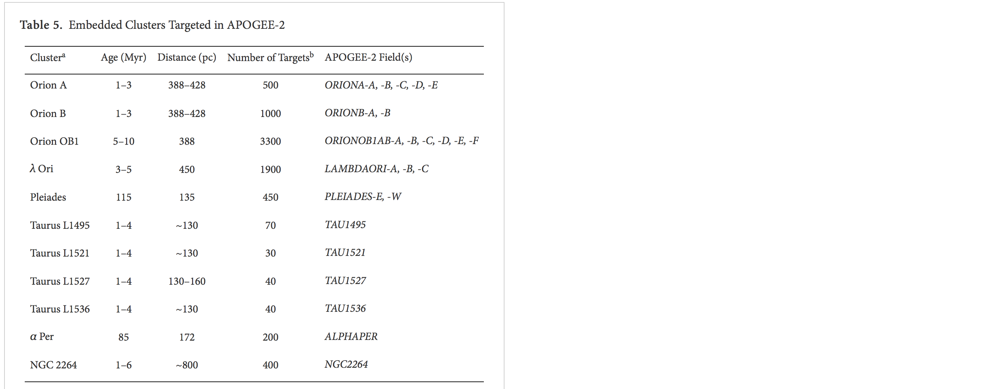

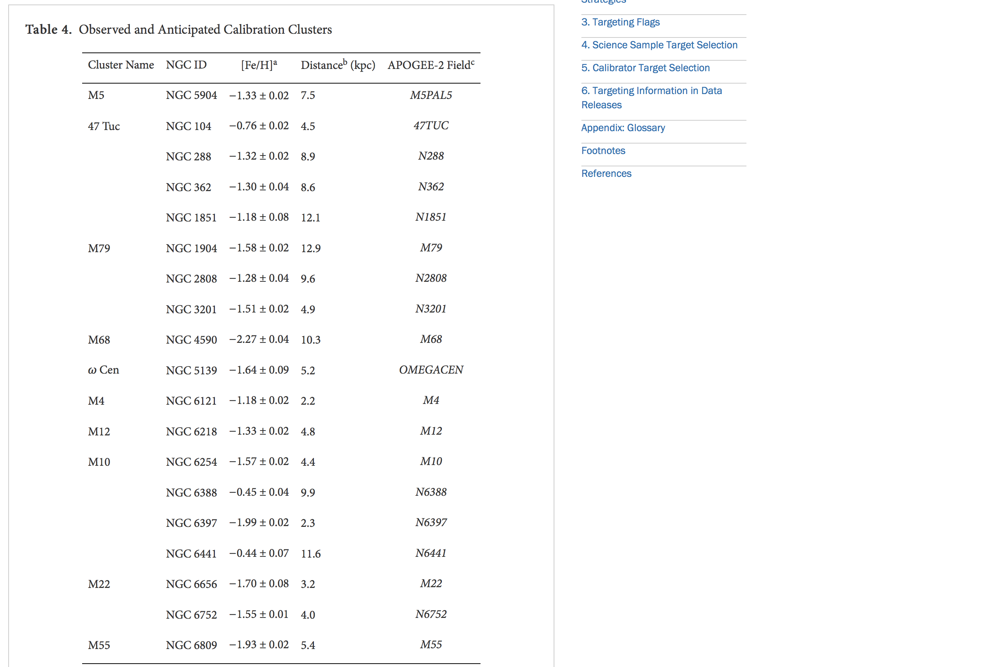

In [12]:
timer_start()

fields = df_Apogee['PROGRAMNAME']
unique_fields = np.unique(fields.astype(str))

items = [sorted(unique_fields.tolist())]

print("\n" + str(items))

timer_stop()


[['RomanLopes_18a', 'TeskeVanSaders_17b', 'TeskeVanSaders_18a', 'anc', 'apogee', 'apogee-marvels', 'beaton_18a', 'borissova_17a', 'bulge', 'cluster_gc', 'cluster_gc1', 'cluster_gc2', 'cluster_oc', 'clusters_gc1', 'clusters_gc2', 'clusters_gc3', 'cvz_btx', 'disk', 'disk1', 'disk2', 'geisler_18a', 'halo', 'halo_btx', 'halo_dsph', 'halo_stream', 'k2', 'k2_btx', 'kep_apokasc', 'kep_koi', 'kollmeier_17a', 'magclouds', 'manga', 'marvels', 'nan', 'odisk', 'rrlyr', 'schlaufman_17a', 'sgr', 'sgr_tidal', 'stutz_18a', 'substellar', 'teske_17a', 'weinberg2_17a', 'weinberg_17a', 'yso', 'zoccali_17a']]


0.46 seconds elapsed


In [13]:
print("Programs: " + str(unique_fields.shape[0]))

Programs: 46


In [14]:
timer_start()

df = pd.DataFrame({'Field':unique_fields})

col_stars             = []
col_main_sequence     = []
col_turnoff           = []
col_subgiants         = []
col_red_clump         = []
col_red_clump_binary  = []
col_red_giants        = []
col_red_giants_binary = []

col_red_giants_AL_FE  = []
col_red_giants_C_FE   = []
col_red_giants_CA_FE  = []
col_red_giants_CE_FE  = []
col_red_giants_CI_FE  = []
col_red_giants_CO_FE  = []
col_red_giants_CR_FE  = []
col_red_giants_CU_FE  = []
col_red_giants_K_FE   = []
col_red_giants_MN_FE  = []
col_red_giants_N_FE   = []
col_red_giants_NA_FE  = []
col_red_giants_NI_FE  = []
col_red_giants_O_FE   = []
col_red_giants_P_FE   = []
col_red_giants_S_FE   = []
col_red_giants_TI_FE  = []
col_red_giants_TIII_FE  = []
col_red_giants_V_FE   = []
col_red_giants_MG_FE  = []
col_red_giants_SI_FE  = []

col_red_giants_binary_AL_FE  = []
col_red_giants_binary_C_FE   = []
col_red_giants_binary_CA_FE  = []
col_red_giants_binary_CE_FE  = []
col_red_giants_binary_CI_FE  = []
col_red_giants_binary_CO_FE  = []
col_red_giants_binary_CR_FE  = []
col_red_giants_binary_CU_FE  = []
col_red_giants_binary_K_FE   = []
col_red_giants_binary_MN_FE  = []
col_red_giants_binary_N_FE   = []
col_red_giants_binary_NA_FE  = []
col_red_giants_binary_NI_FE  = []
col_red_giants_binary_O_FE   = []
col_red_giants_binary_P_FE   = []
col_red_giants_binary_S_FE   = []
col_red_giants_binary_TI_FE  = []
col_red_giants_binary_TIII_FE  = []
col_red_giants_binary_V_FE   = []
col_red_giants_binary_MG_FE  = []
col_red_giants_binary_SI_FE  = []

col_red_clump_AL_FE  = []
col_red_clump_C_FE   = []
col_red_clump_CA_FE  = []
col_red_clump_CE_FE  = []
col_red_clump_CI_FE  = []
col_red_clump_CO_FE  = []
col_red_clump_CR_FE  = []
col_red_clump_CU_FE  = []
col_red_clump_K_FE   = []
col_red_clump_MN_FE  = []
col_red_clump_N_FE   = []
col_red_clump_NA_FE  = []
col_red_clump_NI_FE  = []
col_red_clump_O_FE   = []
col_red_clump_P_FE   = []
col_red_clump_S_FE   = []
col_red_clump_TI_FE  = []
col_red_clump_TIII_FE  = []
col_red_clump_V_FE   = []
col_red_clump_MG_FE  = []
col_red_clump_SI_FE  = []

col_red_clump_binary_AL_FE  = []
col_red_clump_binary_C_FE   = []
col_red_clump_binary_CA_FE  = []
col_red_clump_binary_CE_FE  = []
col_red_clump_binary_CI_FE  = []
col_red_clump_binary_CO_FE  = []
col_red_clump_binary_CR_FE  = []
col_red_clump_binary_CU_FE  = []
col_red_clump_binary_K_FE   = []
col_red_clump_binary_MN_FE  = []
col_red_clump_binary_N_FE   = []
col_red_clump_binary_NA_FE  = []
col_red_clump_binary_NI_FE  = []
col_red_clump_binary_O_FE   = []
col_red_clump_binary_P_FE   = []
col_red_clump_binary_S_FE   = []
col_red_clump_binary_TI_FE  = []
col_red_clump_binary_TIII_FE  = []
col_red_clump_binary_V_FE   = []
col_red_clump_binary_MG_FE  = []
col_red_clump_binary_SI_FE  = []


for field in df["Field"]:
    f1 = df_Apogee[df_Apogee['PROGRAMNAME'] == field]
    
    main_sequence = f1[f1['LOGG'].astype(float) > 4.20]
    turnoff       = f1[(f1['LOGG'].astype(float) < 4.20) & (f1['LOGG'].astype(float) > 3.90)]
    subgiants     = f1[(f1['LOGG'].astype(float) < 3.90) & (f1['LOGG'].astype(float) > 3.60)]
    
    red_clump     = f1[(f1['LOGG'].astype(float) < 2.55) & (f1['LOGG'].astype(float) > 2.35)]
    red_clump_id  = red_clump.APOGEE_ID.astype(str)
    red_clump_scatter = red_clump[red_clump.VSCATTER > 1]
    red_clump_binary = red_clump_scatter[red_clump_scatter.VSCATTER > 5 * red_clump_scatter.VERR_MED]
    
    reds          = f1[f1['LOGG'].astype(float) < 3.60]
    red_giants    = reds[~reds['APOGEE_ID'].isin(red_clump_id)]
    red_giants_scatter = red_giants[red_giants.VSCATTER > 1]
    red_giants_binary = red_giants_scatter[red_giants_scatter.VSCATTER > 5 * red_giants_scatter.VERR_MED]
    
    col_stars.append(f1.shape[0])
    col_main_sequence.append(main_sequence.shape[0])
    col_turnoff.append(turnoff.shape[0])
    col_subgiants.append(subgiants.shape[0])
    col_red_clump.append(red_clump.shape[0])
    col_red_clump_binary.append(red_clump_binary.shape[0])
    col_red_giants.append(red_giants.shape[0])
    col_red_giants_binary.append(red_giants_binary.shape[0])
    
    print("\n" + str(field) + "\nstars: " + str(f1.shape[0]))
    
    print("main_sequence: " + str(main_sequence.shape[0]))
    print("turnoff: " + str(turnoff.shape[0]))
    print("subgiants: " + str(subgiants.shape[0]))
    print("red_clump: " + str(red_clump.shape[0]))
    print("red_clump_binary: " + str(red_clump_binary.shape[0]))
    print("red_giants: " + str(red_giants.shape[0]))
    print("red_giants_binary: " + str(red_giants_binary.shape[0]))
    
    red_giants_AL_FE  = red_giants[red_giants['AL_FE'].astype(float) > -9999]
    red_giants_C_FE   = red_giants[red_giants['C_FE'].astype(float) > -9999]
    red_giants_CA_FE  = red_giants[red_giants['CA_FE'].astype(float) > -9999]
    red_giants_CE_FE  = red_giants[red_giants['CE_FE'].astype(float) > -9999]
    red_giants_CI_FE  = red_giants[red_giants['CI_FE'].astype(float) > -9999]
    red_giants_CO_FE  = red_giants[red_giants['CO_FE'].astype(float) > -9999]
    red_giants_CR_FE  = red_giants[red_giants['CR_FE'].astype(float) > -9999]
    red_giants_CU_FE  = red_giants[red_giants['CU_FE'].astype(float) > -9999]
    red_giants_K_FE   = red_giants[red_giants['K_FE'].astype(float) > -9999]
    red_giants_MN_FE  = red_giants[red_giants['MN_FE'].astype(float) > -9999]
    red_giants_N_FE   = red_giants[red_giants['N_FE'].astype(float) > -9999]
    red_giants_NA_FE  = red_giants[red_giants['NA_FE'].astype(float) > -9999]
    red_giants_NI_FE  = red_giants[red_giants['NI_FE'].astype(float) > -9999]
    red_giants_O_FE   = red_giants[red_giants['O_FE'].astype(float) > -9999]
    red_giants_P_FE   = red_giants[red_giants['P_FE'].astype(float) > -9999]
    red_giants_S_FE   = red_giants[red_giants['S_FE'].astype(float) > -9999]
    red_giants_TI_FE  = red_giants[red_giants['TI_FE'].astype(float) > -9999]
    red_giants_TIII_FE  = red_giants[red_giants['TIII_FE'].astype(float) > -9999]
    red_giants_V_FE   = red_giants[red_giants['V_FE'].astype(float) > -9999]
    red_giants_MG_FE  = red_giants[red_giants['MG_FE'].astype(float) > -9999]
    red_giants_SI_FE  = red_giants[red_giants['SI_FE'].astype(float) > -9999]
    
    red_clump_AL_FE  = red_clump[red_clump['AL_FE'].astype(float) > -9999]
    red_clump_C_FE   = red_clump[red_clump['C_FE'].astype(float) > -9999]
    red_clump_CA_FE  = red_clump[red_clump['CA_FE'].astype(float) > -9999]
    red_clump_CE_FE  = red_clump[red_clump['CE_FE'].astype(float) > -9999]
    red_clump_CI_FE  = red_clump[red_clump['CI_FE'].astype(float) > -9999]
    red_clump_CO_FE  = red_clump[red_clump['CO_FE'].astype(float) > -9999]
    red_clump_CR_FE  = red_clump[red_clump['CR_FE'].astype(float) > -9999]
    red_clump_CU_FE  = red_clump[red_clump['CU_FE'].astype(float) > -9999]
    red_clump_K_FE   = red_clump[red_clump['K_FE'].astype(float) > -9999]
    red_clump_MN_FE  = red_clump[red_clump['MN_FE'].astype(float) > -9999]
    red_clump_N_FE   = red_clump[red_clump['N_FE'].astype(float) > -9999]
    red_clump_NA_FE  = red_clump[red_clump['NA_FE'].astype(float) > -9999]
    red_clump_NI_FE  = red_clump[red_clump['NI_FE'].astype(float) > -9999]
    red_clump_O_FE   = red_clump[red_clump['O_FE'].astype(float) > -9999]
    red_clump_P_FE   = red_clump[red_clump['P_FE'].astype(float) > -9999]
    red_clump_S_FE   = red_clump[red_clump['S_FE'].astype(float) > -9999]
    red_clump_TI_FE  = red_clump[red_clump['TI_FE'].astype(float) > -9999]
    red_clump_TIII_FE  = red_clump[red_clump['TIII_FE'].astype(float) > -9999]
    red_clump_V_FE   = red_clump[red_clump['V_FE'].astype(float) > -9999]
    red_clump_MG_FE  = red_clump[red_clump['MG_FE'].astype(float) > -9999]
    red_clump_SI_FE  = red_clump[red_clump['SI_FE'].astype(float) > -9999]
    
    col_red_giants_AL_FE.append(red_giants_AL_FE.shape[0])
    col_red_giants_C_FE.append(red_giants_C_FE.shape[0])
    col_red_giants_CA_FE.append(red_giants_CA_FE.shape[0])
    col_red_giants_CE_FE.append(red_giants_CE_FE.shape[0])
    col_red_giants_CI_FE.append(red_giants_CI_FE.shape[0])
    col_red_giants_CO_FE.append(red_giants_CO_FE.shape[0])
    col_red_giants_CR_FE.append(red_giants_CR_FE.shape[0])
    col_red_giants_CU_FE.append(red_giants_CU_FE.shape[0])
    col_red_giants_K_FE.append(red_giants_K_FE.shape[0])
    col_red_giants_MN_FE.append(red_giants_MN_FE.shape[0])
    col_red_giants_N_FE.append(red_giants_N_FE.shape[0])
    col_red_giants_NA_FE.append(red_giants_NA_FE.shape[0])
    col_red_giants_NI_FE.append(red_giants_NI_FE.shape[0])
    col_red_giants_O_FE.append(red_giants_O_FE.shape[0])
    col_red_giants_P_FE.append(red_giants_P_FE.shape[0])
    col_red_giants_S_FE.append(red_giants_S_FE.shape[0])
    col_red_giants_TI_FE.append(red_giants_TI_FE.shape[0])
    col_red_giants_TIII_FE.append(red_giants_TIII_FE.shape[0])
    col_red_giants_V_FE.append(red_giants_V_FE.shape[0])
    col_red_giants_MG_FE.append(red_giants_MG_FE.shape[0])
    col_red_giants_SI_FE.append(red_giants_SI_FE.shape[0])
    
    col_red_clump_AL_FE.append(red_clump_AL_FE.shape[0])
    col_red_clump_C_FE.append(red_clump_C_FE.shape[0])
    col_red_clump_CA_FE.append(red_clump_CA_FE.shape[0])
    col_red_clump_CE_FE.append(red_clump_CE_FE.shape[0])
    col_red_clump_CI_FE.append(red_clump_CI_FE.shape[0])
    col_red_clump_CO_FE.append(red_clump_CO_FE.shape[0])
    col_red_clump_CR_FE.append(red_clump_CR_FE.shape[0])
    col_red_clump_CU_FE.append(red_clump_CU_FE.shape[0])
    col_red_clump_K_FE.append(red_clump_K_FE.shape[0])
    col_red_clump_MN_FE.append(red_clump_MN_FE.shape[0])
    col_red_clump_N_FE.append(red_clump_N_FE.shape[0])
    col_red_clump_NA_FE.append(red_clump_NA_FE.shape[0])
    col_red_clump_NI_FE.append(red_clump_NI_FE.shape[0])
    col_red_clump_O_FE.append(red_clump_O_FE.shape[0])
    col_red_clump_P_FE.append(red_clump_P_FE.shape[0])
    col_red_clump_S_FE.append(red_clump_S_FE.shape[0])
    col_red_clump_TI_FE.append(red_clump_TI_FE.shape[0])
    col_red_clump_TIII_FE.append(red_clump_TIII_FE.shape[0])
    col_red_clump_V_FE.append(red_clump_V_FE.shape[0])
    col_red_clump_MG_FE.append(red_clump_MG_FE.shape[0])
    col_red_clump_SI_FE.append(red_clump_SI_FE.shape[0])
    
    
    red_giants_binary_AL_FE  = red_giants_binary[red_giants_binary['AL_FE'].astype(float) > -9999]
    red_giants_binary_C_FE   = red_giants_binary[red_giants_binary['C_FE'].astype(float) > -9999]
    red_giants_binary_CA_FE  = red_giants_binary[red_giants_binary['CA_FE'].astype(float) > -9999]
    red_giants_binary_CE_FE  = red_giants_binary[red_giants_binary['CE_FE'].astype(float) > -9999]
    red_giants_binary_CI_FE  = red_giants_binary[red_giants_binary['CI_FE'].astype(float) > -9999]
    red_giants_binary_CO_FE  = red_giants_binary[red_giants_binary['CO_FE'].astype(float) > -9999]
    red_giants_binary_CR_FE  = red_giants_binary[red_giants_binary['CR_FE'].astype(float) > -9999]
    red_giants_binary_CU_FE  = red_giants_binary[red_giants_binary['CU_FE'].astype(float) > -9999]
    red_giants_binary_K_FE   = red_giants_binary[red_giants_binary['K_FE'].astype(float) > -9999]
    red_giants_binary_MN_FE  = red_giants_binary[red_giants_binary['MN_FE'].astype(float) > -9999]
    red_giants_binary_N_FE   = red_giants_binary[red_giants_binary['N_FE'].astype(float) > -9999]
    red_giants_binary_NA_FE  = red_giants_binary[red_giants_binary['NA_FE'].astype(float) > -9999]
    red_giants_binary_NI_FE  = red_giants_binary[red_giants_binary['NI_FE'].astype(float) > -9999]
    red_giants_binary_O_FE   = red_giants_binary[red_giants_binary['O_FE'].astype(float) > -9999]
    red_giants_binary_P_FE   = red_giants_binary[red_giants_binary['P_FE'].astype(float) > -9999]
    red_giants_binary_S_FE   = red_giants_binary[red_giants_binary['S_FE'].astype(float) > -9999]
    red_giants_binary_TI_FE  = red_giants_binary[red_giants_binary['TI_FE'].astype(float) > -9999]
    red_giants_binary_TIII_FE = red_giants_binary[red_giants_binary['TIII_FE'].astype(float) > -9999]
    red_giants_binary_V_FE   = red_giants_binary[red_giants_binary['V_FE'].astype(float) > -9999]
    red_giants_binary_MG_FE  = red_giants_binary[red_giants_binary['MG_FE'].astype(float) > -9999]
    red_giants_binary_SI_FE  = red_giants_binary[red_giants_binary['SI_FE'].astype(float) > -9999]
    
    red_clump_binary_AL_FE  = red_clump_binary[red_clump_binary['AL_FE'].astype(float) > -9999]
    red_clump_binary_C_FE   = red_clump_binary[red_clump_binary['C_FE'].astype(float) > -9999]
    red_clump_binary_CA_FE  = red_clump_binary[red_clump_binary['CA_FE'].astype(float) > -9999]
    red_clump_binary_CE_FE  = red_clump_binary[red_clump_binary['CE_FE'].astype(float) > -9999]
    red_clump_binary_CI_FE  = red_clump_binary[red_clump_binary['CI_FE'].astype(float) > -9999]
    red_clump_binary_CO_FE  = red_clump_binary[red_clump_binary['CO_FE'].astype(float) > -9999]
    red_clump_binary_CR_FE  = red_clump_binary[red_clump_binary['CR_FE'].astype(float) > -9999]
    red_clump_binary_CU_FE  = red_clump_binary[red_clump_binary['CU_FE'].astype(float) > -9999]
    red_clump_binary_K_FE   = red_clump_binary[red_clump_binary['K_FE'].astype(float) > -9999]
    red_clump_binary_MN_FE  = red_clump_binary[red_clump_binary['MN_FE'].astype(float) > -9999]
    red_clump_binary_N_FE   = red_clump_binary[red_clump_binary['N_FE'].astype(float) > -9999]
    red_clump_binary_NA_FE  = red_clump_binary[red_clump_binary['NA_FE'].astype(float) > -9999]
    red_clump_binary_NI_FE  = red_clump_binary[red_clump_binary['NI_FE'].astype(float) > -9999]
    red_clump_binary_O_FE   = red_clump_binary[red_clump_binary['O_FE'].astype(float) > -9999]
    red_clump_binary_P_FE   = red_clump_binary[red_clump_binary['P_FE'].astype(float) > -9999]
    red_clump_binary_S_FE   = red_clump_binary[red_clump_binary['S_FE'].astype(float) > -9999]
    red_clump_binary_TI_FE  = red_clump_binary[red_clump_binary['TI_FE'].astype(float) > -9999]
    red_clump_binary_TIII_FE = red_clump_binary[red_clump_binary['TIII_FE'].astype(float) > -9999]
    red_clump_binary_V_FE   = red_clump_binary[red_clump_binary['V_FE'].astype(float) > -9999]
    red_clump_binary_MG_FE  = red_clump_binary[red_clump_binary['MG_FE'].astype(float) > -9999]
    red_clump_binary_SI_FE  = red_clump_binary[red_clump_binary['SI_FE'].astype(float) > -9999]
    
    col_red_giants_binary_AL_FE.append(red_giants_binary_AL_FE.shape[0])
    col_red_giants_binary_C_FE.append(red_giants_binary_C_FE.shape[0])
    col_red_giants_binary_CA_FE.append(red_giants_binary_CA_FE.shape[0])
    col_red_giants_binary_CE_FE.append(red_giants_binary_CE_FE.shape[0])
    col_red_giants_binary_CI_FE.append(red_giants_binary_CI_FE.shape[0])
    col_red_giants_binary_CO_FE.append(red_giants_binary_CO_FE.shape[0])
    col_red_giants_binary_CR_FE.append(red_giants_binary_CR_FE.shape[0])
    col_red_giants_binary_CU_FE.append(red_giants_binary_CU_FE.shape[0])
    col_red_giants_binary_K_FE.append(red_giants_binary_K_FE.shape[0])
    col_red_giants_binary_MN_FE.append(red_giants_binary_MN_FE.shape[0])
    col_red_giants_binary_N_FE.append(red_giants_binary_N_FE.shape[0])
    col_red_giants_binary_NA_FE.append(red_giants_binary_NA_FE.shape[0])
    col_red_giants_binary_NI_FE.append(red_giants_binary_NI_FE.shape[0])
    col_red_giants_binary_O_FE.append(red_giants_binary_O_FE.shape[0])
    col_red_giants_binary_P_FE.append(red_giants_binary_P_FE.shape[0])
    col_red_giants_binary_S_FE.append(red_giants_binary_S_FE.shape[0])
    col_red_giants_binary_TI_FE.append(red_giants_binary_TI_FE.shape[0])
    col_red_giants_binary_TIII_FE.append(red_giants_binary_TIII_FE.shape[0])
    col_red_giants_binary_V_FE.append(red_giants_binary_V_FE.shape[0])
    col_red_giants_binary_MG_FE.append(red_giants_binary_MG_FE.shape[0])
    col_red_giants_binary_SI_FE.append(red_giants_binary_SI_FE.shape[0])
    
    col_red_clump_binary_AL_FE.append(red_clump_binary_AL_FE.shape[0])
    col_red_clump_binary_C_FE.append(red_clump_binary_C_FE.shape[0])
    col_red_clump_binary_CA_FE.append(red_clump_binary_CA_FE.shape[0])
    col_red_clump_binary_CE_FE.append(red_clump_binary_CE_FE.shape[0])
    col_red_clump_binary_CI_FE.append(red_clump_binary_CI_FE.shape[0])
    col_red_clump_binary_CO_FE.append(red_clump_binary_CO_FE.shape[0])
    col_red_clump_binary_CR_FE.append(red_clump_binary_CR_FE.shape[0])
    col_red_clump_binary_CU_FE.append(red_clump_binary_CU_FE.shape[0])
    col_red_clump_binary_K_FE.append(red_clump_binary_K_FE.shape[0])
    col_red_clump_binary_MN_FE.append(red_clump_binary_MN_FE.shape[0])
    col_red_clump_binary_N_FE.append(red_clump_binary_N_FE.shape[0])
    col_red_clump_binary_NA_FE.append(red_clump_binary_NA_FE.shape[0])
    col_red_clump_binary_NI_FE.append(red_clump_binary_NI_FE.shape[0])
    col_red_clump_binary_O_FE.append(red_clump_binary_O_FE.shape[0])
    col_red_clump_binary_P_FE.append(red_clump_binary_P_FE.shape[0])
    col_red_clump_binary_S_FE.append(red_clump_binary_S_FE.shape[0])
    col_red_clump_binary_TI_FE.append(red_clump_binary_TI_FE.shape[0])
    col_red_clump_binary_TIII_FE.append(red_clump_binary_TIII_FE.shape[0])
    col_red_clump_binary_V_FE.append(red_clump_binary_V_FE.shape[0])
    col_red_clump_binary_MG_FE.append(red_clump_binary_MG_FE.shape[0])
    col_red_clump_binary_SI_FE.append(red_clump_binary_SI_FE.shape[0])
    
df["stars"]             = col_stars
df["main_sequence"]     = col_main_sequence
df["turnoff"]           = col_turnoff
df["subgiants"]         = col_subgiants
df["red_clump"]         = col_red_clump
df["red_clump_binary"]  = col_red_clump_binary
df["red_giants"]        = col_red_giants
df["red_giants_binary"] = col_red_giants_binary
                                
df["red_giants_AL_FE"]  = col_red_giants_AL_FE
df["red_giants_C_FE"]   = col_red_giants_C_FE
df["red_giants_CA_FE"]  = col_red_giants_CA_FE
df["red_giants_CE_FE"]  = col_red_giants_CE_FE
df["red_giants_CI_FE"]  = col_red_giants_CI_FE
df["red_giants_CO_FE"]  = col_red_giants_CO_FE
df["red_giants_CR_FE"]  = col_red_giants_CR_FE
df["red_giants_CU_FE"]  = col_red_giants_CU_FE
df["red_giants_K_FE"]   = col_red_giants_K_FE
df["red_giants_MN_FE"]  = col_red_giants_MN_FE
df["red_giants_N_FE"]   = col_red_giants_N_FE
df["red_giants_NA_FE"]  = col_red_giants_NA_FE
df["red_giants_NI_FE"]  = col_red_giants_NI_FE
df["red_giants_O_FE"]   = col_red_giants_O_FE
df["red_giants_P_FE"]   = col_red_giants_P_FE
df["red_giants_S_FE"]   = col_red_giants_S_FE
df["red_giants_TI_FE"]  = col_red_giants_TI_FE
df["red_giants_TIII_FE"]  = col_red_giants_TIII_FE
df["red_giants_V_FE"]   = col_red_giants_V_FE
df["red_giants_MG_FE"]  = col_red_giants_MG_FE
df["red_giants_SI_FE"]  = col_red_giants_SI_FE

df["red_giants_binary_AL_FE"]  = col_red_giants_binary_AL_FE
df["red_giants_binary_C_FE"]   = col_red_giants_binary_C_FE
df["red_giants_binary_CA_FE"]  = col_red_giants_binary_CA_FE
df["red_giants_binary_CE_FE"]  = col_red_giants_binary_CE_FE
df["red_giants_binary_CI_FE"]  = col_red_giants_binary_CI_FE
df["red_giants_binary_CO_FE"]  = col_red_giants_binary_CO_FE
df["red_giants_binary_CR_FE"]  = col_red_giants_binary_CR_FE
df["red_giants_binary_CU_FE"]  = col_red_giants_binary_CU_FE
df["red_giants_binary_K_FE"]   = col_red_giants_binary_K_FE
df["red_giants_binary_MN_FE"]  = col_red_giants_binary_MN_FE
df["red_giants_binary_N_FE"]   = col_red_giants_binary_N_FE
df["red_giants_binary_NA_FE"]  = col_red_giants_binary_NA_FE
df["red_giants_binary_NI_FE"]  = col_red_giants_binary_NI_FE
df["red_giants_binary_O_FE"]   = col_red_giants_binary_O_FE
df["red_giants_binary_P_FE"]   = col_red_giants_binary_P_FE
df["red_giants_binary_S_FE"]   = col_red_giants_binary_S_FE
df["red_giants_binary_TI_FE"]  = col_red_giants_binary_TI_FE
df["red_giants_binary_TIII_FE"]  = col_red_giants_binary_TIII_FE
df["red_giants_binary_V_FE"]   = col_red_giants_binary_V_FE
df["red_giants_binary_MG_FE"]  = col_red_giants_binary_MG_FE
df["red_giants_binary_SI_FE"]  = col_red_giants_binary_SI_FE

df["red_clump_AL_FE"]  = col_red_giants_AL_FE
df["red_clump_C_FE"]   = col_red_giants_C_FE
df["red_clump_CA_FE"]  = col_red_giants_CA_FE
df["red_clump_CE_FE"]  = col_red_giants_CE_FE
df["red_clump_CI_FE"]  = col_red_giants_CI_FE
df["red_clump_CO_FE"]  = col_red_giants_CO_FE
df["red_clump_CR_FE"]  = col_red_giants_CR_FE
df["red_clump_CU_FE"]  = col_red_giants_CU_FE
df["red_clump_K_FE"]   = col_red_giants_K_FE
df["red_clump_MN_FE"]  = col_red_giants_MN_FE
df["red_clump_N_FE"]   = col_red_giants_N_FE
df["red_clump_NA_FE"]  = col_red_giants_NA_FE
df["red_clump_NI_FE"]  = col_red_giants_NI_FE
df["red_clump_O_FE"]   = col_red_giants_O_FE
df["red_clump_P_FE"]   = col_red_giants_P_FE
df["red_clump_S_FE"]   = col_red_giants_S_FE
df["red_clump_TI_FE"]  = col_red_giants_TI_FE
df["red_clump_TIII_FE"]  = col_red_giants_TIII_FE
df["red_clump_V_FE"]   = col_red_giants_V_FE
df["red_clump_MG_FE"]  = col_red_giants_MG_FE
df["red_clump_SI_FE"]  = col_red_giants_SI_FE

df["red_clump_binary_AL_FE"]  = col_red_giants_binary_AL_FE
df["red_clump_binary_C_FE"]   = col_red_giants_binary_C_FE
df["red_clump_binary_CA_FE"]  = col_red_giants_binary_CA_FE
df["red_clump_binary_CE_FE"]  = col_red_giants_binary_CE_FE
df["red_clump_binary_CI_FE"]  = col_red_giants_binary_CI_FE
df["red_clump_binary_CO_FE"]  = col_red_giants_binary_CO_FE
df["red_clump_binary_CR_FE"]  = col_red_giants_binary_CR_FE
df["red_clump_binary_CU_FE"]  = col_red_giants_binary_CU_FE
df["red_clump_binary_K_FE"]   = col_red_giants_binary_K_FE
df["red_clump_binary_MN_FE"]  = col_red_giants_binary_MN_FE
df["red_clump_binary_N_FE"]   = col_red_giants_binary_N_FE
df["red_clump_binary_NA_FE"]  = col_red_giants_binary_NA_FE
df["red_clump_binary_NI_FE"]  = col_red_giants_binary_NI_FE
df["red_clump_binary_O_FE"]   = col_red_giants_binary_O_FE
df["red_clump_binary_P_FE"]   = col_red_giants_binary_P_FE
df["red_clump_binary_S_FE"]   = col_red_giants_binary_S_FE
df["red_clump_binary_TI_FE"]  = col_red_giants_binary_TI_FE
df["red_clump_binary_TIII_FE"]  = col_red_giants_binary_TIII_FE
df["red_clump_binary_V_FE"]   = col_red_giants_binary_V_FE
df["red_clump_binary_MG_FE"]  = col_red_giants_binary_MG_FE
df["red_clump_binary_SI_FE"]  = col_red_giants_binary_SI_FE

print("Data load complete!")

timer_stop()


RomanLopes_18a
stars: 792
main_sequence: 75
turnoff: 23
subgiants: 8
red_clump: 14
red_clump_binary: 0
red_giants: 672
red_giants_binary: 49

TeskeVanSaders_17b
stars: 6053
main_sequence: 3193
turnoff: 660
subgiants: 184
red_clump: 414
red_clump_binary: 2
red_giants: 1599
red_giants_binary: 26

TeskeVanSaders_18a
stars: 8172
main_sequence: 2707
turnoff: 956
subgiants: 323
red_clump: 983
red_clump_binary: 2
red_giants: 3202
red_giants_binary: 17

anc
stars: 5513
main_sequence: 1639
turnoff: 320
subgiants: 125
red_clump: 390
red_clump_binary: 3
red_giants: 3034
red_giants_binary: 662

apogee
stars: 133965
main_sequence: 22683
turnoff: 3900
subgiants: 2319
red_clump: 23788
red_clump_binary: 477
red_giants: 81239
red_giants_binary: 5562

apogee-marvels
stars: 9644
main_sequence: 1679
turnoff: 282
subgiants: 174
red_clump: 2146
red_clump_binary: 56
red_giants: 5363
red_giants_binary: 364

beaton_18a
stars: 1586
main_sequence: 246
turnoff: 117
subgiants: 31
red_clump: 50
red_clump_binary: 0

In [15]:
df.head()

,Field,stars,main_sequence,turnoff,subgiants,red_clump,red_clump_binary,red_giants,red_giants_binary,red_giants_AL_FE,...,red_clump_binary_NA_FE,red_clump_binary_NI_FE,red_clump_binary_O_FE,red_clump_binary_P_FE,red_clump_binary_S_FE,red_clump_binary_TI_FE,red_clump_binary_TIII_FE,red_clump_binary_V_FE,red_clump_binary_MG_FE,red_clump_binary_SI_FE
0,RomanLopes_18a,792,75,23,8,14,0,672,49,64,...,0,0,0,0,0,0,0,0,0,0
1,TeskeVanSaders_17b,6053,3193,660,184,414,2,1599,26,1007,...,9,11,9,8,11,8,9,5,11,11
2,TeskeVanSaders_18a,8172,2707,956,323,983,2,3202,17,2549,...,7,9,8,8,8,9,7,6,9,9
3,anc,5513,1639,320,125,390,3,3034,662,1572,...,28,35,23,26,33,24,27,17,35,35
4,apogee,133965,22683,3900,2319,23788,477,81239,5562,64199,...,2418,2778,2367,2613,2718,2142,2211,1733,2781,2783


In [16]:
df_sorted = df.sort_values(by=['red_giants'], ascending=False)

In [17]:
df_sorted.head(25)

,Field,stars,main_sequence,turnoff,subgiants,red_clump,red_clump_binary,red_giants,red_giants_binary,red_giants_AL_FE,...,red_clump_binary_NA_FE,red_clump_binary_NI_FE,red_clump_binary_O_FE,red_clump_binary_P_FE,red_clump_binary_S_FE,red_clump_binary_TI_FE,red_clump_binary_TIII_FE,red_clump_binary_V_FE,red_clump_binary_MG_FE,red_clump_binary_SI_FE
4,apogee,133965,22683,3900,2319,23788,477,81239,5562,64199,...,2418,2778,2367,2613,2718,2142,2211,1733,2781,2783
19,disk2,39511,2604,404,357,7951,185,28195,2172,26152,...,1133,1299,1184,1268,1286,762,911,1014,1299,1299
31,manga,97497,43909,13499,4285,8810,27,26457,810,22740,...,320,364,302,315,354,320,306,194,368,369
8,bulge,19719,626,141,120,2823,48,16009,487,13385,...,228,277,265,260,266,159,194,238,277,277
17,disk,18640,1530,202,237,3794,82,12877,783,11990,...,421,483,444,478,479,274,335,375,483,483
29,kollmeier_17a,10171,239,66,35,128,2,9698,651,2251,...,19,50,46,44,47,4,6,44,50,51
18,disk1,9059,614,80,103,1945,34,6317,345,5908,...,200,223,192,218,221,153,178,160,223,223
30,magclouds,7431,817,226,96,85,5,6207,859,4287,...,237,409,405,374,347,57,85,358,410,410
27,kep_apokasc,12614,2323,1363,669,2500,11,5759,265,5111,...,65,82,61,74,79,55,60,45,82,82
5,apogee-marvels,9644,1679,282,174,2146,56,5363,364,5027,...,252,284,232,268,276,224,227,174,284,284


In [25]:
field_list = df_sorted['Field'][12:13]
#print(field_list.shape[0])
print(field_list)

44    yso
Name: Field, dtype: object


In [44]:
for field in field_list:
        f1 = df_Apogee[df_Apogee['PROGRAMNAME'] == field]

        print('\n' + str(field))

        main_sequence = f1[f1['LOGG'].astype(float) > 4.20]
        turnoff       = f1[(f1['LOGG'].astype(float) < 4.20) & (f1['LOGG'].astype(float) > 3.90)]
        subgiants     = f1[(f1['LOGG'].astype(float) < 3.90) & (f1['LOGG'].astype(float) > 3.60)]

        red_clump     = f1[(f1['LOGG'].astype(float) < 2.55) & (f1['LOGG'].astype(float) > 2.35)]
        red_clump_id  = red_clump.APOGEE_ID.astype(str)
        red_clump_scatter = red_clump[red_clump.VSCATTER > 1]
        red_clump_binary = red_clump_scatter[red_clump_scatter.VSCATTER > 5 * red_clump_scatter.VERR_MED]

        reds          = f1[f1['LOGG'].astype(float) < 3.60]
        red_giants    = reds[~reds['APOGEE_ID'].isin(red_clump_id)]
        red_giants_scatter = red_giants[red_giants.VSCATTER > 1]
        red_giants_binary = red_giants_scatter[red_giants_scatter.VSCATTER > 5 * red_giants_scatter.VERR_MED]

        print("\nStars: " + str(f1.shape[0]))
        print("\nmain_sequence: " + str(main_sequence.shape[0]))
        print("turnoff: " + str(turnoff.shape[0]))
        print("subgiants: " + str(subgiants.shape[0]))
        print("red_clump: " + str(red_clump.shape[0]))
        print("red_clump_binary: " + str(red_clump_binary.shape[0]))
        print("red_giants: " + str(red_giants.shape[0]))
        print("red_giants_binary: " + str(red_giants_binary.shape[0]))

        df_class_O = f1[(f1['SpT2'] >= "O0V") & (f1['SpT2'] <= "O9V")]
        df_class_B = f1[(f1['SpT2'] >= "B0V") & (f1['SpT2'] <= "B9V")]
        df_class_A = f1[(f1['SpT2'] >= "A0V") & (f1['SpT2'] <= "A9V")]
        df_class_F = f1[(f1['SpT2'] >= "F0V") & (f1['SpT2'] <= "F9V")]
        df_class_G = f1[(f1['SpT2'] >= "G0V") & (f1['SpT2'] <= "G9V")]
        df_class_K = f1[(f1['SpT2'] >= "K0V") & (f1['SpT2'] <= "K9V")]
        df_class_M = f1[(f1['SpT2'] >= "M0V") & (f1['SpT2'] <= "M9V")]
        df_class_L = f1[(f1['SpT2'] >= "L0V") & (f1['SpT2'] <= "L9V")]
        df_class_T = f1[(f1['SpT2'] >= "T0V") & (f1['SpT2'] <= "T9V")]

        print("\nClass O: " + str(df_class_O.shape[0]))
        print("Class B: " + str(df_class_B.shape[0]))
        print("Class A: " + str(df_class_A.shape[0]))
        print("Class F: " + str(df_class_F.shape[0]))
        print("Class G: " + str(df_class_G.shape[0]))
        print("Class K: " + str(df_class_K.shape[0]))
        print("Class M: " + str(df_class_M.shape[0]))
        print("Class L: " + str(df_class_L.shape[0]))
        print("Class T: " + str(df_class_T.shape[0]))

        sns.set()

        r1 = f1

        df_BA = f1[f1['ASPCAP_CLASS'].isin(['BA'])]
        df_Fd = f1[f1['ASPCAP_CLASS'].isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]
        df_GKd = f1[f1['ASPCAP_CLASS'].isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]
        df_GKg = f1[f1['ASPCAP_CLASS'].isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]
        df_Md = f1[f1['ASPCAP_CLASS'].isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]
        df_Mg = f1[f1['ASPCAP_CLASS'].isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]

        print("\nBA: " + str(df_BA.shape[0]))
        print("Fd: " + str(df_Fd.shape[0]))
        print("GKd: " + str(df_GKd.shape[0]))
        print("GKg: " + str(df_GKg.shape[0]))
        print("Md: " + str(df_Md.shape[0]))
        print("Mg: " + str(df_Mg.shape[0]))


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227
Class L: 1
Class T: 0

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458



yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


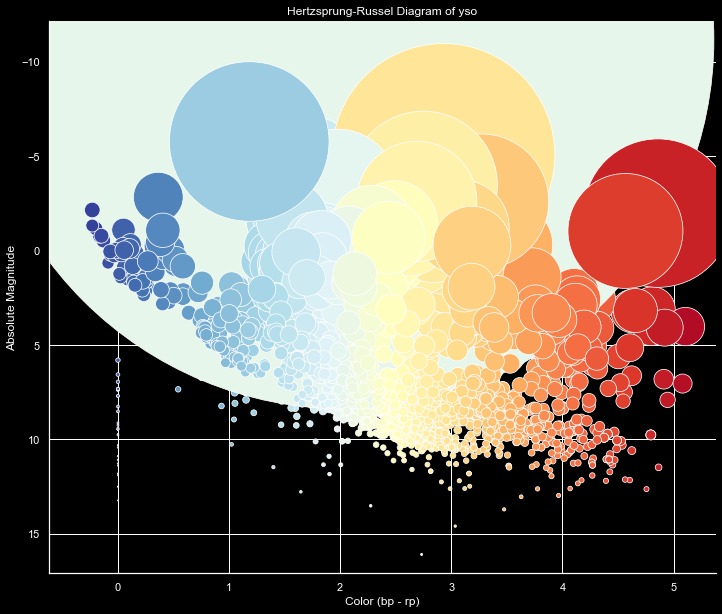

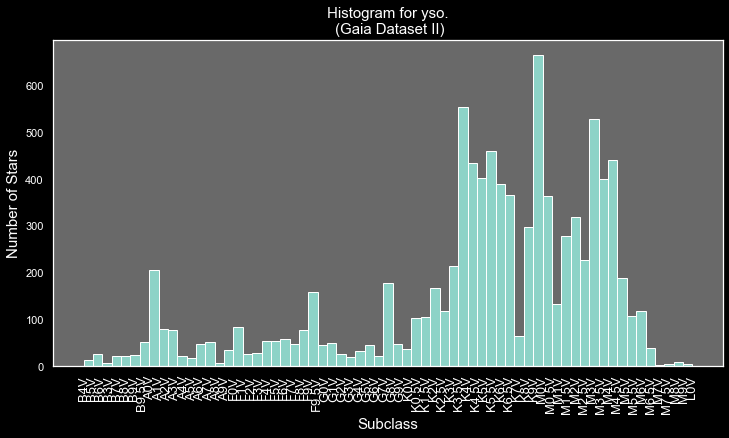

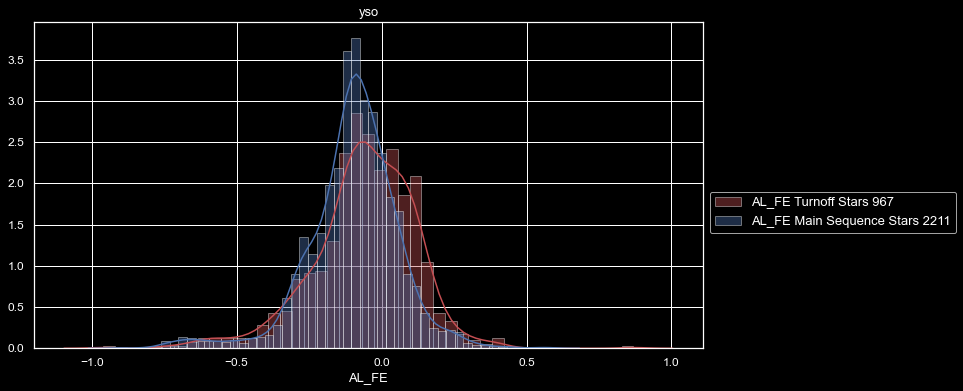


Turnoff AL_FE
count    967.000000
mean      -0.060347
std        0.179406
min       -0.959601
25%       -0.145176
50%       -0.049790
75%        0.056919
max        0.868458
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


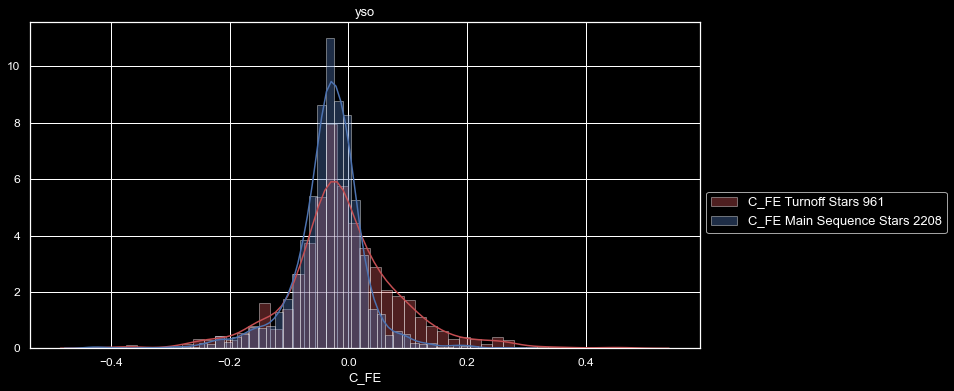


Turnoff C_FE
count    961.000000
mean      -0.009153
std        0.096891
min       -0.411326
25%       -0.056267
50%       -0.018314
75%        0.036080
max        0.466184
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


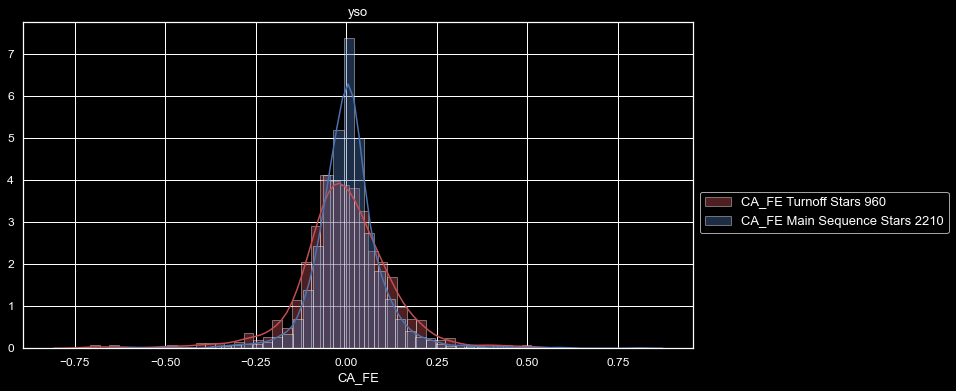


Turnoff CA_FE
count    960.000000
mean      -0.005448
std        0.132172
min       -0.707462
25%       -0.068793
50%       -0.008694
75%        0.062157
max        0.537768
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


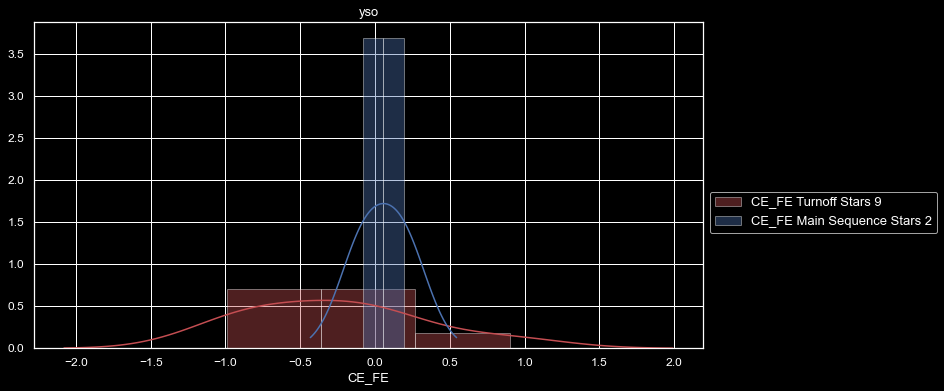


Turnoff CE_FE
count    9.000000
mean    -0.259302
std      0.598682
min     -0.988625
25%     -0.775775
50%     -0.227365
75%     -0.056455
max      0.899485
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


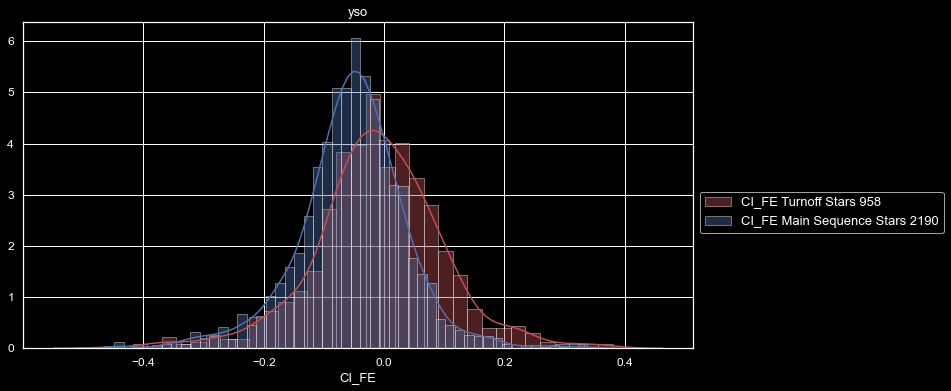


Turnoff CI_FE
count    958.000000
mean      -0.010131
std        0.109090
min       -0.465988
25%       -0.068363
50%       -0.011362
75%        0.051683
max        0.380040
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


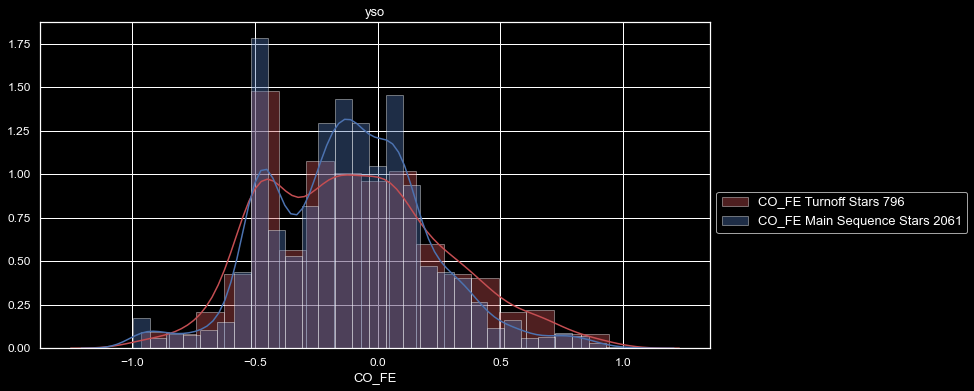


Turnoff CO_FE
count    796.000000
mean      -0.126878
std        0.413027
min       -2.103379
25%       -0.439034
50%       -0.136761
75%        0.110273
max        1.038794
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


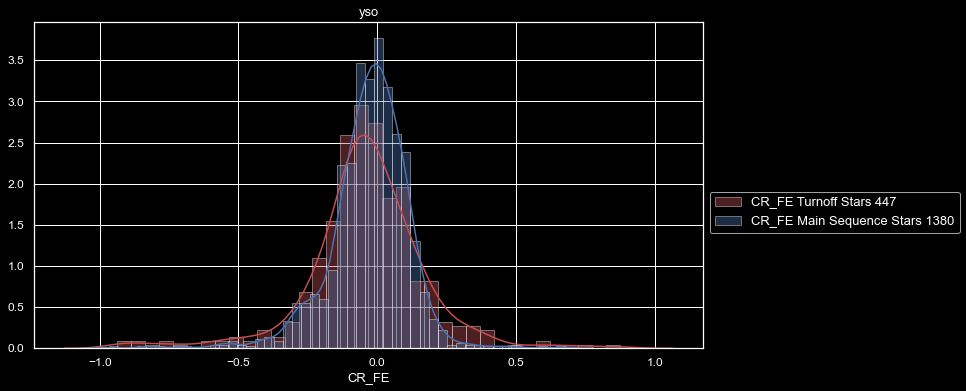


Turnoff CR_FE
count    447.000000
mean      -0.074816
std        0.308654
min       -2.261637
25%       -0.136343
50%       -0.042993
75%        0.065132
max        0.873623
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


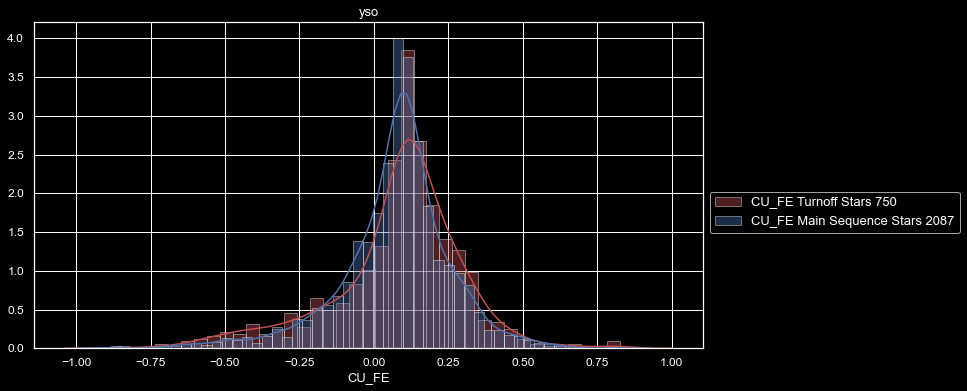


Turnoff CU_FE
count    750.000000
mean       0.076219
std        0.225467
min       -1.100494
25%        0.000556
50%        0.110637
75%        0.202266
max        0.826883
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


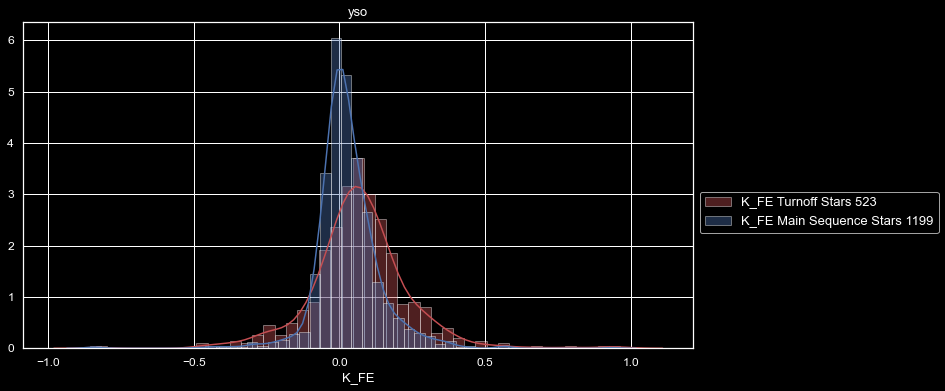


Turnoff K_FE
count    523.000000
mean       0.058092
std        0.223228
min       -2.033995
25%       -0.009563
50%        0.062281
75%        0.148948
max        0.965214
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


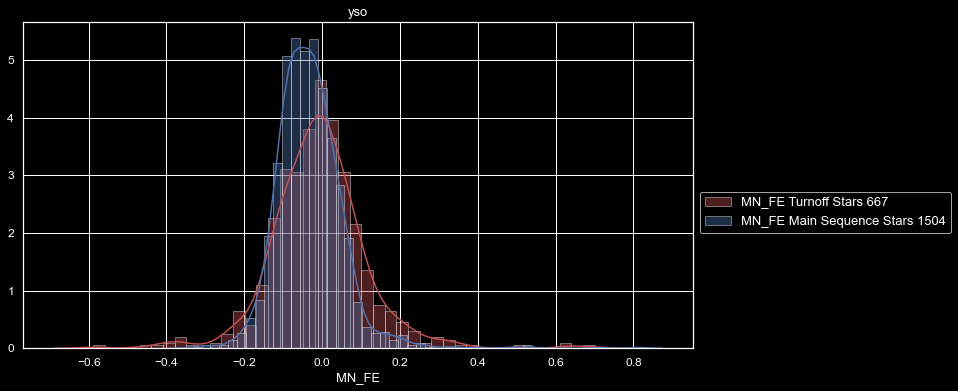


Turnoff MN_FE
count    667.000000
mean      -0.012627
std        0.144508
min       -1.514566
25%       -0.079151
50%       -0.010361
75%        0.053324
max        0.700834
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


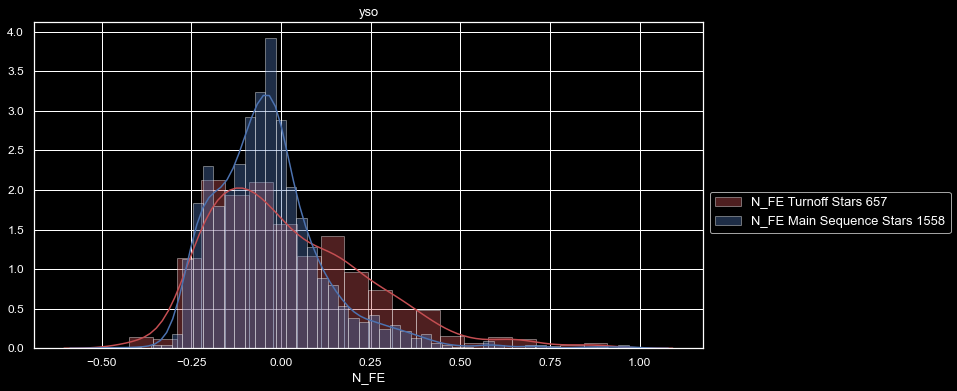


Turnoff N_FE
count    657.000000
mean       0.022299
std        0.222476
min       -0.423127
25%       -0.146047
50%       -0.029429
75%        0.156393
max        0.910263
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


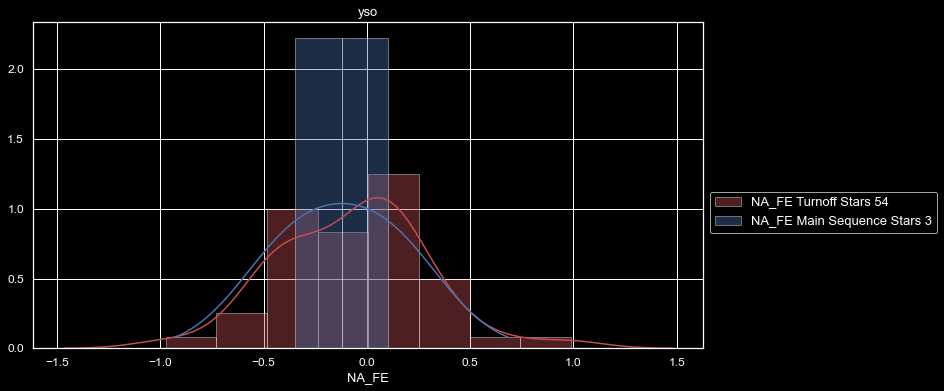


Turnoff NA_FE
count    54.000000
mean     -0.156821
std       0.555141
min      -1.791434
25%      -0.411716
50%      -0.065509
75%       0.106248
max       1.191596
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


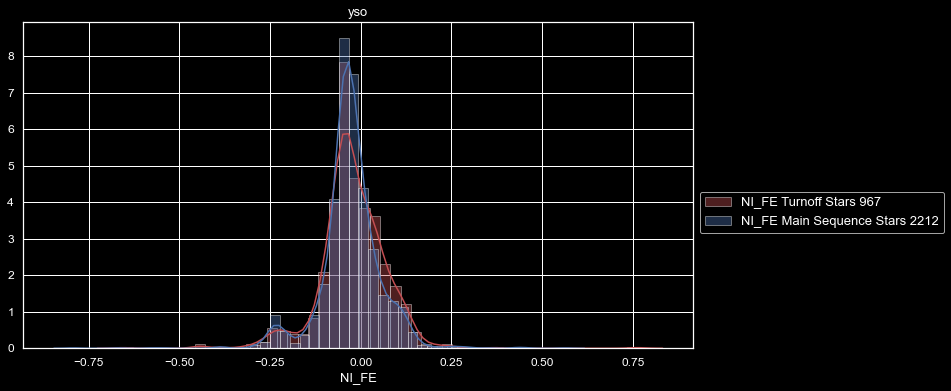


Turnoff NI_FE
count    967.000000
mean      -0.022485
std        0.093398
min       -0.655070
25%       -0.063872
50%       -0.028520
75%        0.029152
max        0.761210
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


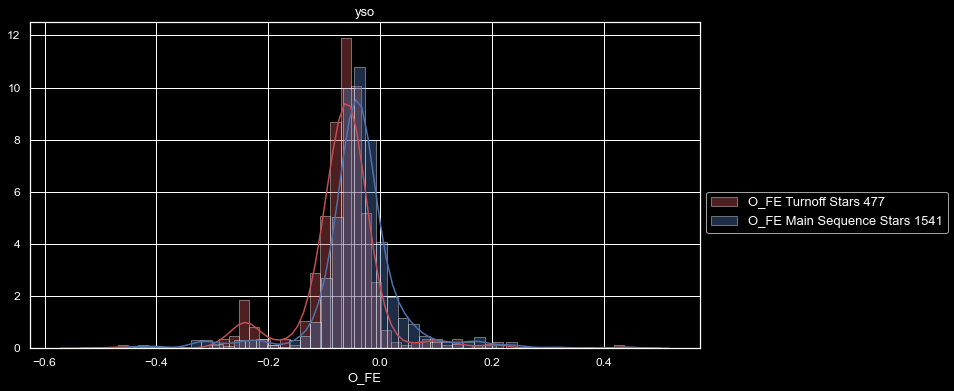


Turnoff O_FE
count    477.000000
mean      -0.069594
std        0.075564
min       -0.469400
25%       -0.087787
50%       -0.061663
75%       -0.041355
max        0.436975
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


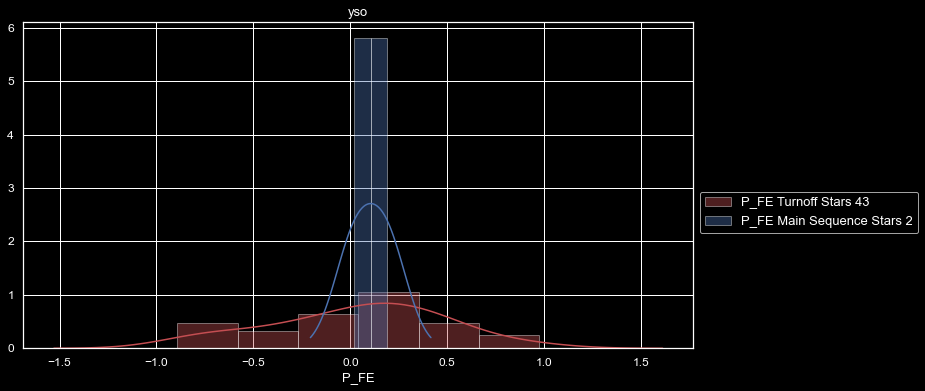


Turnoff P_FE
count    43.000000
mean     -0.065515
std       0.569967
min      -1.647013
25%      -0.369968
50%       0.061567
75%       0.319728
max       0.972857
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


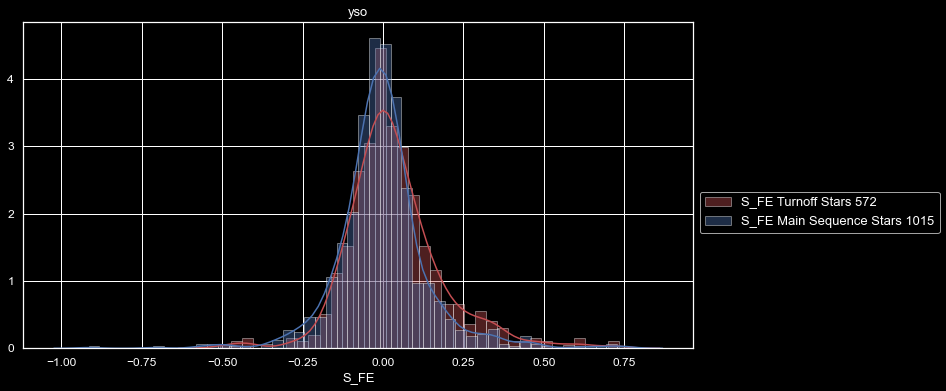


Turnoff S_FE
count    572.000000
mean       0.035718
std        0.152007
min       -0.507394
25%       -0.046810
50%        0.013249
75%        0.098046
max        0.732842
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


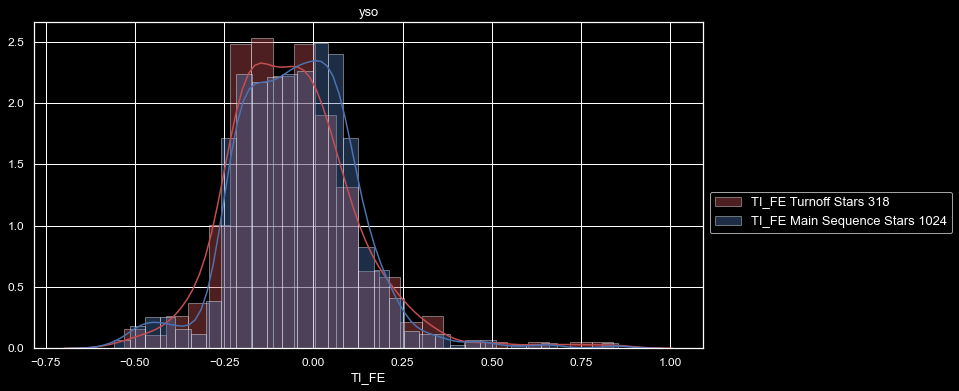


Turnoff TI_FE
count    318.000000
mean      -0.058730
std        0.177513
min       -0.530929
25%       -0.176392
50%       -0.069564
75%        0.030609
max        0.839373
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


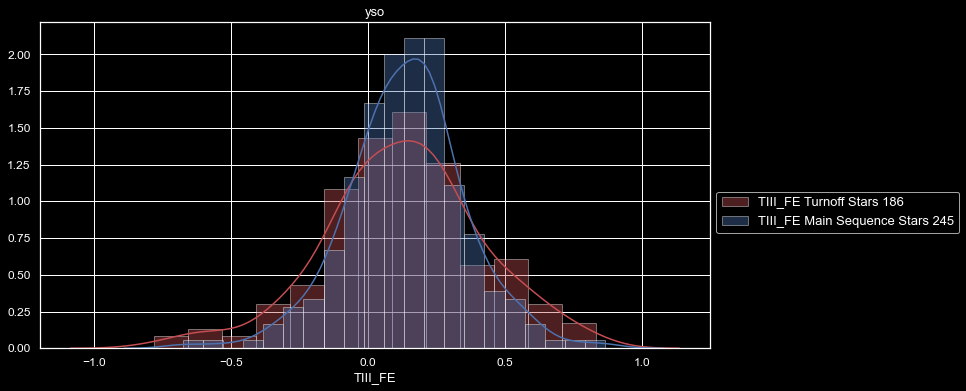


Turnoff TIII_FE
count    186.000000
mean       0.125650
std        0.290125
min       -0.779955
25%       -0.055157
50%        0.145879
75%        0.305754
max        0.830563
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


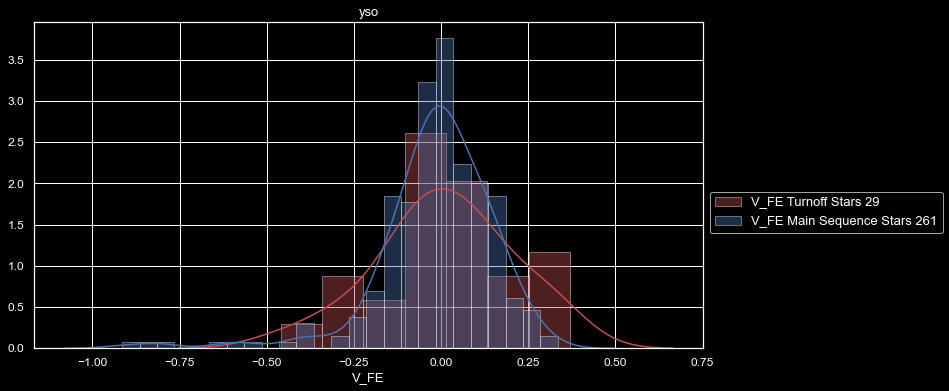


Turnoff V_FE
count    29.000000
mean      0.009063
std       0.196070
min      -0.460540
25%      -0.089540
50%       0.007590
75%       0.108990
max       0.369606
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


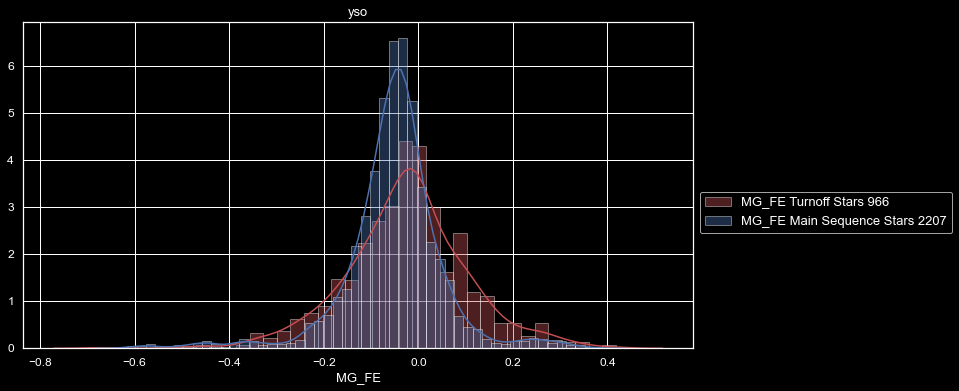


Turnoff MG_FE
count    966.000000
mean      -0.024793
std        0.130317
min       -0.671929
25%       -0.096188
50%       -0.021896
75%        0.046653
max        0.417859
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


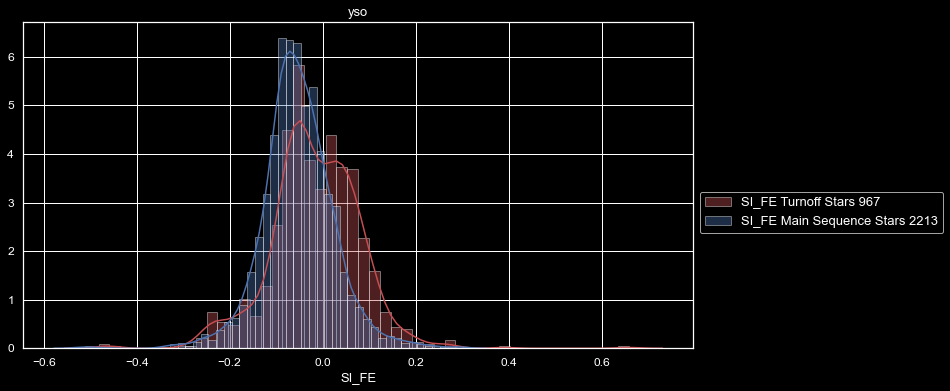


Turnoff SI_FE
count    967.000000
mean      -0.017079
std        0.096786
min       -0.482099
25%       -0.069559
50%       -0.019969
75%        0.046551
max        0.658071
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [27]:
Detail_View(field_list, turnoff, "Turnoff", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


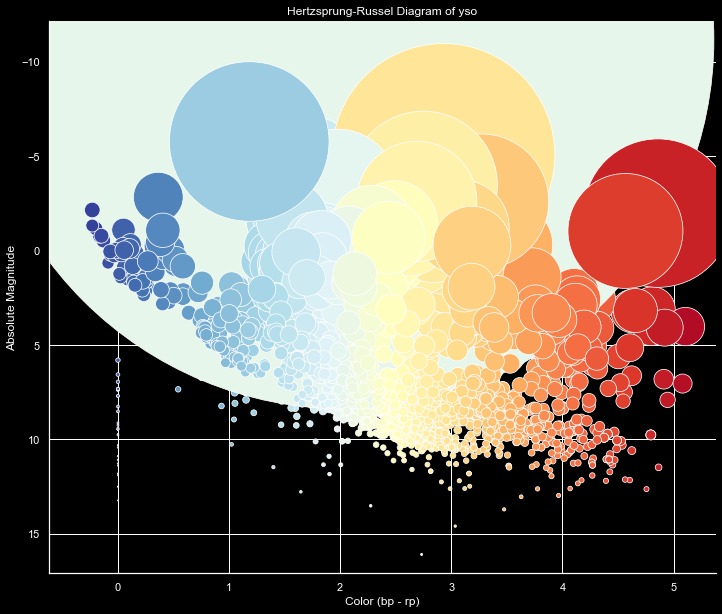

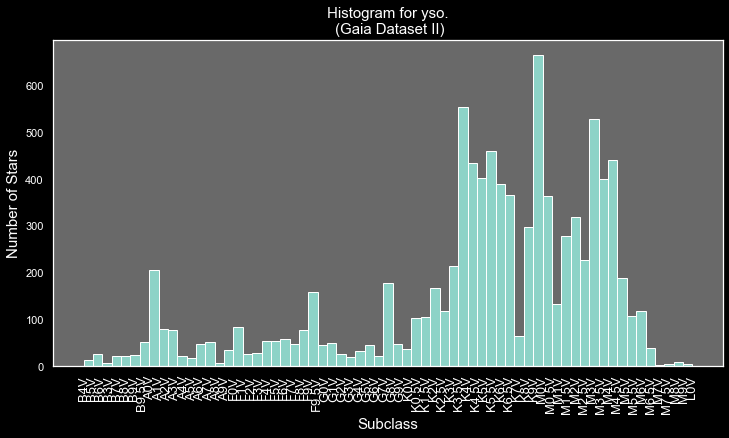

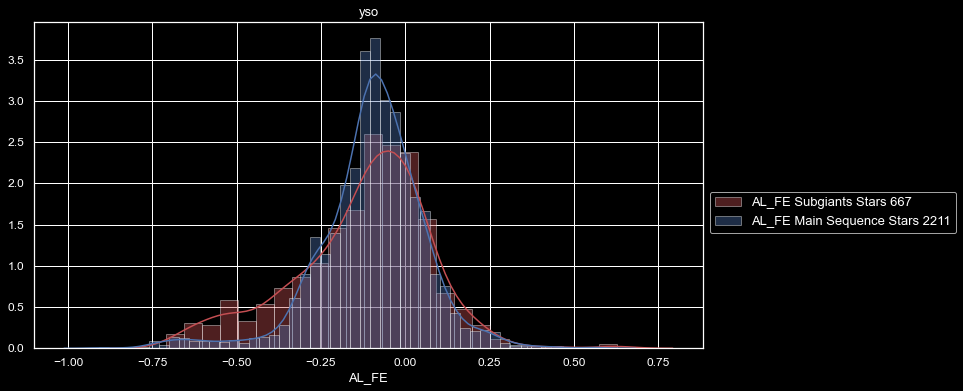


Subgiants AL_FE
count    667.000000
mean      -0.129077
std        0.203059
min       -0.710761
25%       -0.241631
50%       -0.096041
75%        0.001740
max        0.627639
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


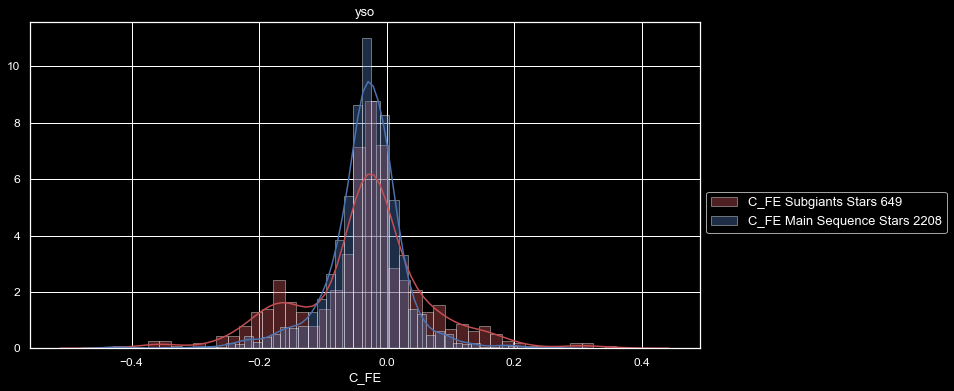


Subgiants C_FE
count    649.000000
mean      -0.037280
std        0.101286
min       -0.428396
25%       -0.072436
50%       -0.029335
75%        0.006267
max        0.359758
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


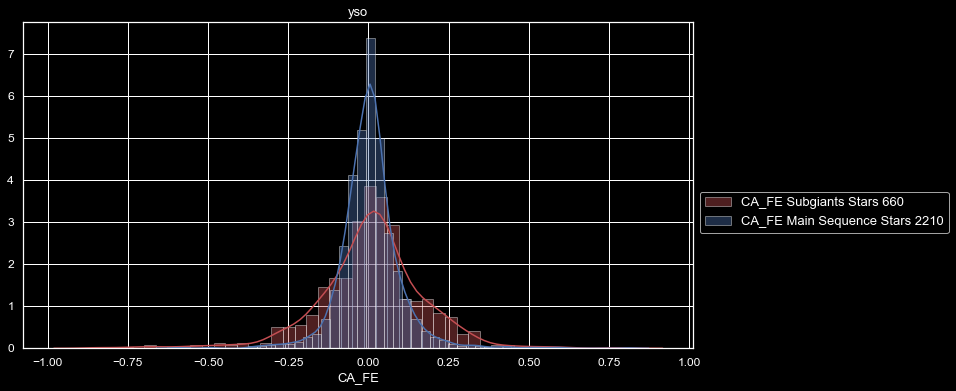


Subgiants CA_FE
count    660.000000
mean       0.008215
std        0.167851
min       -0.843465
25%       -0.072035
50%        0.016010
75%        0.087919
max        0.779868
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


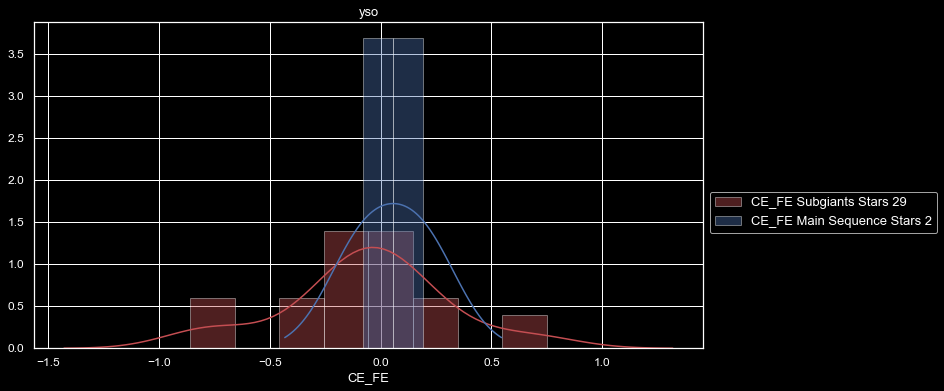


Subgiants CE_FE
count    29.000000
mean     -0.225069
std       0.529345
min      -1.406355
25%      -0.412143
50%      -0.080865
75%       0.087975
max       0.749380
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


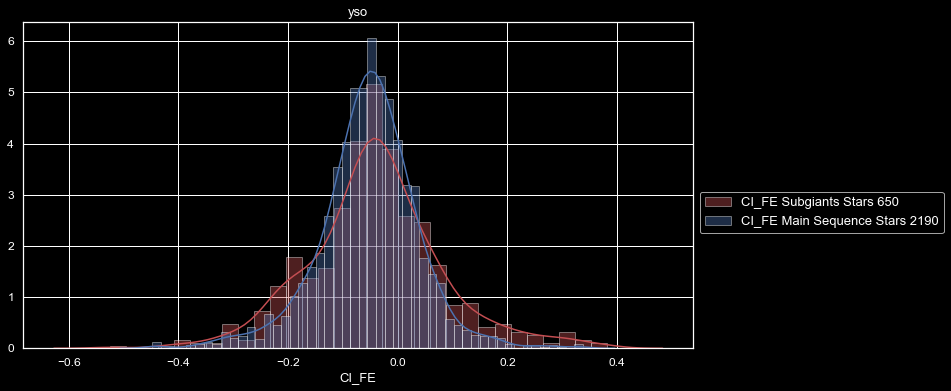


Subgiants CI_FE
count    650.000000
mean      -0.041594
std        0.124149
min       -0.525178
25%       -0.109331
50%       -0.042497
75%        0.021172
max        0.381042
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


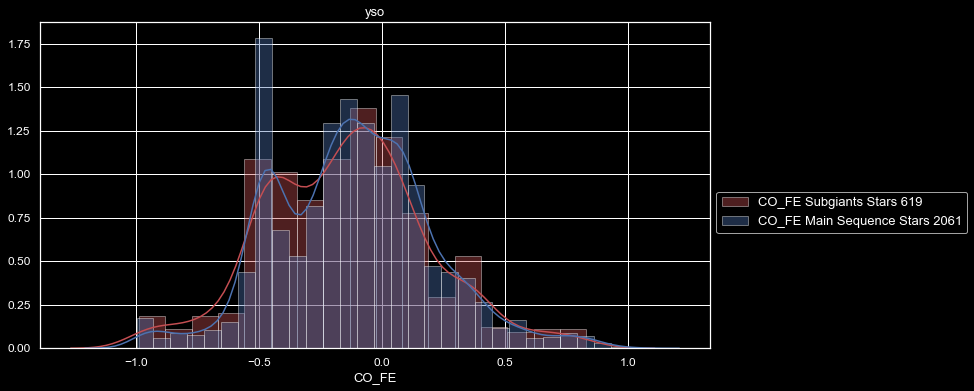


Subgiants CO_FE
count    619.000000
mean      -0.174810
std        0.397648
min       -2.194668
25%       -0.428531
50%       -0.143536
75%        0.040963
max        1.346072
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


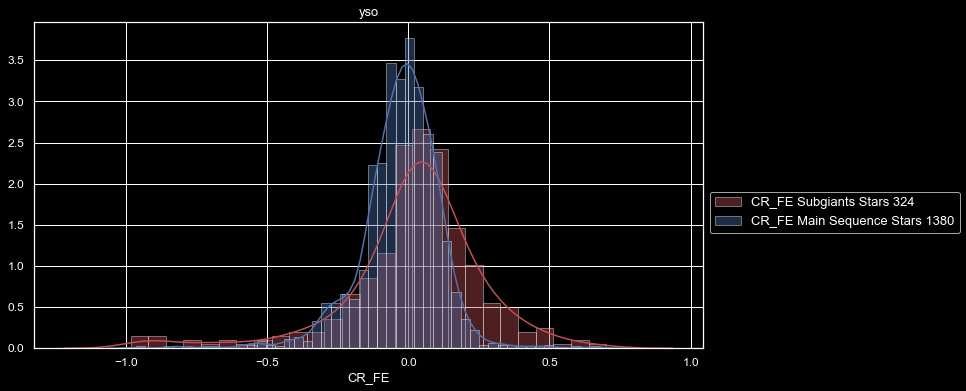


Subgiants CR_FE
count    324.000000
mean      -0.001205
std        0.315202
min       -1.973622
25%       -0.075397
50%        0.037612
75%        0.147379
max        1.056068
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


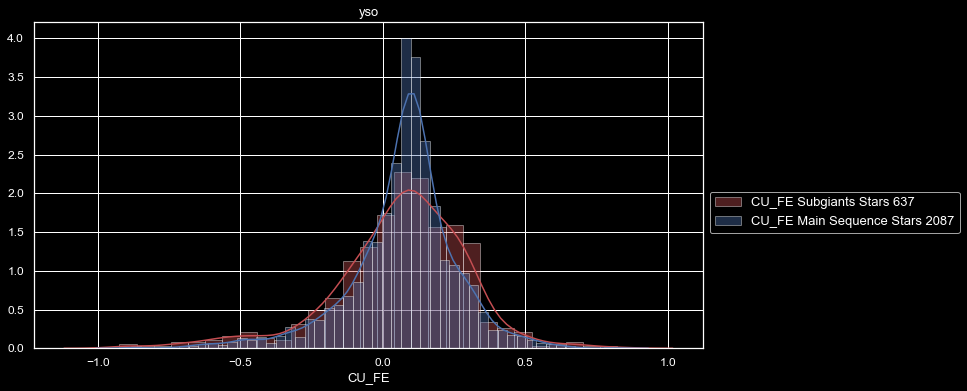


Subgiants CU_FE
count    637.000000
mean       0.057714
std        0.243447
min       -1.071362
25%       -0.055924
50%        0.086466
75%        0.212046
max        0.823516
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


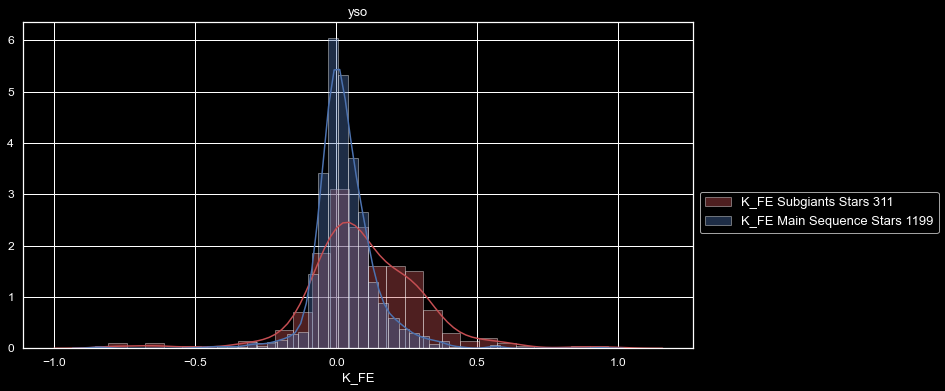


Subgiants K_FE
count    311.000000
mean       0.064541
std        0.327059
min       -1.932530
25%       -0.018983
50%        0.073054
75%        0.218750
max        1.025800
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


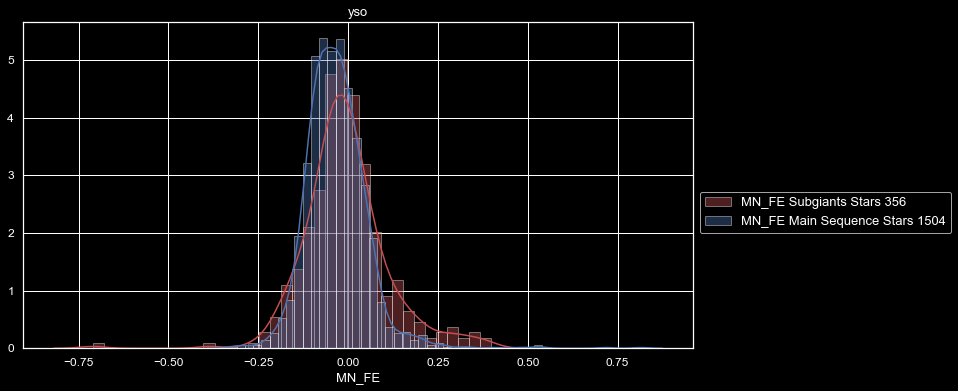


Subgiants MN_FE
count    356.000000
mean      -0.011503
std        0.150418
min       -1.802076
25%       -0.067926
50%       -0.015953
75%        0.041877
max        0.398924
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


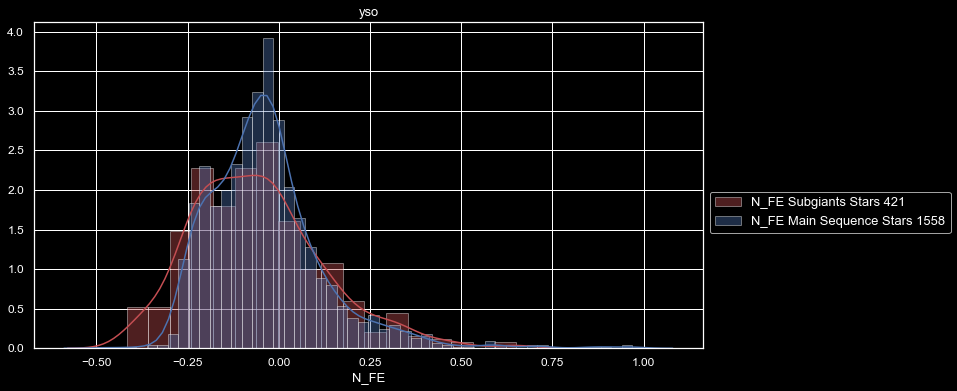


Subgiants N_FE
count    421.000000
mean      -0.059240
std        0.180719
min       -0.417447
25%       -0.191047
50%       -0.080260
75%        0.038458
max        0.649885
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


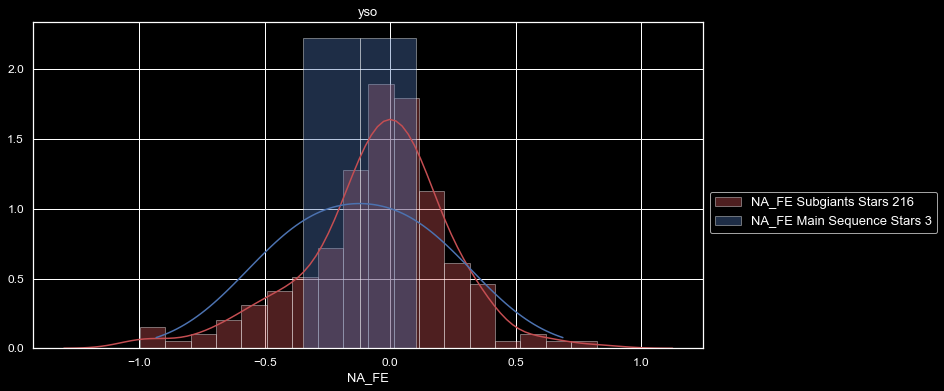


Subgiants NA_FE
count    216.000000
mean      -0.207556
std        0.533306
min       -2.157501
25%       -0.330224
50%       -0.053544
75%        0.094922
max        0.823176
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


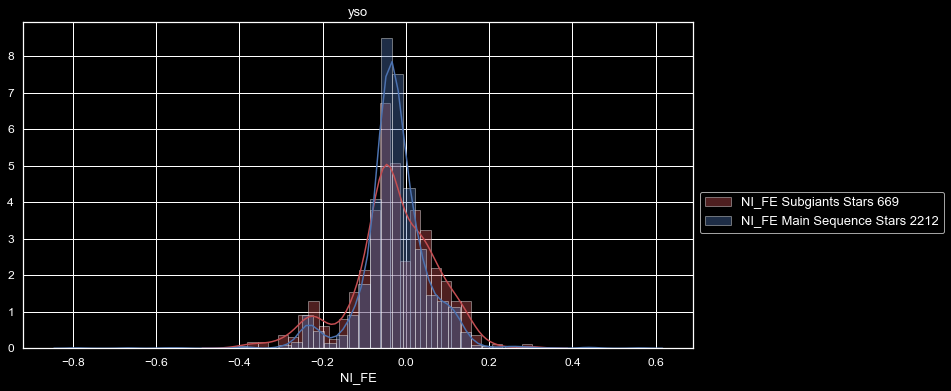


Subgiants NI_FE
count    669.000000
mean      -0.030608
std        0.103630
min       -0.405118
25%       -0.072005
50%       -0.033760
75%        0.038345
max        0.303692
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


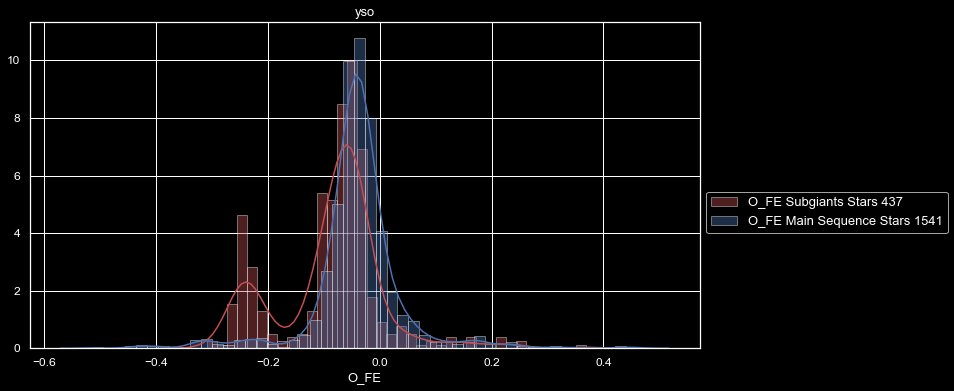


Subgiants O_FE
count    437.000000
mean      -0.087396
std        0.094663
min       -0.308889
25%       -0.111177
50%       -0.067029
75%       -0.042702
max        0.368315
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


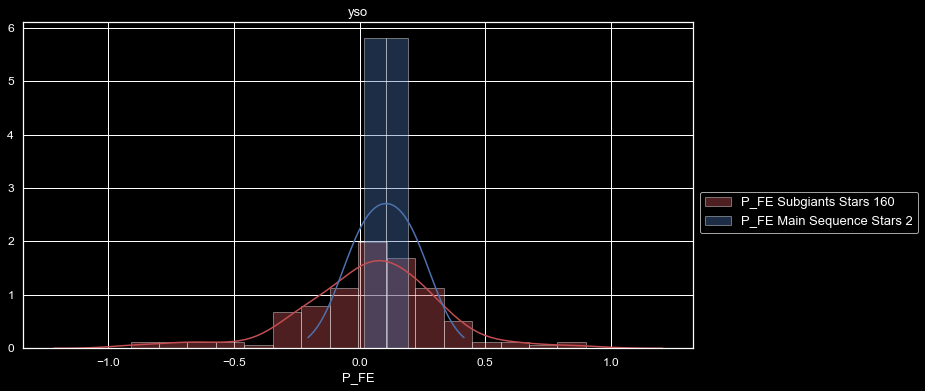


Subgiants P_FE
count    160.000000
mean       0.009432
std        0.383214
min       -2.073038
25%       -0.112980
50%        0.046832
75%        0.201804
max        1.039319
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


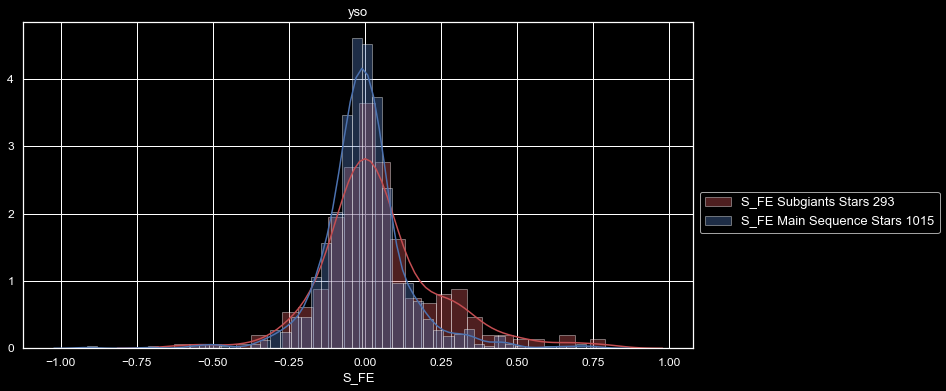


Subgiants S_FE
count    293.000000
mean       0.046600
std        0.195707
min       -0.626526
25%       -0.055486
50%        0.013777
75%        0.112934
max        0.791196
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


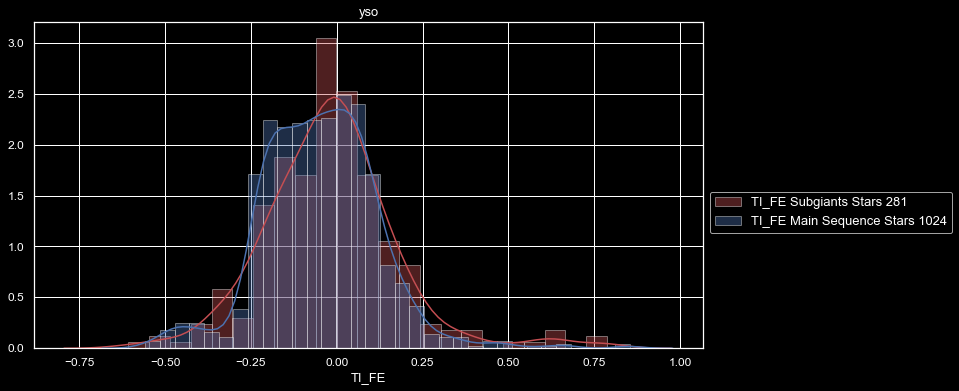


Subgiants TI_FE
count    281.000000
mean      -0.018174
std        0.193036
min       -0.607799
25%       -0.132689
50%       -0.019608
75%        0.074493
max        0.787361
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


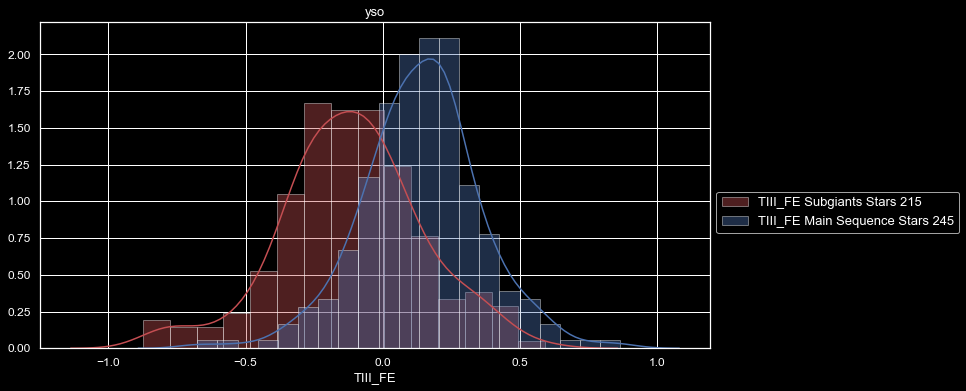


Subgiants TIII_FE
count    215.000000
mean      -0.117261
std        0.257811
min       -0.873375
25%       -0.267996
50%       -0.117695
75%        0.040025
max        0.591268
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


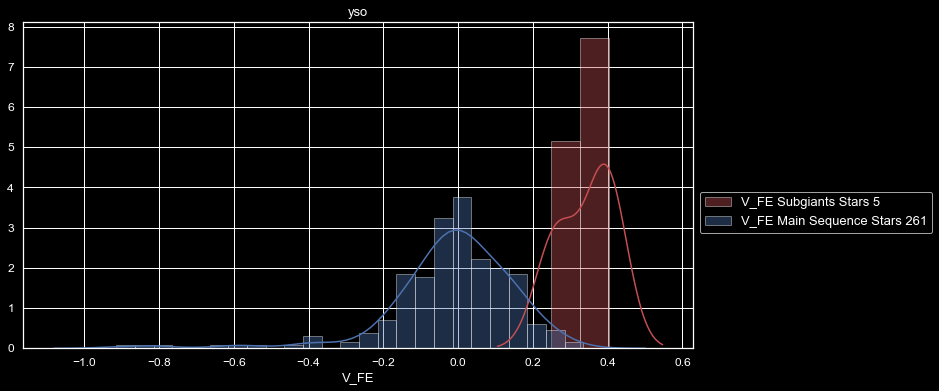


Subgiants V_FE
count    5.000000
mean     0.342558
std      0.073618
min      0.248456
25%      0.278448
50%      0.379617
75%      0.402475
max      0.403793
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


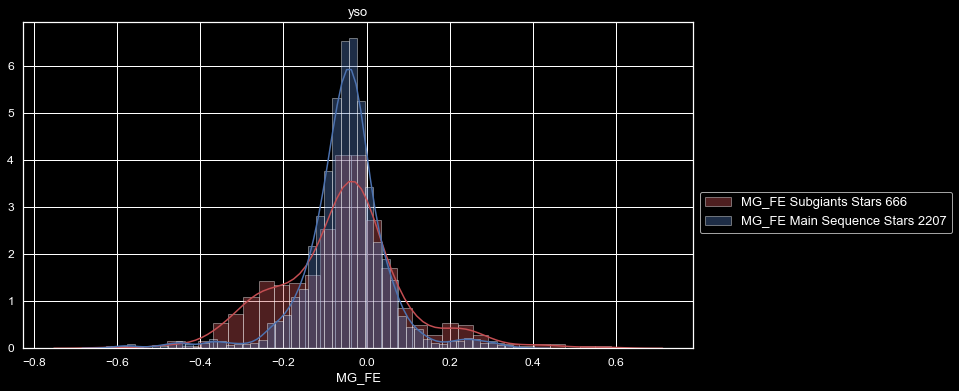


Subgiants MG_FE
count    666.000000
mean      -0.062921
std        0.152706
min       -0.627258
25%       -0.152221
50%       -0.051310
75%        0.008861
max        0.587038
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


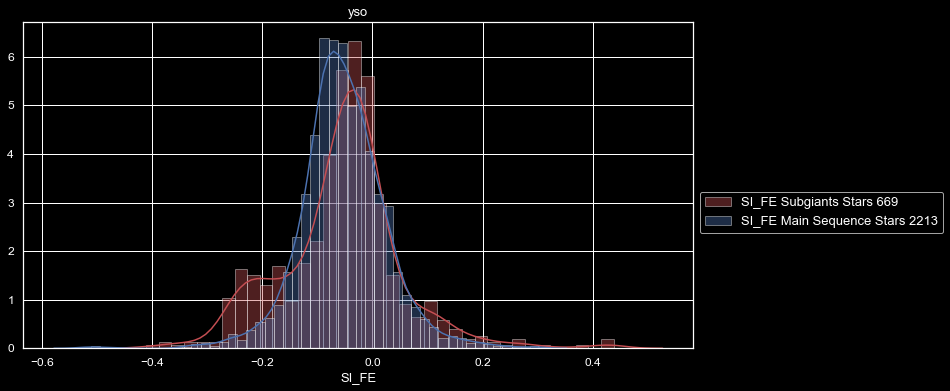


Subgiants SI_FE
count    669.000000
mean      -0.056419
std        0.109141
min       -0.410628
25%       -0.107089
50%       -0.046327
75%       -0.006403
max        0.437771
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [28]:
Detail_View(field_list, subgiants, "Subgiants", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


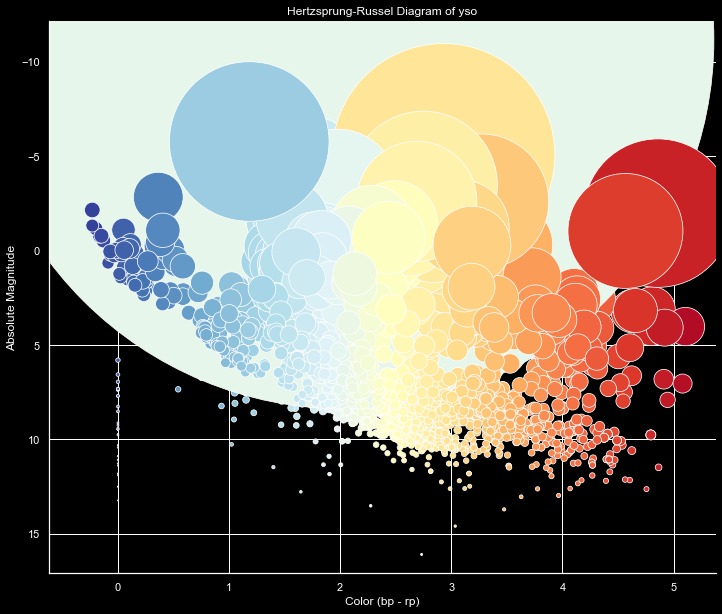

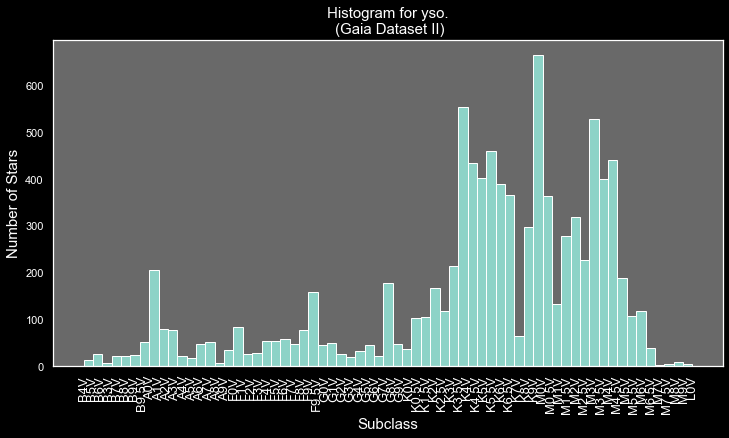

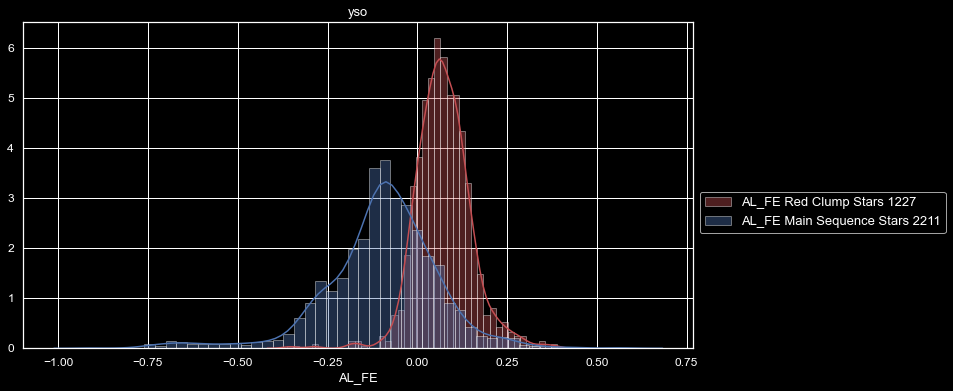


Red Clump AL_FE
count    1227.000000
mean        0.072581
std         0.076662
min        -0.362692
25%         0.023988
50%         0.069019
75%         0.116413
max         0.388988
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


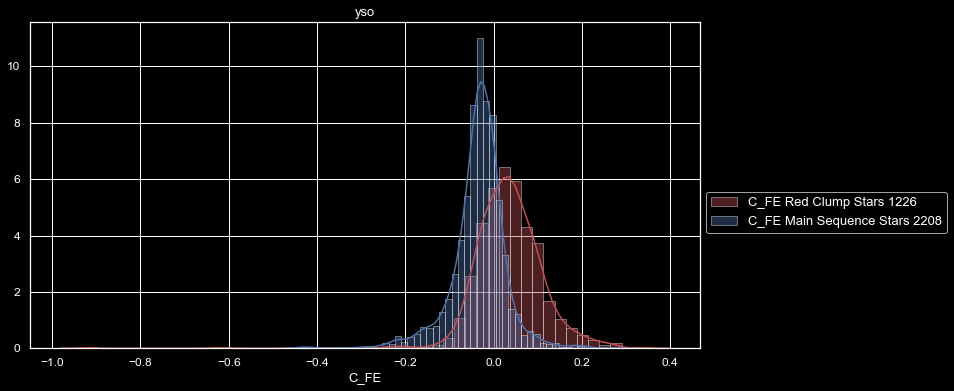


Red Clump C_FE
count    1226.000000
mean        0.034339
std         0.079172
min        -0.924110
25%        -0.010278
50%         0.032016
75%         0.076630
max         0.340060
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


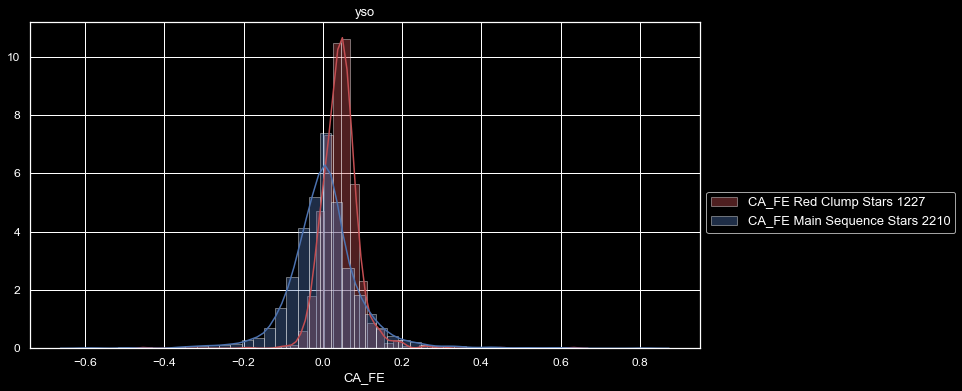


Red Clump CA_FE
count    1227.000000
mean        0.044012
std         0.050609
min        -0.451942
25%         0.016401
50%         0.043269
75%         0.065720
max         0.632678
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


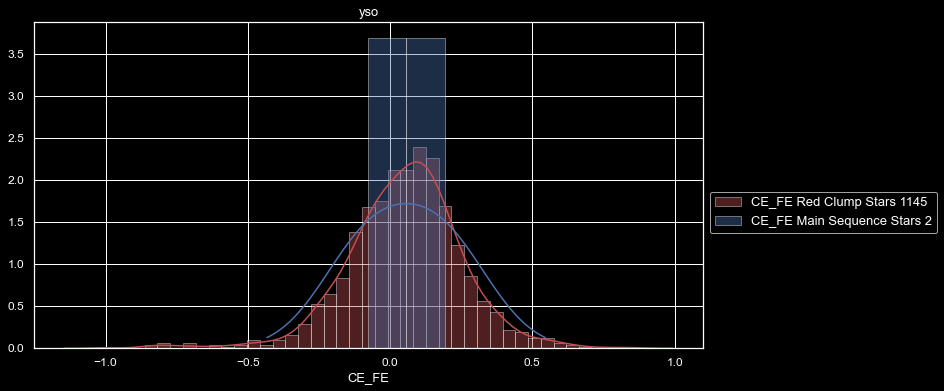


Red Clump CE_FE
count    1145.000000
mean        0.048631
std         0.210279
min        -1.088115
25%        -0.065702
50%         0.063408
75%         0.170627
max         0.844475
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


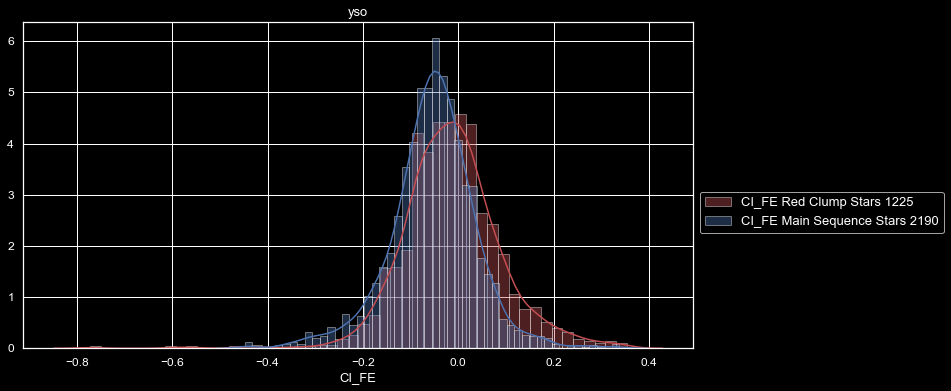


Red Clump CI_FE
count    1225.000000
mean       -0.014139
std         0.108064
min        -1.042210
25%        -0.076216
50%        -0.015605
75%         0.040480
max         0.353300
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


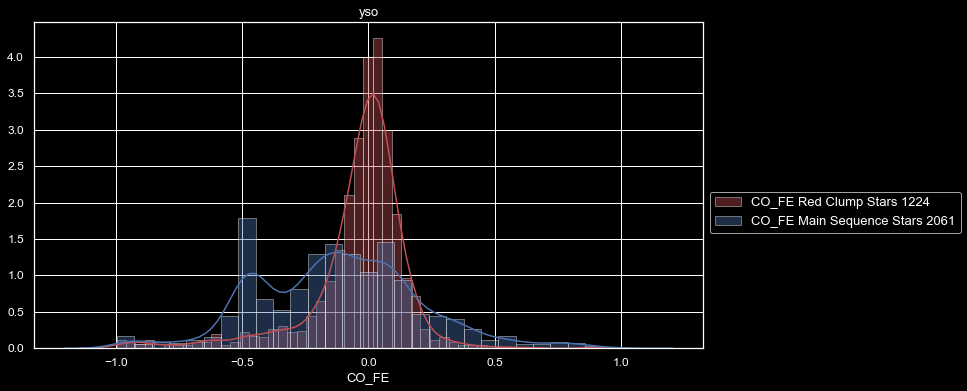


Red Clump CO_FE
count    1224.000000
mean       -0.049088
std         0.237626
min        -2.100788
25%        -0.086108
50%        -0.000418
75%         0.061462
max         0.883272
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


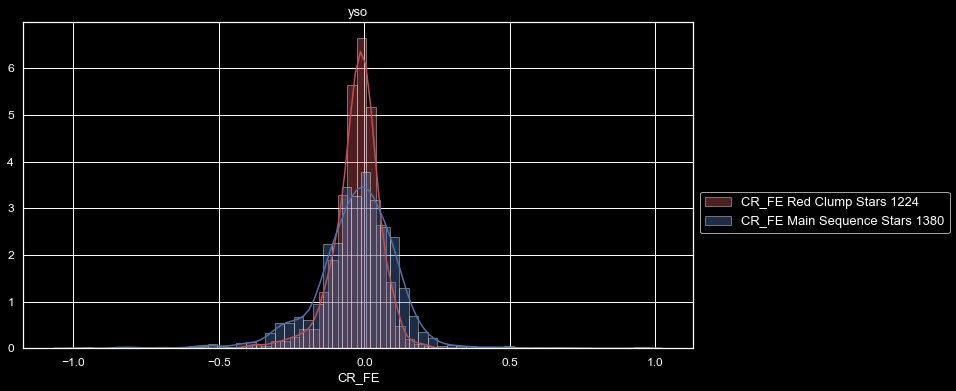


Red Clump CR_FE
count    1224.000000
mean       -0.025845
std         0.088038
min        -0.683442
25%        -0.061619
50%        -0.016995
75%         0.020901
max         0.960798
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


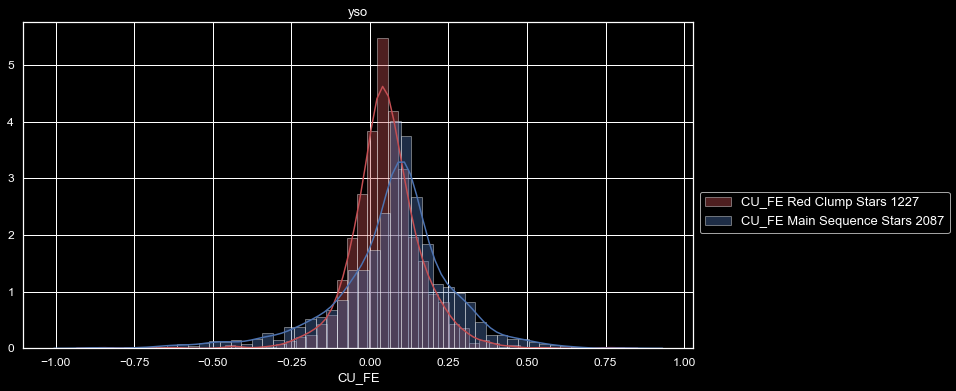


Red Clump CU_FE
count    1227.000000
mean        0.047995
std         0.127892
min        -1.395652
25%        -0.008454
50%         0.046593
75%         0.108413
max         0.767466
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


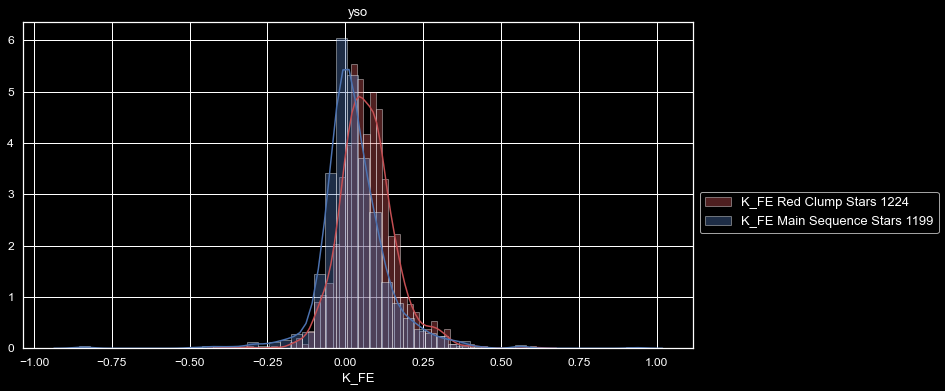


Red Clump K_FE
count    1224.000000
mean        0.069639
std         0.090602
min        -0.377110
25%         0.014767
50%         0.063355
75%         0.116532
max         0.612430
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


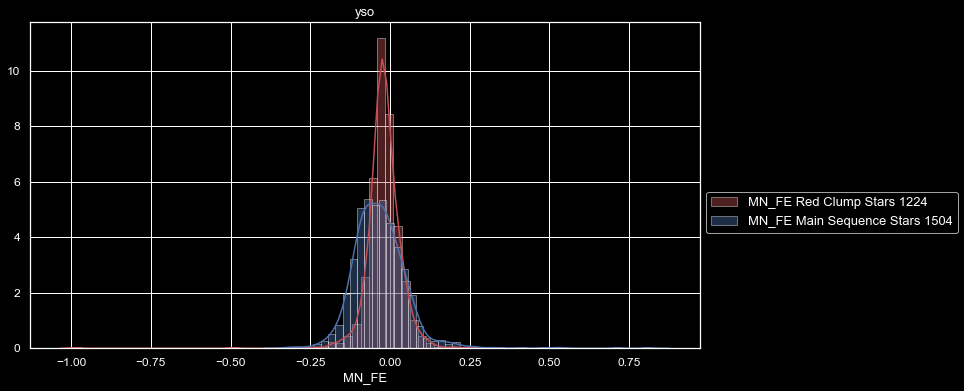


Red Clump MN_FE
count    1224.000000
mean       -0.019196
std         0.058086
min        -0.992156
25%        -0.043361
50%        -0.020456
75%         0.006027
max         0.292874
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


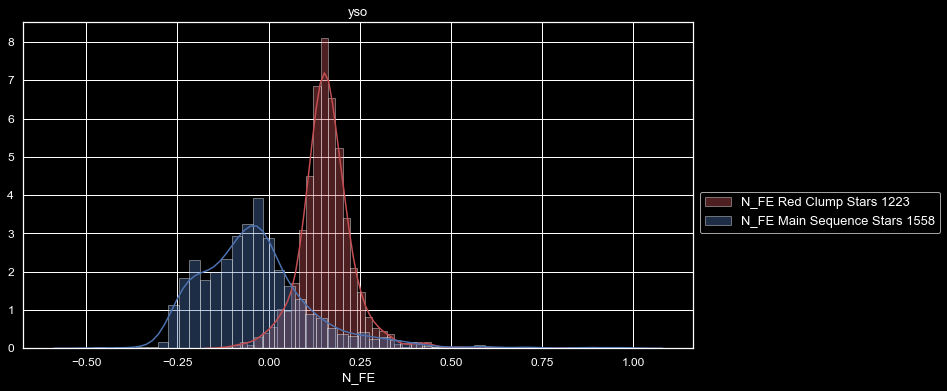


Red Clump N_FE
count    1223.000000
mean        0.158559
std         0.076603
min        -0.119554
25%         0.120900
50%         0.155960
75%         0.194410
max         0.888100
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


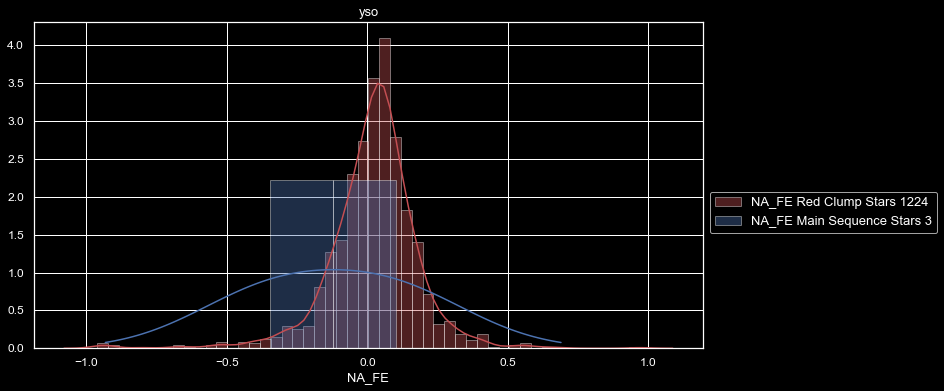


Red Clump NA_FE
count    1224.000000
mean        0.016055
std         0.180722
min        -1.560214
25%        -0.053235
50%         0.033294
75%         0.101086
max         0.968806
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


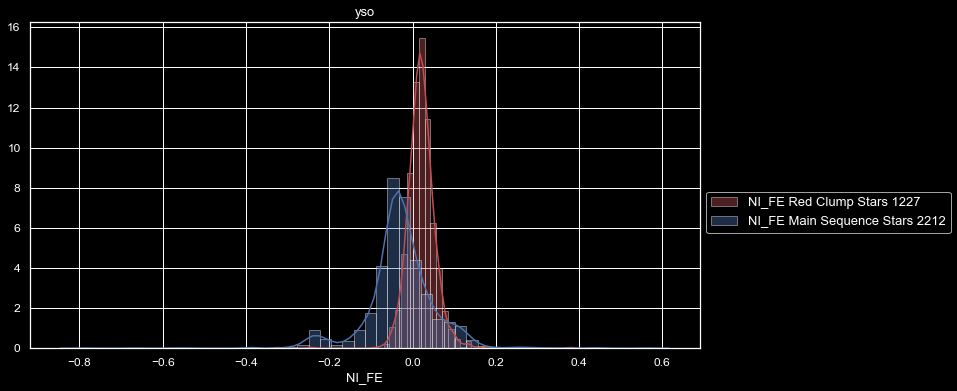


Red Clump NI_FE
count    1227.000000
mean        0.020727
std         0.034405
min        -0.322471
25%         0.002417
50%         0.019362
75%         0.038112
max         0.380282
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


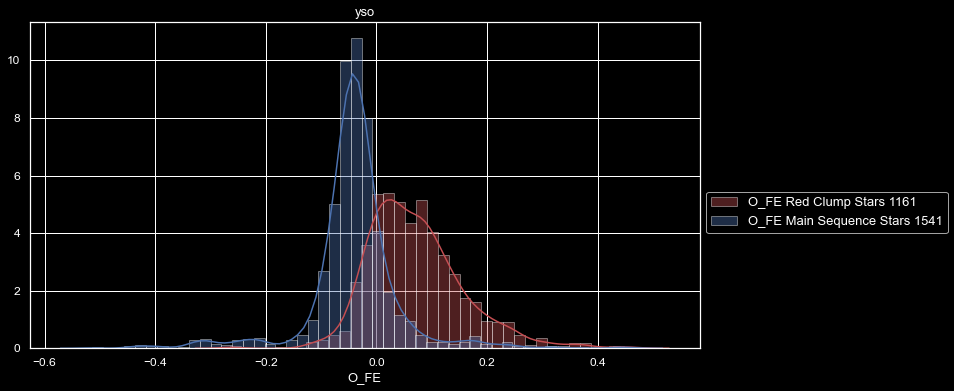


Red Clump O_FE
count    1161.000000
mean        0.070349
std         0.085611
min        -0.265125
25%         0.010005
50%         0.059413
75%         0.115585
max         0.466475
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


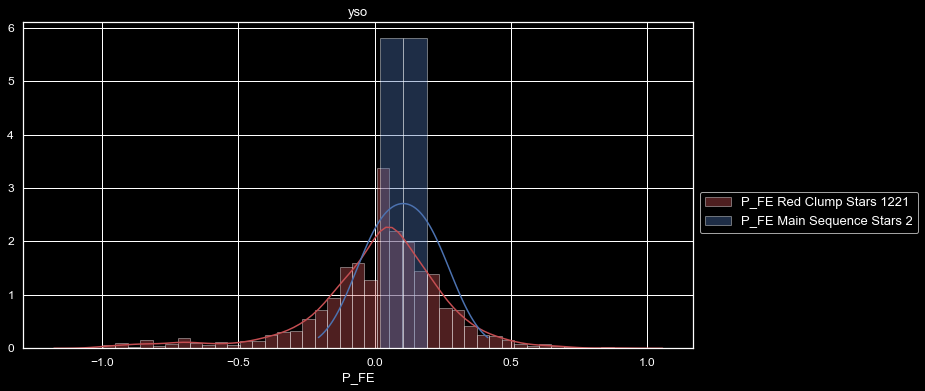


Red Clump P_FE
count    1221.000000
mean       -0.003544
std         0.285698
min        -1.677253
25%        -0.100473
50%         0.035897
75%         0.151447
max         1.121477
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


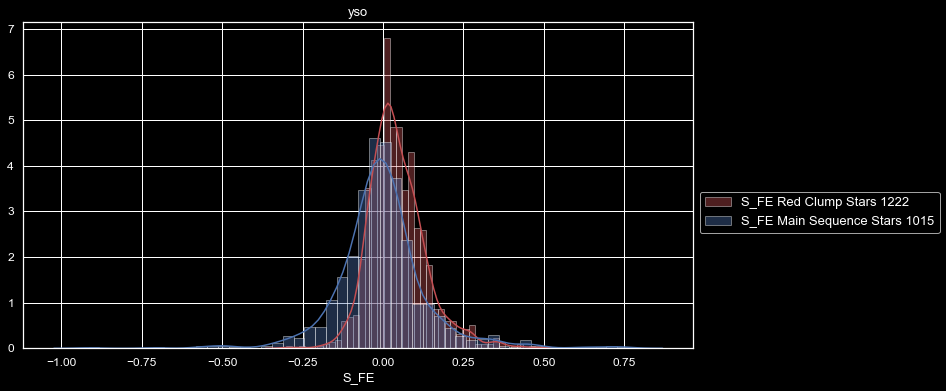


Red Clump S_FE
count    1222.000000
mean        0.044875
std         0.089735
min        -0.300226
25%        -0.012617
50%         0.032004
75%         0.090344
max         0.511244
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


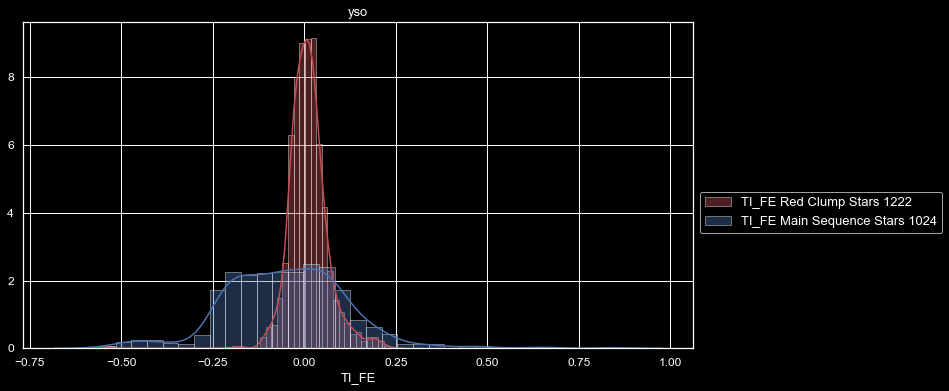


Red Clump TI_FE
count    1222.000000
mean        0.011118
std         0.052877
min        -0.535779
25%        -0.020813
50%         0.007222
75%         0.035590
max         0.232151
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


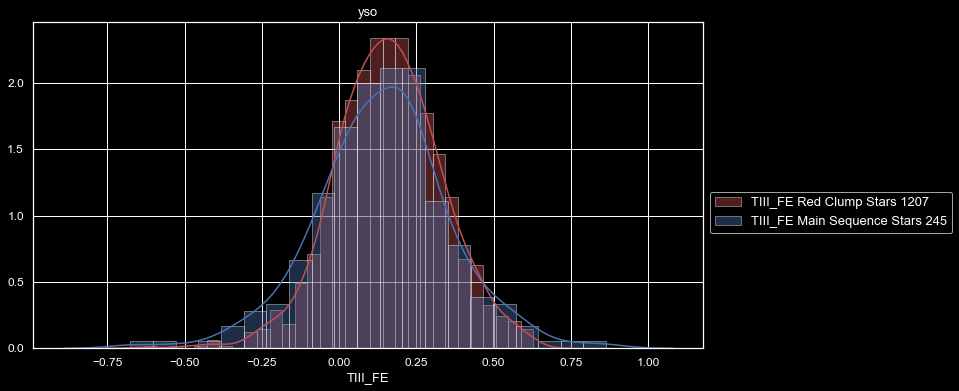


Red Clump TIII_FE
count    1207.000000
mean        0.159288
std         0.172050
min        -0.632152
25%         0.049762
50%         0.158344
75%         0.271475
max         0.629025
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


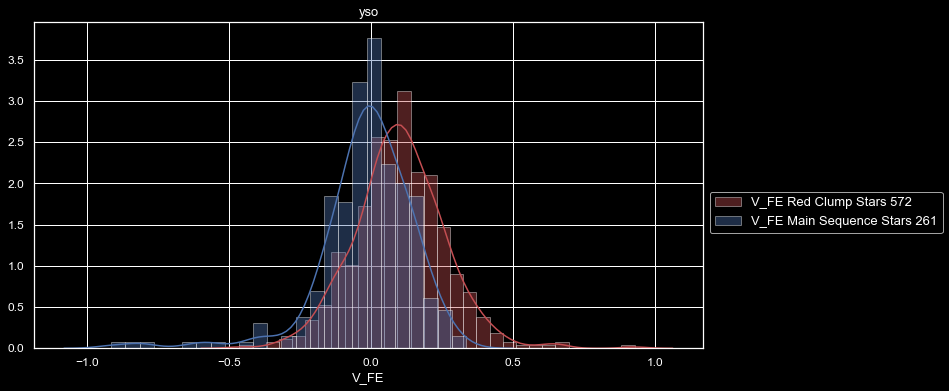


Red Clump V_FE
count    572.000000
mean       0.101585
std        0.159880
min       -0.463987
25%        0.009559
50%        0.101447
75%        0.202442
max        0.929413
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


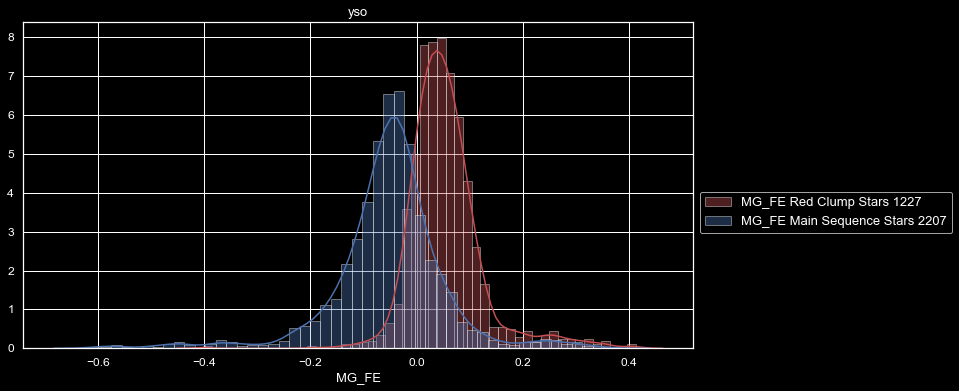


Red Clump MG_FE
count    1227.000000
mean        0.054814
std         0.069630
min        -0.401898
25%         0.013763
50%         0.046471
75%         0.081060
max         0.413902
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


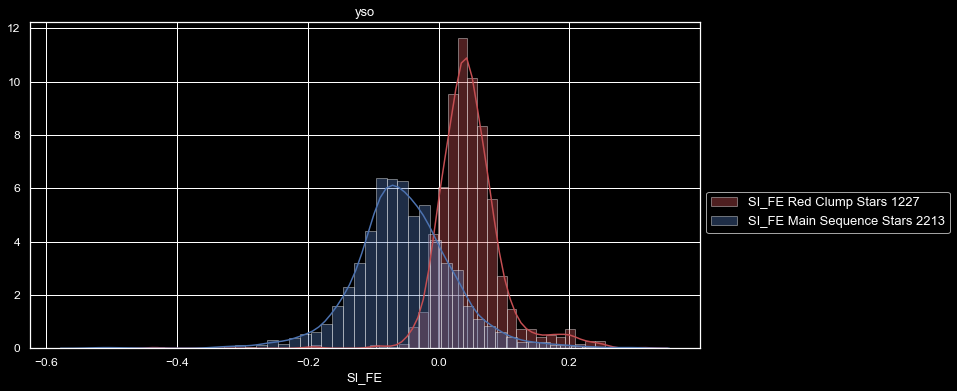


Red Clump SI_FE
count    1227.000000
mean        0.048210
std         0.050298
min        -0.434948
25%         0.020193
50%         0.042993
75%         0.068608
max         0.313642
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


14 seconds elapsed


In [29]:
Detail_View(field_list, red_clump, "Red Clump", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


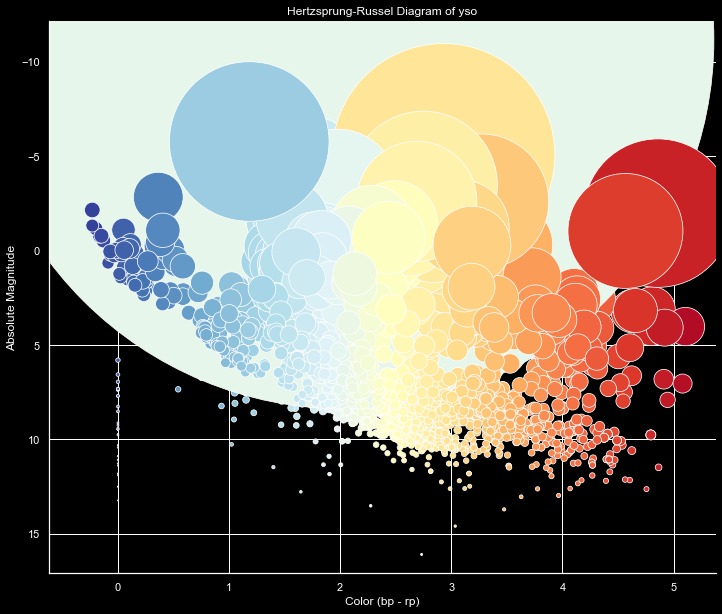

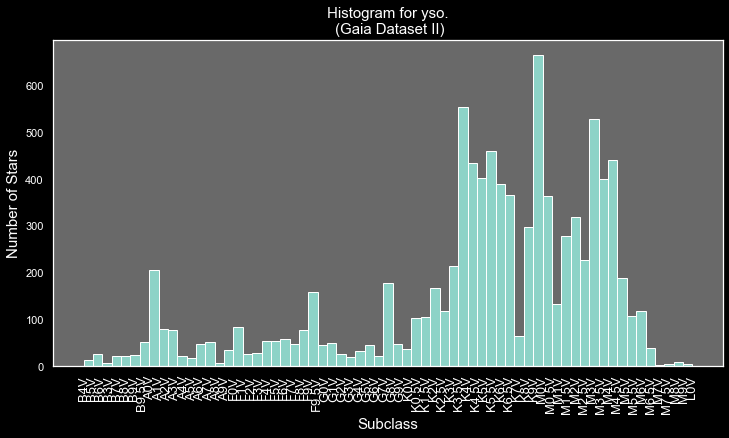

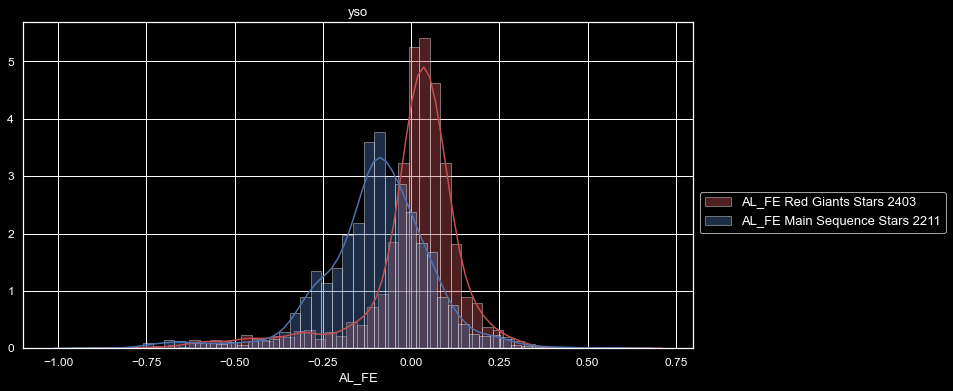


Red Giants AL_FE
count    2403.000000
mean        0.003062
std         0.151482
min        -0.866132
25%        -0.023515
50%         0.029568
75%         0.078173
max         0.617028
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


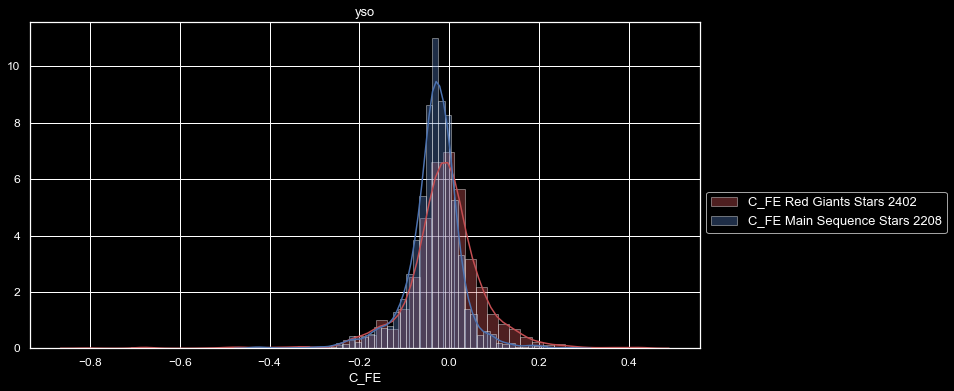


Red Giants C_FE
count    2402.000000
mean       -0.011491
std         0.093051
min        -0.806800
25%        -0.047006
50%        -0.008768
75%         0.029594
max         0.430970
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


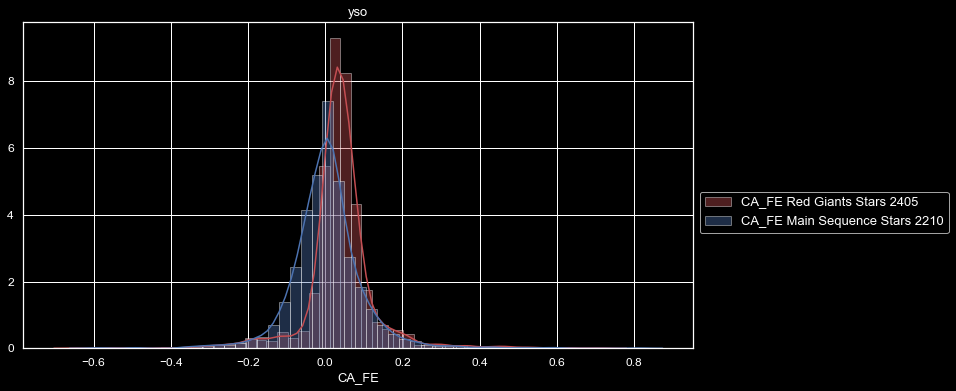


Red Giants CA_FE
count    2405.000000
mean        0.039023
std         0.094644
min        -0.643012
25%         0.009570
50%         0.036865
75%         0.066527
max         0.720548
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


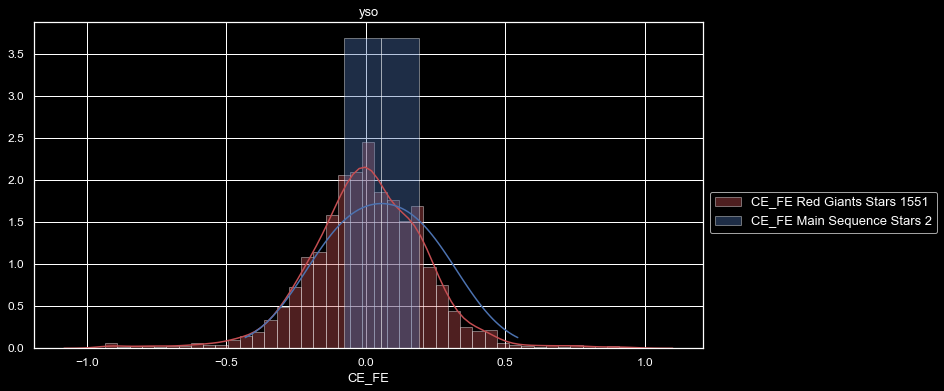


Red Giants CE_FE
count    1551.000000
mean       -0.000854
std         0.250254
min        -2.109195
25%        -0.118630
50%         0.006126
75%         0.141616
max         1.211085
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


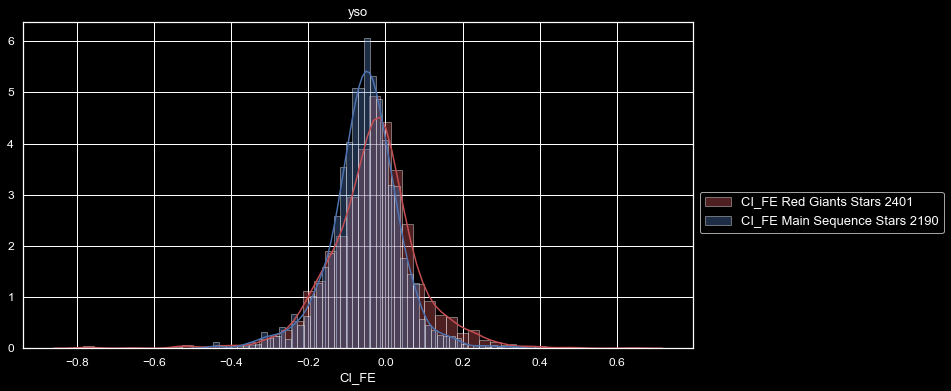


Red Giants CI_FE
count    2401.000000
mean       -0.032866
std         0.122245
min        -1.115030
25%        -0.093590
50%        -0.027421
75%         0.026574
max         0.644230
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


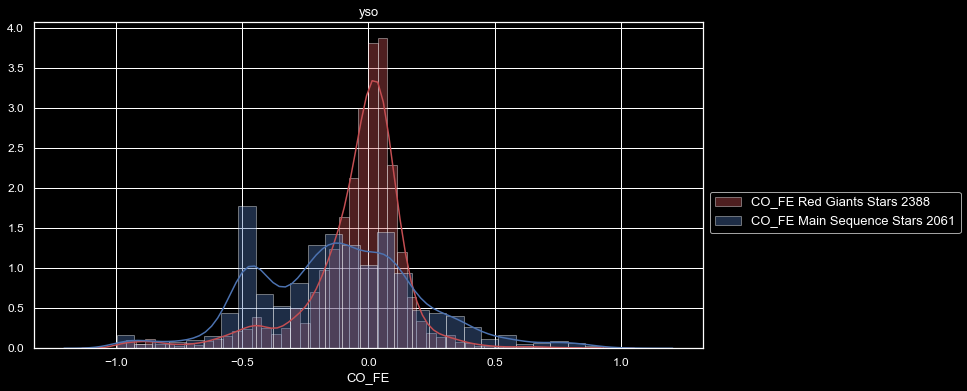


Red Giants CO_FE
count    2388.000000
mean       -0.064907
std         0.256590
min        -2.200718
25%        -0.116948
50%        -0.004048
75%         0.058955
max         1.255094
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


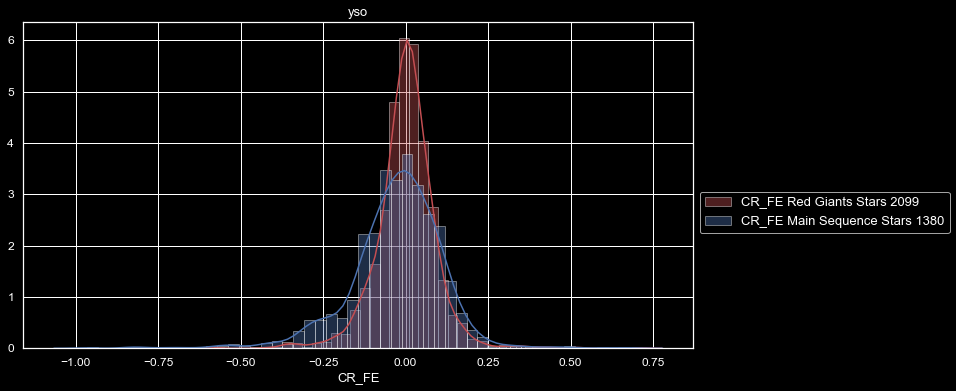


Red Giants CR_FE
count    2099.000000
mean        0.000473
std         0.093059
min        -0.756352
25%        -0.041252
50%         0.004468
75%         0.047583
max         0.716538
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


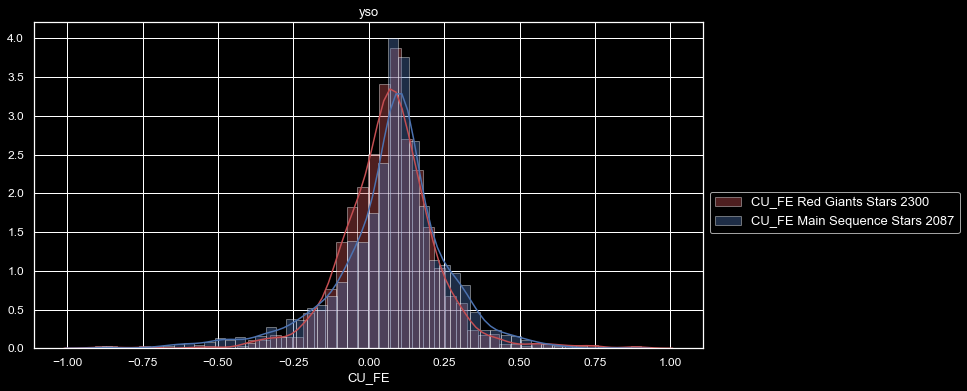


Red Giants CU_FE
count    2300.000000
mean        0.066259
std         0.169286
min        -1.146473
25%        -0.018155
50%         0.071423
75%         0.148672
max         1.236275
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


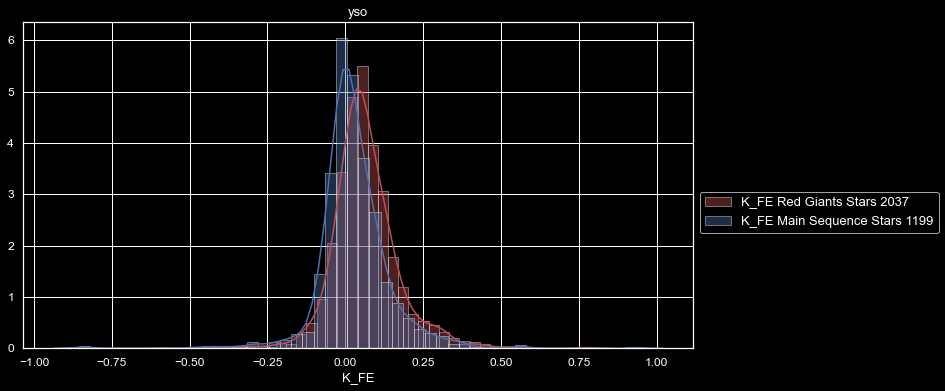


Red Giants K_FE
count    2037.000000
mean        0.062561
std         0.113494
min        -1.109316
25%         0.005812
50%         0.053039
75%         0.114200
max         0.791180
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


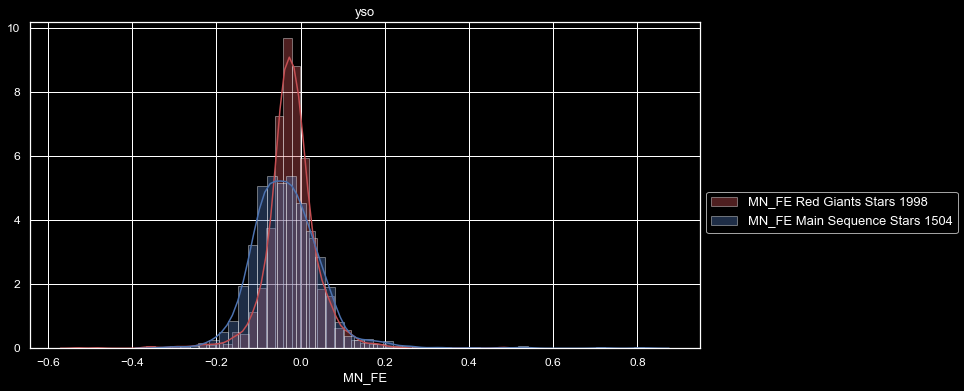


Red Giants MN_FE
count    1998.000000
mean       -0.021797
std         0.063809
min        -0.528916
25%        -0.049646
50%        -0.023609
75%         0.006008
max         0.486020
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


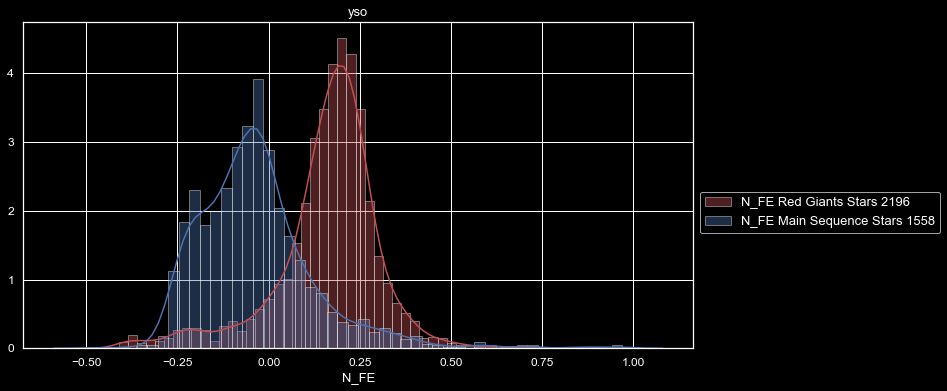


Red Giants N_FE
count    2196.000000
mean        0.161072
std         0.145105
min        -0.411457
25%         0.111013
50%         0.181890
75%         0.240332
max         0.837670
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


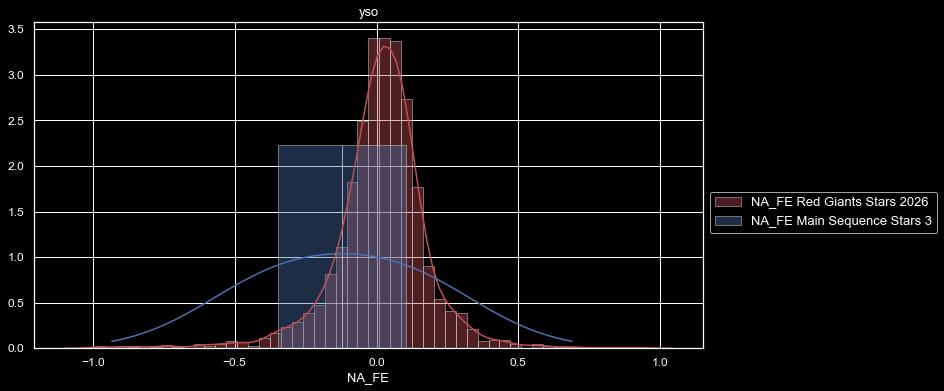


Red Giants NA_FE
count    2026.000000
mean        0.005049
std         0.209104
min        -2.285414
25%        -0.057521
50%         0.022557
75%         0.097241
max         1.121726
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


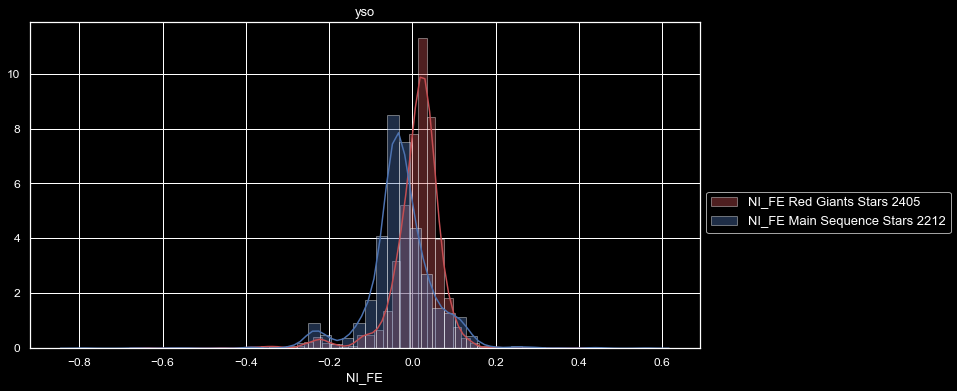


Red Giants NI_FE
count    2405.000000
mean        0.008762
std         0.069282
min        -1.070138
25%        -0.010718
50%         0.019032
75%         0.043132
max         0.411350
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


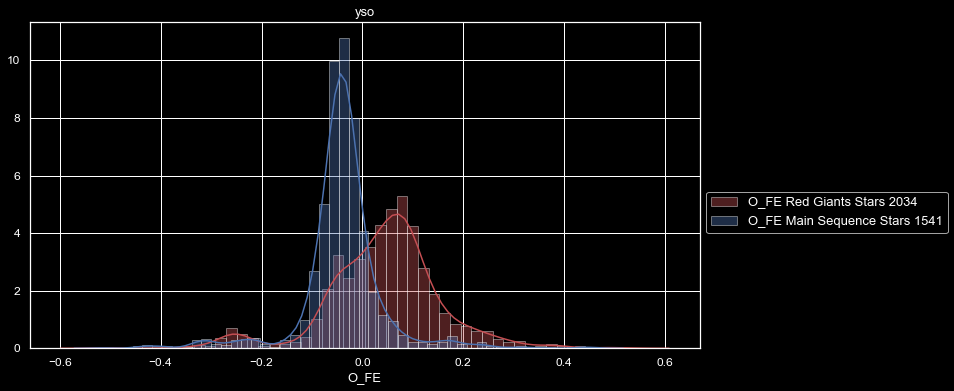


Red Giants O_FE
count    2034.000000
mean        0.041501
std         0.114694
min        -0.523855
25%        -0.017460
50%         0.050402
75%         0.100580
max         0.533085
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


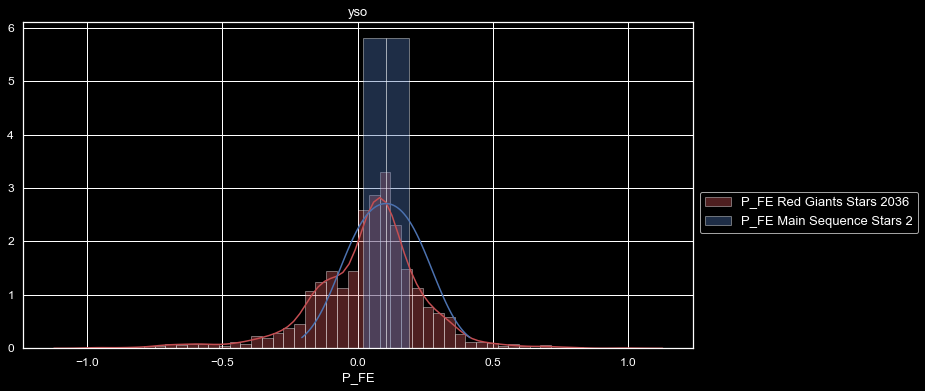


Red Giants P_FE
count    2036.000000
mean        0.025003
std         0.243401
min        -1.667653
25%        -0.075105
50%         0.058832
75%         0.140637
max         0.992537
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


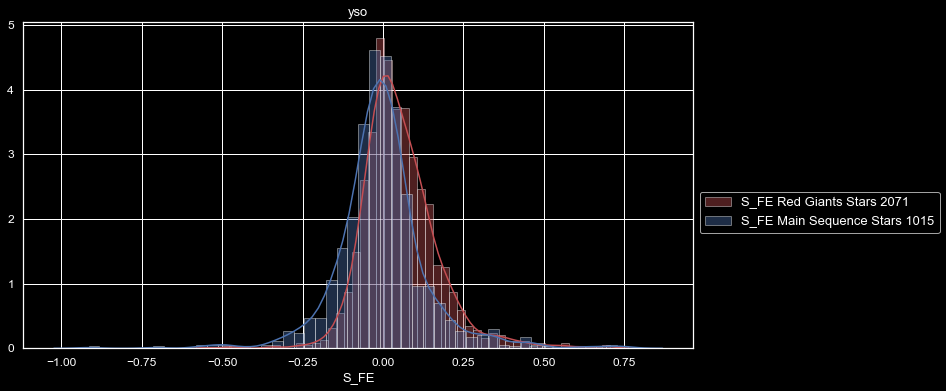


Red Giants S_FE
count    2071.000000
mean        0.053163
std         0.119667
min        -0.546086
25%        -0.018851
50%         0.035748
75%         0.110399
max         0.704814
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


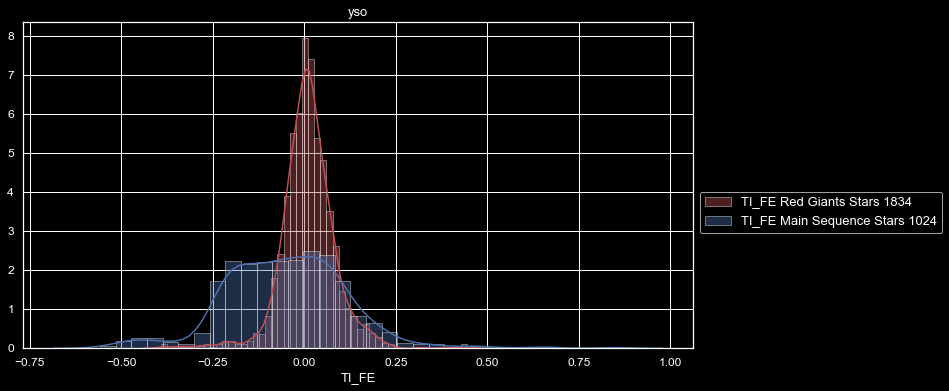


Red Giants TI_FE
count    1834.000000
mean        0.010722
std         0.073949
min        -0.390983
25%        -0.027464
50%         0.009080
75%         0.047612
max         0.445411
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


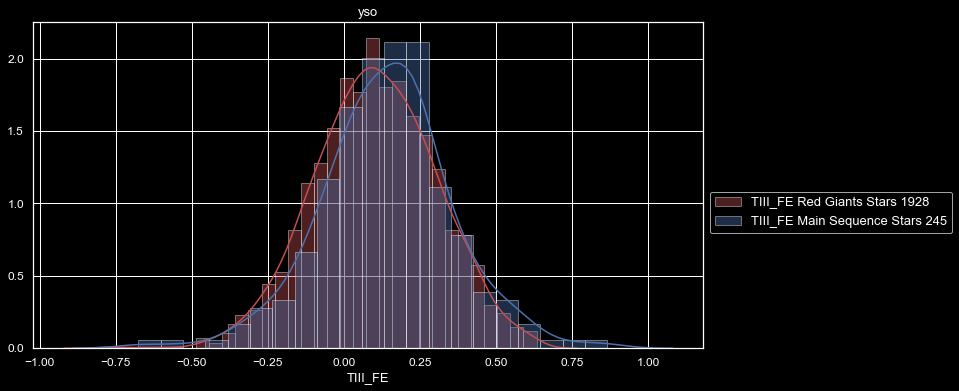


Red Giants TIII_FE
count    1928.000000
mean        0.102227
std         0.201575
min        -0.787852
25%        -0.033188
50%         0.100390
75%         0.240902
max         0.632525
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


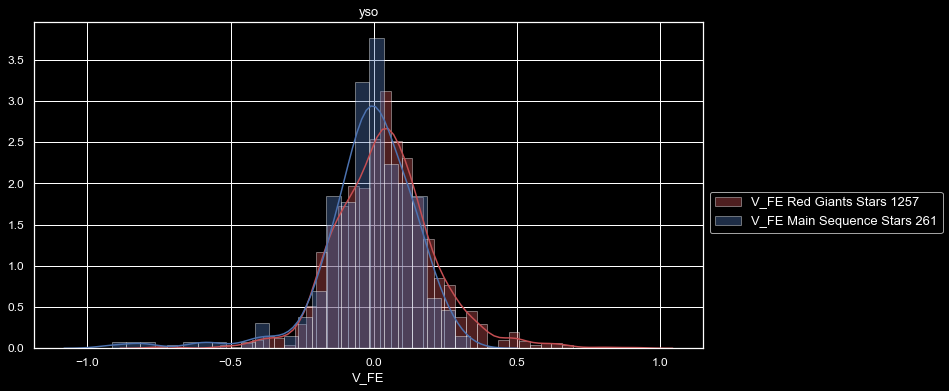


Red Giants V_FE
count    1257.000000
mean        0.039430
std         0.177492
min        -0.760237
25%        -0.069837
50%         0.035223
75%         0.132033
max         1.180643
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


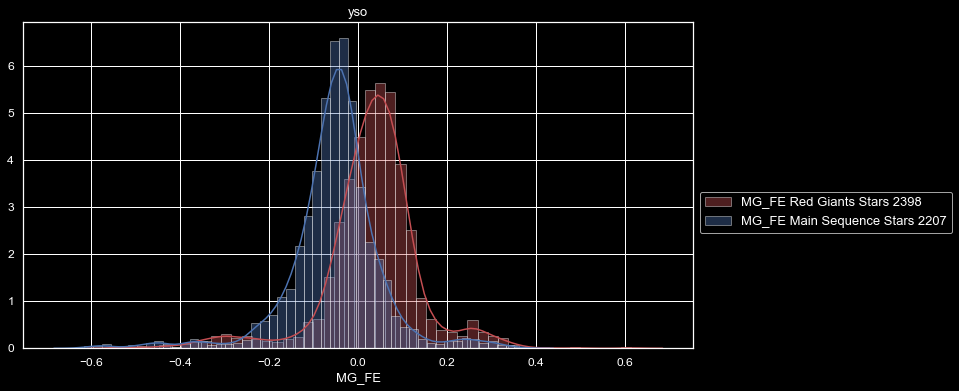


Red Giants MG_FE
count    2398.000000
mean        0.031237
std         0.111093
min        -0.538749
25%        -0.012125
50%         0.038944
75%         0.083586
max         0.615451
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


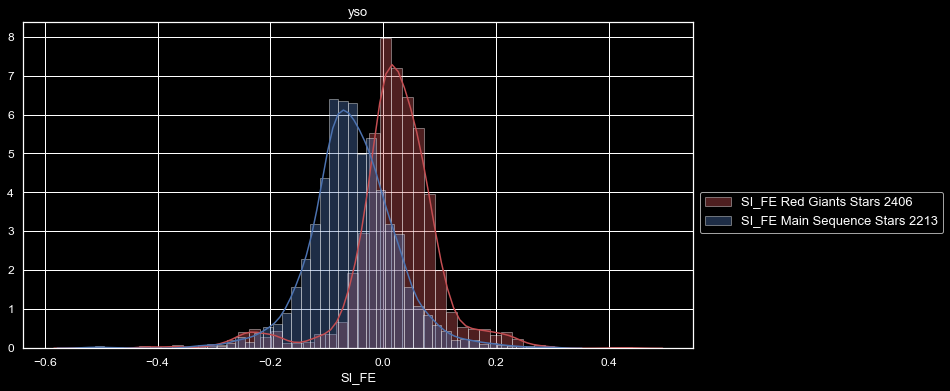


Red Giants SI_FE
count    2406.000000
mean        0.019130
std         0.084909
min        -0.530219
25%        -0.009296
50%         0.022928
75%         0.060633
max         0.442071
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


14 seconds elapsed


In [30]:
Detail_View(field_list, red_giants, "Red Giants", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


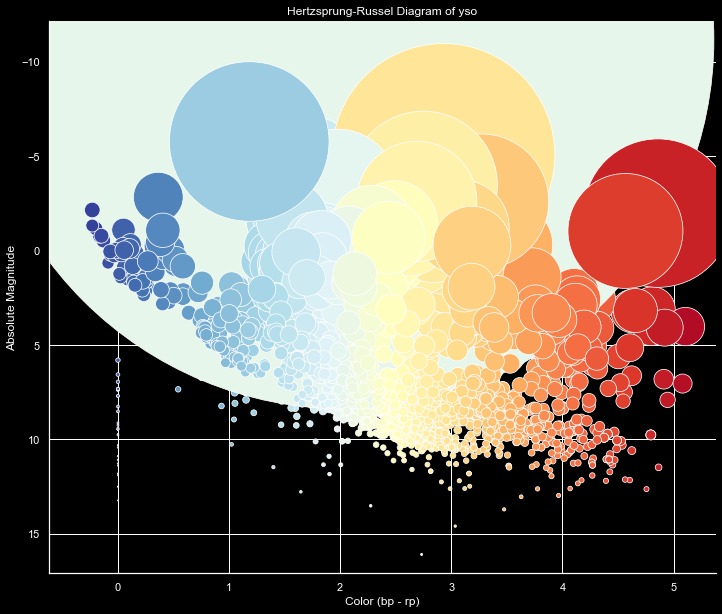

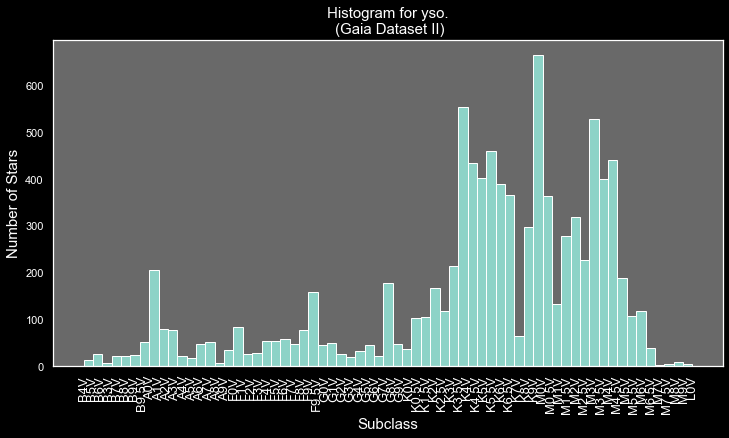

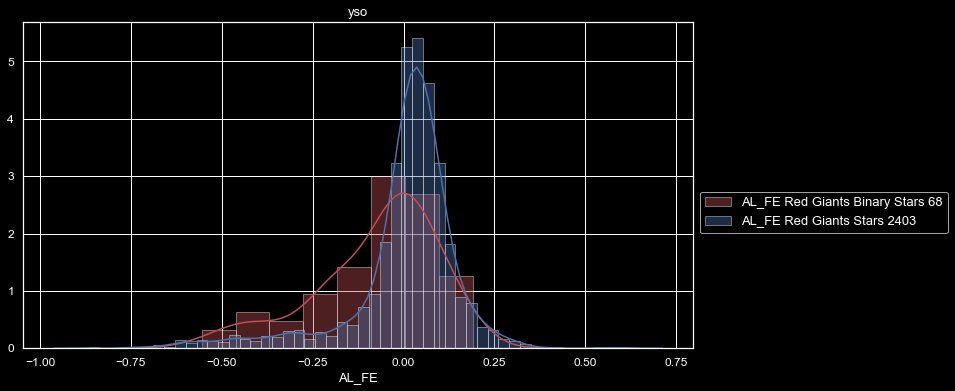


Red Giants Binary AL_FE
count    68.000000
mean     -0.073953
std       0.167961
min      -0.555071
25%      -0.169426
50%      -0.023245
75%       0.033554
max       0.190338
Name: AL_FE, dtype: float64

Red Giants AL_FE
count    2403.000000
mean        0.003062
std         0.151482
min        -0.866132
25%        -0.023515
50%         0.029568
75%         0.078173
max         0.617028
Name: AL_FE, dtype: float64


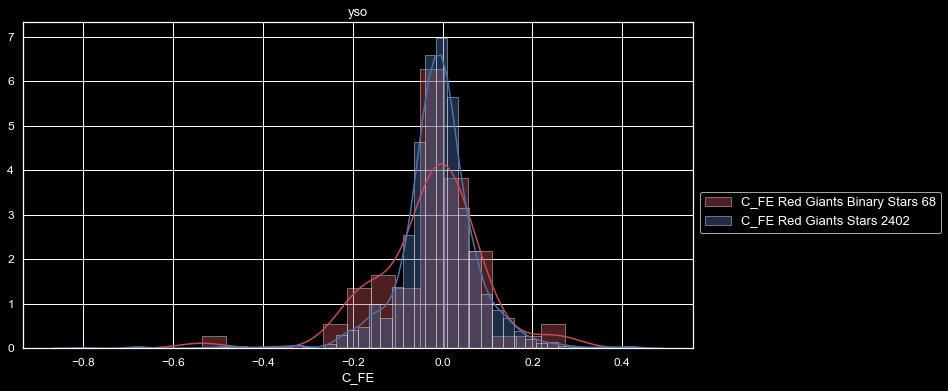


Red Giants Binary C_FE
count    68.000000
mean     -0.028622
std       0.119398
min      -0.536050
25%      -0.079673
50%      -0.012845
75%       0.031316
max       0.271784
Name: C_FE, dtype: float64

Red Giants C_FE
count    2402.000000
mean       -0.011491
std         0.093051
min        -0.806800
25%        -0.047006
50%        -0.008768
75%         0.029594
max         0.430970
Name: C_FE, dtype: float64


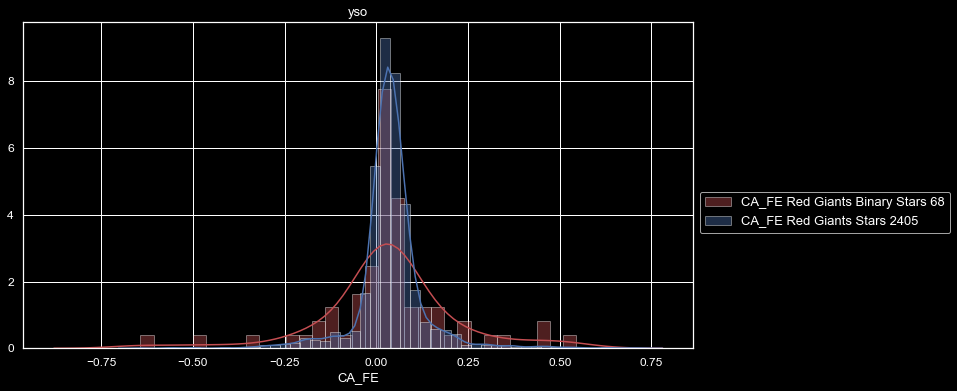


Red Giants Binary CA_FE
count    68.000000
mean      0.031201
std       0.183925
min      -0.643012
25%      -0.000959
50%       0.027145
75%       0.072812
max       0.544948
Name: CA_FE, dtype: float64

Red Giants CA_FE
count    2405.000000
mean        0.039023
std         0.094644
min        -0.643012
25%         0.009570
50%         0.036865
75%         0.066527
max         0.720548
Name: CA_FE, dtype: float64


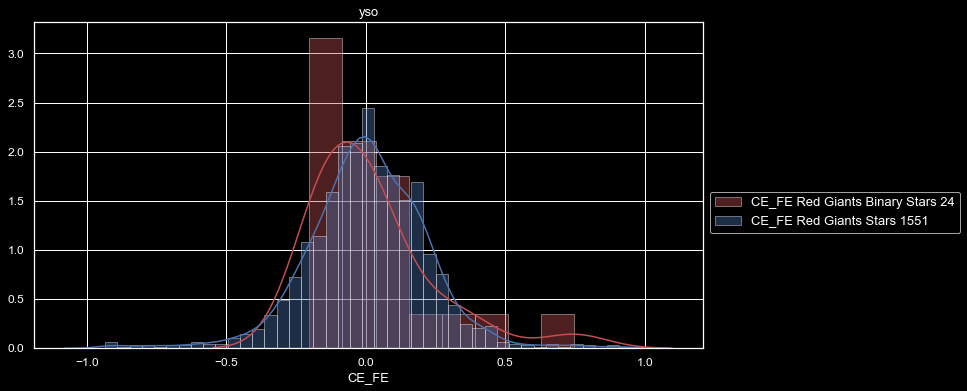


Red Giants Binary CE_FE
count    24.000000
mean      0.018773
std       0.221815
min      -0.202486
25%      -0.129708
50%      -0.043851
75%       0.055580
max       0.746645
Name: CE_FE, dtype: float64

Red Giants CE_FE
count    1551.000000
mean       -0.000854
std         0.250254
min        -2.109195
25%        -0.118630
50%         0.006126
75%         0.141616
max         1.211085
Name: CE_FE, dtype: float64


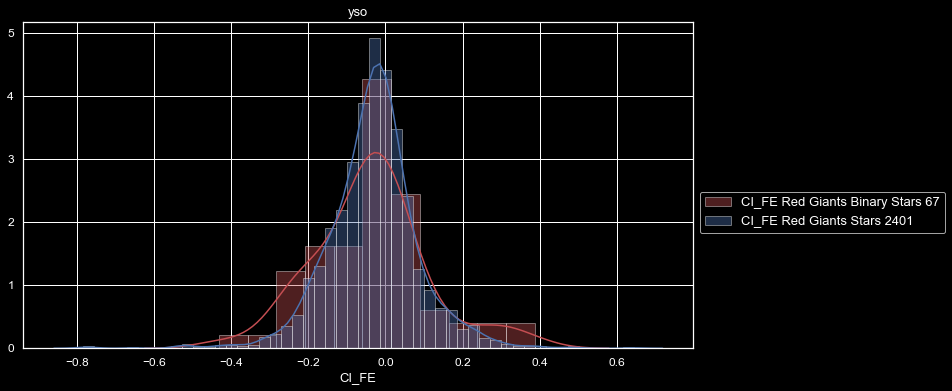


Red Giants Binary CI_FE
count    67.000000
mean     -0.054157
std       0.190982
min      -1.023458
25%      -0.133365
50%      -0.040350
75%       0.025230
max       0.387400
Name: CI_FE, dtype: float64

Red Giants CI_FE
count    2401.000000
mean       -0.032866
std         0.122245
min        -1.115030
25%        -0.093590
50%        -0.027421
75%         0.026574
max         0.644230
Name: CI_FE, dtype: float64


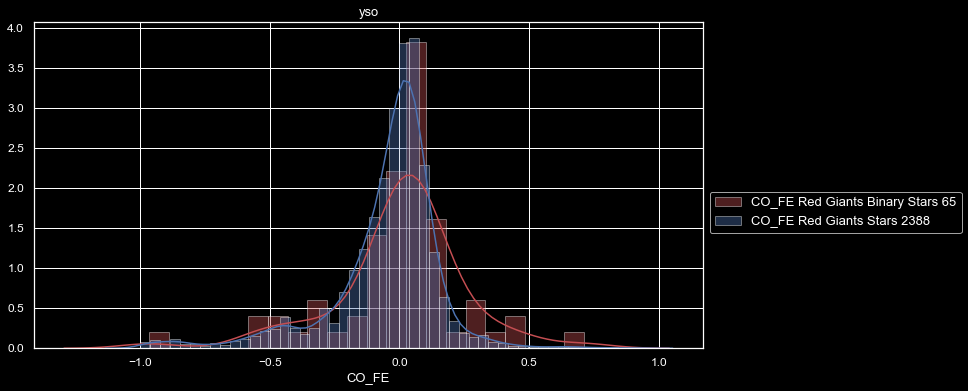


Red Giants Binary CO_FE
count    65.000000
mean      0.000204
std       0.254186
min      -0.965598
25%      -0.058808
50%       0.041144
75%       0.096012
max       0.712525
Name: CO_FE, dtype: float64

Red Giants CO_FE
count    2388.000000
mean       -0.064907
std         0.256590
min        -2.200718
25%        -0.116948
50%        -0.004048
75%         0.058955
max         1.255094
Name: CO_FE, dtype: float64


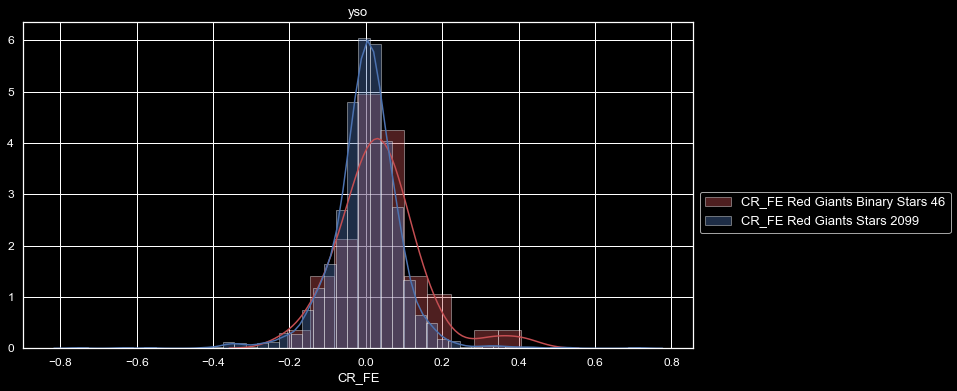


Red Giants Binary CR_FE
count    46.000000
mean      0.034847
std       0.109037
min      -0.207682
25%      -0.020426
50%       0.029538
75%       0.089778
max       0.407203
Name: CR_FE, dtype: float64

Red Giants CR_FE
count    2099.000000
mean        0.000473
std         0.093059
min        -0.756352
25%        -0.041252
50%         0.004468
75%         0.047583
max         0.716538
Name: CR_FE, dtype: float64


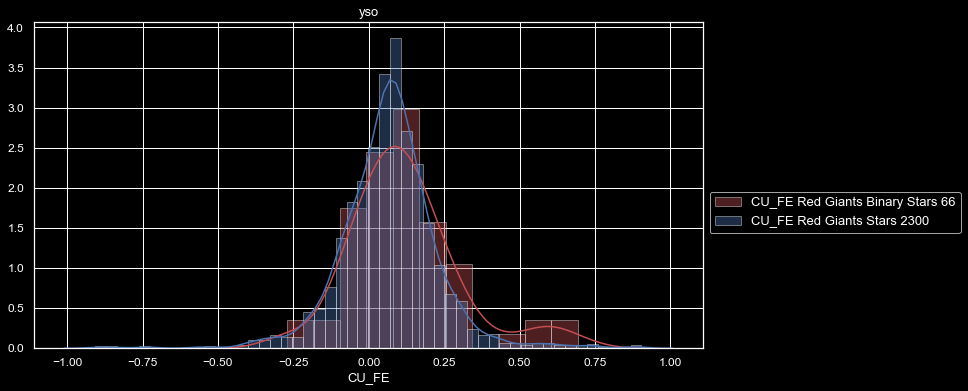


Red Giants Binary CU_FE
count    66.000000
mean      0.135713
std       0.227633
min      -0.272472
25%       0.010850
50%       0.099672
75%       0.191928
max       1.236275
Name: CU_FE, dtype: float64

Red Giants CU_FE
count    2300.000000
mean        0.066259
std         0.169286
min        -1.146473
25%        -0.018155
50%         0.071423
75%         0.148672
max         1.236275
Name: CU_FE, dtype: float64


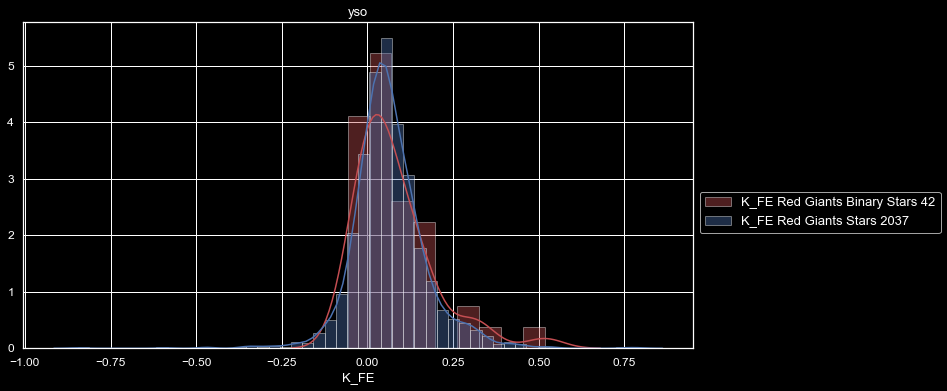


Red Giants Binary K_FE
count    42.000000
mean      0.079514
std       0.116375
min      -0.057695
25%       0.004372
50%       0.046145
75%       0.119465
max       0.516870
Name: K_FE, dtype: float64

Red Giants K_FE
count    2037.000000
mean        0.062561
std         0.113494
min        -1.109316
25%         0.005812
50%         0.053039
75%         0.114200
max         0.791180
Name: K_FE, dtype: float64


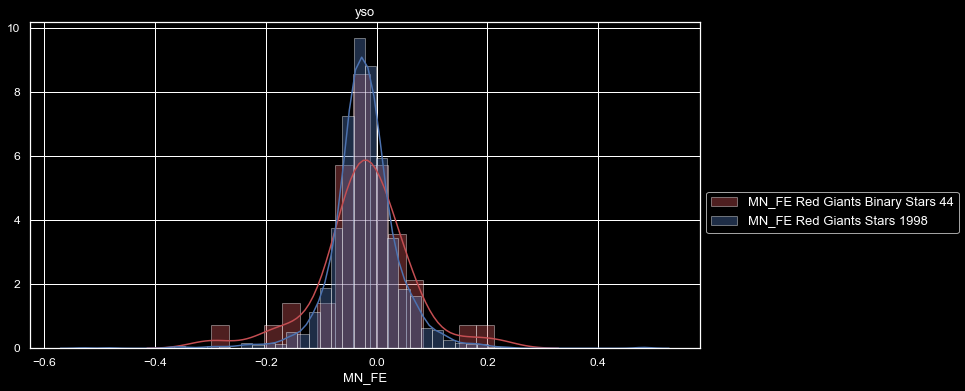


Red Giants Binary MN_FE
count    44.000000
mean     -0.022679
std       0.083569
min      -0.298066
25%      -0.048984
50%      -0.020191
75%       0.010980
max       0.211944
Name: MN_FE, dtype: float64

Red Giants MN_FE
count    1998.000000
mean       -0.021797
std         0.063809
min        -0.528916
25%        -0.049646
50%        -0.023609
75%         0.006008
max         0.486020
Name: MN_FE, dtype: float64


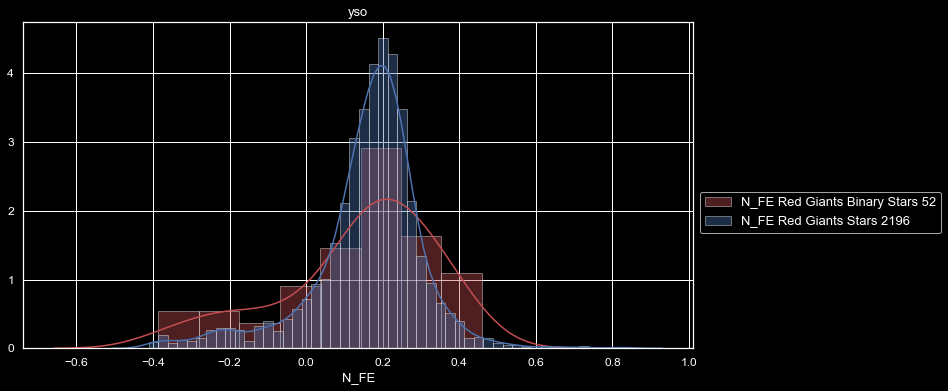


Red Giants Binary N_FE
count    52.000000
mean      0.137489
std       0.202522
min      -0.385857
25%       0.063227
50%       0.179966
75%       0.263227
max       0.458960
Name: N_FE, dtype: float64

Red Giants N_FE
count    2196.000000
mean        0.161072
std         0.145105
min        -0.411457
25%         0.111013
50%         0.181890
75%         0.240332
max         0.837670
Name: N_FE, dtype: float64


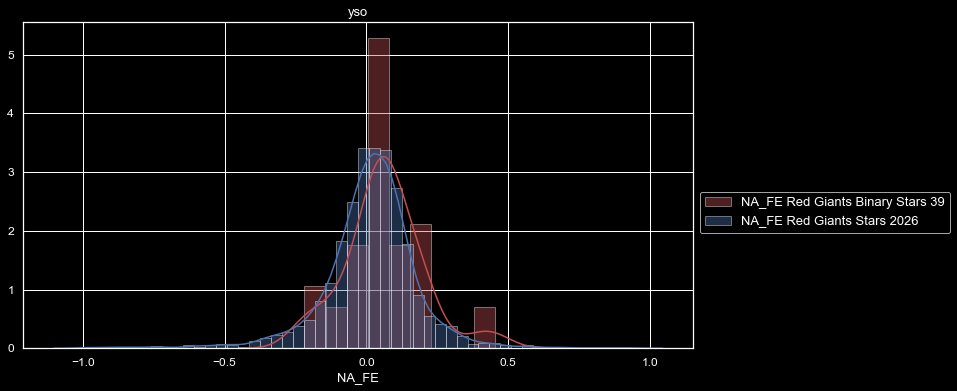


Red Giants Binary NA_FE
count    39.000000
mean      0.032224
std       0.236999
min      -1.144891
25%      -0.010939
50%       0.063444
75%       0.122810
max       0.453316
Name: NA_FE, dtype: float64

Red Giants NA_FE
count    2026.000000
mean        0.005049
std         0.209104
min        -2.285414
25%        -0.057521
50%         0.022557
75%         0.097241
max         1.121726
Name: NA_FE, dtype: float64


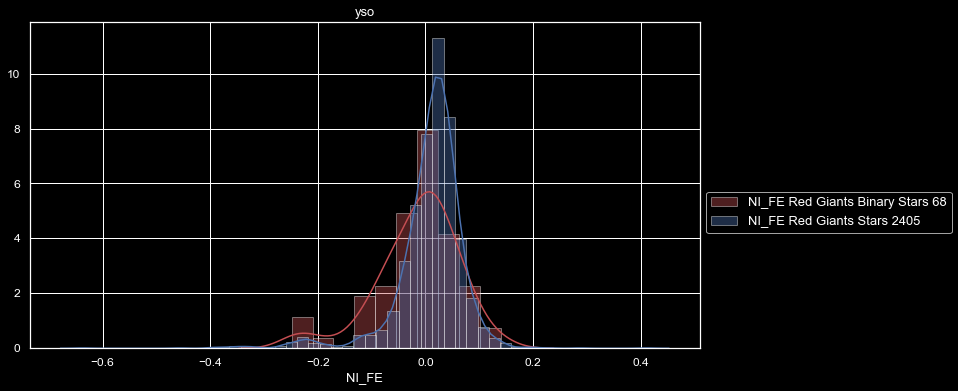


Red Giants Binary NI_FE
count    68.000000
mean     -0.014931
std       0.076612
min      -0.248870
25%      -0.053115
50%      -0.000433
75%       0.029936
max       0.140330
Name: NI_FE, dtype: float64

Red Giants NI_FE
count    2405.000000
mean        0.008762
std         0.069282
min        -1.070138
25%        -0.010718
50%         0.019032
75%         0.043132
max         0.411350
Name: NI_FE, dtype: float64


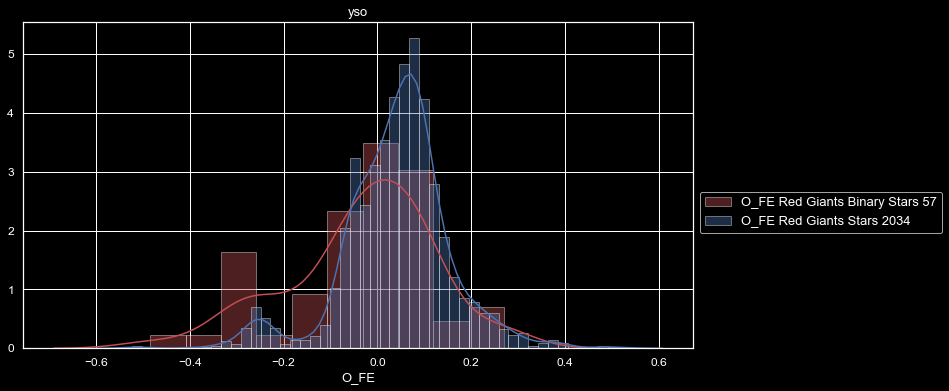


Red Giants Binary O_FE
count    57.000000
mean     -0.033331
std       0.155322
min      -0.483820
25%      -0.078225
50%      -0.019578
75%       0.075515
max       0.269785
Name: O_FE, dtype: float64

Red Giants O_FE
count    2034.000000
mean        0.041501
std         0.114694
min        -0.523855
25%        -0.017460
50%         0.050402
75%         0.100580
max         0.533085
Name: O_FE, dtype: float64


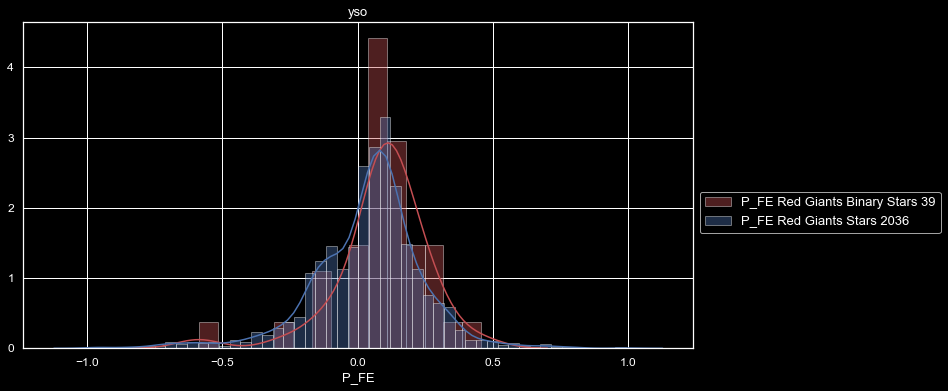


Red Giants Binary P_FE
count    39.000000
mean      0.092526
std       0.172367
min      -0.587313
25%       0.055817
50%       0.102417
75%       0.174926
max       0.456437
Name: P_FE, dtype: float64

Red Giants P_FE
count    2036.000000
mean        0.025003
std         0.243401
min        -1.667653
25%        -0.075105
50%         0.058832
75%         0.140637
max         0.992537
Name: P_FE, dtype: float64


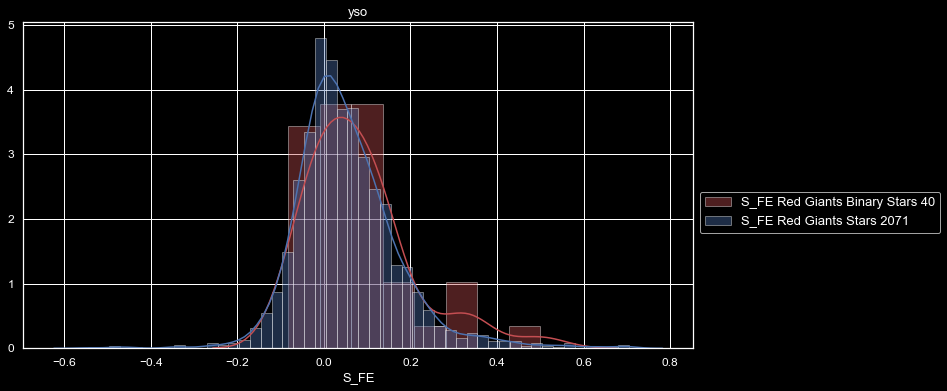


Red Giants Binary S_FE
count    40.000000
mean      0.080393
std       0.123206
min      -0.082204
25%      -0.000897
50%       0.049327
75%       0.127706
max       0.499684
Name: S_FE, dtype: float64

Red Giants S_FE
count    2071.000000
mean        0.053163
std         0.119667
min        -0.546086
25%        -0.018851
50%         0.035748
75%         0.110399
max         0.704814
Name: S_FE, dtype: float64


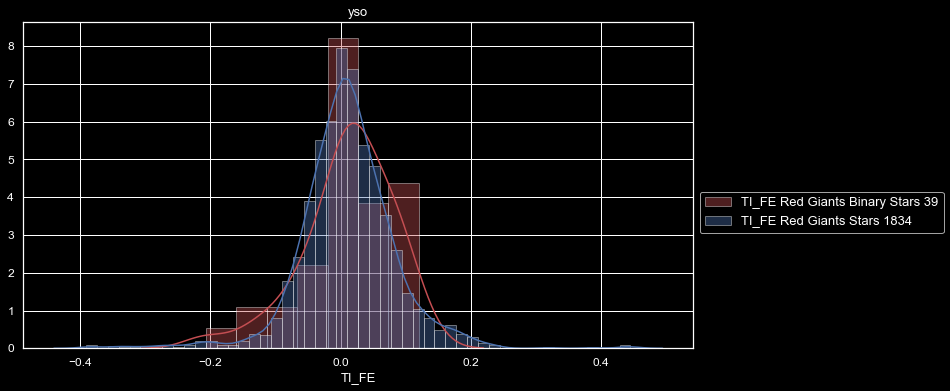


Red Giants Binary TI_FE
count    39.000000
mean      0.011621
std       0.069708
min      -0.206856
25%      -0.016783
50%       0.017276
75%       0.063295
max       0.120432
Name: TI_FE, dtype: float64

Red Giants TI_FE
count    1834.000000
mean        0.010722
std         0.073949
min        -0.390983
25%        -0.027464
50%         0.009080
75%         0.047612
max         0.445411
Name: TI_FE, dtype: float64


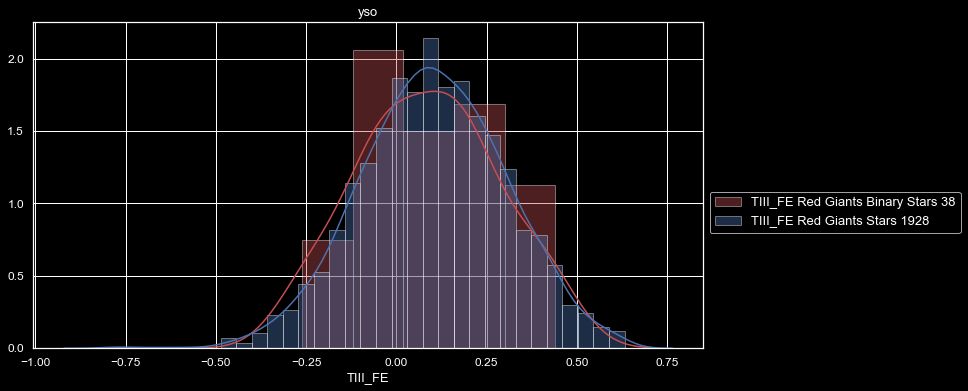


Red Giants Binary TIII_FE
count    38.000000
mean      0.086649
std       0.191039
min      -0.260923
25%      -0.052270
50%       0.088090
75%       0.197122
max       0.441181
Name: TIII_FE, dtype: float64

Red Giants TIII_FE
count    1928.000000
mean        0.102227
std         0.201575
min        -0.787852
25%        -0.033188
50%         0.100390
75%         0.240902
max         0.632525
Name: TIII_FE, dtype: float64


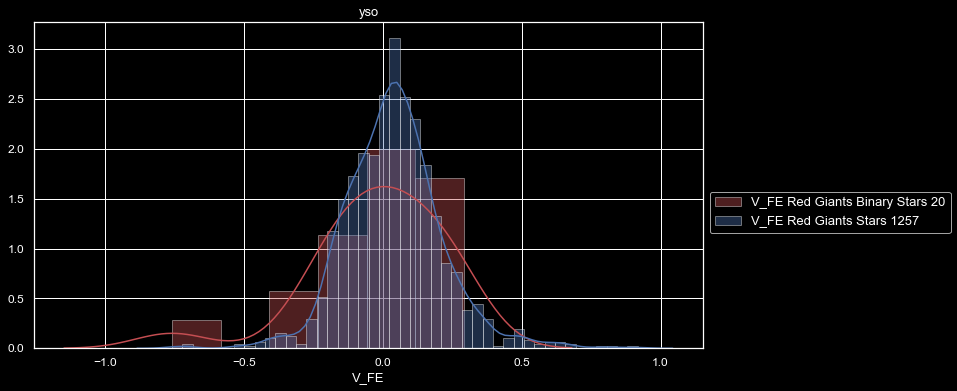


Red Giants Binary V_FE
count    20.000000
mean     -0.020398
std       0.241939
min      -0.760237
25%      -0.126727
50%      -0.025046
75%       0.132321
max       0.291983
Name: V_FE, dtype: float64

Red Giants V_FE
count    1257.000000
mean        0.039430
std         0.177492
min        -0.760237
25%        -0.069837
50%         0.035223
75%         0.132033
max         1.180643
Name: V_FE, dtype: float64


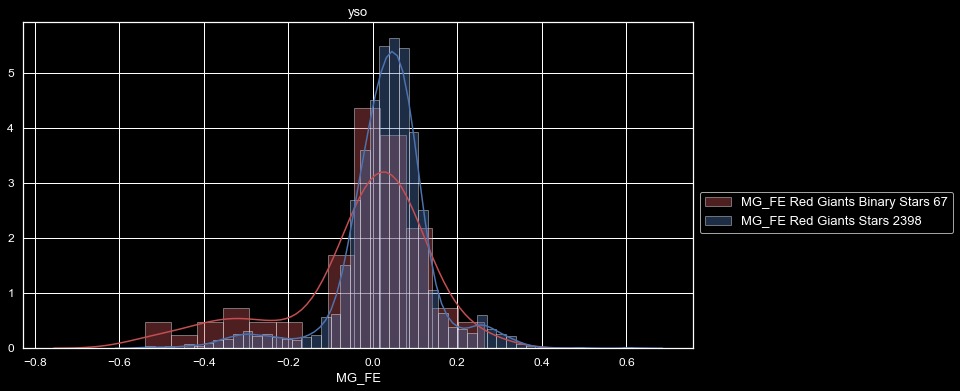


Red Giants Binary MG_FE
count    67.000000
mean     -0.033402
std       0.168266
min      -0.538749
25%      -0.067467
50%       0.012125
75%       0.065641
max       0.263412
Name: MG_FE, dtype: float64

Red Giants MG_FE
count    2398.000000
mean        0.031237
std         0.111093
min        -0.538749
25%        -0.012125
50%         0.038944
75%         0.083586
max         0.615451
Name: MG_FE, dtype: float64


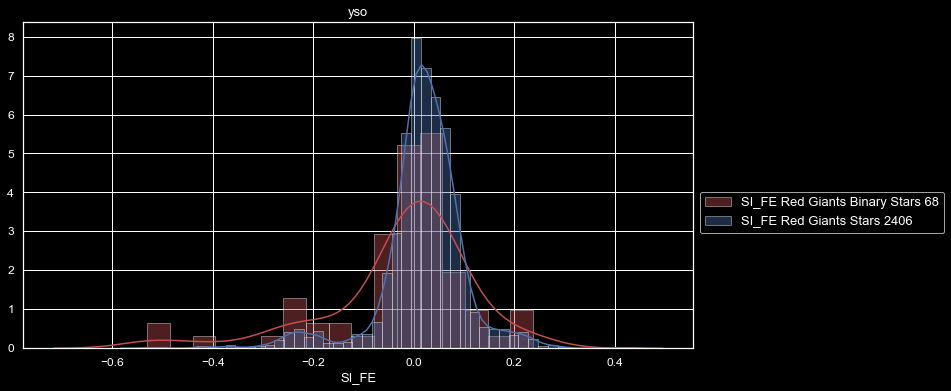


Red Giants Binary SI_FE
count    68.000000
mean     -0.025807
std       0.145412
min      -0.530219
25%      -0.050049
50%      -0.004226
75%       0.046879
max       0.237472
Name: SI_FE, dtype: float64

Red Giants SI_FE
count    2406.000000
mean        0.019130
std         0.084909
min        -0.530219
25%        -0.009296
50%         0.022928
75%         0.060633
max         0.442071
Name: SI_FE, dtype: float64


13 seconds elapsed


In [31]:
Detail_View(field_list, red_giants_binary, "Red Giants Binary", red_giants, "Red Giants",)


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


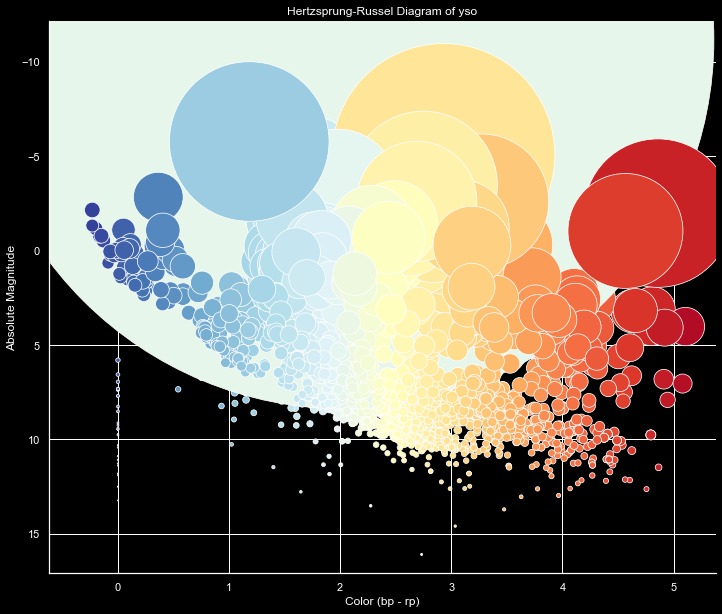

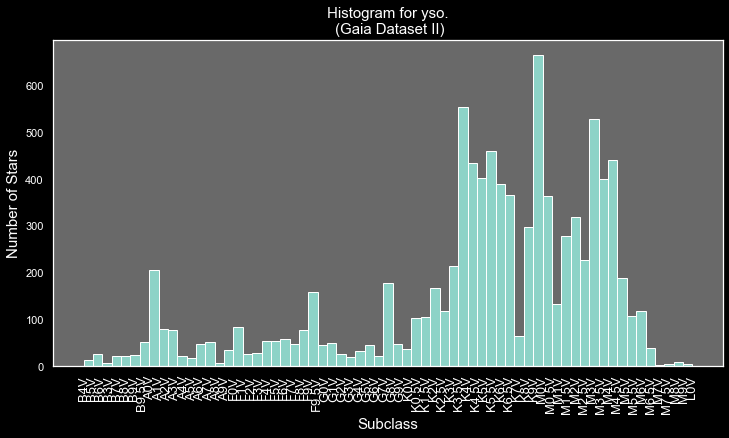

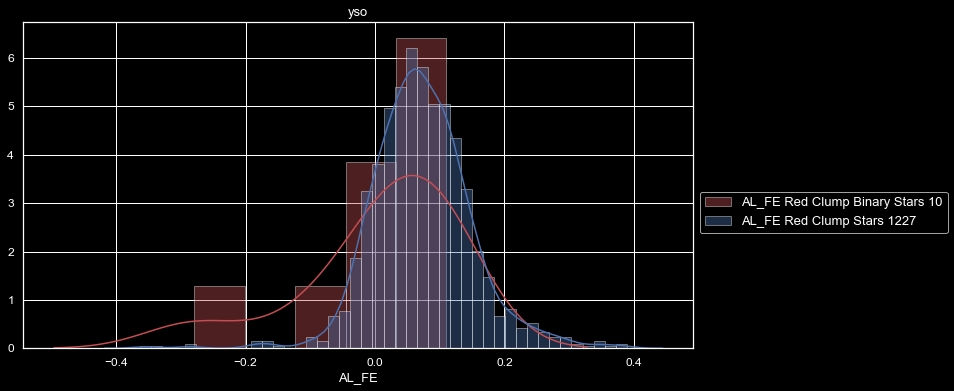


Red Clump Binary AL_FE
count    10.000000
mean      0.008857
std       0.120986
min      -0.278971
25%       0.001028
50%       0.032864
75%       0.096688
max       0.110458
Name: AL_FE, dtype: float64

Red Clump AL_FE
count    1227.000000
mean        0.072581
std         0.076662
min        -0.362692
25%         0.023988
50%         0.069019
75%         0.116413
max         0.388988
Name: AL_FE, dtype: float64


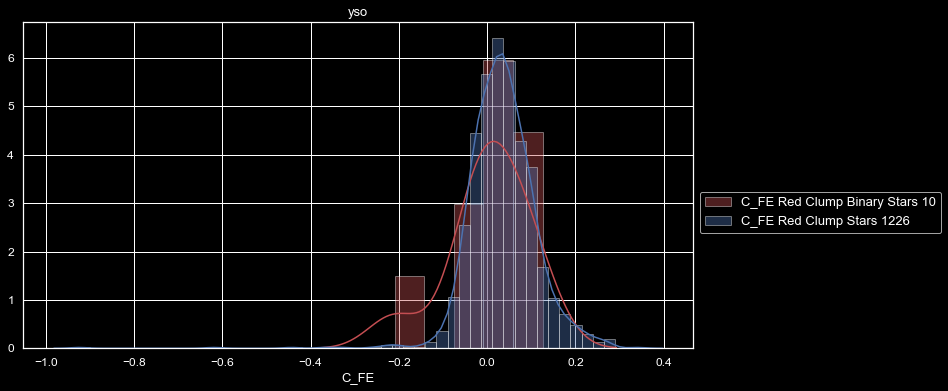


Red Clump Binary C_FE
count    10.000000
mean      0.002284
std       0.093184
min      -0.209782
25%      -0.030839
50%       0.007693
75%       0.057850
max       0.125320
Name: C_FE, dtype: float64

Red Clump C_FE
count    1226.000000
mean        0.034339
std         0.079172
min        -0.924110
25%        -0.010278
50%         0.032016
75%         0.076630
max         0.340060
Name: C_FE, dtype: float64


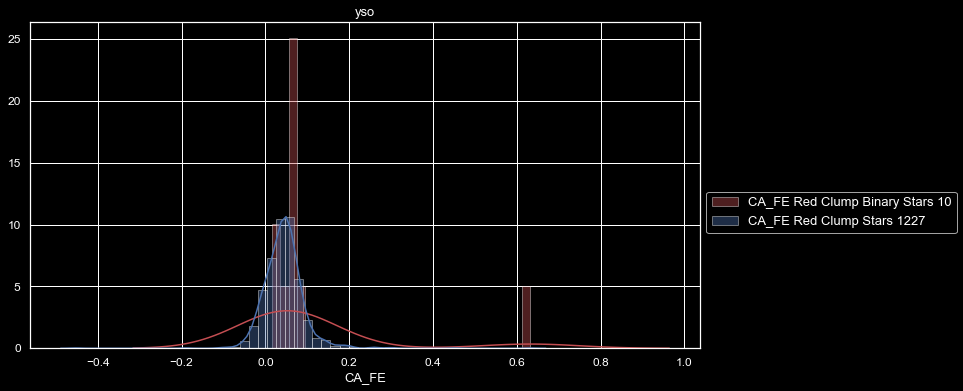


Red Clump Binary CA_FE
count    10.000000
mean      0.110165
std       0.184648
min       0.015726
25%       0.043969
50%       0.061436
75%       0.065819
max       0.632678
Name: CA_FE, dtype: float64

Red Clump CA_FE
count    1227.000000
mean        0.044012
std         0.050609
min        -0.451942
25%         0.016401
50%         0.043269
75%         0.065720
max         0.632678
Name: CA_FE, dtype: float64


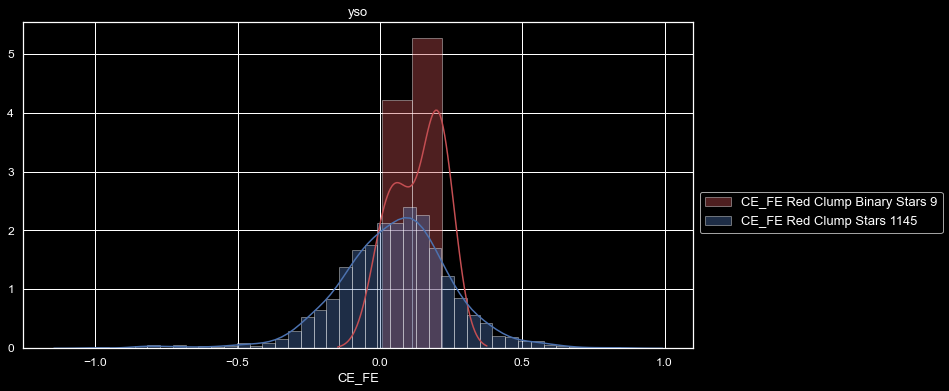


Red Clump Binary CE_FE
count    9.000000
mean     0.134356
std      0.086042
min      0.008245
25%      0.073670
50%      0.184285
75%      0.207037
max      0.218956
Name: CE_FE, dtype: float64

Red Clump CE_FE
count    1145.000000
mean        0.048631
std         0.210279
min        -1.088115
25%        -0.065702
50%         0.063408
75%         0.170627
max         0.844475
Name: CE_FE, dtype: float64


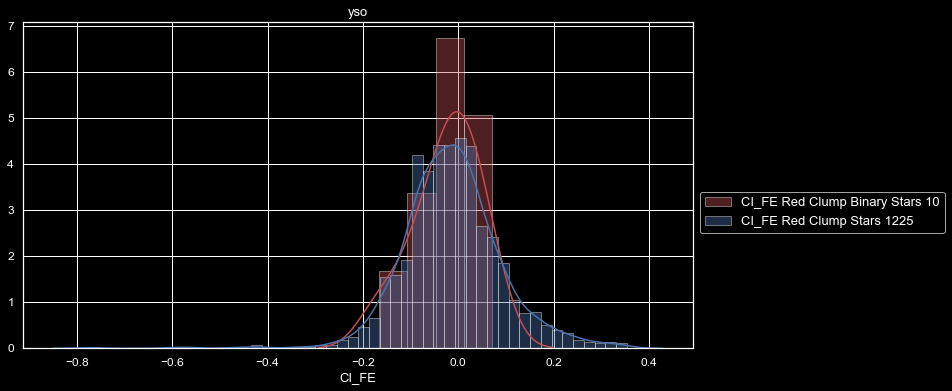


Red Clump Binary CI_FE
count    10.000000
mean     -0.024949
std       0.070833
min      -0.166055
25%      -0.061362
50%      -0.011507
75%       0.017074
max       0.070909
Name: CI_FE, dtype: float64

Red Clump CI_FE
count    1225.000000
mean       -0.014139
std         0.108064
min        -1.042210
25%        -0.076216
50%        -0.015605
75%         0.040480
max         0.353300
Name: CI_FE, dtype: float64


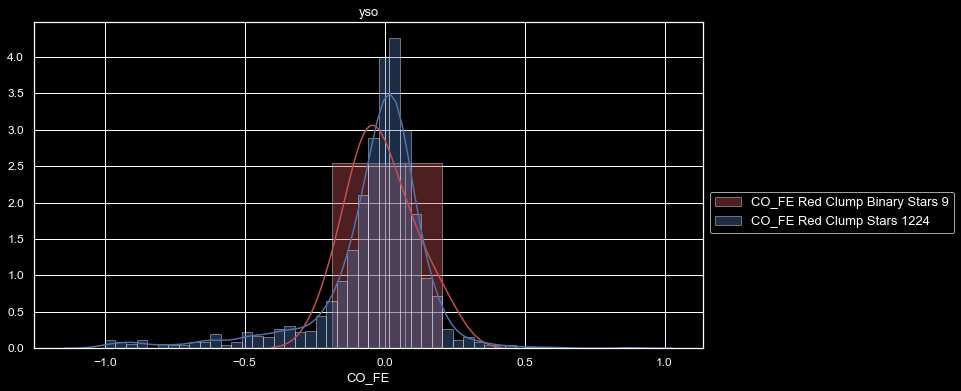


Red Clump Binary CO_FE
count    9.000000
mean    -0.011329
std      0.117301
min     -0.188875
25%     -0.091118
50%     -0.031818
75%      0.074032
max      0.204222
Name: CO_FE, dtype: float64

Red Clump CO_FE
count    1224.000000
mean       -0.049088
std         0.237626
min        -2.100788
25%        -0.086108
50%        -0.000418
75%         0.061462
max         0.883272
Name: CO_FE, dtype: float64


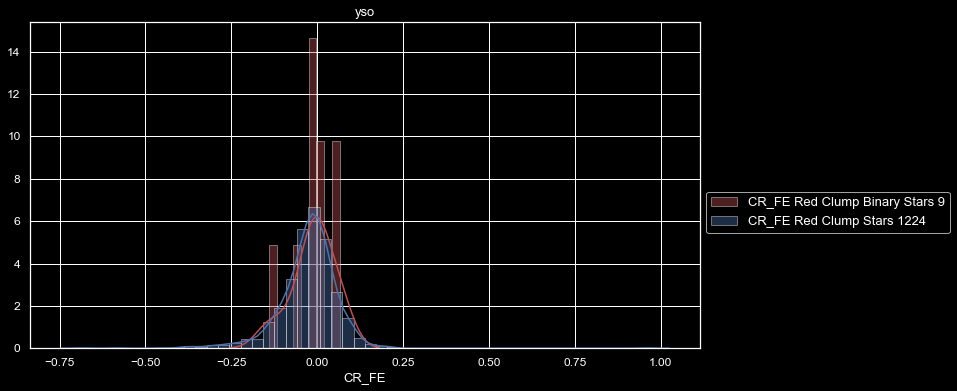


Red Clump Binary CR_FE
count    9.000000
mean    -0.011631
std      0.062693
min     -0.139122
25%     -0.016262
50%     -0.006282
75%      0.010106
max      0.065598
Name: CR_FE, dtype: float64

Red Clump CR_FE
count    1224.000000
mean       -0.025845
std         0.088038
min        -0.683442
25%        -0.061619
50%        -0.016995
75%         0.020901
max         0.960798
Name: CR_FE, dtype: float64


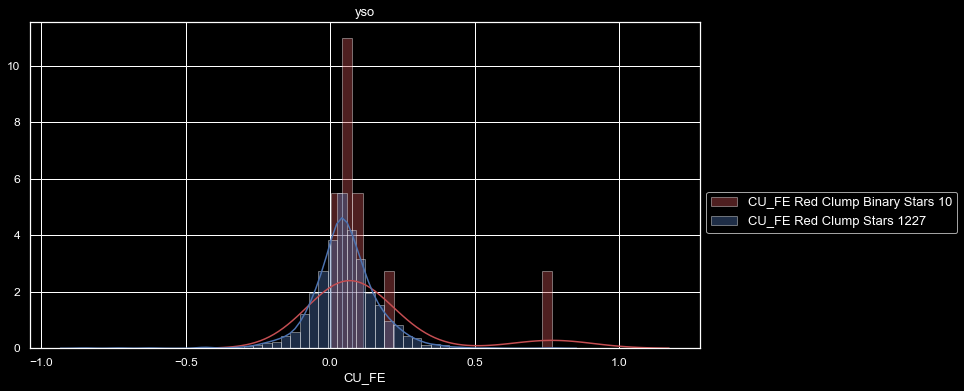


Red Clump Binary CU_FE
count    10.000000
mean      0.140542
std       0.225474
min       0.003539
25%       0.052010
50%       0.063447
75%       0.092370
max       0.767466
Name: CU_FE, dtype: float64

Red Clump CU_FE
count    1227.000000
mean        0.047995
std         0.127892
min        -1.395652
25%        -0.008454
50%         0.046593
75%         0.108413
max         0.767466
Name: CU_FE, dtype: float64


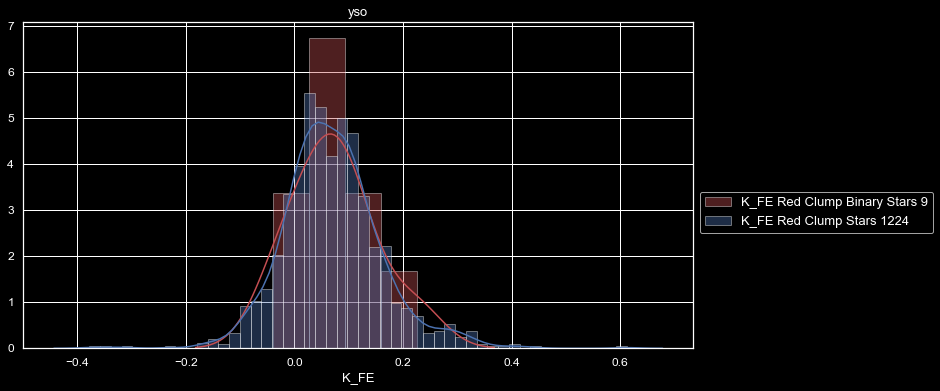


Red Clump Binary K_FE
count    9.000000
mean     0.073113
std      0.078540
min     -0.038790
25%      0.028340
50%      0.074120
75%      0.102780
max      0.225110
Name: K_FE, dtype: float64

Red Clump K_FE
count    1224.000000
mean        0.069639
std         0.090602
min        -0.377110
25%         0.014767
50%         0.063355
75%         0.116532
max         0.612430
Name: K_FE, dtype: float64


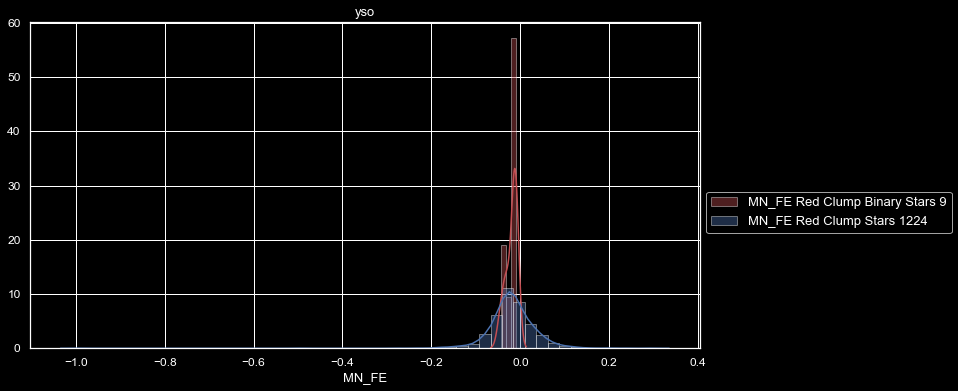


Red Clump Binary MN_FE
count    9.000000
mean    -0.019825
std      0.012490
min     -0.044236
25%     -0.029433
50%     -0.013706
75%     -0.011606
max     -0.009316
Name: MN_FE, dtype: float64

Red Clump MN_FE
count    1224.000000
mean       -0.019196
std         0.058086
min        -0.992156
25%        -0.043361
50%        -0.020456
75%         0.006027
max         0.292874
Name: MN_FE, dtype: float64


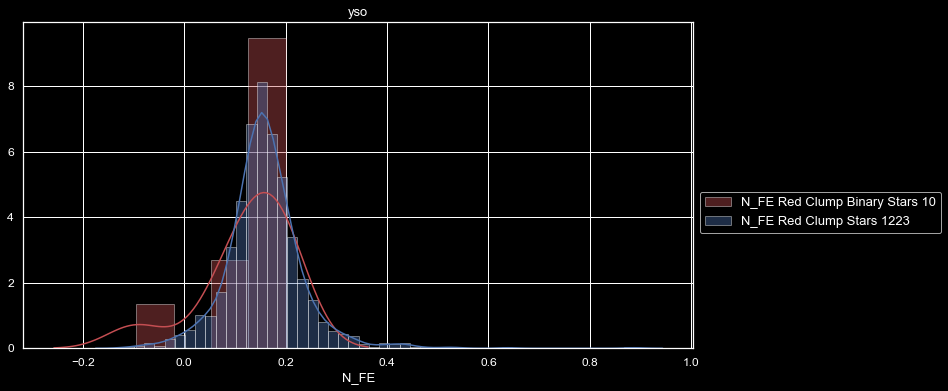


Red Clump Binary N_FE
count    10.000000
mean      0.124307
std       0.090370
min      -0.094982
25%       0.102322
50%       0.141560
75%       0.192772
max       0.200450
Name: N_FE, dtype: float64

Red Clump N_FE
count    1223.000000
mean        0.158559
std         0.076603
min        -0.119554
25%         0.120900
50%         0.155960
75%         0.194410
max         0.888100
Name: N_FE, dtype: float64


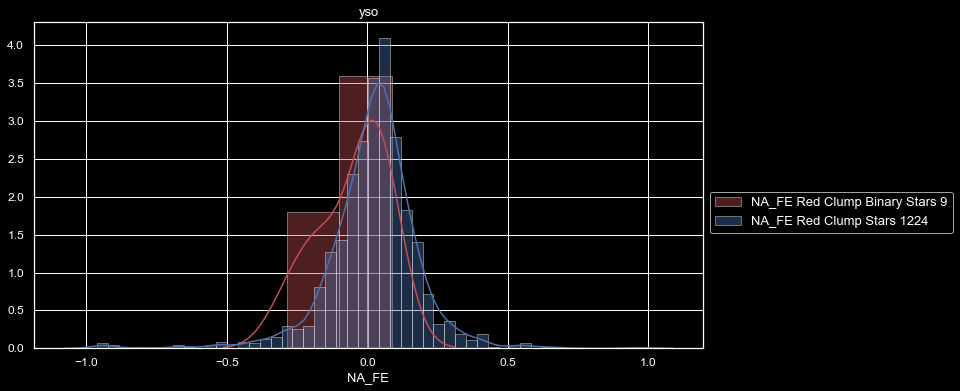


Red Clump Binary NA_FE
count    9.000000
mean    -0.054941
std      0.125358
min     -0.285284
25%     -0.166744
50%     -0.004733
75%      0.038626
max      0.085746
Name: NA_FE, dtype: float64

Red Clump NA_FE
count    1224.000000
mean        0.016055
std         0.180722
min        -1.560214
25%        -0.053235
50%         0.033294
75%         0.101086
max         0.968806
Name: NA_FE, dtype: float64


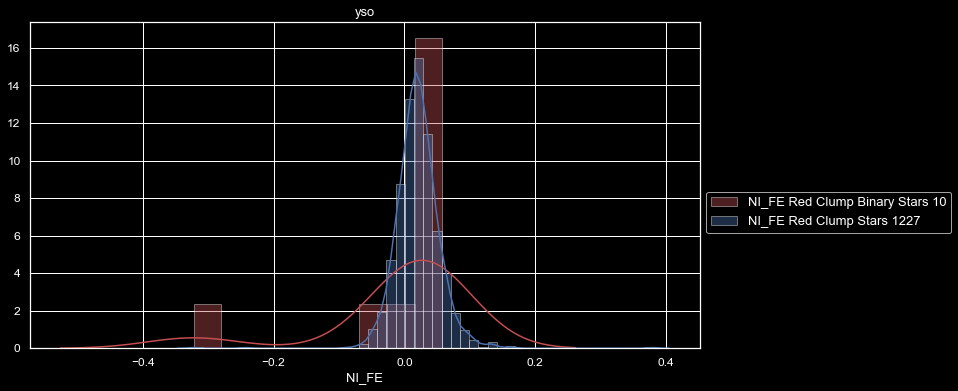


Red Clump Binary NI_FE
count    10.000000
mean     -0.009468
std       0.113283
min      -0.322471
25%      -0.000465
50%       0.024952
75%       0.047150
max       0.058252
Name: NI_FE, dtype: float64

Red Clump NI_FE
count    1227.000000
mean        0.020727
std         0.034405
min        -0.322471
25%         0.002417
50%         0.019362
75%         0.038112
max         0.380282
Name: NI_FE, dtype: float64


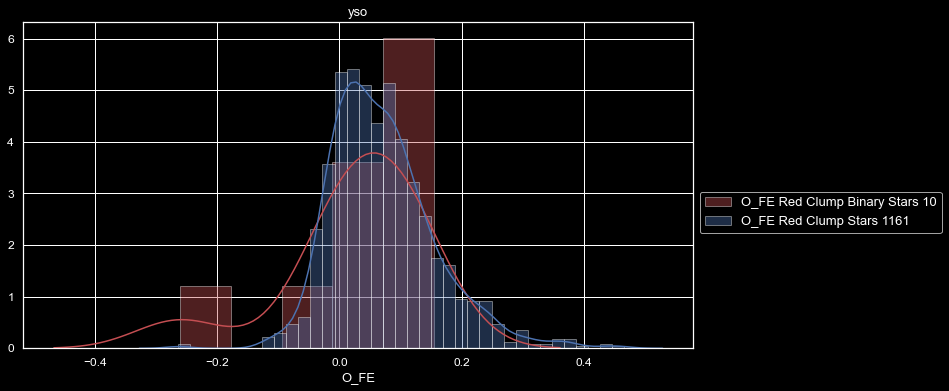


Red Clump Binary O_FE
count    10.000000
mean      0.024424
std       0.115128
min      -0.260911
25%      -0.000983
50%       0.048194
75%       0.091922
max       0.154515
Name: O_FE, dtype: float64

Red Clump O_FE
count    1161.000000
mean        0.070349
std         0.085611
min        -0.265125
25%         0.010005
50%         0.059413
75%         0.115585
max         0.466475
Name: O_FE, dtype: float64


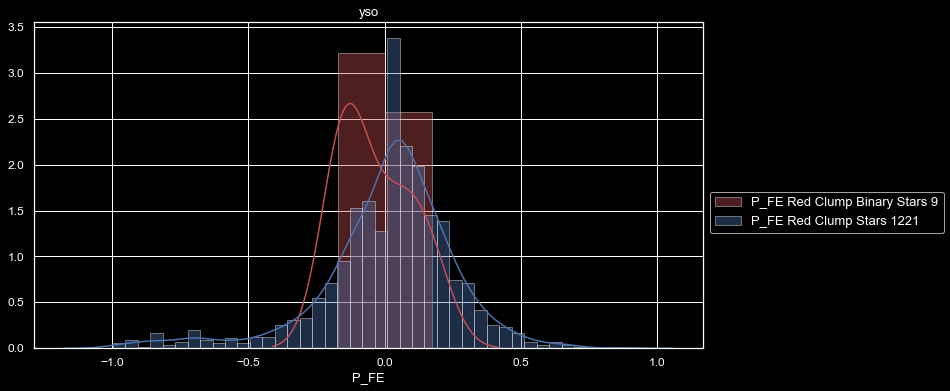


Red Clump Binary P_FE
count    9.000000
mean    -0.035777
std      0.131537
min     -0.171373
25%     -0.149513
50%     -0.105620
75%      0.036187
max      0.174497
Name: P_FE, dtype: float64

Red Clump P_FE
count    1221.000000
mean       -0.003544
std         0.285698
min        -1.677253
25%        -0.100473
50%         0.035897
75%         0.151447
max         1.121477
Name: P_FE, dtype: float64


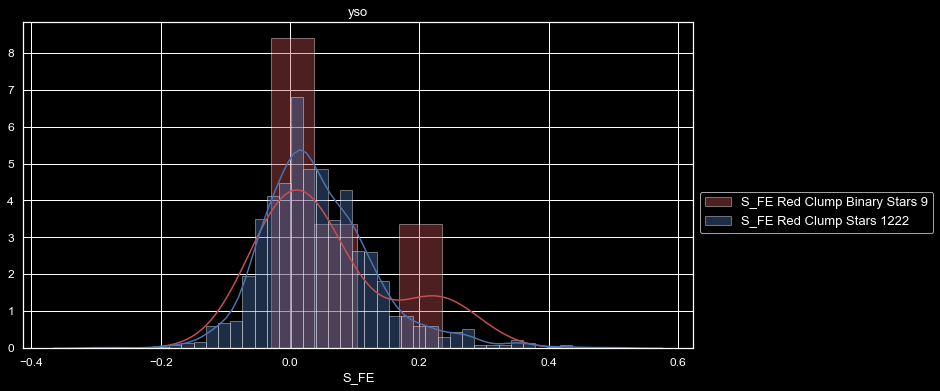


Red Clump Binary S_FE
count    9.000000
mean     0.059698
std      0.100046
min     -0.029058
25%     -0.008800
50%      0.035967
75%      0.062706
max      0.235294
Name: S_FE, dtype: float64

Red Clump S_FE
count    1222.000000
mean        0.044875
std         0.089735
min        -0.300226
25%        -0.012617
50%         0.032004
75%         0.090344
max         0.511244
Name: S_FE, dtype: float64


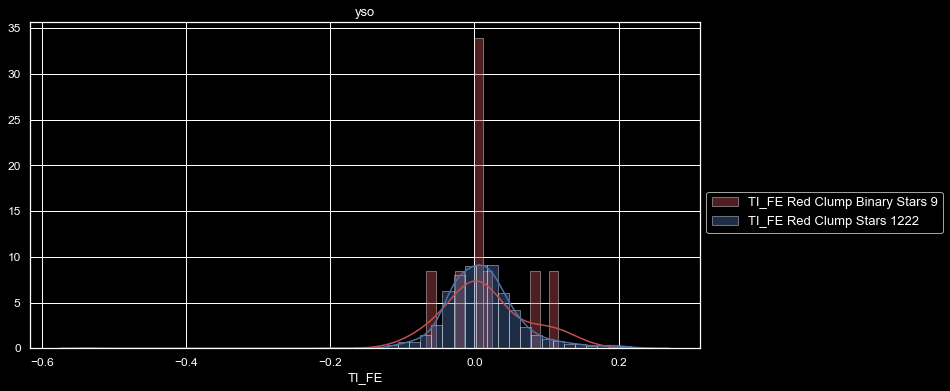


Red Clump Binary TI_FE
count    9.000000
mean     0.015736
std      0.054635
min     -0.066594
25%     -0.001144
50%      0.006783
75%      0.012784
max      0.116538
Name: TI_FE, dtype: float64

Red Clump TI_FE
count    1222.000000
mean        0.011118
std         0.052877
min        -0.535779
25%        -0.020813
50%         0.007222
75%         0.035590
max         0.232151
Name: TI_FE, dtype: float64


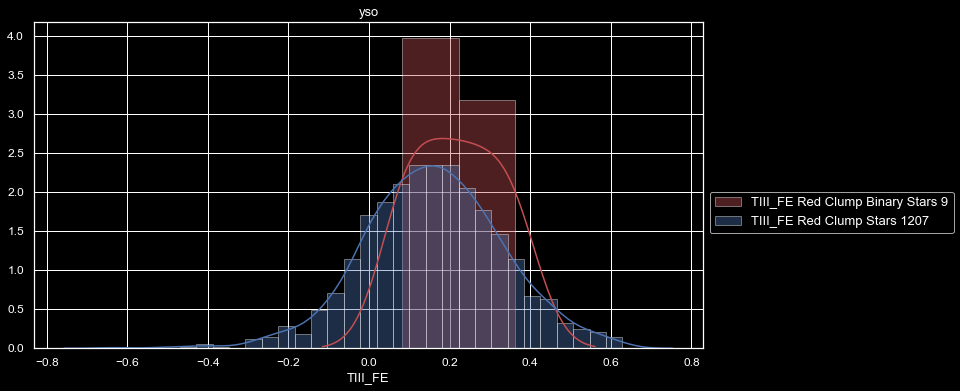


Red Clump Binary TIII_FE
count    9.000000
mean     0.219787
std      0.108870
min      0.082985
25%      0.111105
50%      0.206215
75%      0.306465
max      0.362535
Name: TIII_FE, dtype: float64

Red Clump TIII_FE
count    1207.000000
mean        0.159288
std         0.172050
min        -0.632152
25%         0.049762
50%         0.158344
75%         0.271475
max         0.629025
Name: TIII_FE, dtype: float64


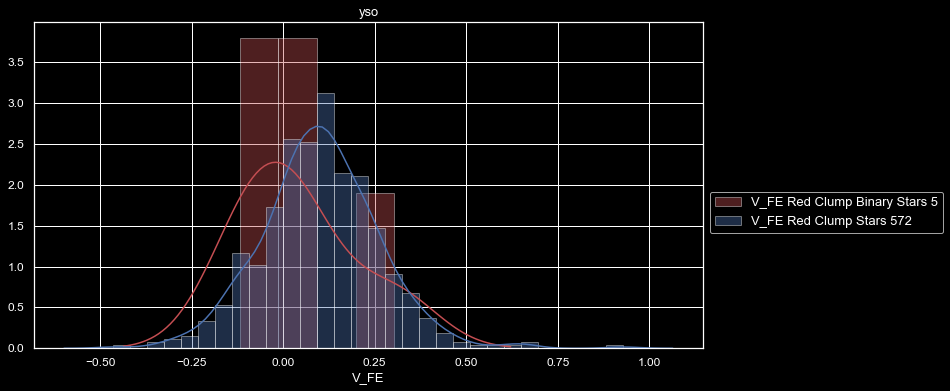


Red Clump Binary V_FE
count    5.000000
mean     0.039078
std      0.163679
min     -0.118077
25%     -0.073674
50%      0.041973
75%      0.042013
max      0.303153
Name: V_FE, dtype: float64

Red Clump V_FE
count    572.000000
mean       0.101585
std        0.159880
min       -0.463987
25%        0.009559
50%        0.101447
75%        0.202442
max        0.929413
Name: V_FE, dtype: float64


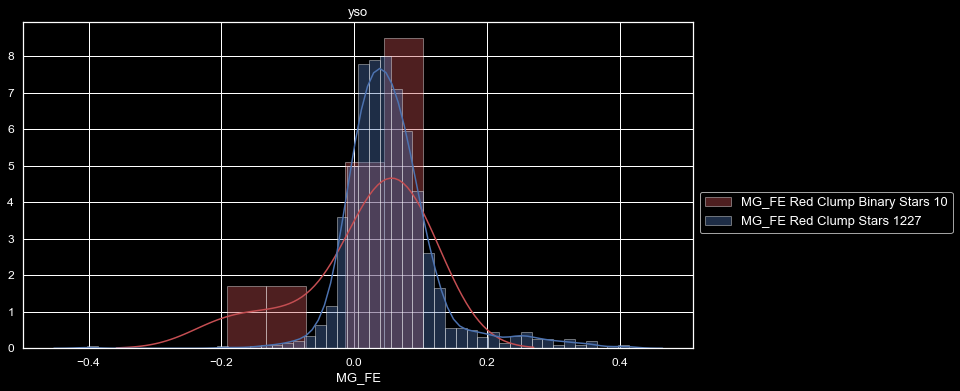


Red Clump Binary MG_FE
count    10.000000
mean      0.016747
std       0.093150
min      -0.190989
25%       0.007874
50%       0.042725
75%       0.078430
max       0.102959
Name: MG_FE, dtype: float64

Red Clump MG_FE
count    1227.000000
mean        0.054814
std         0.069630
min        -0.401898
25%         0.013763
50%         0.046471
75%         0.081060
max         0.413902
Name: MG_FE, dtype: float64


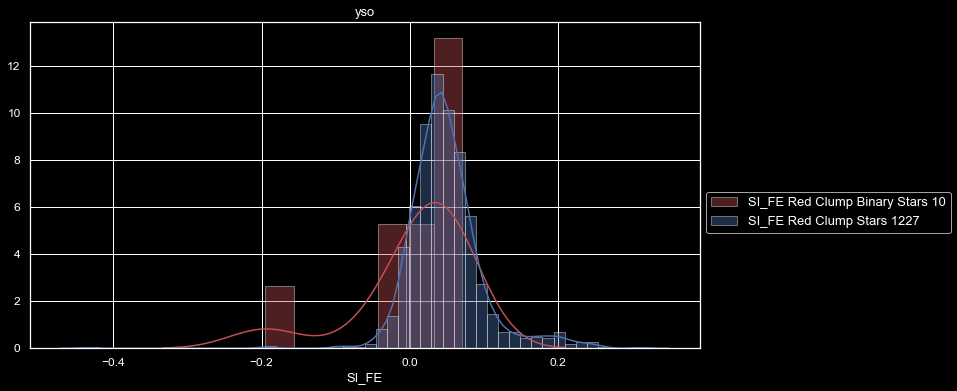


Red Clump Binary SI_FE
count    10.000000
mean      0.006083
std       0.077395
min      -0.194781
25%       0.000536
50%       0.032864
75%       0.042422
max       0.070151
Name: SI_FE, dtype: float64

Red Clump SI_FE
count    1227.000000
mean        0.048210
std         0.050298
min        -0.434948
25%         0.020193
50%         0.042993
75%         0.068608
max         0.313642
Name: SI_FE, dtype: float64


13 seconds elapsed


In [32]:
Detail_View(field_list, red_clump_binary, "Red Clump Binary", red_clump, "Red Clump",)


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


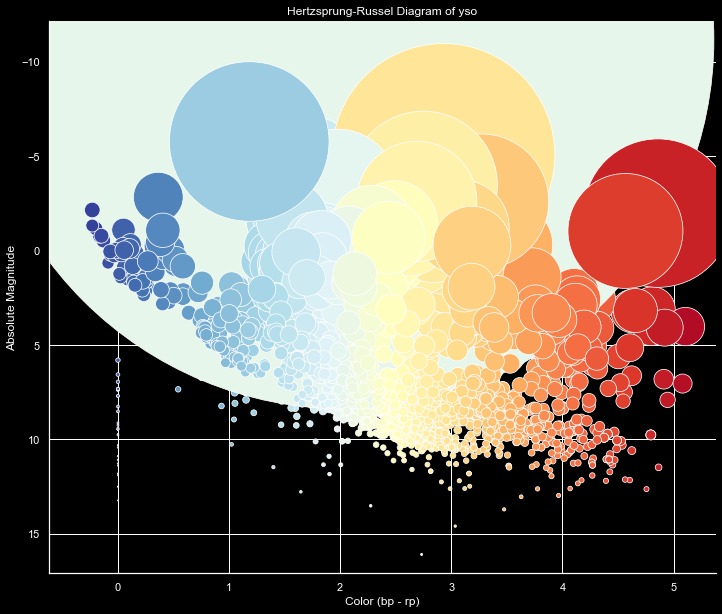

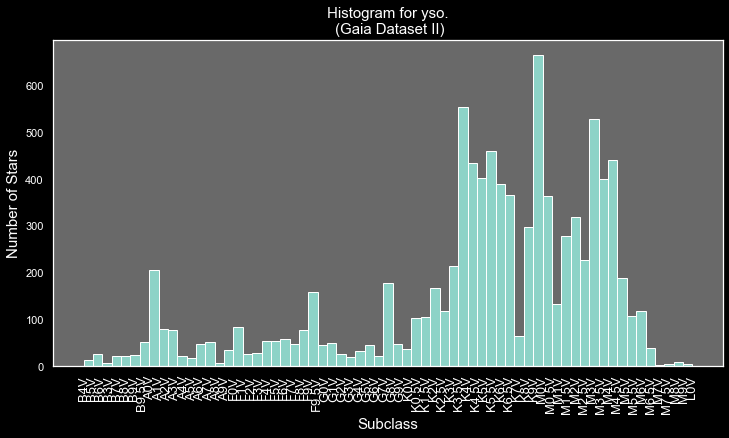

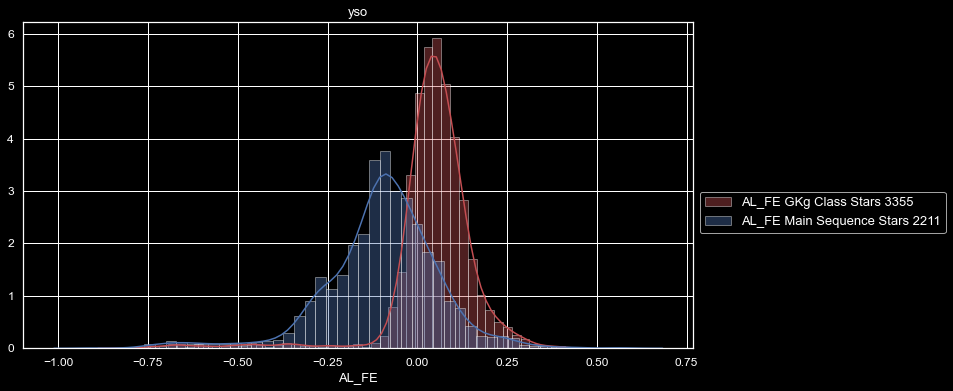


GKg Class AL_FE
count    3355.000000
mean        0.045620
std         0.121357
min        -0.817401
25%         0.009096
50%         0.052115
75%         0.100619
max         0.410338
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


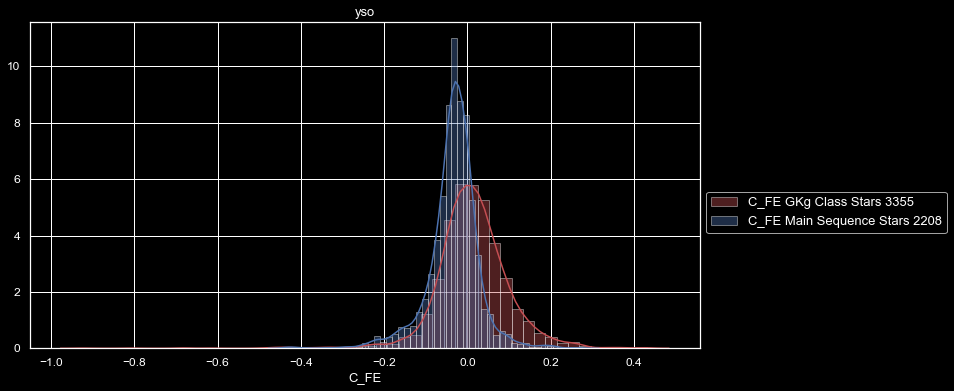


GKg Class C_FE
count    3355.000000
mean        0.012178
std         0.089618
min        -0.924110
25%        -0.032194
50%         0.010593
75%         0.057435
max         0.430970
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


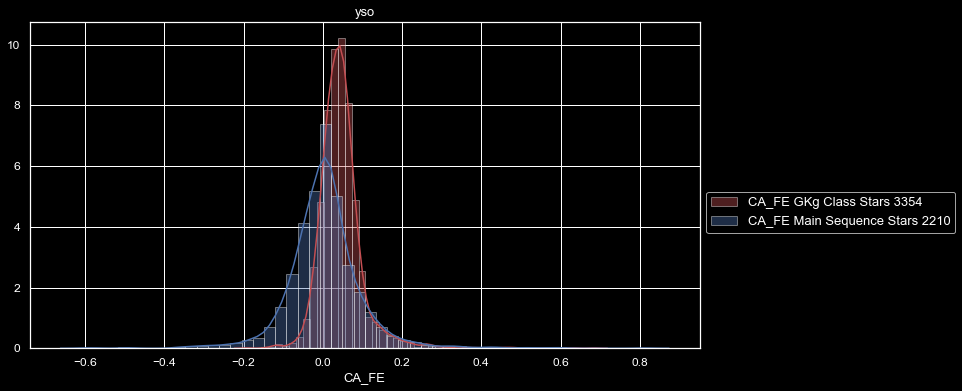


GKg Class CA_FE
count    3354.000000
mean        0.045423
std         0.056798
min        -0.189682
25%         0.014383
50%         0.040105
75%         0.065809
max         0.684779
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


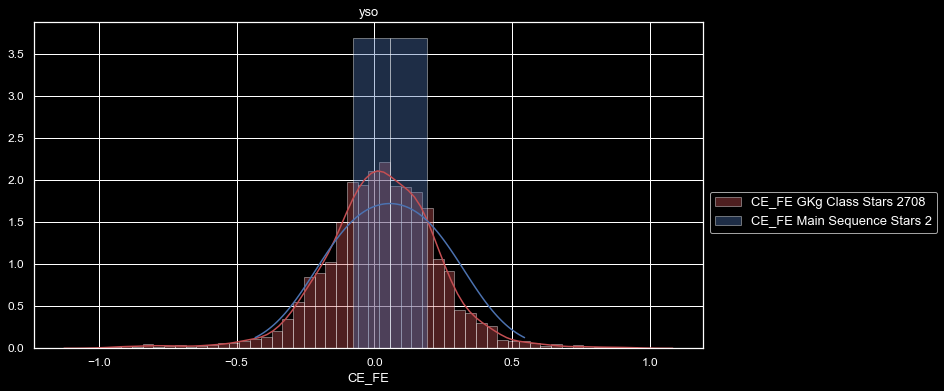


GKg Class CE_FE
count    2708.000000
mean        0.020628
std         0.233302
min        -2.109195
25%        -0.095808
50%         0.026875
75%         0.156173
max         1.211085
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


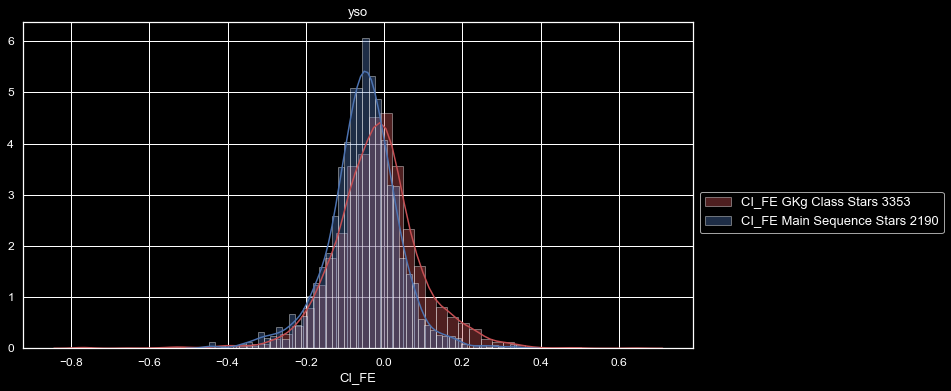


GKg Class CI_FE
count    3353.000000
mean       -0.019889
std         0.116992
min        -1.115030
25%        -0.082956
50%        -0.019552
75%         0.039909
max         0.644230
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


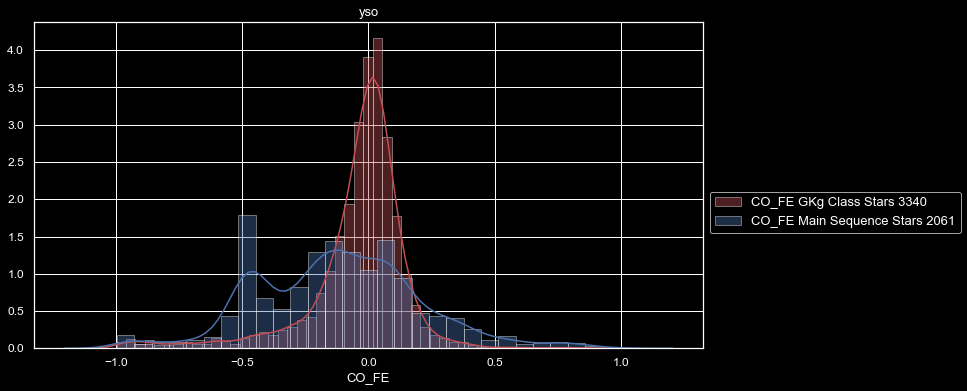


GKg Class CO_FE
count    3340.000000
mean       -0.054946
std         0.244565
min        -2.200718
25%        -0.094580
50%        -0.002063
75%         0.059691
max         1.255094
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


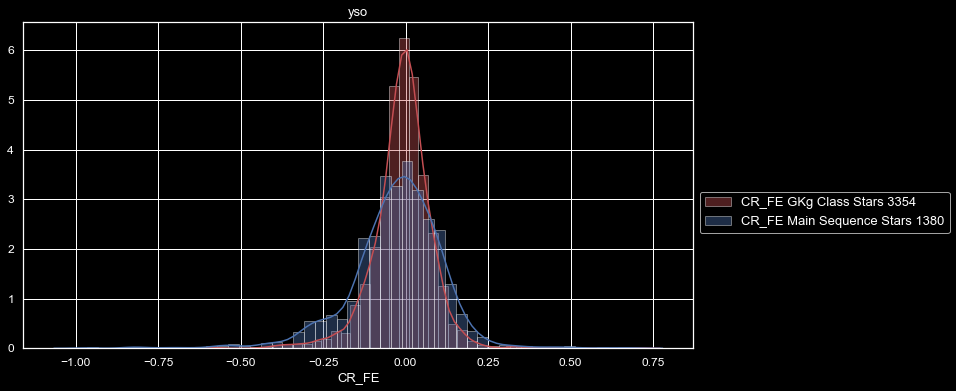


GKg Class CR_FE
count    3354.000000
mean       -0.011173
std         0.095009
min        -1.137322
25%        -0.051074
50%        -0.004487
75%         0.037593
max         0.716538
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


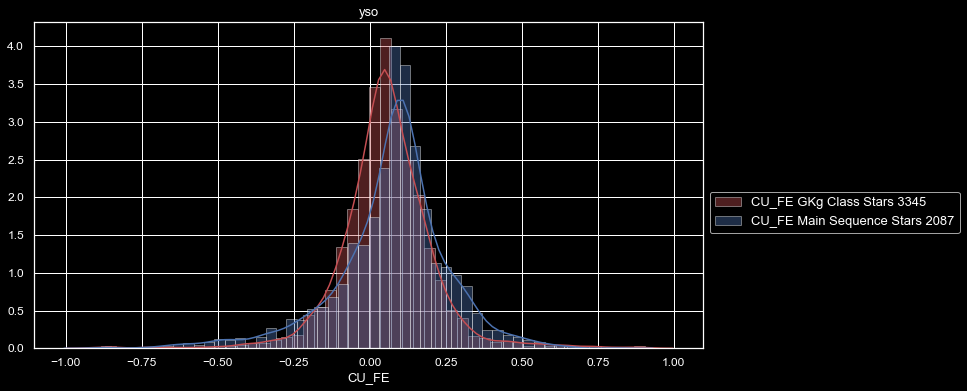


GKg Class CU_FE
count    3345.000000
mean        0.053891
std         0.160307
min        -1.146473
25%        -0.021088
50%         0.052058
75%         0.130757
max         0.904006
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


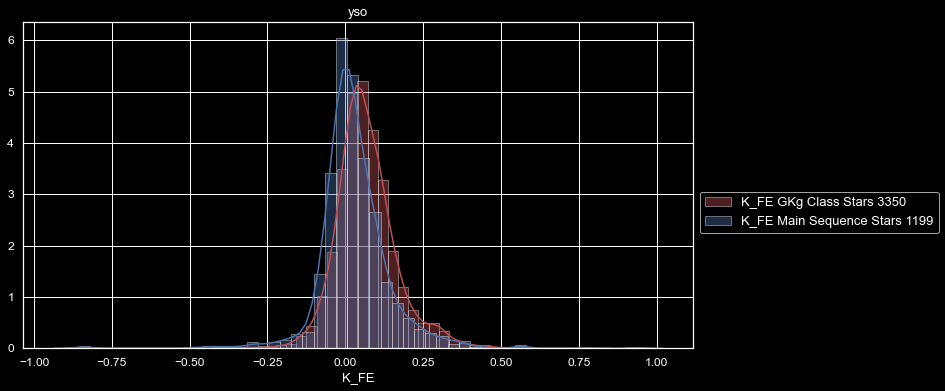


GKg Class K_FE
count    3350.000000
mean        0.067294
std         0.098925
min        -0.844830
25%         0.008520
50%         0.056070
75%         0.115324
max         0.791180
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


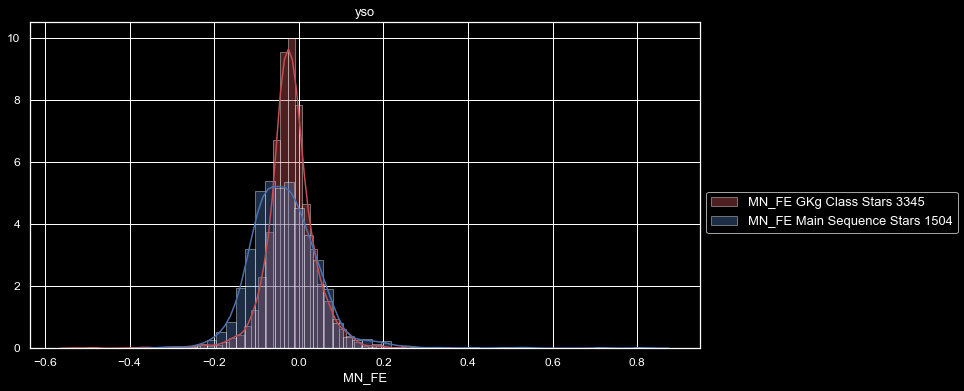


GKg Class MN_FE
count    3345.000000
mean       -0.020083
std         0.058519
min        -0.528916
25%        -0.047136
50%        -0.021306
75%         0.007424
max         0.337964
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


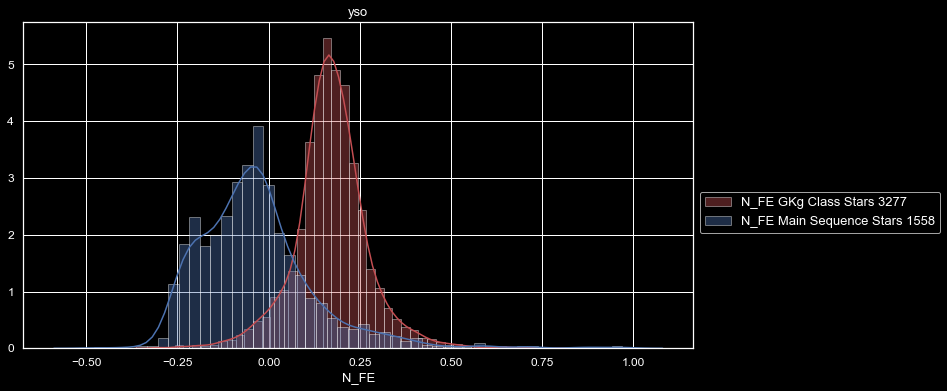


GKg Class N_FE
count    3277.000000
mean        0.170907
std         0.103120
min        -0.305397
25%         0.120420
50%         0.169860
75%         0.222639
max         0.888100
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


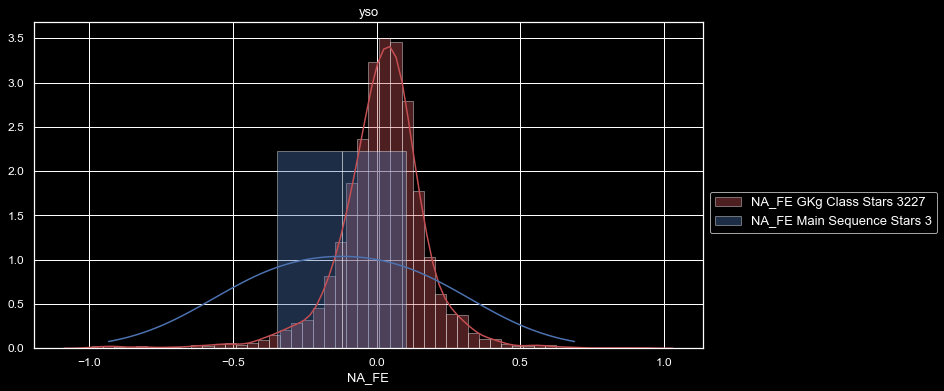


GKg Class NA_FE
count    3227.000000
mean        0.012440
std         0.180701
min        -1.560214
25%        -0.055934
50%         0.026956
75%         0.099571
max         1.121726
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


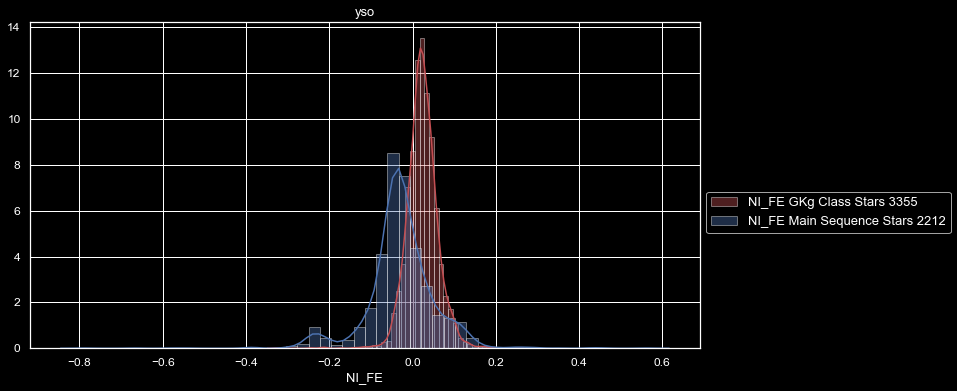


GKg Class NI_FE
count    3355.000000
mean        0.023571
std         0.037359
min        -0.326871
25%         0.002772
50%         0.022552
75%         0.044141
max         0.246350
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


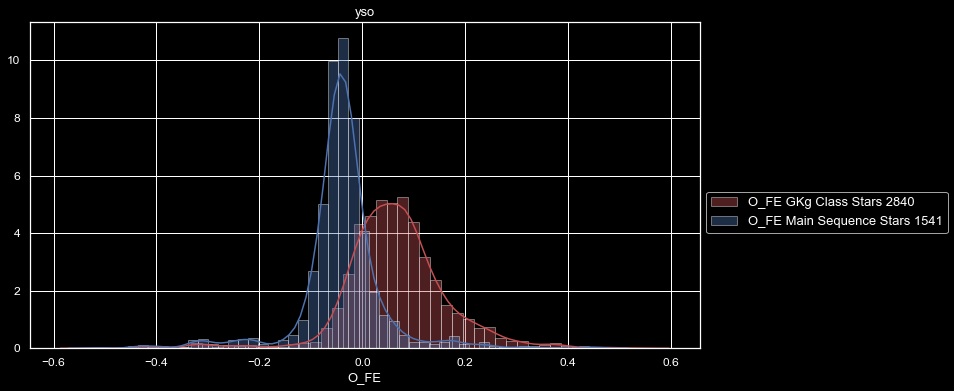


GKg Class O_FE
count    2840.000000
mean        0.063992
std         0.102674
min        -0.523855
25%         0.009885
50%         0.060272
75%         0.112217
max         0.533085
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


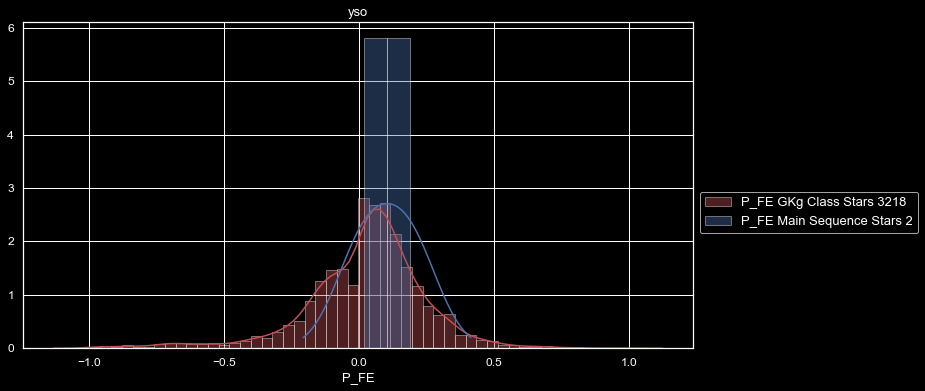


GKg Class P_FE
count    3218.000000
mean        0.010765
std         0.264100
min        -1.677253
25%        -0.088353
50%         0.044920
75%         0.141714
max         1.121477
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


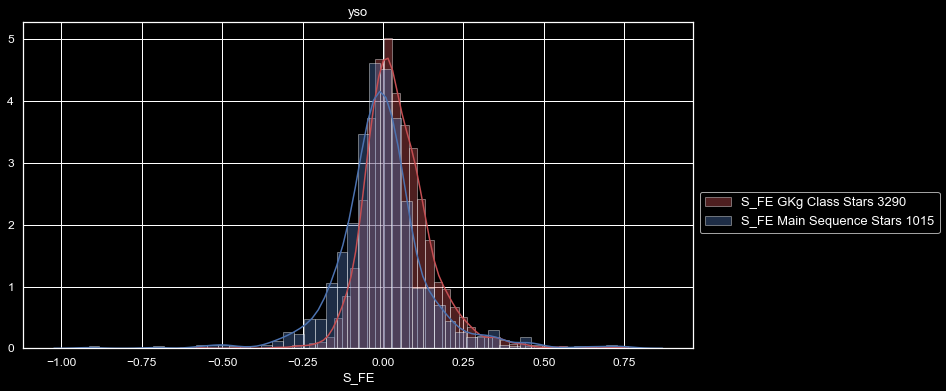


GKg Class S_FE
count    3290.000000
mean        0.045174
std         0.105936
min        -0.566904
25%        -0.020647
50%         0.030783
75%         0.098547
max         0.727176
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


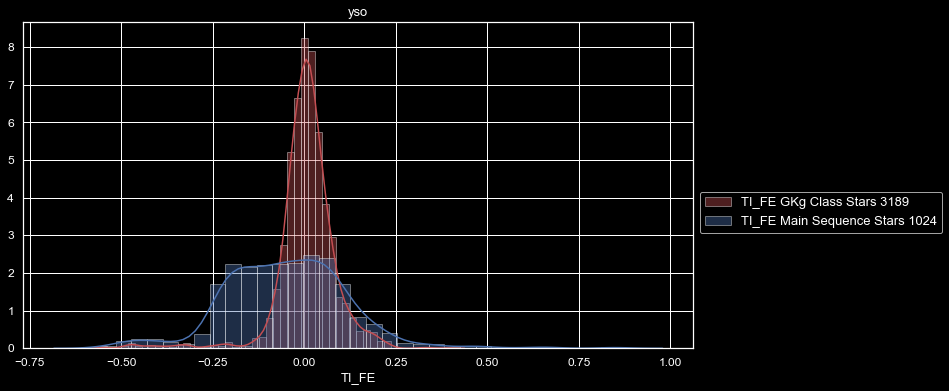


GKg Class TI_FE
count    3189.000000
mean        0.006428
std         0.082754
min        -0.557876
25%        -0.025127
50%         0.008362
75%         0.043779
max         0.388231
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


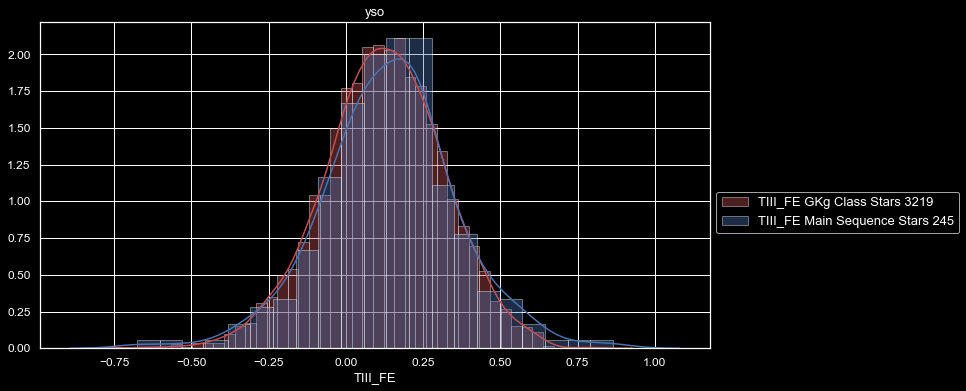


GKg Class TIII_FE
count    3219.000000
mean        0.123051
std         0.194998
min        -0.738715
25%        -0.000221
50%         0.126195
75%         0.254859
max         0.810690
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


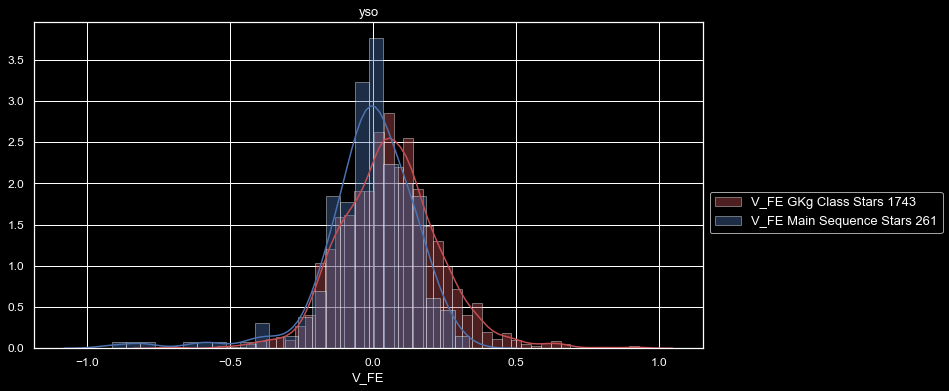


GKg Class V_FE
count    1743.000000
mean        0.058638
std         0.176484
min        -0.719357
25%        -0.055701
50%         0.052513
75%         0.154784
max         1.180643
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


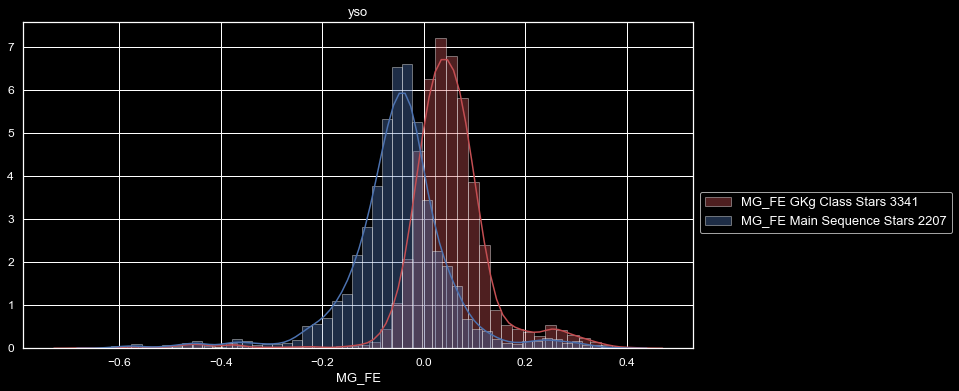


GKg Class MG_FE
count    3341.000000
mean        0.047368
std         0.096731
min        -0.671929
25%         0.009507
50%         0.045538
75%         0.083897
max         0.413902
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


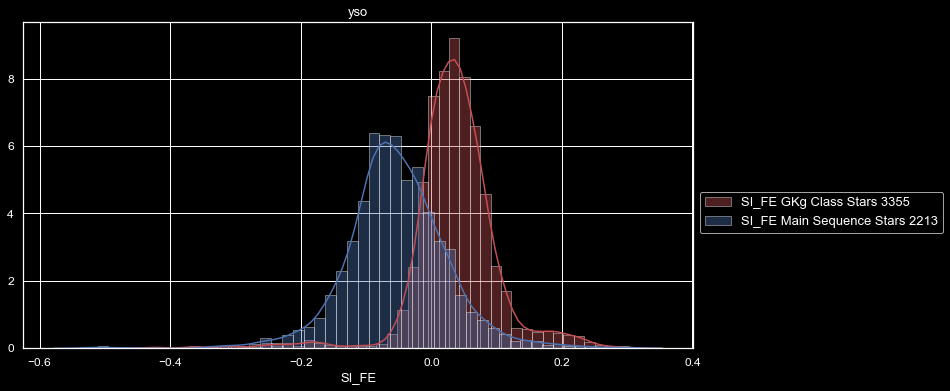


GKg Class SI_FE
count    3355.000000
mean        0.036391
std         0.068651
min        -0.482099
25%         0.006310
50%         0.035829
75%         0.067306
max         0.313642
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


14 seconds elapsed


In [33]:
Detail_View(field_list, df_GKg, "GKg Class", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


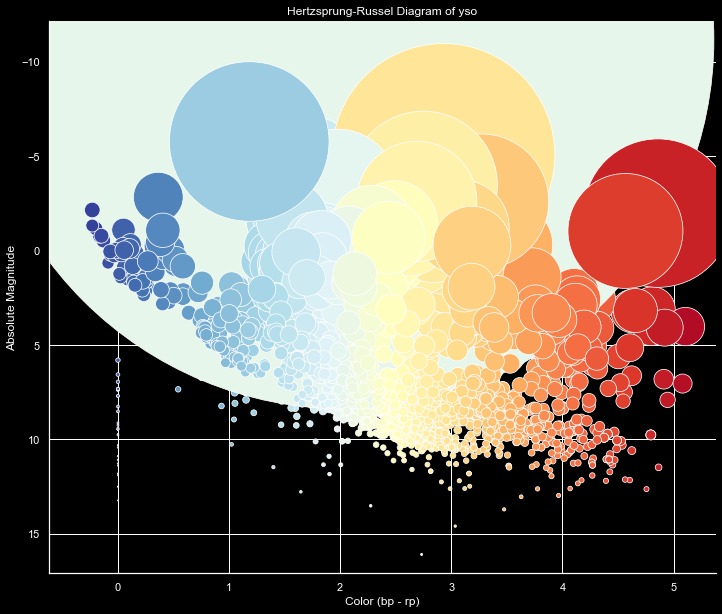

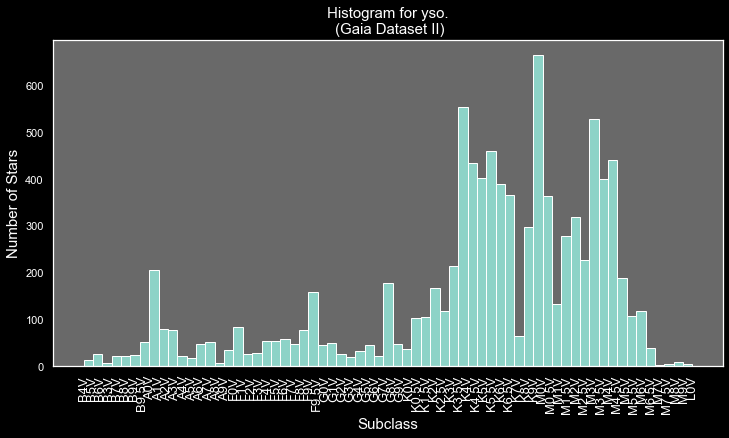

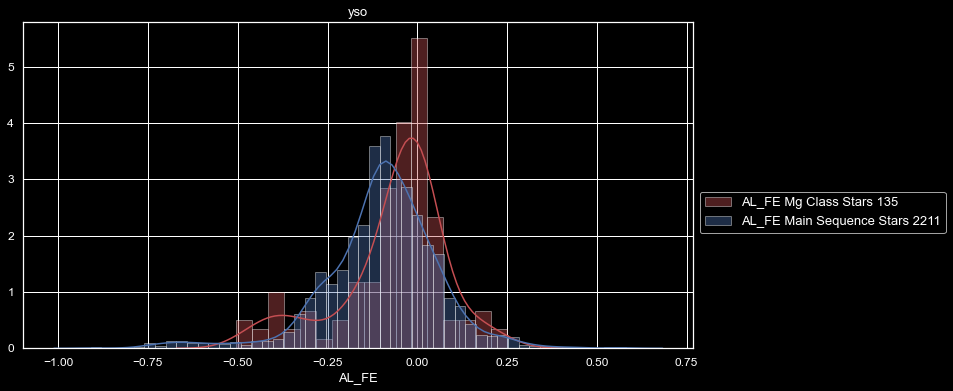


Mg Class AL_FE
count    135.000000
mean      -0.066925
std        0.149721
min       -0.503672
25%       -0.107361
50%       -0.031842
75%        0.011233
max        0.249629
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


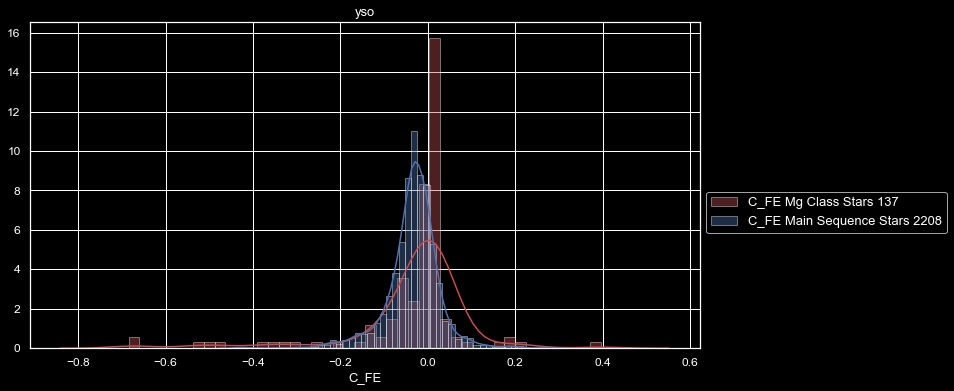


Mg Class C_FE
count    137.000000
mean      -0.034300
std        0.139434
min       -0.684470
25%       -0.045936
50%        0.001855
75%        0.017472
max        0.396540
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


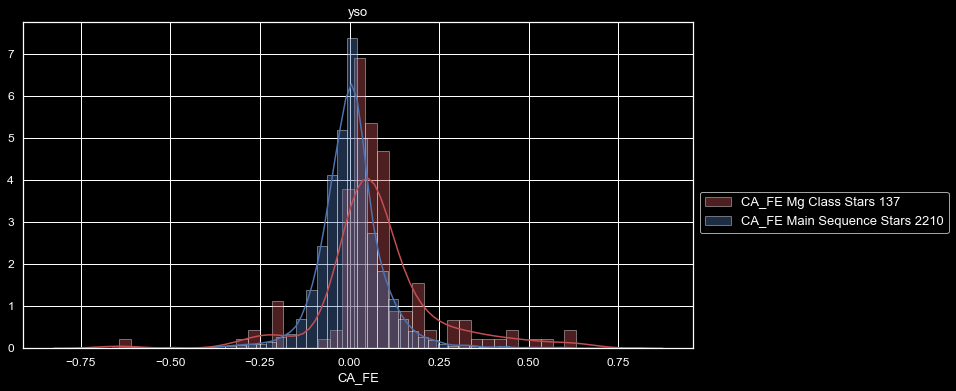


Mg Class CA_FE
count    137.000000
mean       0.078524
std        0.163372
min       -0.643012
25%        0.015838
50%        0.054985
75%        0.100708
max        0.632678
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


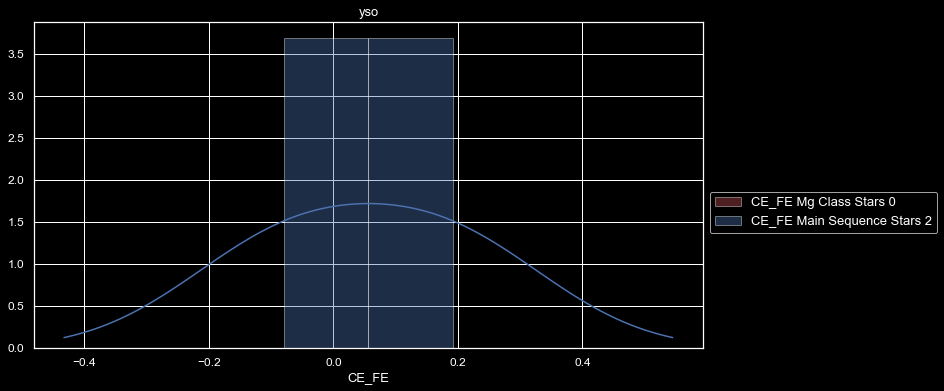


Mg Class CE_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


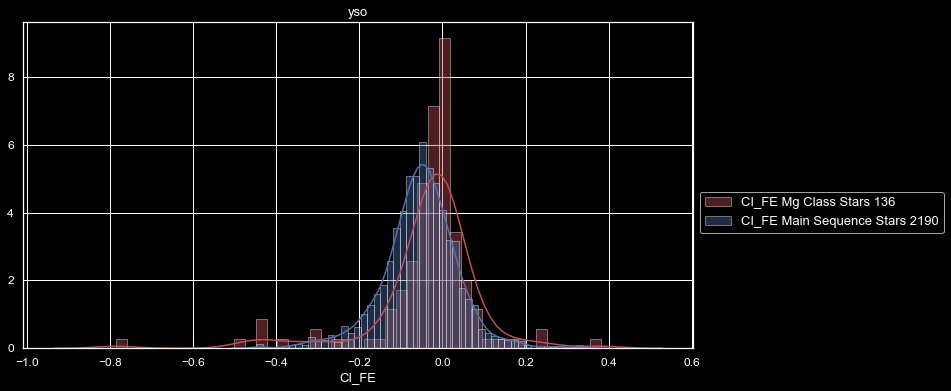


Mg Class CI_FE
count    136.000000
mean      -0.042983
std        0.157536
min       -1.023458
25%       -0.055973
50%       -0.013492
75%        0.013114
max        0.380240
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


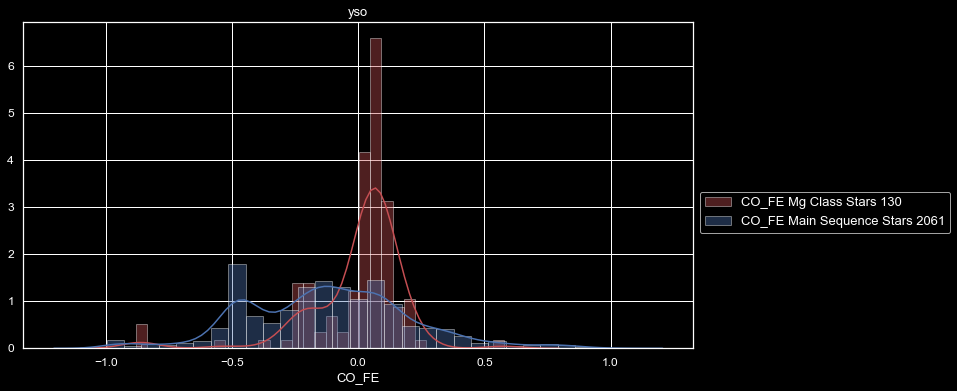


Mg Class CO_FE
count    130.000000
mean      -0.000868
std        0.192652
min       -0.882476
25%       -0.022558
50%        0.049057
75%        0.090749
max        0.578884
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


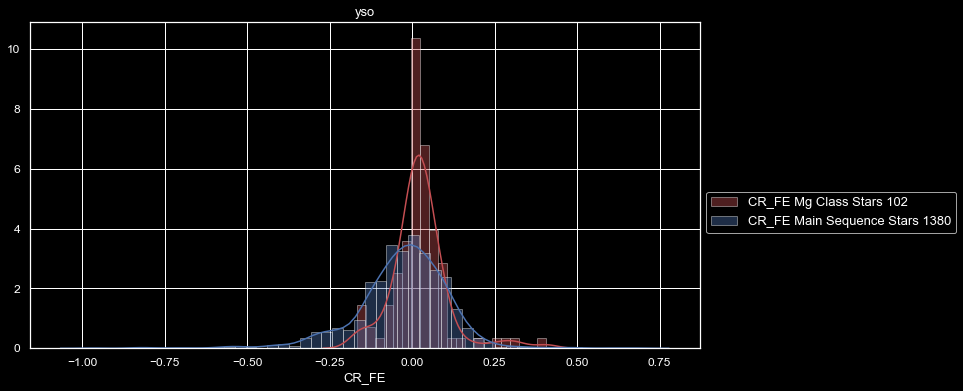


Mg Class CR_FE
count    102.000000
mean       0.023675
std        0.086443
min       -0.167902
25%       -0.013792
50%        0.018623
75%        0.050891
max        0.407203
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


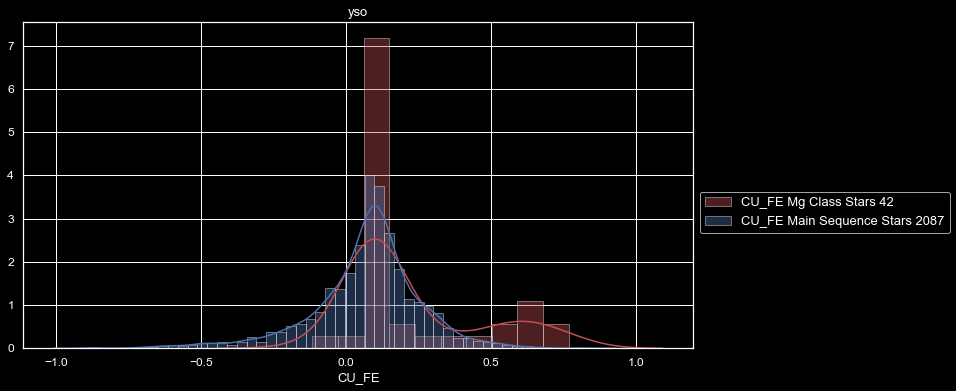


Mg Class CU_FE
count    42.000000
mean      0.245518
std       0.275744
min      -0.115214
25%       0.089823
50%       0.099160
75%       0.365171
max       1.236275
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


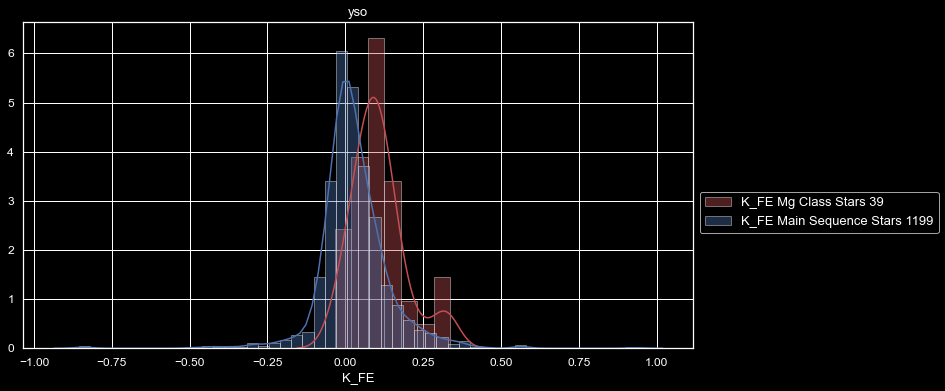


Mg Class K_FE
count    39.000000
mean      0.106550
std       0.085809
min      -0.032900
25%       0.051900
50%       0.092540
75%       0.142145
max       0.336290
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


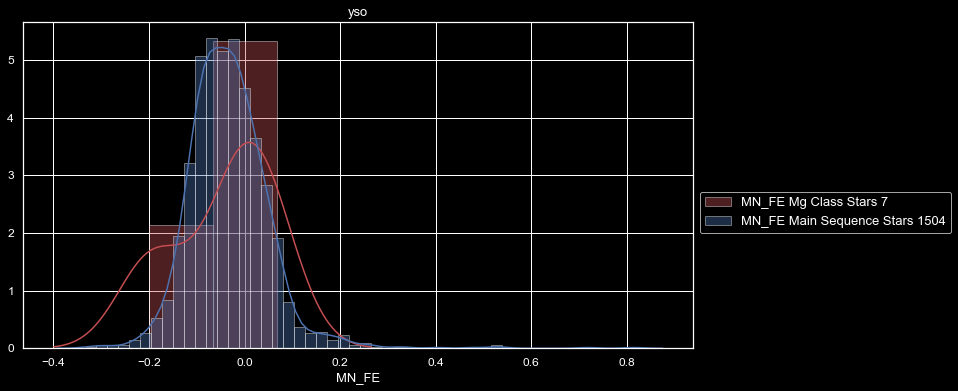


Mg Class MN_FE
count    7.000000
mean    -0.046495
std      0.105285
min     -0.200936
25%     -0.112506
50%     -0.010236
75%      0.021819
max      0.067084
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


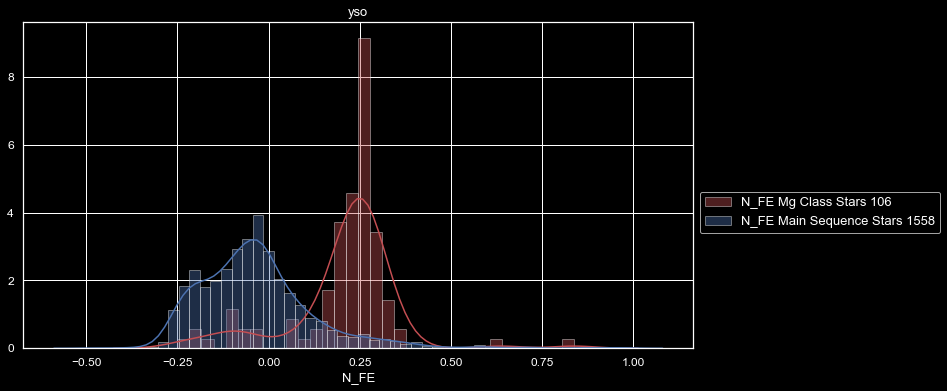


Mg Class N_FE
count    106.000000
mean       0.208378
std        0.149013
min       -0.250117
25%        0.193870
50%        0.244575
75%        0.272275
max        0.837670
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


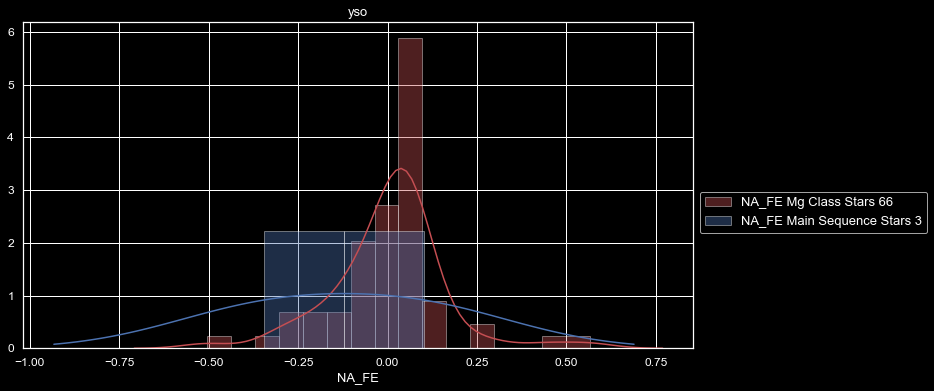


Mg Class NA_FE
count    66.000000
mean      0.004707
std       0.157885
min      -0.504884
25%      -0.066539
50%       0.031056
75%       0.071059
max       0.565346
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


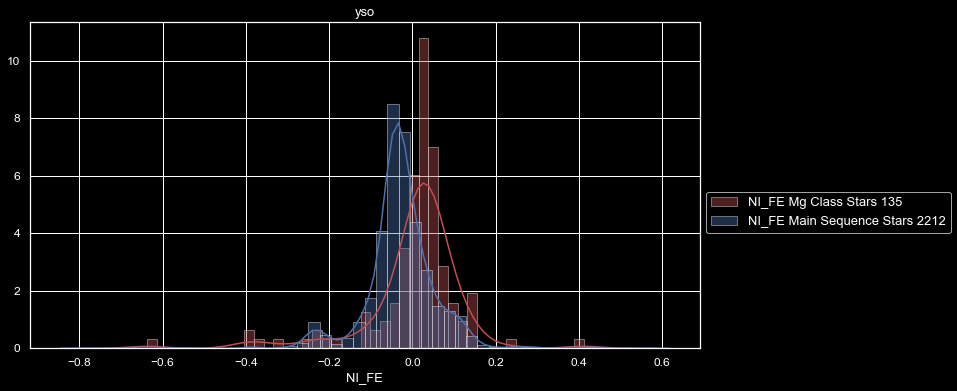


Mg Class NI_FE
count    135.000000
mean       0.004450
std        0.117150
min       -0.637020
25%       -0.008624
50%        0.025272
75%        0.051525
max        0.411350
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


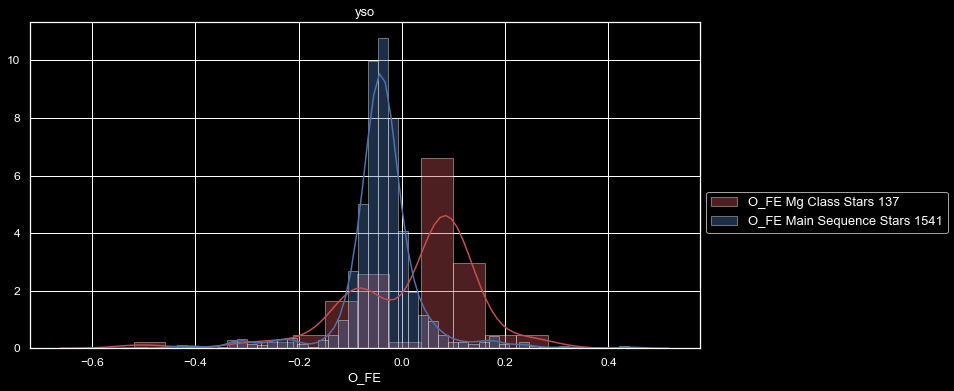


Mg Class O_FE
count    137.000000
mean       0.021543
std        0.126768
min       -0.519969
25%       -0.072191
50%        0.070951
75%        0.093725
max        0.283675
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


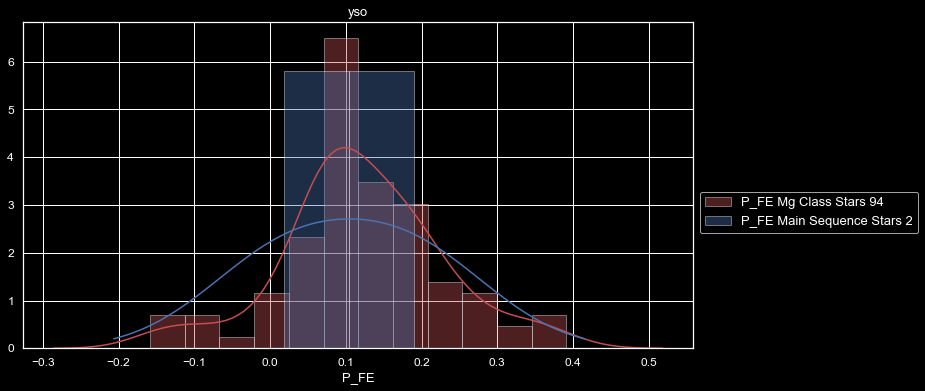


Mg Class P_FE
count    94.000000
mean      0.121465
std       0.105531
min      -0.158423
25%       0.072364
50%       0.112872
75%       0.185362
max       0.391287
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


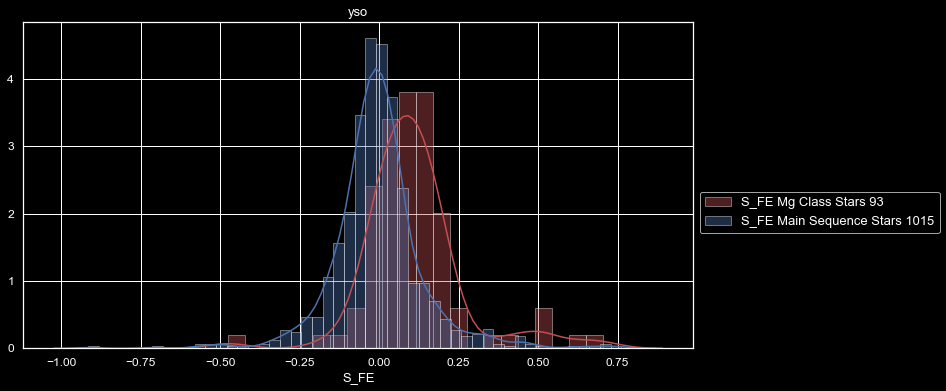


Mg Class S_FE
count    93.000000
mean      0.109284
std       0.155223
min      -0.474776
25%       0.025783
50%       0.089214
75%       0.149854
max       0.704814
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


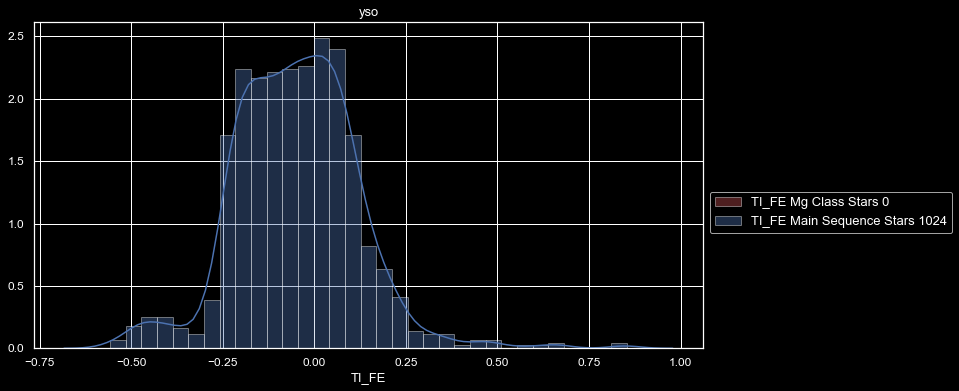


Mg Class TI_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


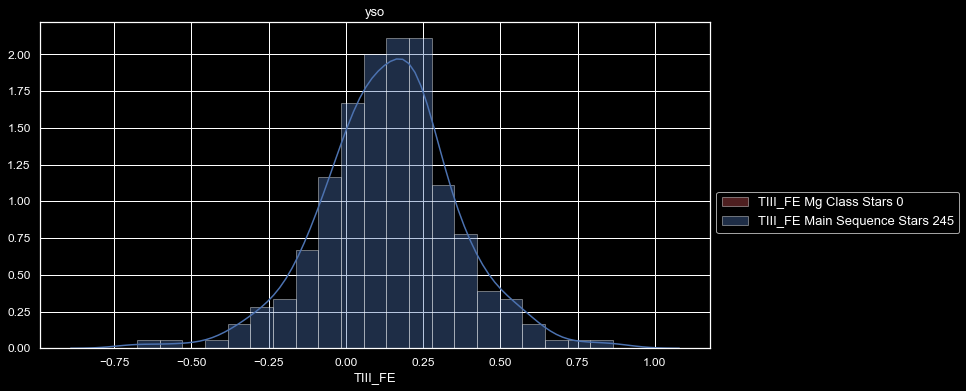


Mg Class TIII_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


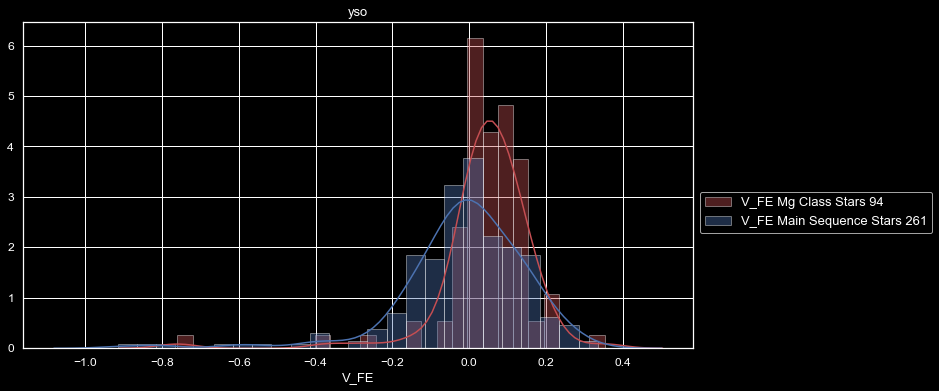


Mg Class V_FE
count    94.000000
mean      0.045484
std       0.125478
min      -0.760237
25%       0.008735
50%       0.056053
75%       0.101171
max       0.352663
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


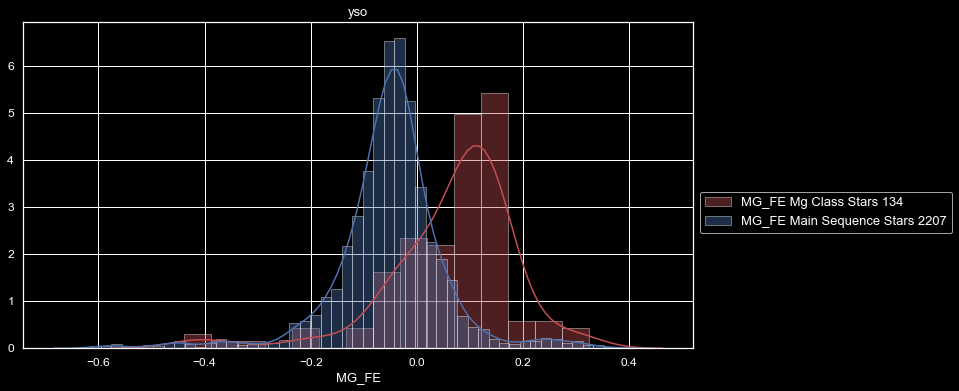


Mg Class MG_FE
count    134.000000
mean       0.065705
std        0.124089
min       -0.438468
25%        0.006783
50%        0.095572
75%        0.137059
max        0.323542
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


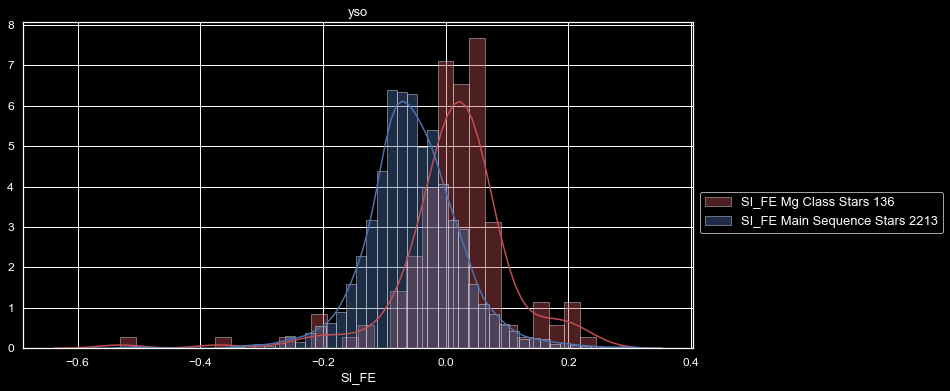


Mg Class SI_FE
count    136.000000
mean       0.013695
std        0.096772
min       -0.530219
25%       -0.013963
50%        0.017693
75%        0.053149
max        0.245242
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [34]:
Detail_View(field_list, df_Mg, "Mg Class", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


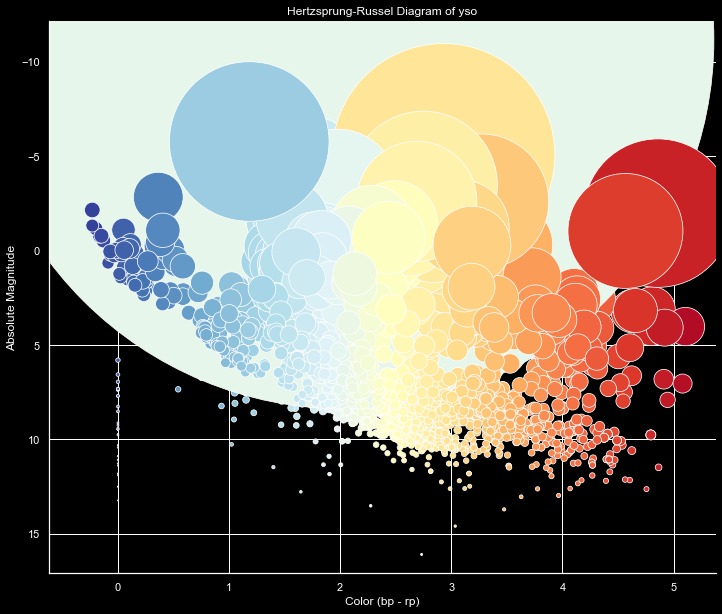

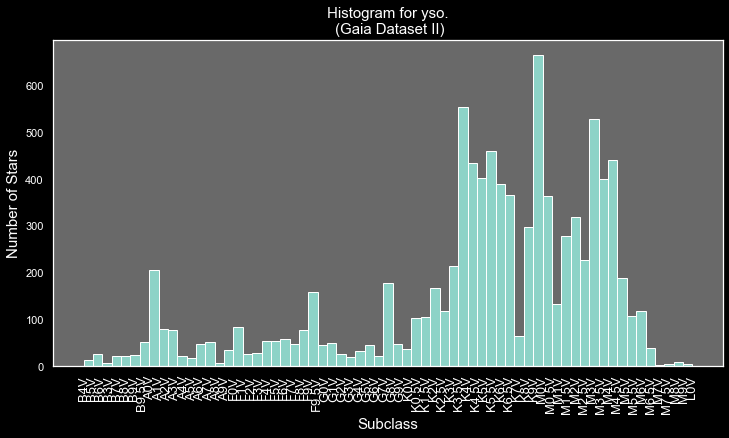

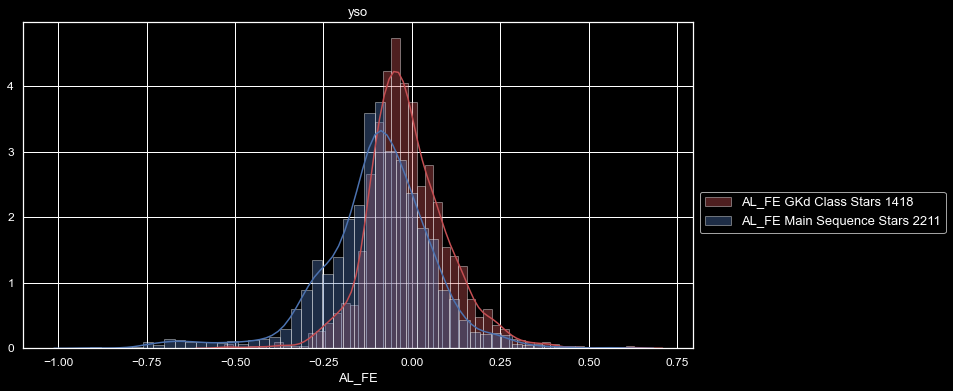


GKd Class AL_FE
count    1418.000000
mean       -0.013133
std         0.114990
min        -0.530621
25%        -0.082396
50%        -0.025377
75%         0.052535
max         0.627639
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


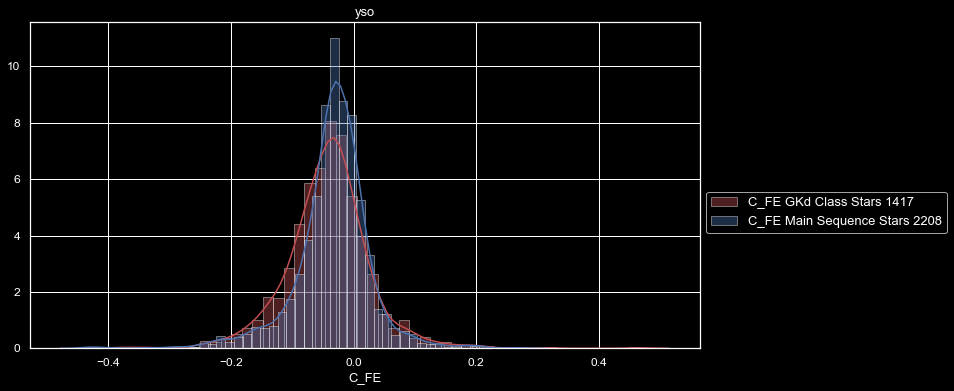


GKd Class C_FE
count    1417.000000
mean       -0.041760
std         0.068947
min        -0.387301
25%        -0.076984
50%        -0.039155
75%        -0.005872
max         0.466184
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


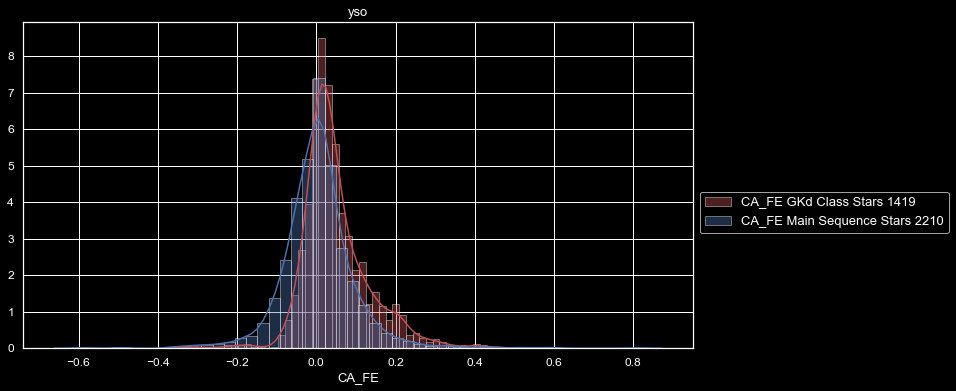


GKd Class CA_FE
count    1419.000000
mean        0.049824
std         0.084949
min        -0.317125
25%         0.000352
50%         0.031282
75%         0.082943
max         0.531554
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


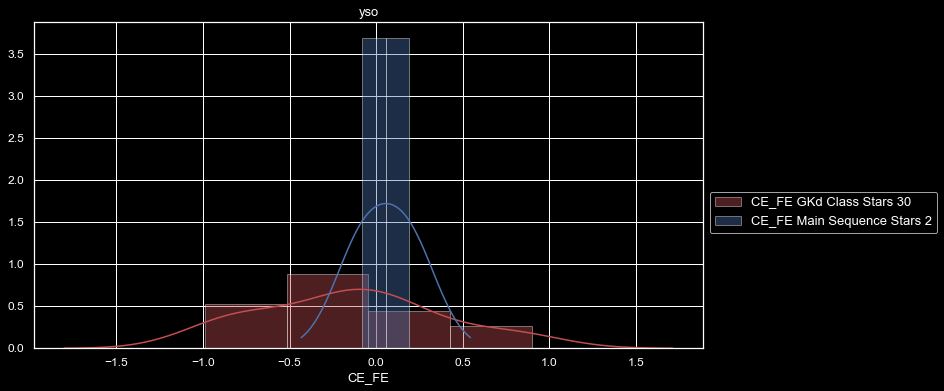


GKd Class CE_FE
count    30.000000
mean     -0.345112
std       0.619967
min      -1.258665
25%      -0.859393
50%      -0.228445
75%      -0.012711
max       0.899485
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


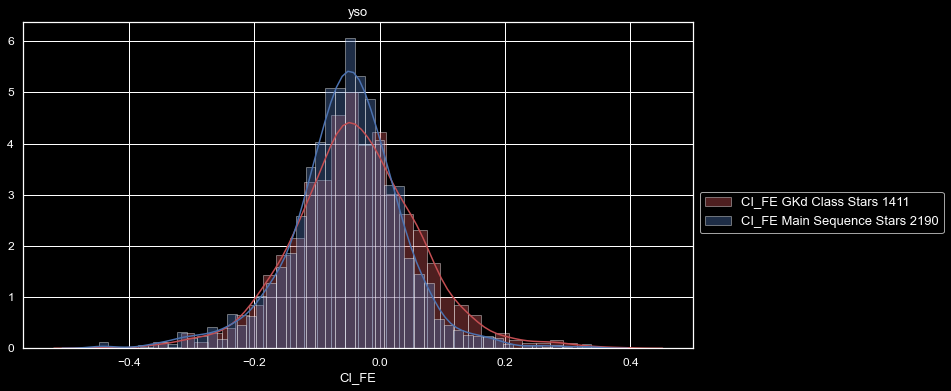


GKd Class CI_FE
count    1411.000000
mean       -0.037276
std         0.101345
min        -0.448308
25%        -0.099523
50%        -0.041071
75%         0.024650
max         0.380040
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


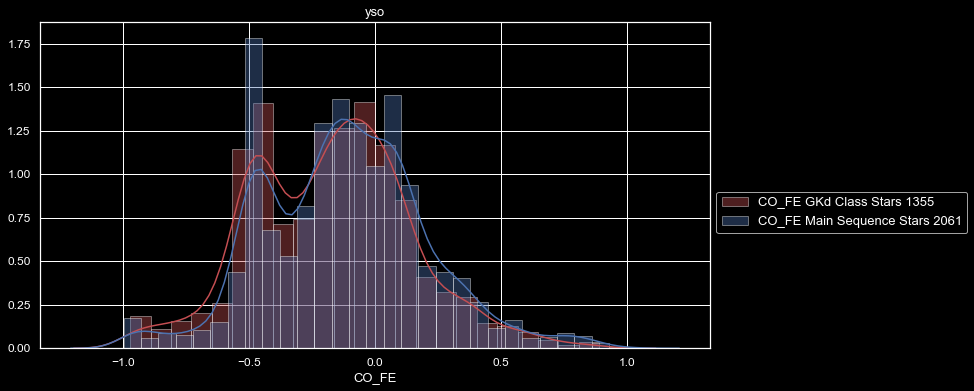


GKd Class CO_FE
count    1355.000000
mean       -0.185593
std         0.342525
min        -2.048596
25%        -0.441976
50%        -0.167810
75%         0.026805
max         1.346072
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


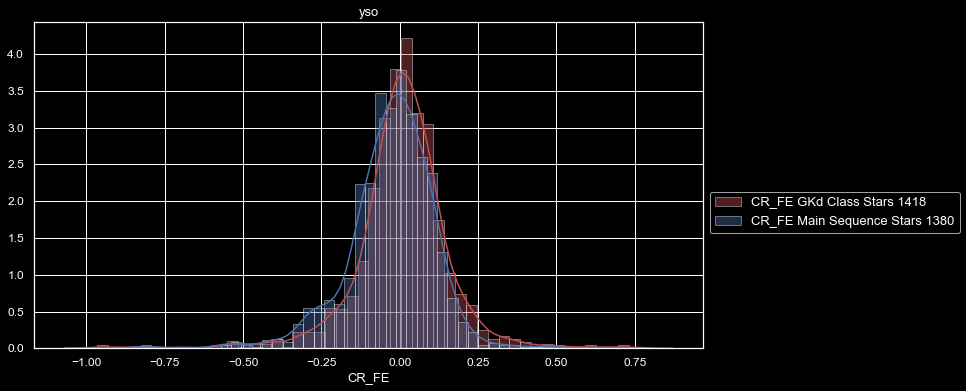


GKd Class CR_FE
count    1418.000000
mean        0.000188
std         0.187038
min        -2.261637
25%        -0.055429
50%         0.010772
75%         0.083059
max         1.056068
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


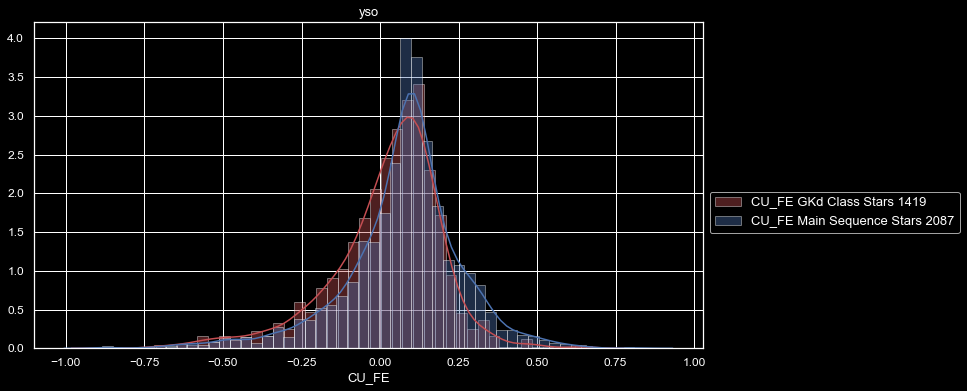


GKd Class CU_FE
count    1419.000000
mean        0.020562
std         0.181671
min        -1.071362
25%        -0.062797
50%         0.052079
75%         0.131715
max         0.655176
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


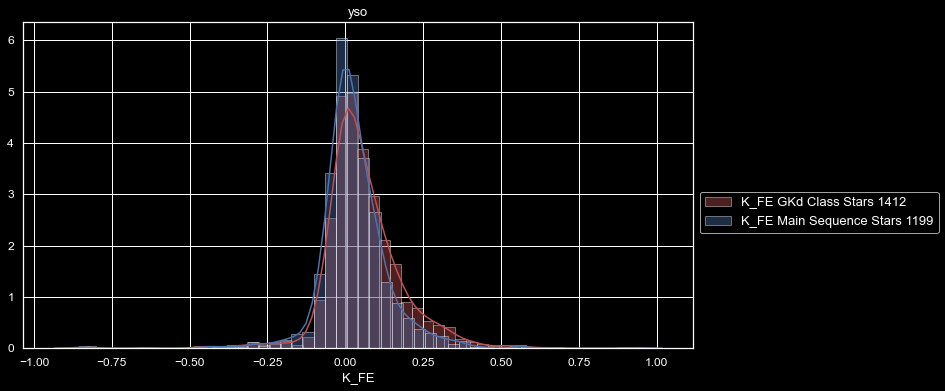


GKd Class K_FE
count    1412.000000
mean        0.053572
std         0.154969
min        -1.758940
25%        -0.010658
50%         0.037768
75%         0.111517
max         1.025800
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


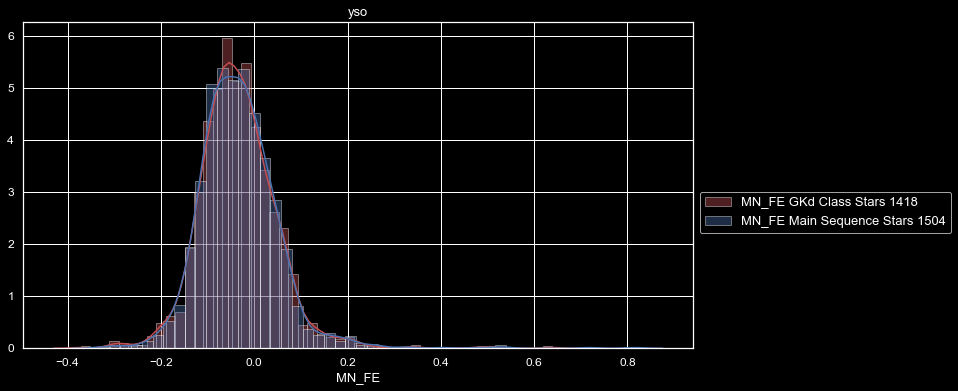


GKd Class MN_FE
count    1418.000000
mean       -0.035052
std         0.082171
min        -0.371726
25%        -0.085400
50%        -0.040412
75%         0.010020
max         0.638877
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


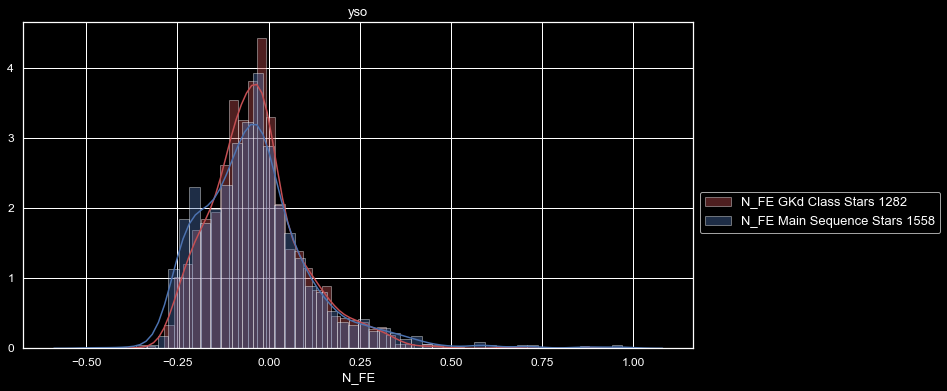


GKd Class N_FE
count    1282.000000
mean       -0.033446
std         0.128580
min        -0.336407
25%        -0.114167
50%        -0.041164
75%         0.025140
max         0.879333
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


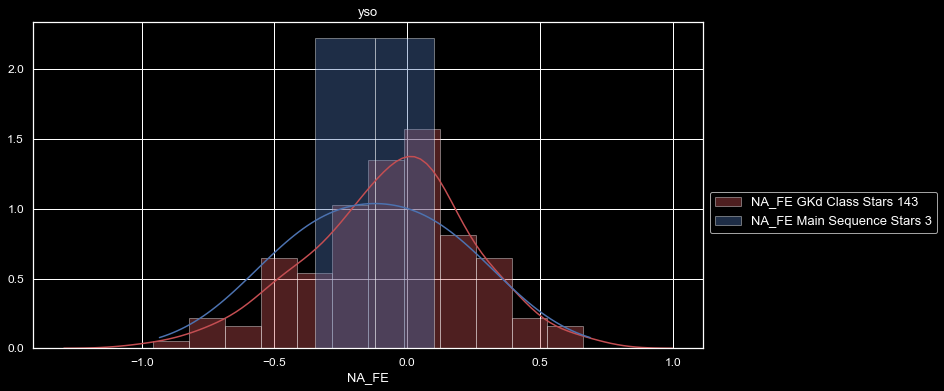


GKd Class NA_FE
count    143.000000
mean      -0.125195
std        0.412750
min       -1.830734
25%       -0.282424
50%       -0.061224
75%        0.106161
max        0.662559
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


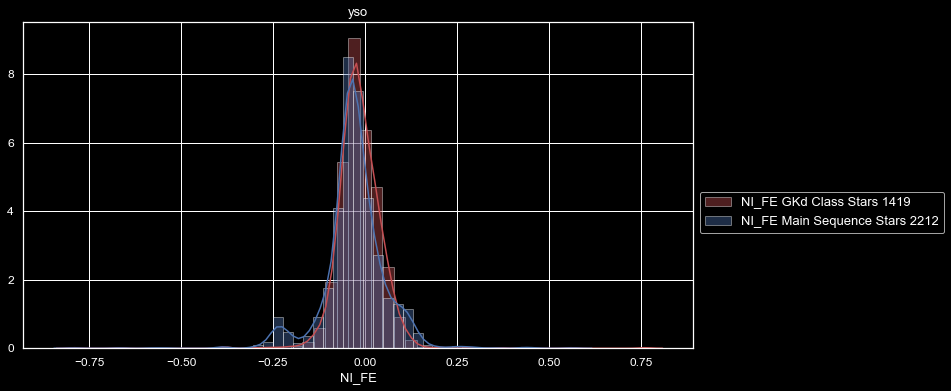


GKd Class NI_FE
count    1419.000000
mean       -0.014875
std         0.067719
min        -0.791070
25%        -0.047617
50%        -0.019454
75%         0.018215
max         0.761210
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


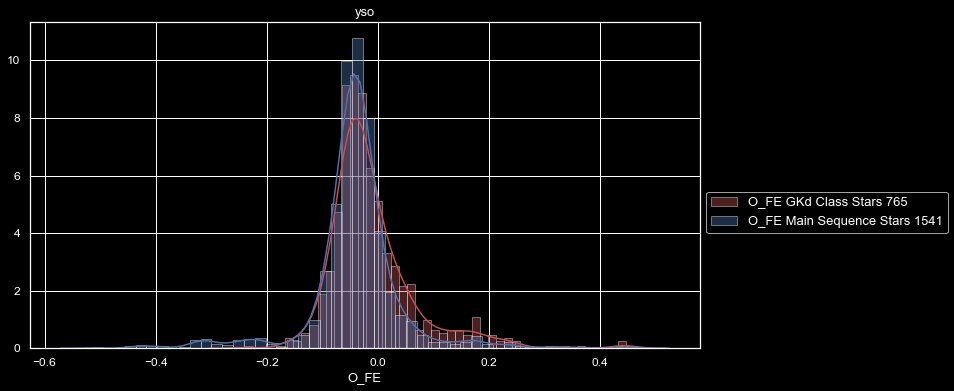


GKd Class O_FE
count    765.000000
mean      -0.010224
std        0.080067
min       -0.240126
25%       -0.055028
50%       -0.029725
75%        0.013046
max        0.460205
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


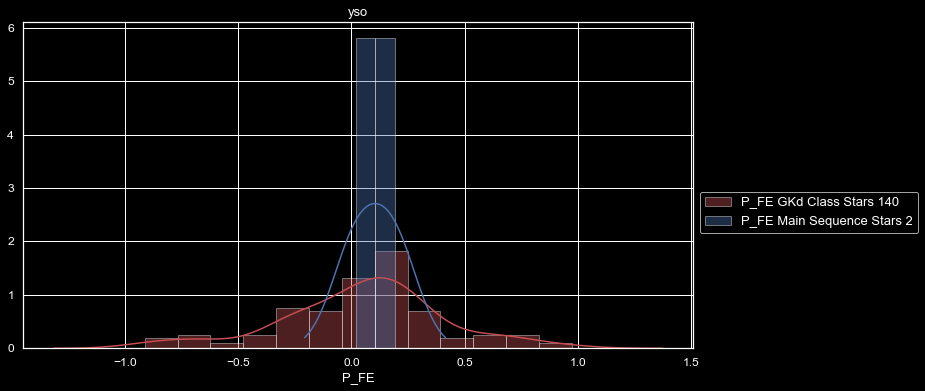


GKd Class P_FE
count    140.000000
mean       0.030921
std        0.426030
min       -2.073038
25%       -0.155243
50%        0.076442
75%        0.238693
max        1.039319
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


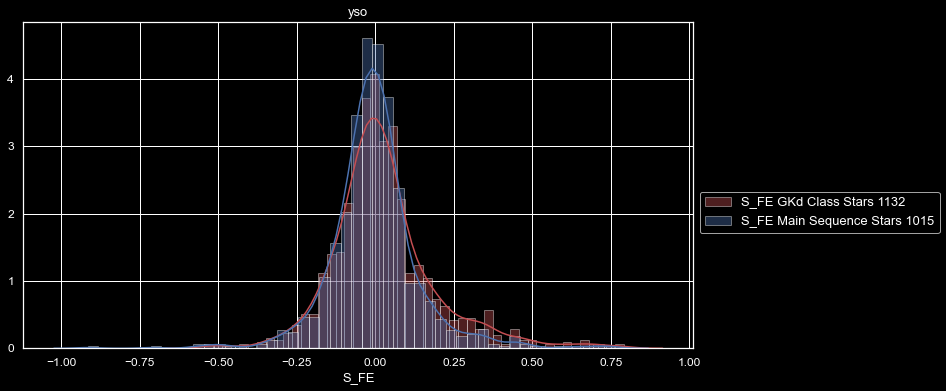


GKd Class S_FE
count    1132.000000
mean        0.027089
std         0.168234
min        -0.543596
25%        -0.064237
50%         0.003590
75%         0.083146
max         0.791196
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


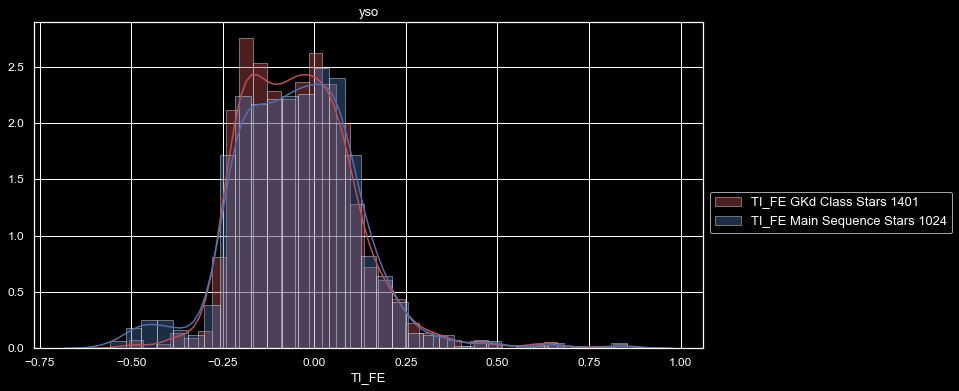


GKd Class TI_FE
count    1401.000000
mean       -0.043133
std         0.156869
min        -0.507077
25%        -0.162136
50%        -0.053307
75%         0.050405
max         0.852863
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


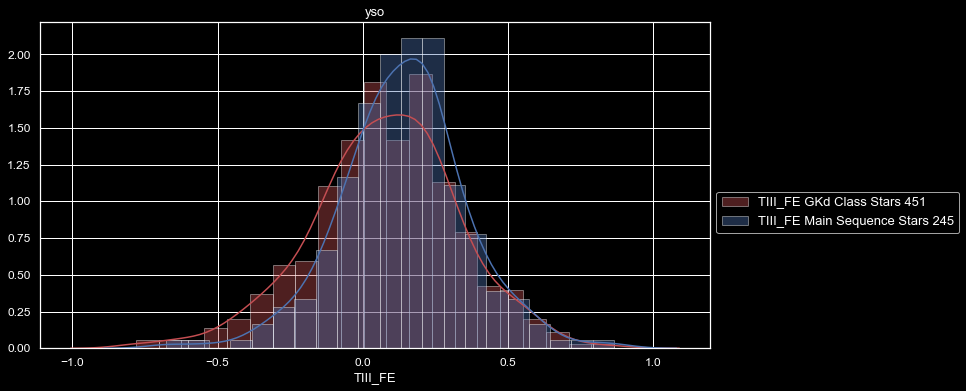


GKd Class TIII_FE
count    451.000000
mean       0.075659
std        0.254409
min       -0.780874
25%       -0.072515
50%        0.081659
75%        0.234142
max        0.864614
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


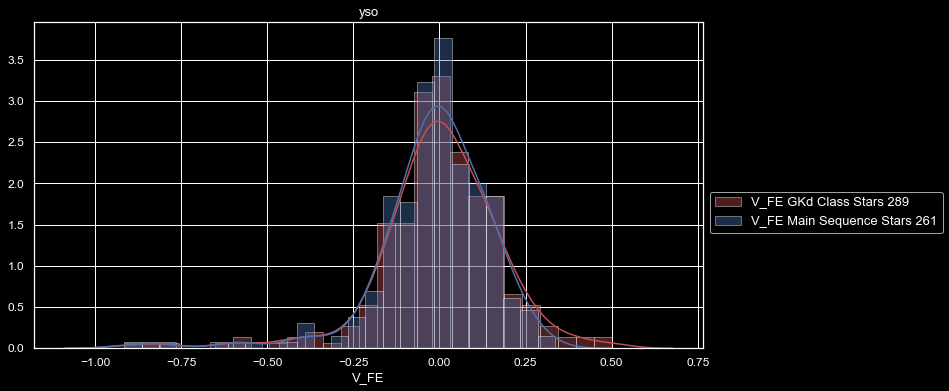


GKd Class V_FE
count    289.000000
mean      -0.004028
std        0.192717
min       -1.114210
25%       -0.073450
50%        0.004952
75%        0.105849
max        0.502170
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


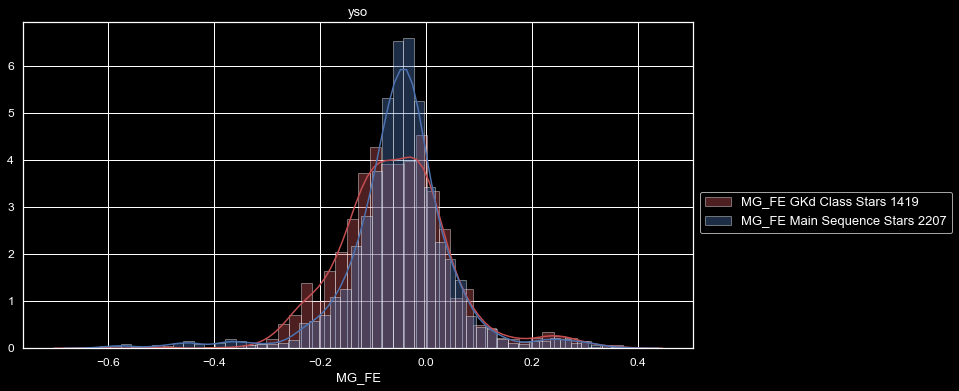


GKd Class MG_FE
count    1419.000000
mean       -0.057785
std         0.106799
min        -0.627258
25%        -0.123043
50%        -0.059829
75%        -0.000185
max         0.371781
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


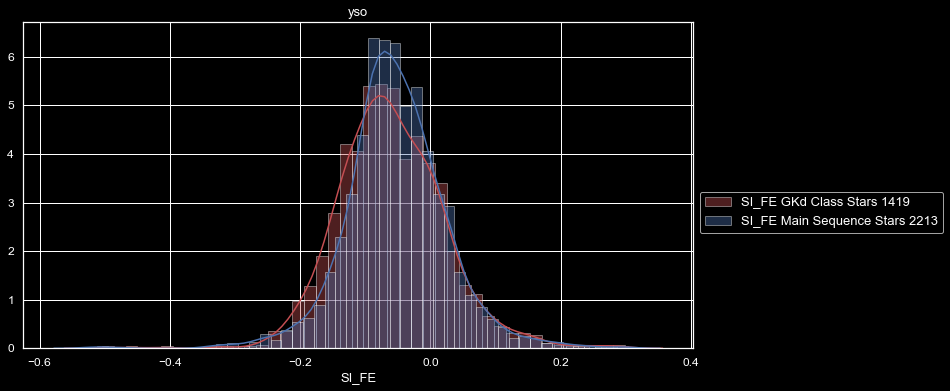


GKd Class SI_FE
count    1419.000000
mean       -0.060481
std         0.081852
min        -0.504708
25%        -0.113654
50%        -0.065239
75%        -0.009337
max         0.298912
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


14 seconds elapsed


In [35]:
Detail_View(field_list, df_GKd, "GKd Class", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


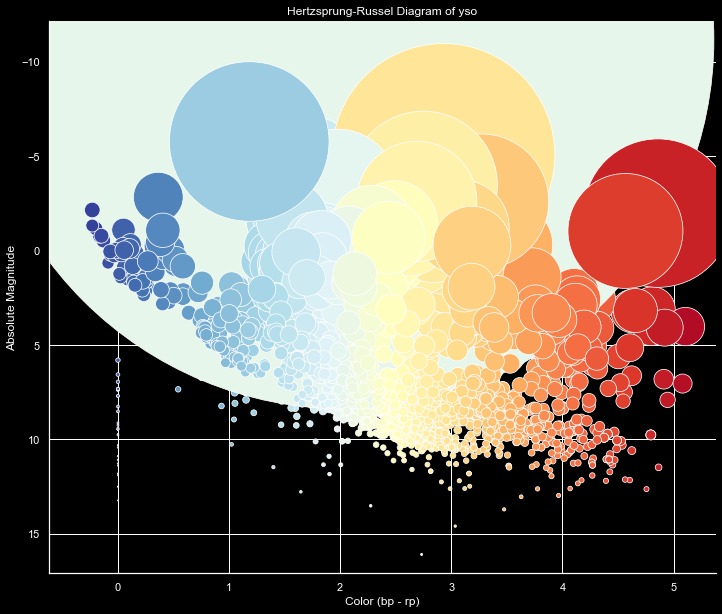

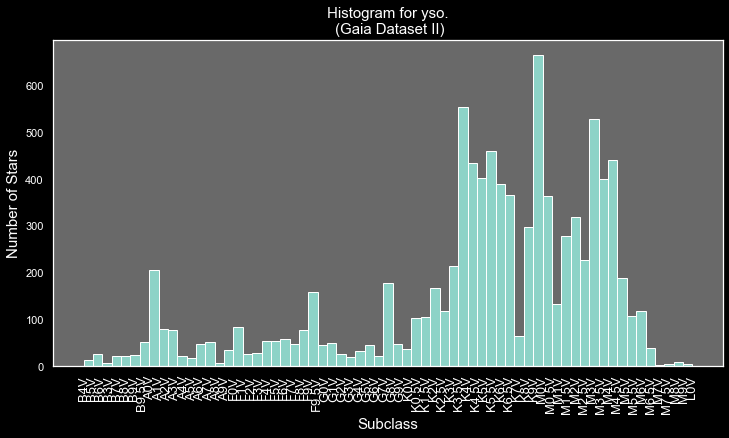

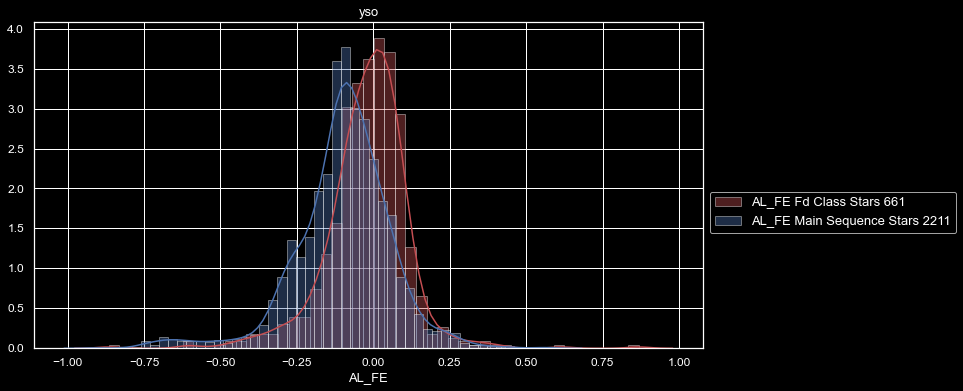


Fd Class AL_FE
count    661.000000
mean      -0.021543
std        0.141524
min       -1.031643
25%       -0.081845
50%       -0.006506
75%        0.054769
max        0.868458
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


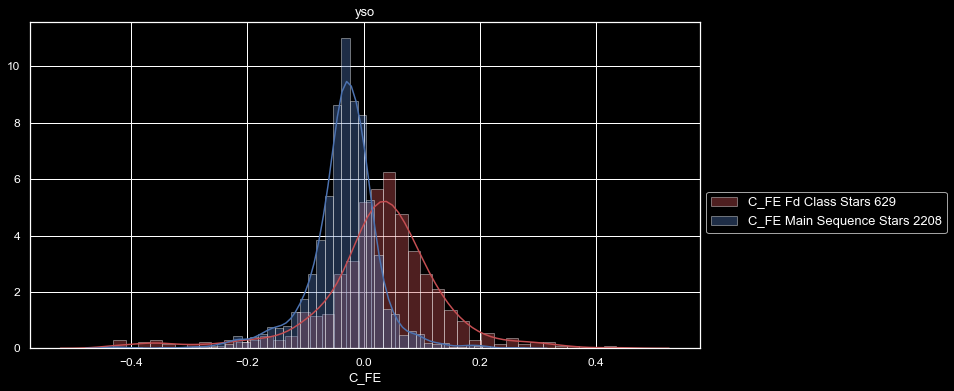


Fd Class C_FE
count    629.000000
mean       0.026171
std        0.110236
min       -0.430486
25%       -0.010691
50%        0.033920
75%        0.080956
max        0.434721
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


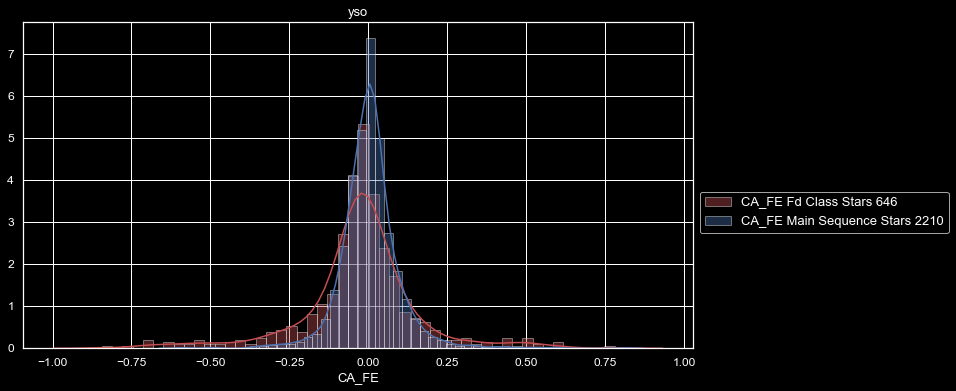


Fd Class CA_FE
count    646.000000
mean      -0.026883
std        0.185324
min       -0.843465
25%       -0.084205
50%       -0.020592
75%        0.043386
max        0.779868
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


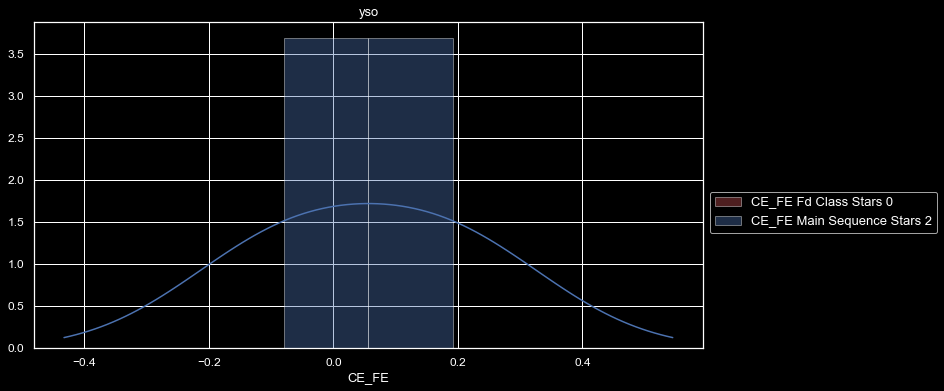


Fd Class CE_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


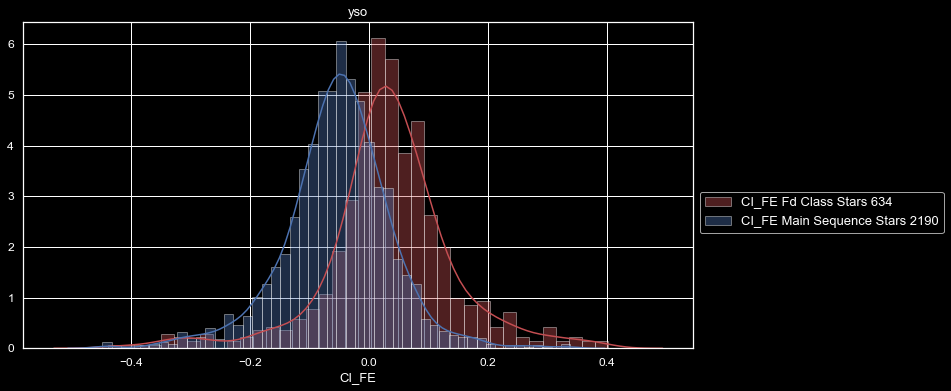


Fd Class CI_FE
count    634.000000
mean       0.033212
std        0.110582
min       -0.438708
25%       -0.014388
50%        0.030865
75%        0.082821
max        0.401672
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


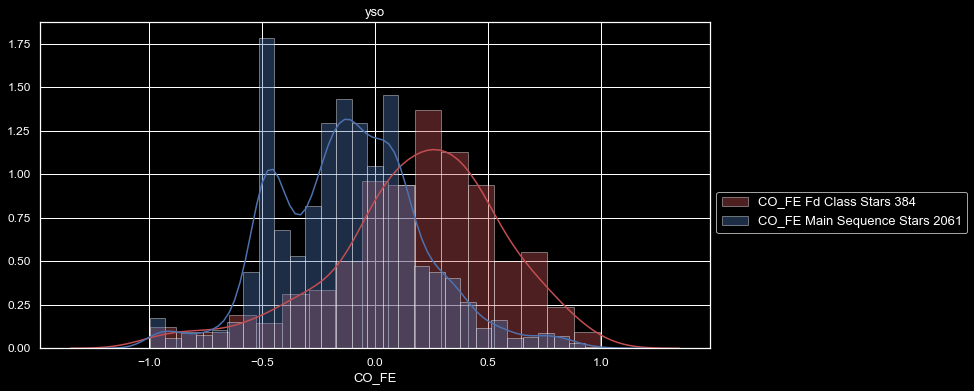


Fd Class CO_FE
count    384.000000
mean       0.077368
std        0.550828
min       -2.194668
25%       -0.073793
50%        0.206533
75%        0.416967
max        1.034484
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


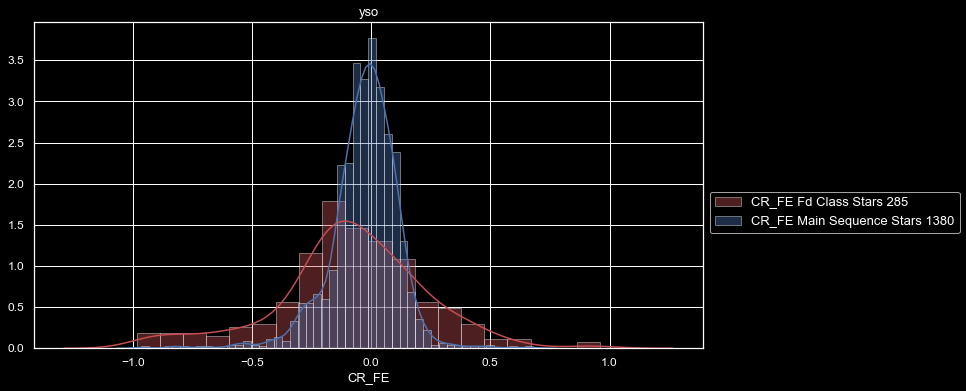


Fd Class CR_FE
count    285.000000
mean      -0.134195
std        0.405397
min       -2.109207
25%       -0.232047
50%       -0.084019
75%        0.088450
max        0.960798
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


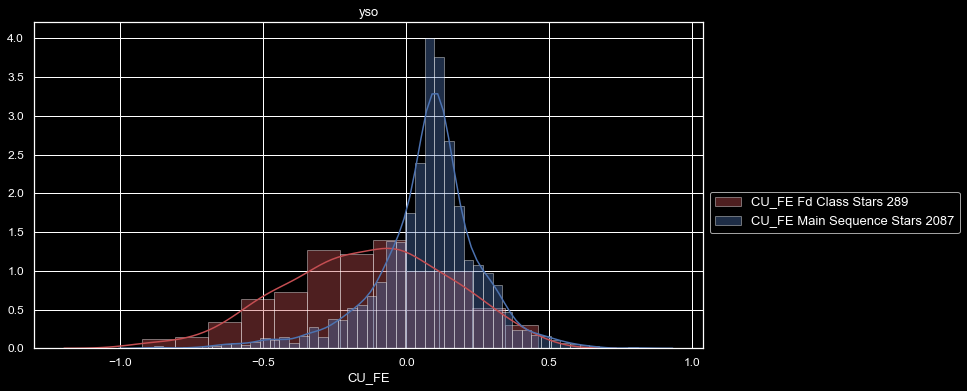


Fd Class CU_FE
count    289.000000
mean      -0.148343
std        0.300205
min       -1.395652
25%       -0.336164
50%       -0.131928
75%        0.060000
max        0.461652
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


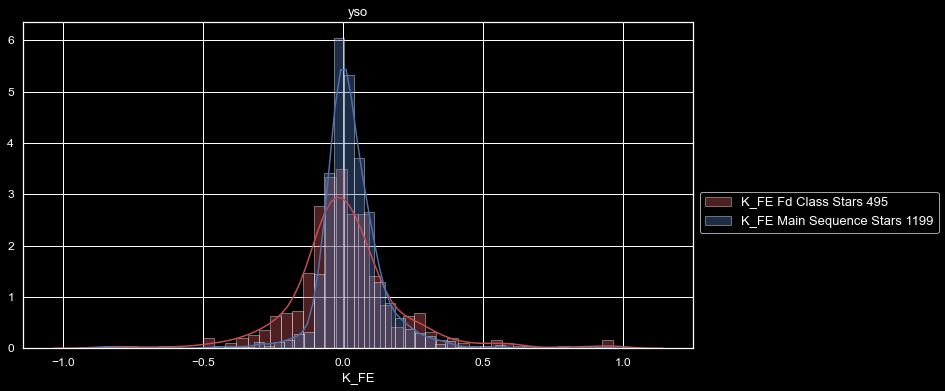


Fd Class K_FE
count    495.000000
mean      -0.028767
std        0.318886
min       -2.033995
25%       -0.084008
50%       -0.008783
75%        0.077571
max        0.965214
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


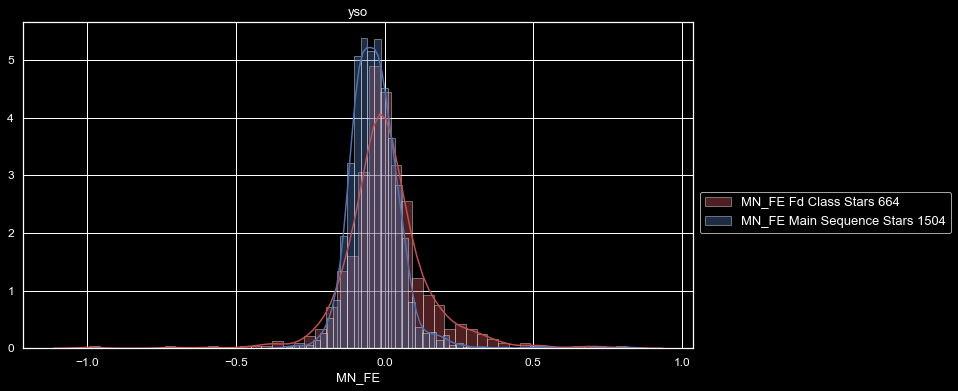


Fd Class MN_FE
count    664.000000
mean      -0.000061
std        0.183387
min       -1.802076
25%       -0.064741
50%       -0.007260
75%        0.062327
max        1.015414
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


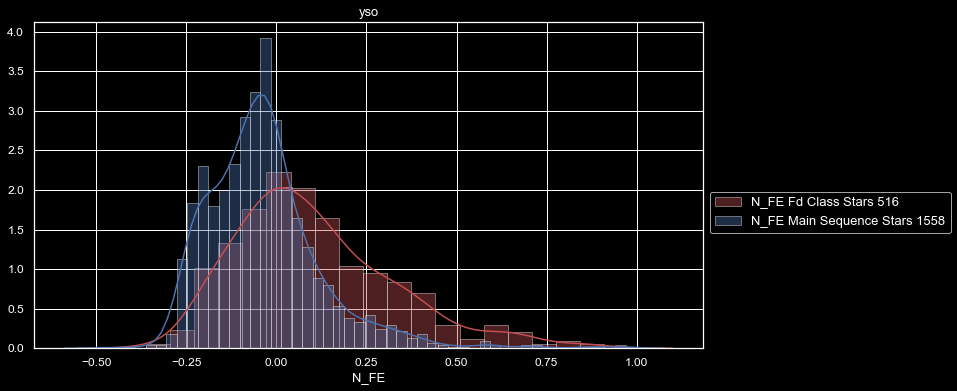


Fd Class N_FE
count    516.000000
mean       0.105334
std        0.220653
min       -0.361917
25%       -0.048214
50%        0.066945
75%        0.222510
max        0.910263
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


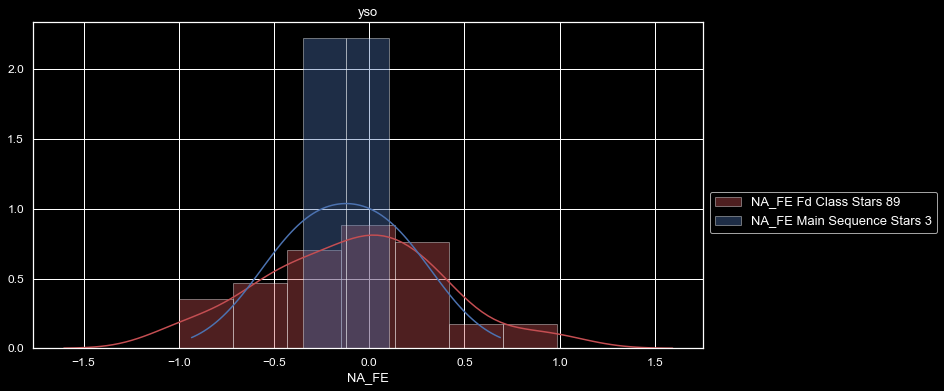


Fd Class NA_FE
count    89.000000
mean     -0.532013
std       0.821921
min      -2.285414
25%      -1.244504
50%      -0.391285
75%       0.074402
max       1.191596
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


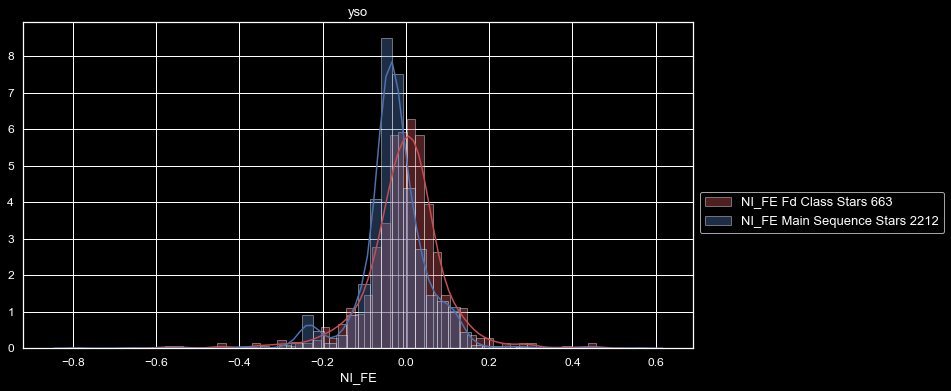


Fd Class NI_FE
count    663.000000
mean      -0.004942
std        0.106101
min       -1.070138
25%       -0.042665
50%        0.001184
75%        0.042192
max        0.457730
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


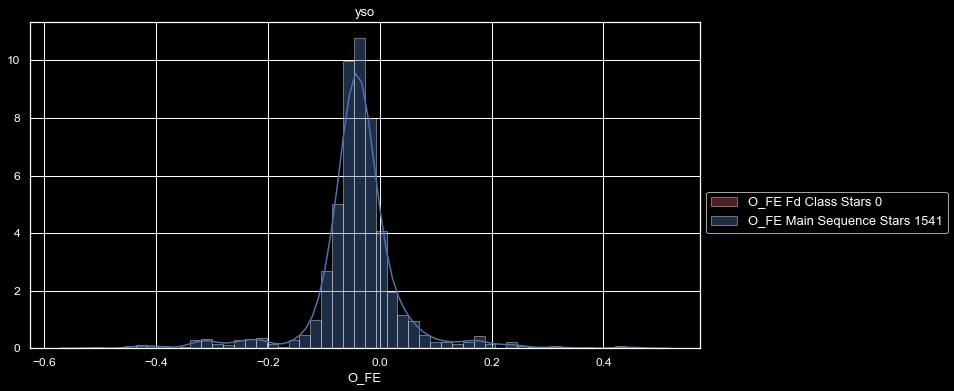


Fd Class O_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


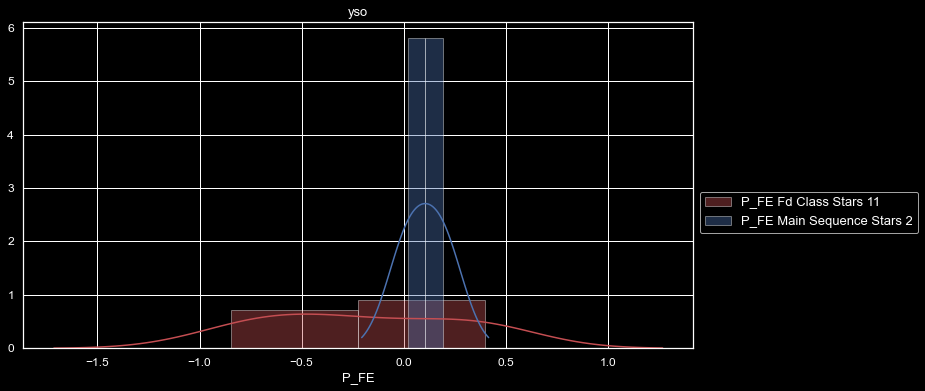


Fd Class P_FE
count    11.000000
mean     -0.417336
std       0.656205
min      -1.723283
25%      -0.773083
50%      -0.458730
75%       0.095246
max       0.397977
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


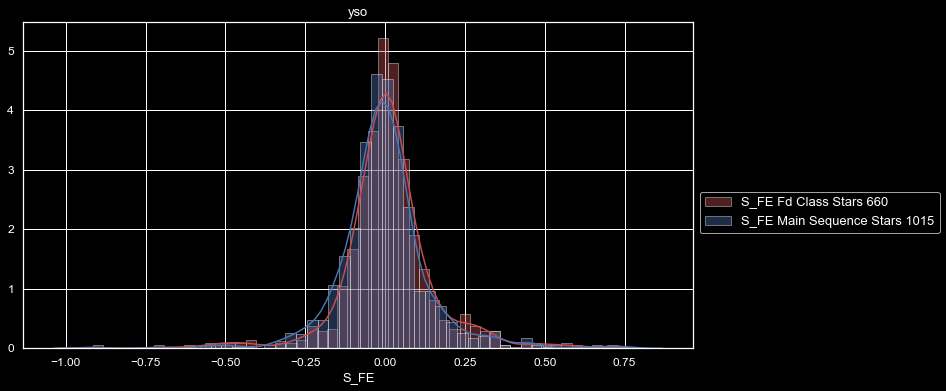


Fd Class S_FE
count    660.000000
mean       0.009923
std        0.148599
min       -0.915306
25%       -0.050893
50%        0.005117
75%        0.062338
max        0.680026
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


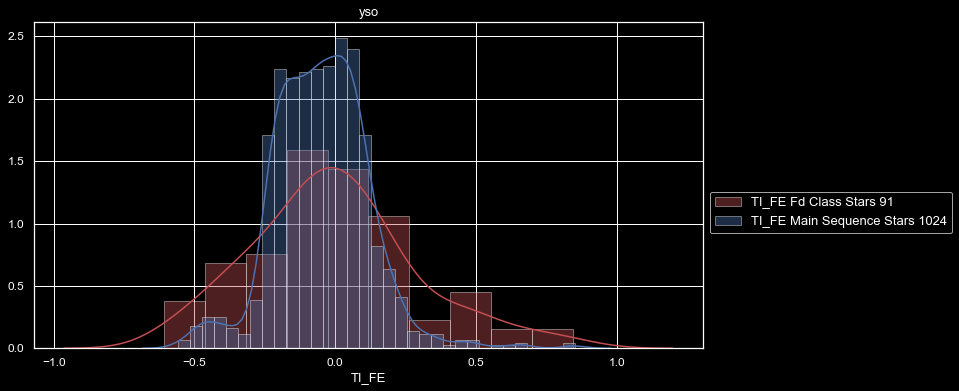


Fd Class TI_FE
count    91.000000
mean     -0.006114
std       0.293528
min      -0.607799
25%      -0.197889
50%      -0.021067
75%       0.142657
max       0.843044
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


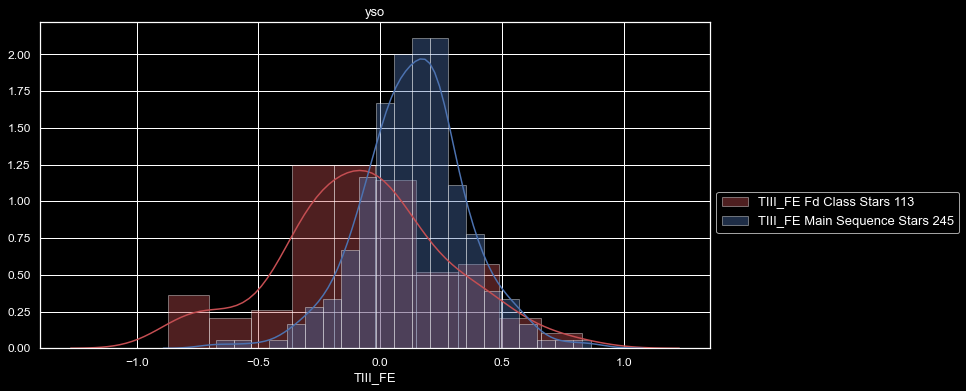


Fd Class TIII_FE
count    113.000000
mean      -0.073918
std        0.343334
min       -0.873375
25%       -0.282658
50%       -0.081945
75%        0.133900
max        0.830563
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


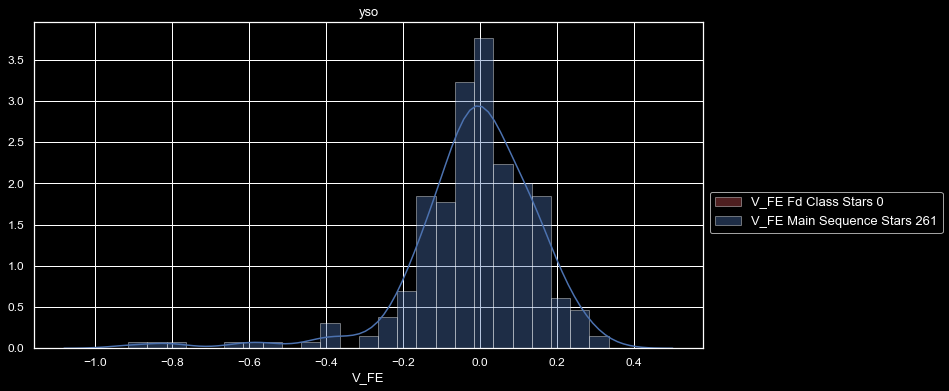


Fd Class V_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


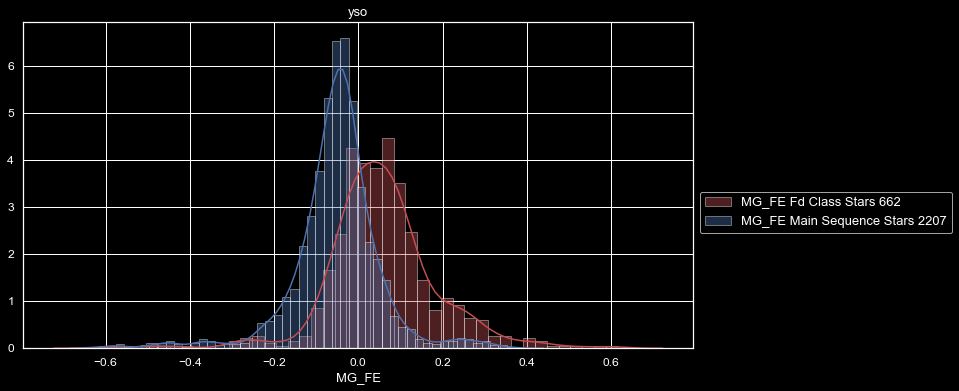


Fd Class MG_FE
count    662.000000
mean       0.057039
std        0.131149
min       -0.615638
25%       -0.010210
50%        0.050405
75%        0.114538
max        0.615451
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


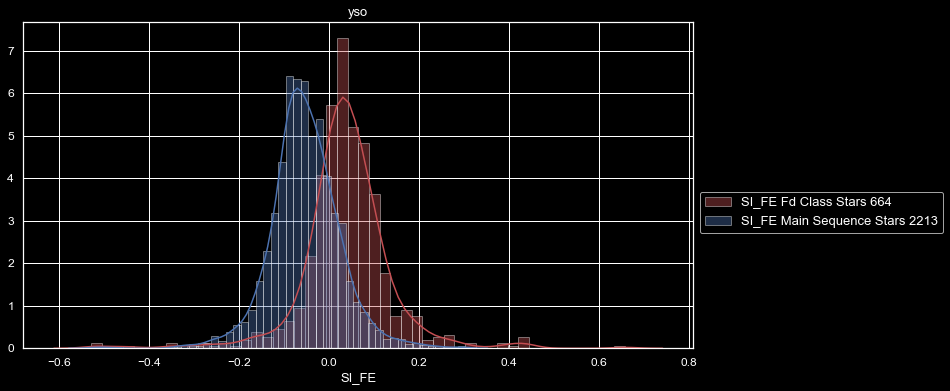


Fd Class SI_FE
count    664.000000
mean       0.038181
std        0.101791
min       -0.527908
25%       -0.002205
50%        0.036125
75%        0.081303
max        0.658071
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [36]:
Detail_View(field_list, df_Fd, "Fd Class", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


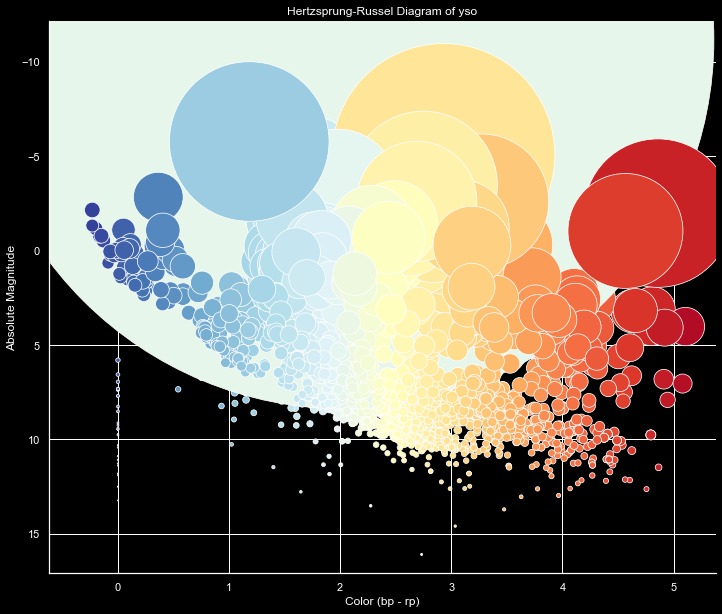

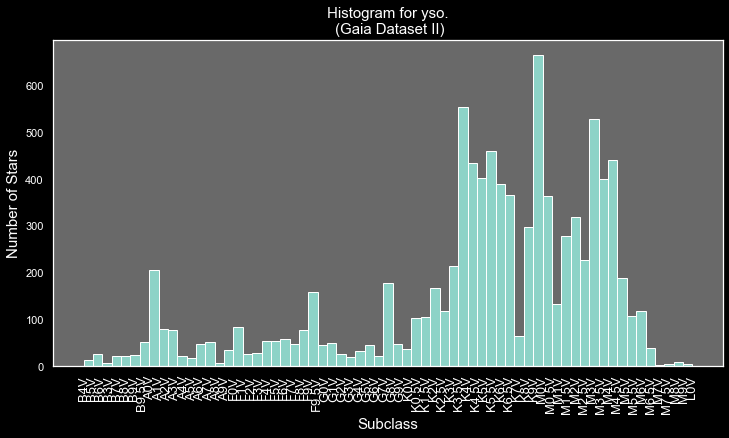

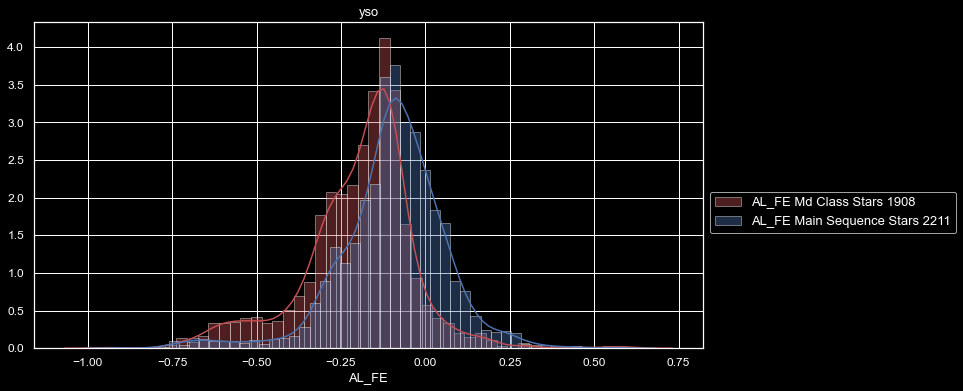


Md Class AL_FE
count    1908.000000
mean       -0.198301
std         0.167425
min        -0.959601
25%        -0.276825
50%        -0.169556
75%        -0.103233
max         0.621757
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


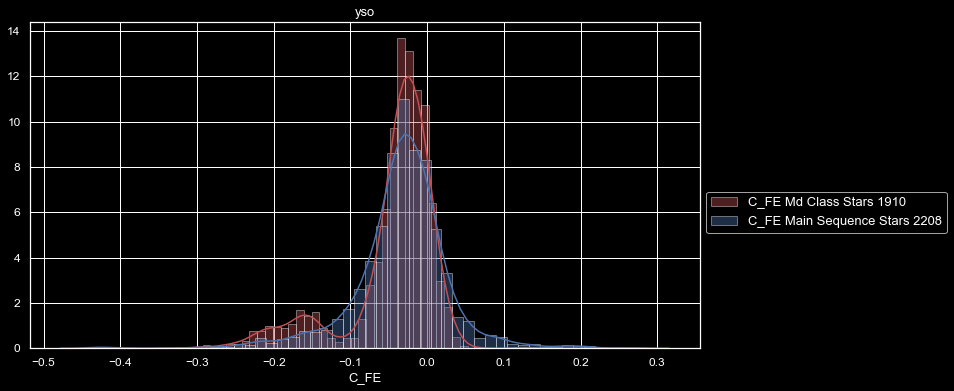


Md Class C_FE
count    1910.000000
mean       -0.045315
std         0.059100
min        -0.292781
25%        -0.053187
50%        -0.029876
75%        -0.009954
max         0.215229
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


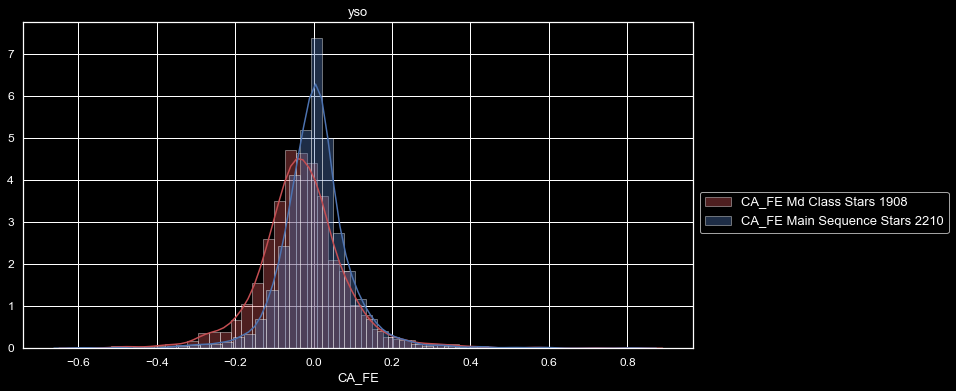


Md Class CA_FE
count    1908.000000
mean       -0.030223
std         0.116555
min        -0.571832
25%        -0.090064
50%        -0.033308
75%         0.024813
max         0.812698
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


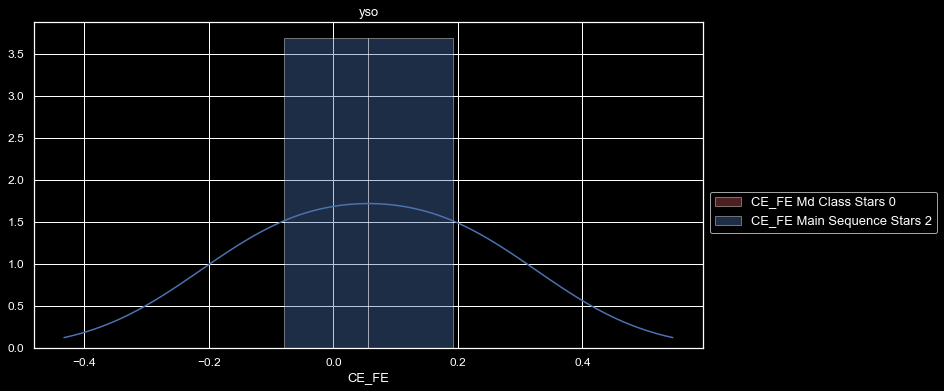


Md Class CE_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


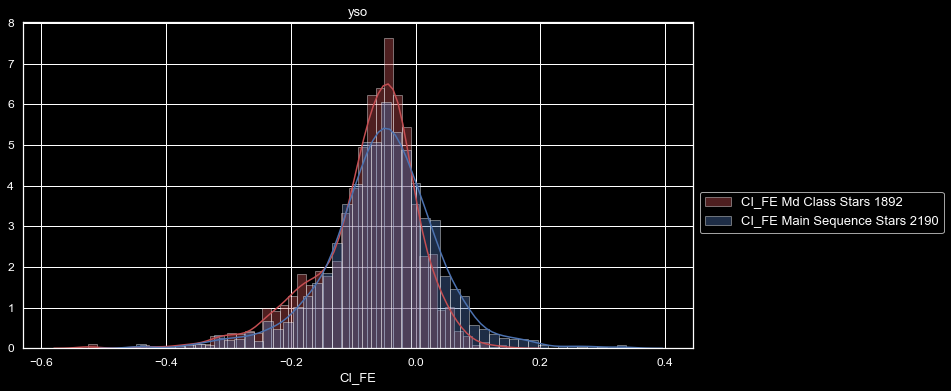


Md Class CI_FE
count    1892.000000
mean       -0.077057
std         0.082443
min        -0.525178
25%        -0.112003
50%        -0.061360
75%        -0.025019
max         0.145557
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


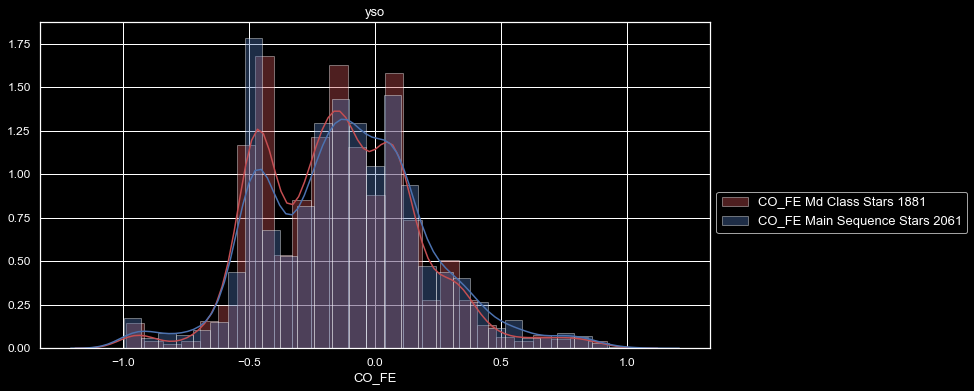


Md Class CO_FE
count    1881.000000
mean       -0.158723
std         0.338942
min        -2.103379
25%        -0.421830
50%        -0.150716
75%         0.054174
max         1.180434
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


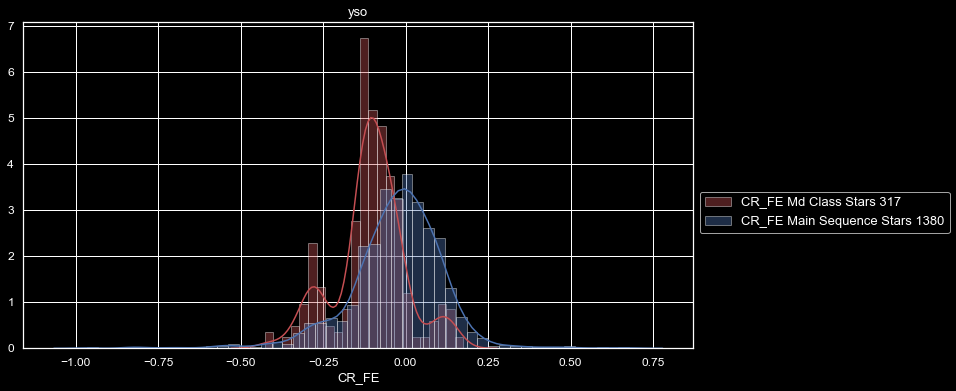


Md Class CR_FE
count    317.000000
mean      -0.106849
std        0.107491
min       -0.427427
25%       -0.142497
50%       -0.103607
75%       -0.049437
max        0.175434
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


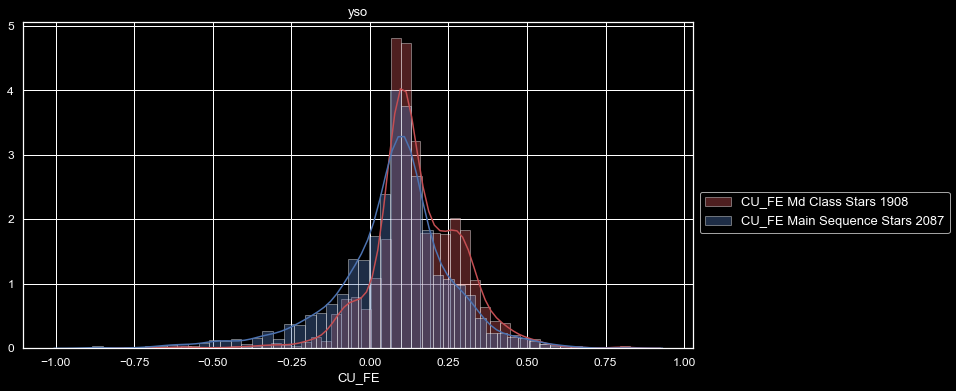


Md Class CU_FE
count    1908.000000
mean        0.148773
std         0.156709
min        -1.100494
25%         0.077105
50%         0.128244
75%         0.243740
max         1.460055
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


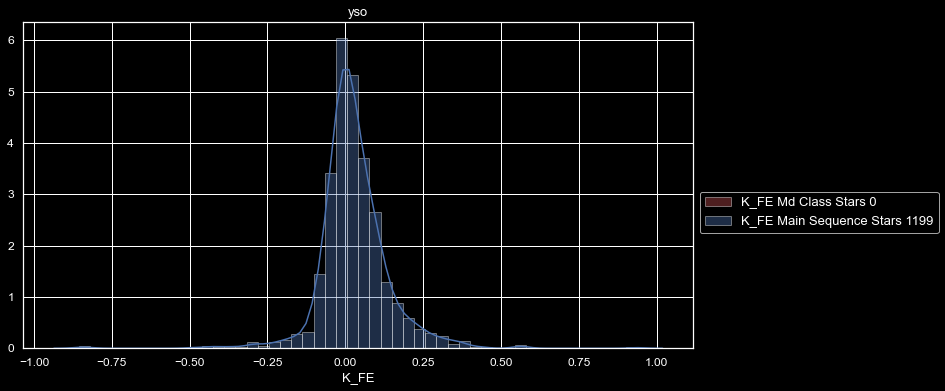


Md Class K_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


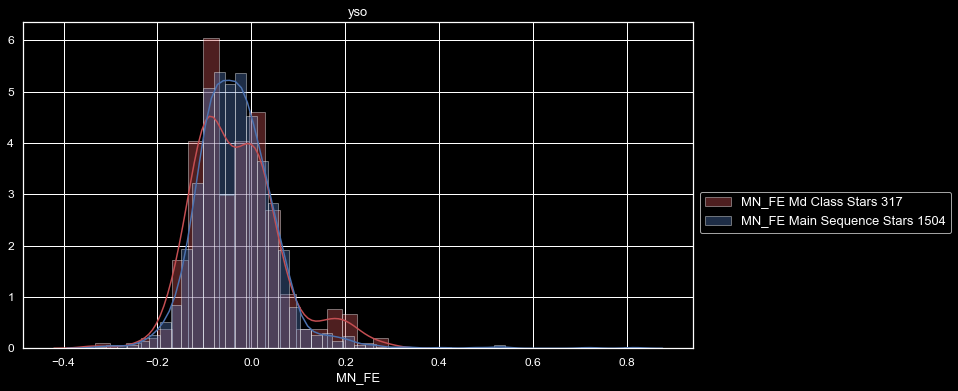


Md Class MN_FE
count    317.000000
mean      -0.032094
std        0.092571
min       -0.332876
25%       -0.095556
50%       -0.042956
75%        0.018595
max        0.291324
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


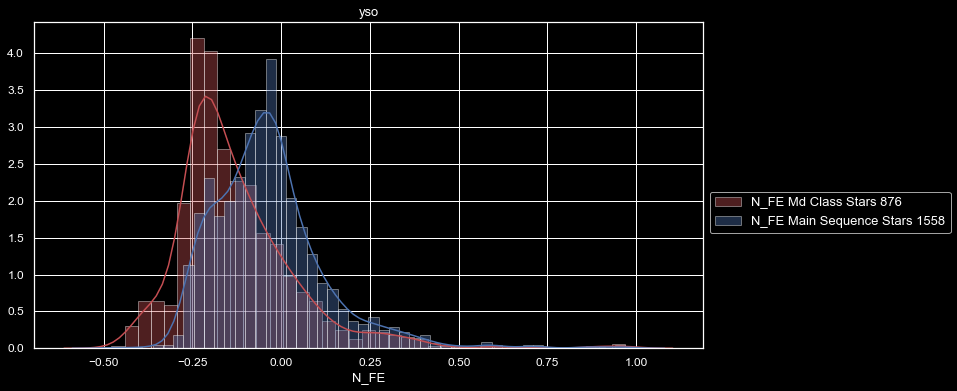


Md Class N_FE
count    876.000000
mean      -0.127048
std        0.172583
min       -0.478297
25%       -0.233062
50%       -0.169153
75%       -0.055127
max        0.969393
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


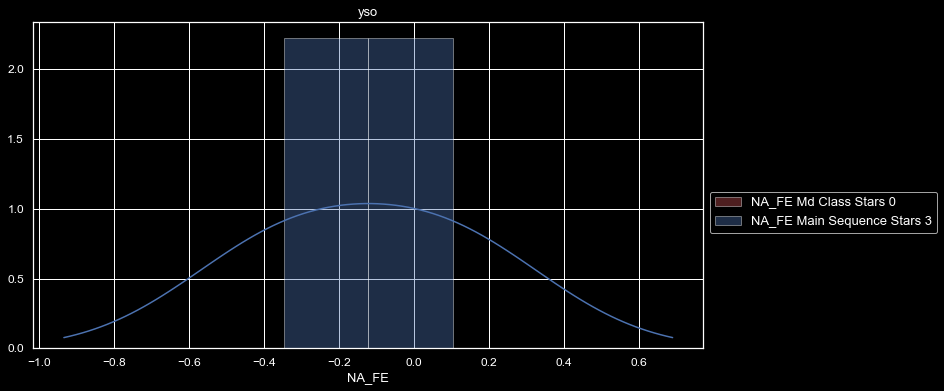


Md Class NA_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


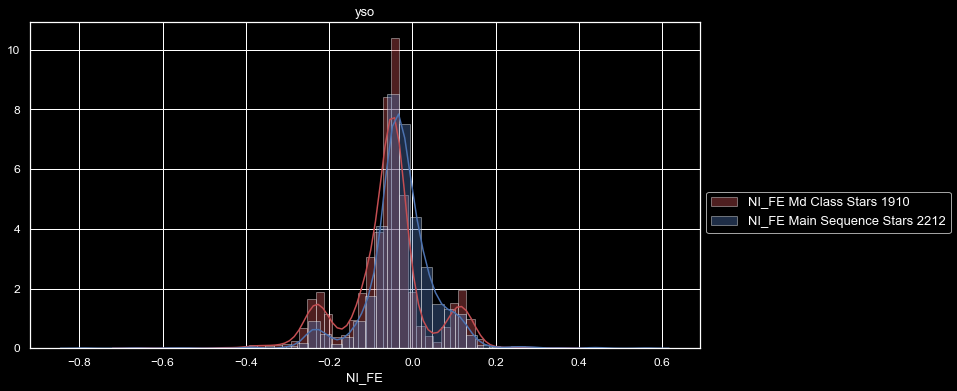


Md Class NI_FE
count    1910.000000
mean       -0.059845
std         0.098741
min        -0.655070
25%        -0.094304
50%        -0.051697
75%        -0.026824
max         0.351384
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


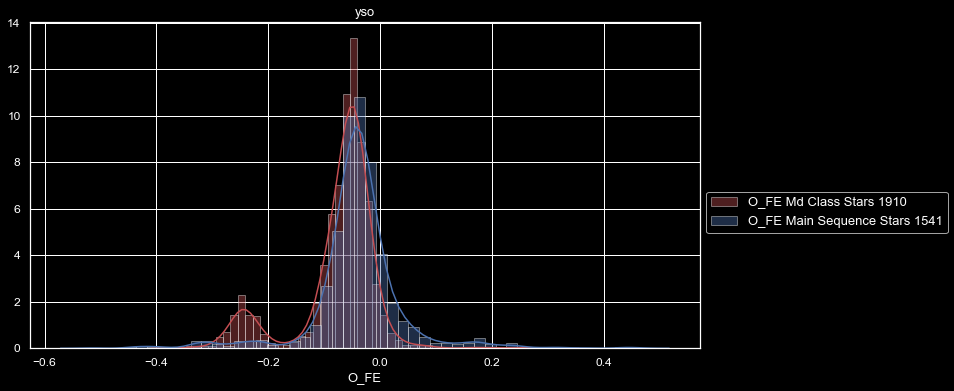


Md Class O_FE
count    1910.000000
mean       -0.075364
std         0.073412
min        -0.361020
25%        -0.087385
50%        -0.056350
75%        -0.036741
max         0.307191
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


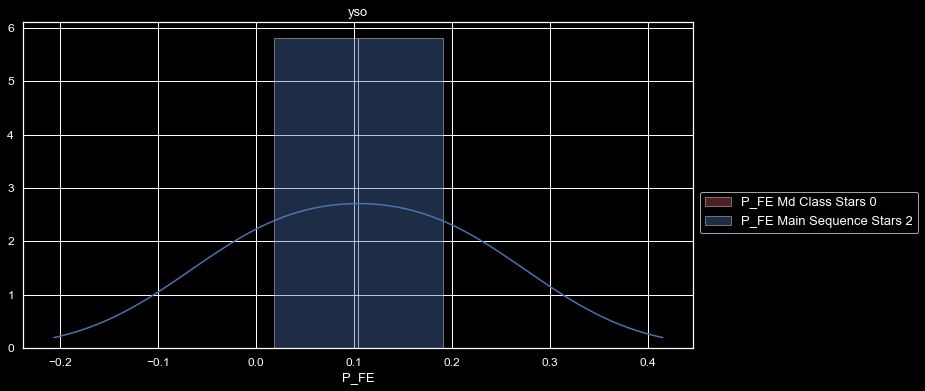


Md Class P_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


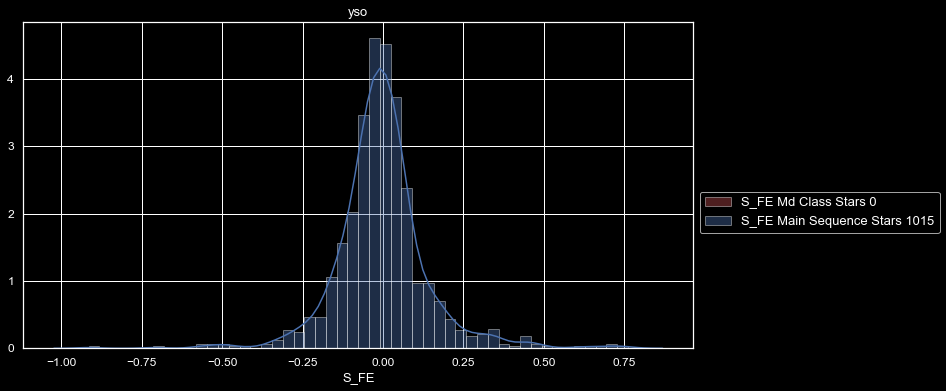


Md Class S_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


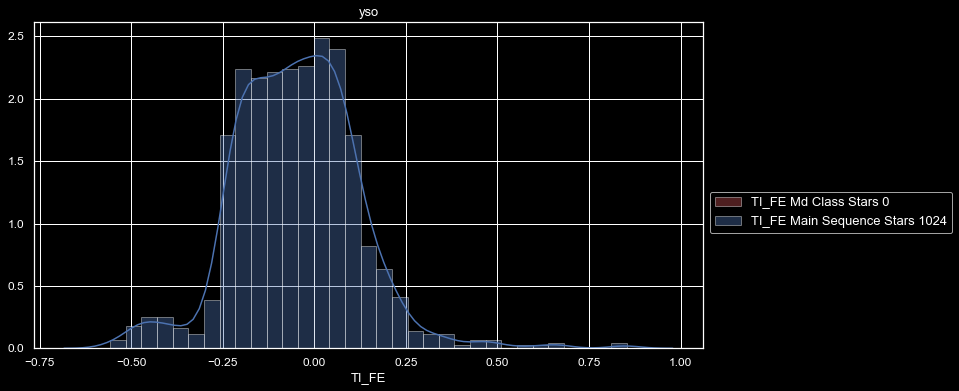


Md Class TI_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


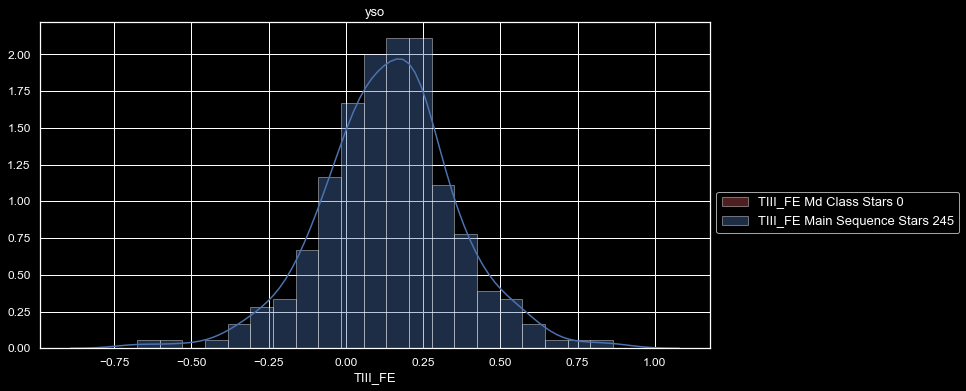


Md Class TIII_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


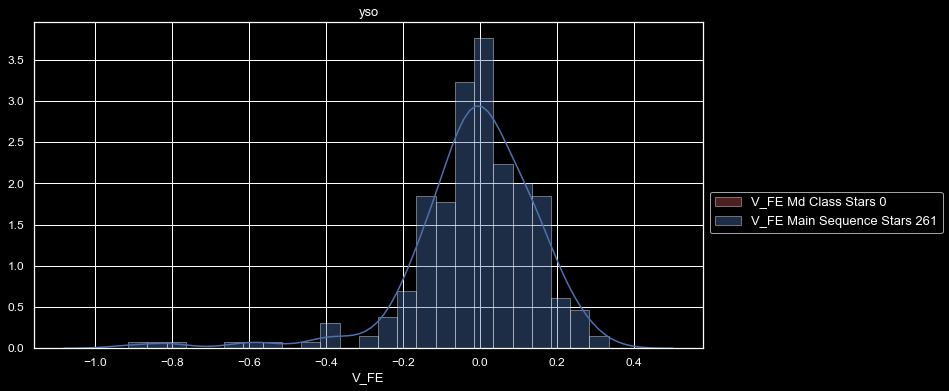


Md Class V_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


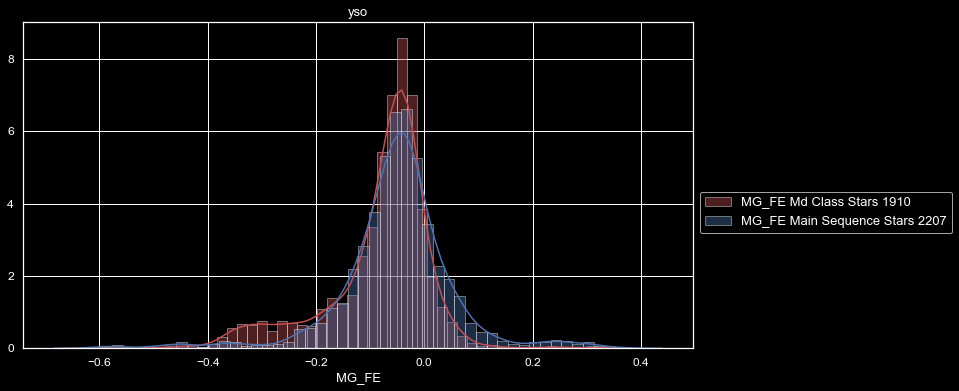


Md Class MG_FE
count    1910.000000
mean       -0.083913
std         0.097839
min        -0.603048
25%        -0.110916
50%        -0.057662
75%        -0.027280
max         0.318102
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


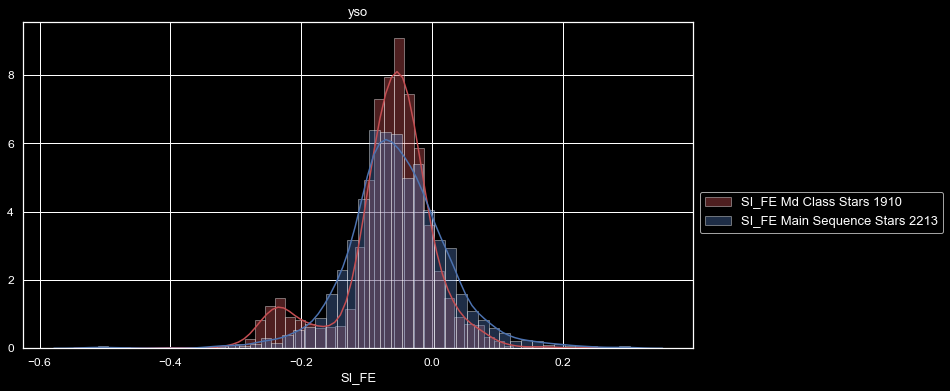


Md Class SI_FE
count    1910.000000
mean       -0.067953
std         0.074070
min        -0.498189
25%        -0.091424
50%        -0.057310
75%        -0.027277
max         0.261431
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [37]:
Detail_View(field_list, df_Md, "Md Class", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


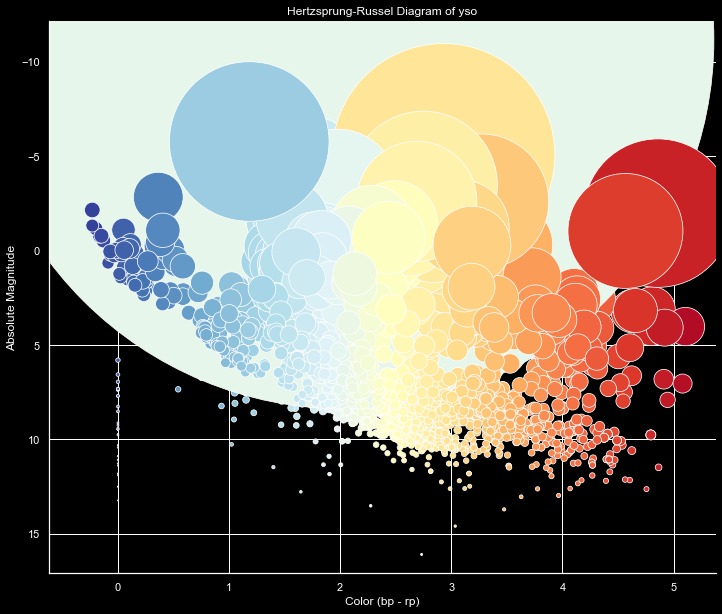

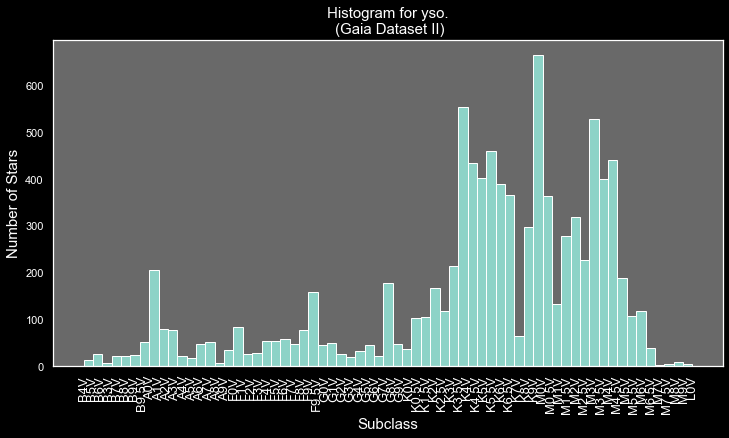

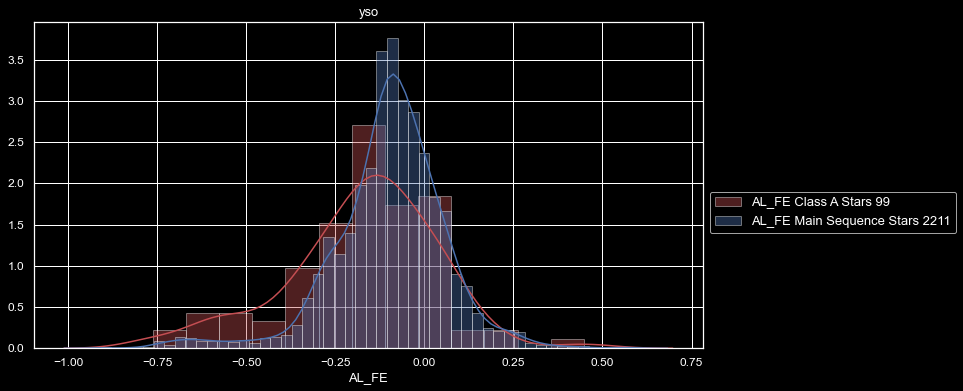


Class A AL_FE
count    99.000000
mean     -0.174708
std       0.209449
min      -0.762551
25%      -0.280936
50%      -0.138621
75%      -0.051065
max       0.447933
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


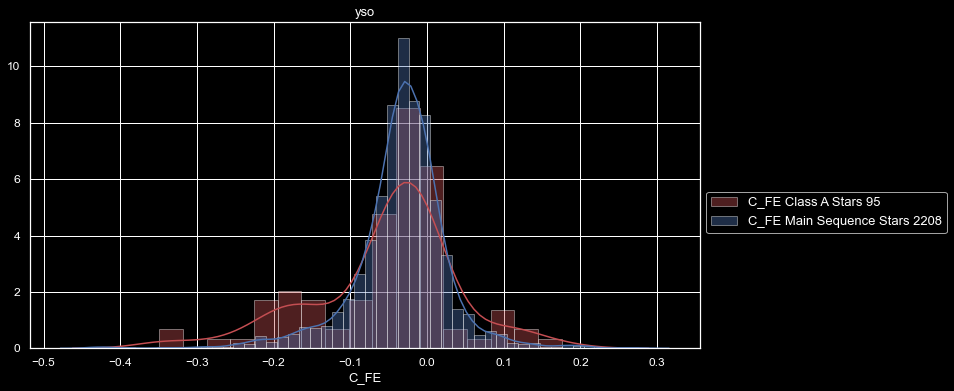


Class A C_FE
count    95.000000
mean     -0.053802
std       0.094229
min      -0.349216
25%      -0.078969
50%      -0.033927
75%      -0.004337
max       0.175703
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


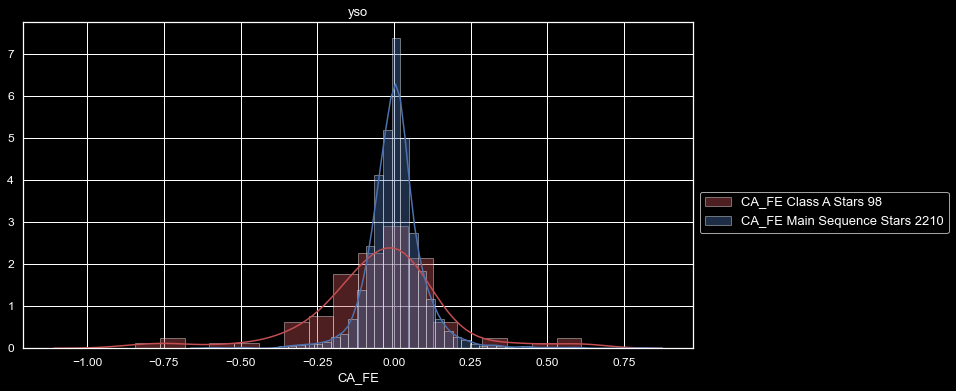


Class A CA_FE
count    98.000000
mean     -0.050241
std       0.221670
min      -0.843465
25%      -0.140366
50%      -0.032429
75%       0.046690
max       0.610628
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


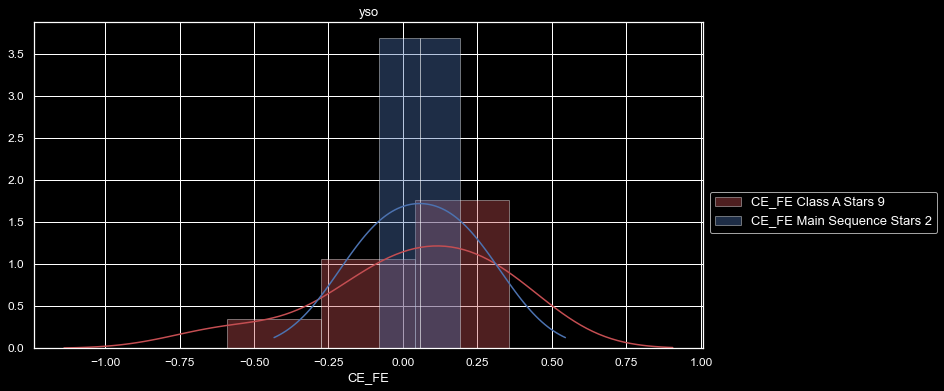


Class A CE_FE
count    9.000000
mean     0.028212
std      0.300970
min     -0.589045
25%     -0.134045
50%      0.054285
75%      0.253485
max      0.356835
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


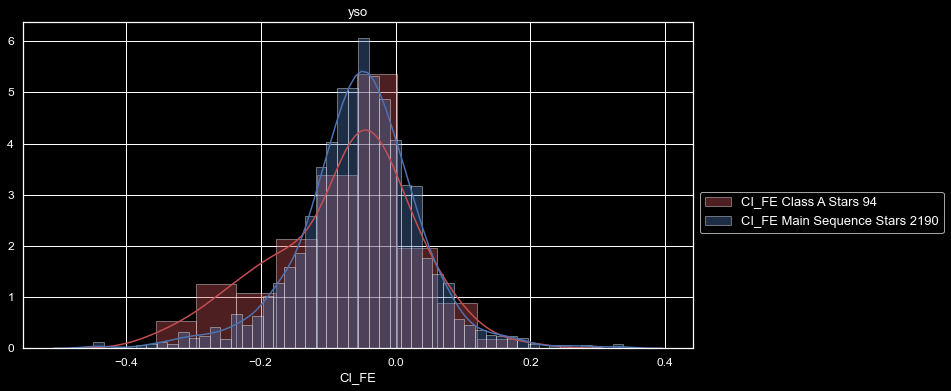


Class A CI_FE
count    94.000000
mean     -0.078363
std       0.104312
min      -0.355202
25%      -0.153755
50%      -0.056988
75%      -0.015057
max       0.180778
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


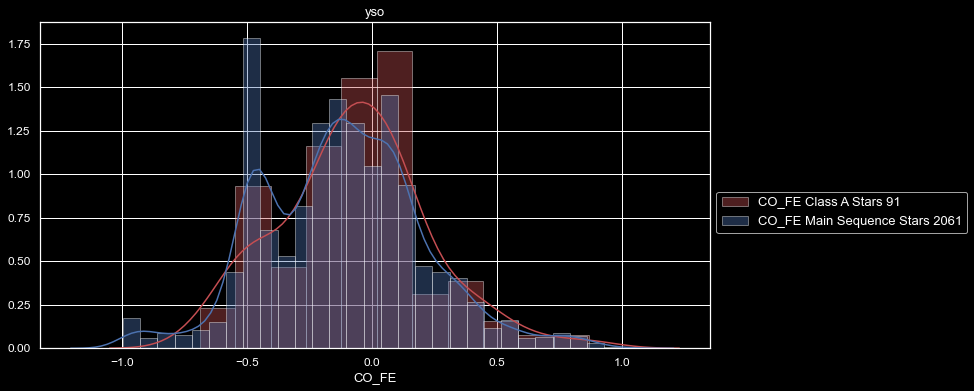


Class A CO_FE
count    91.000000
mean     -0.074703
std       0.298057
min      -0.689395
25%      -0.237051
50%      -0.070934
75%       0.104985
max       0.868150
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


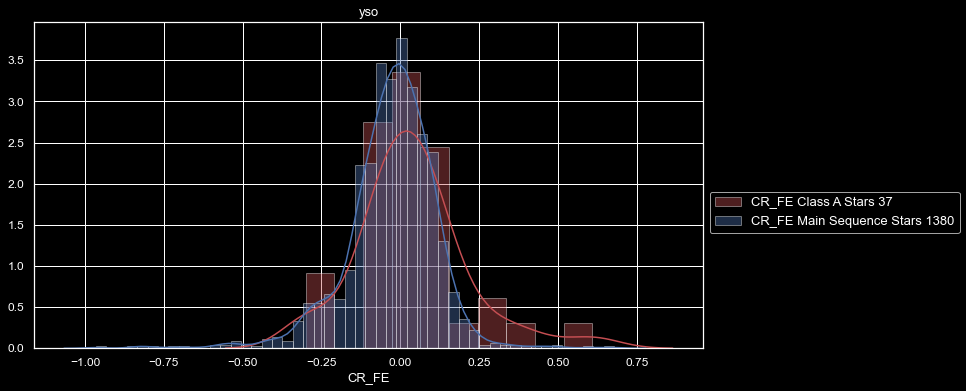


Class A CR_FE
count    37.000000
mean     -0.017884
std       0.377513
min      -2.001017
25%      -0.072133
50%       0.022453
75%       0.102098
max       0.609538
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


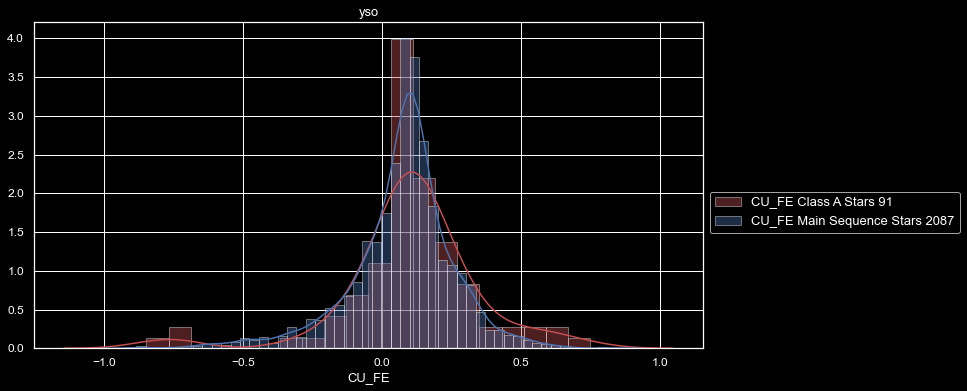


Class A CU_FE
count    91.000000
mean      0.104496
std       0.244458
min      -0.848102
25%       0.032846
50%       0.103025
75%       0.217480
max       0.748671
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


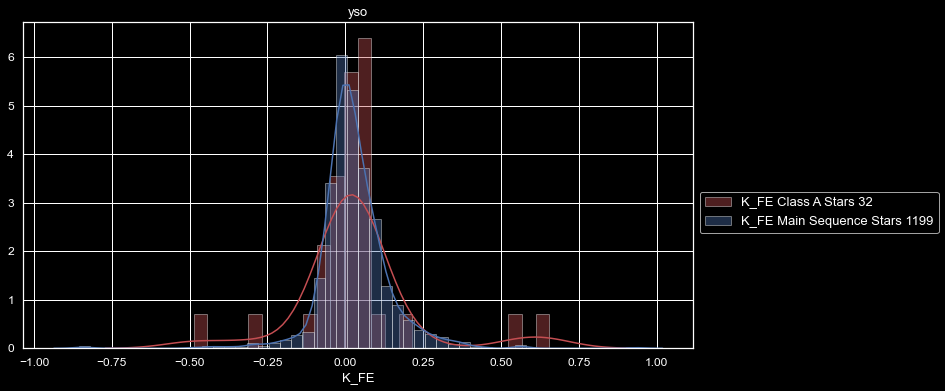


Class A K_FE
count    32.000000
mean      0.033517
std       0.192222
min      -0.487021
25%      -0.018580
50%       0.026818
75%       0.053390
max       0.654810
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


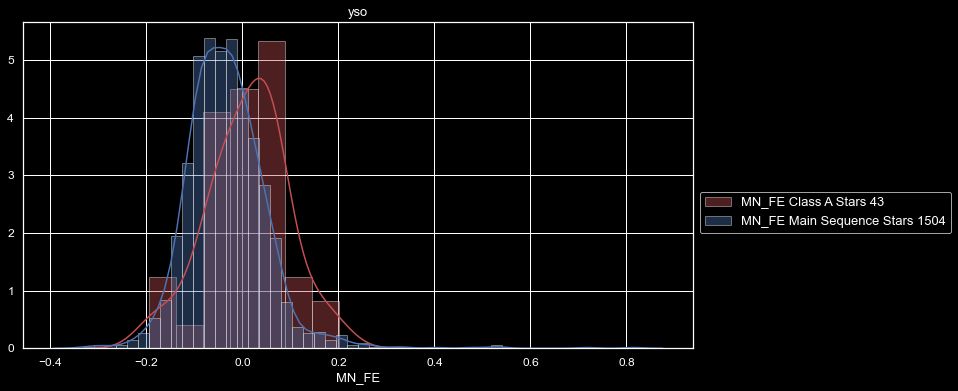


Class A MN_FE
count    43.000000
mean      0.010734
std       0.084038
min      -0.195234
25%      -0.039354
50%       0.021924
75%       0.062604
max       0.202144
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


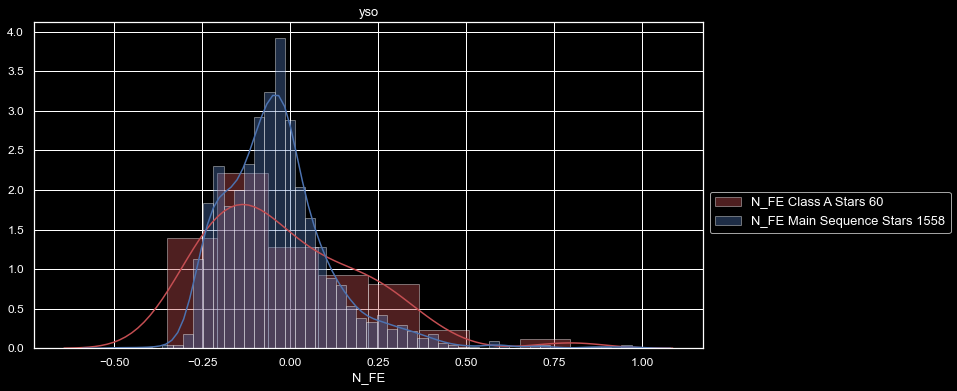


Class A N_FE
count    60.000000
mean     -0.017217
std       0.222118
min      -0.350557
25%      -0.195603
50%      -0.076169
75%       0.118471
max       0.794576
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


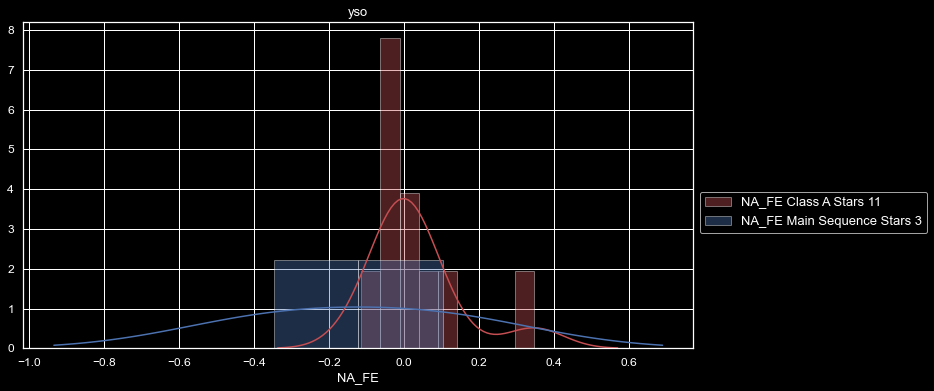


Class A NA_FE
count    11.000000
mean     -0.139948
std       0.583301
min      -1.862644
25%      -0.027420
50%      -0.015334
75%       0.039941
max       0.346636
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


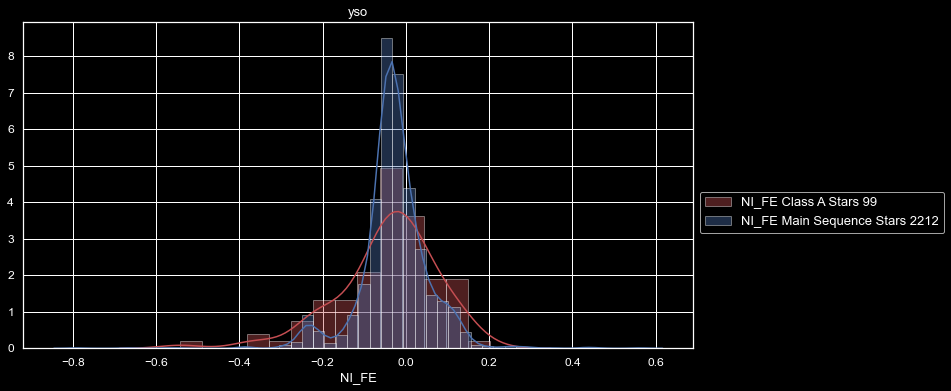


Class A NI_FE
count    99.000000
mean     -0.044981
std       0.122092
min      -0.541840
25%      -0.103927
50%      -0.031254
75%       0.027271
max       0.202920
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


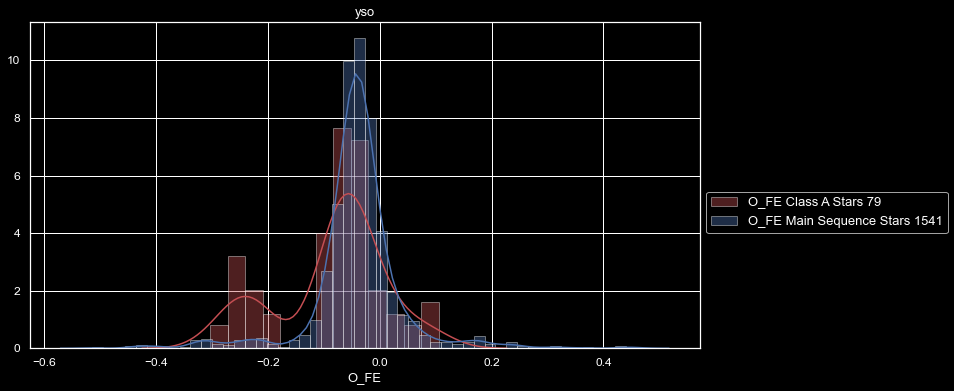


Class A O_FE
count    79.000000
mean     -0.085836
std       0.097849
min      -0.303789
25%      -0.102689
50%      -0.064965
75%      -0.034690
max       0.105565
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


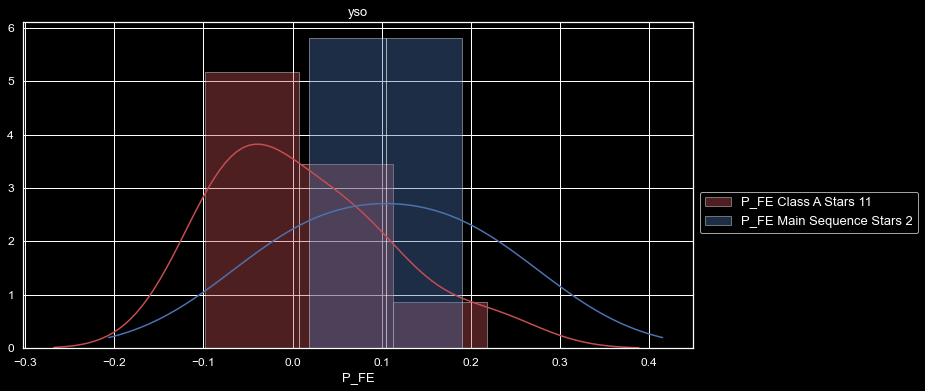


Class A P_FE
count    11.000000
mean      0.012352
std       0.095869
min      -0.097913
25%      -0.058774
50%      -0.011943
75%       0.068912
max       0.218627
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


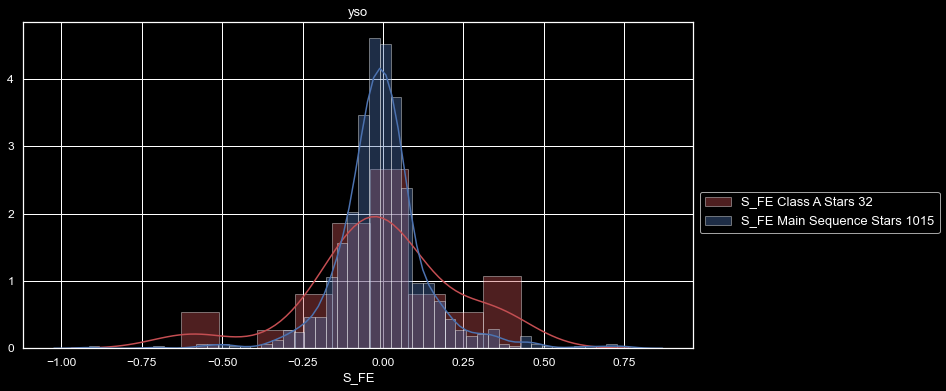


Class A S_FE
count    32.000000
mean     -0.006210
std       0.231340
min      -0.626526
25%      -0.102604
50%      -0.006656
75%       0.093558
max       0.428536
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


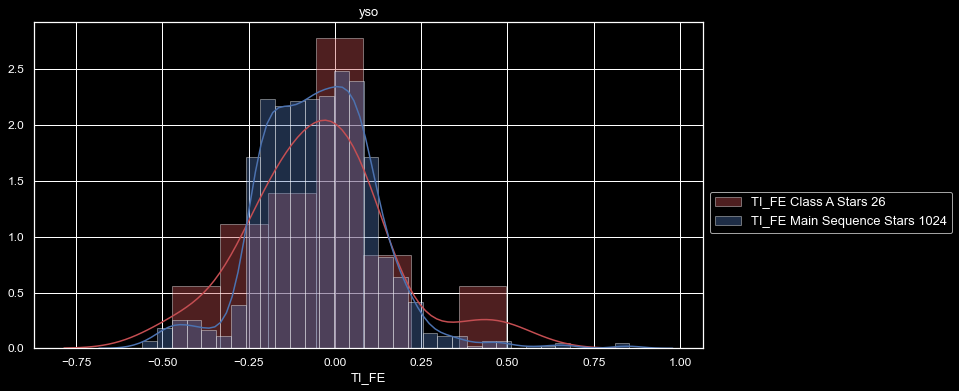


Class A TI_FE
count    26.000000
mean     -0.043811
std       0.204977
min      -0.470566
25%      -0.168717
50%      -0.035547
75%       0.053016
max       0.496323
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


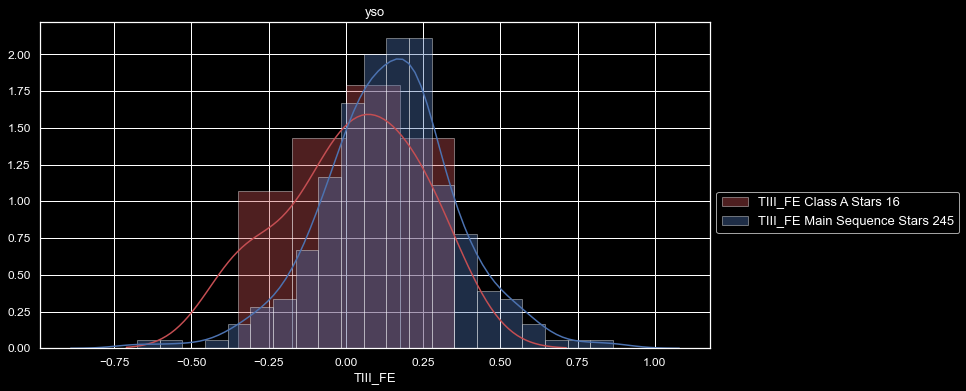


Class A TIII_FE
count    16.000000
mean      0.017497
std       0.217543
min      -0.347946
25%      -0.107258
50%       0.044248
75%       0.178491
max       0.350595
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


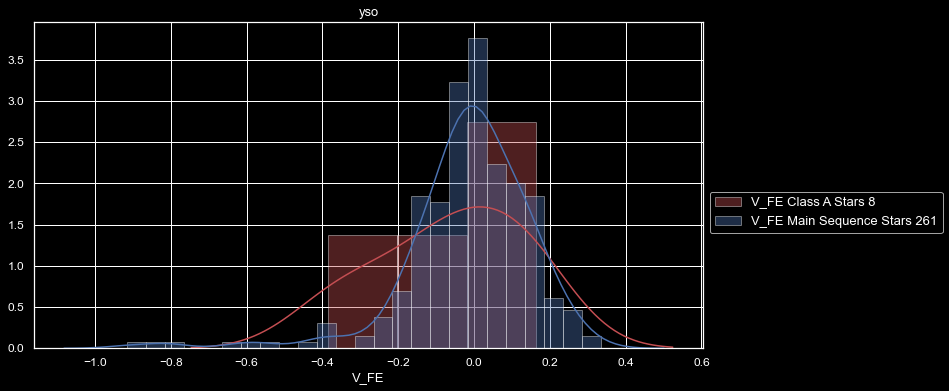


Class A V_FE
count    8.000000
mean    -0.064525
std      0.195296
min     -0.384372
25%     -0.158795
50%     -0.037318
75%      0.059951
max      0.162793
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


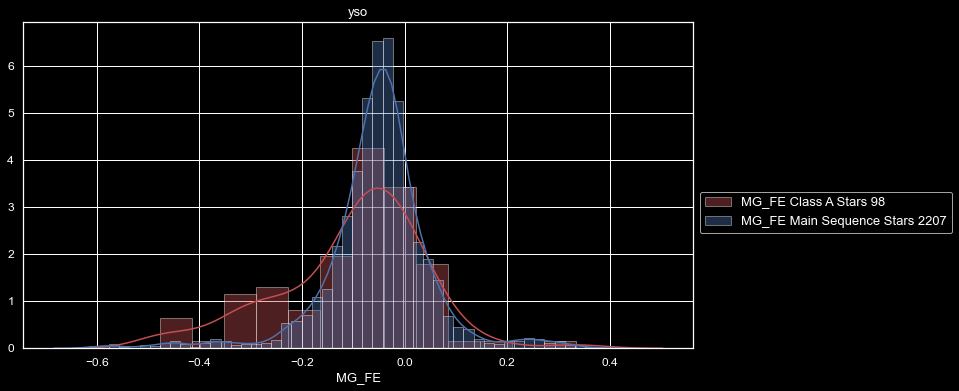


Class A MG_FE
count    98.000000
mean     -0.101929
std       0.141833
min      -0.476848
25%      -0.170213
50%      -0.074304
75%      -0.022689
max       0.334298
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


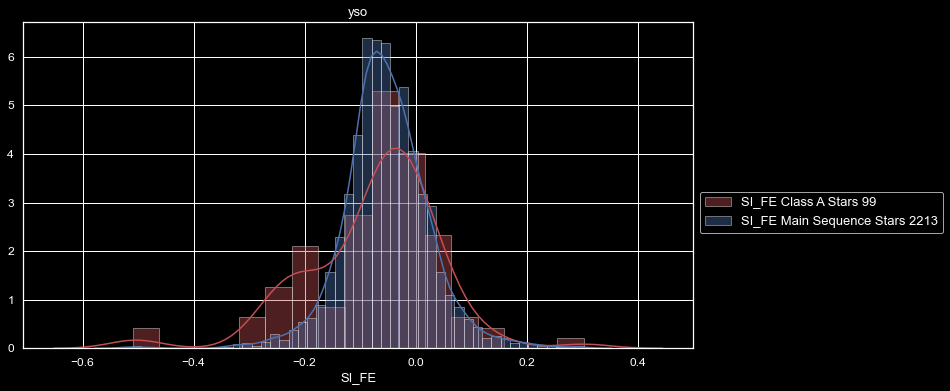


Class A SI_FE
count    99.000000
mean     -0.075789
std       0.119639
min      -0.509239
25%      -0.124932
50%      -0.045813
75%      -0.009240
max       0.302517
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


12 seconds elapsed


In [39]:
Detail_View(field_list, df_class_A, "Class A", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


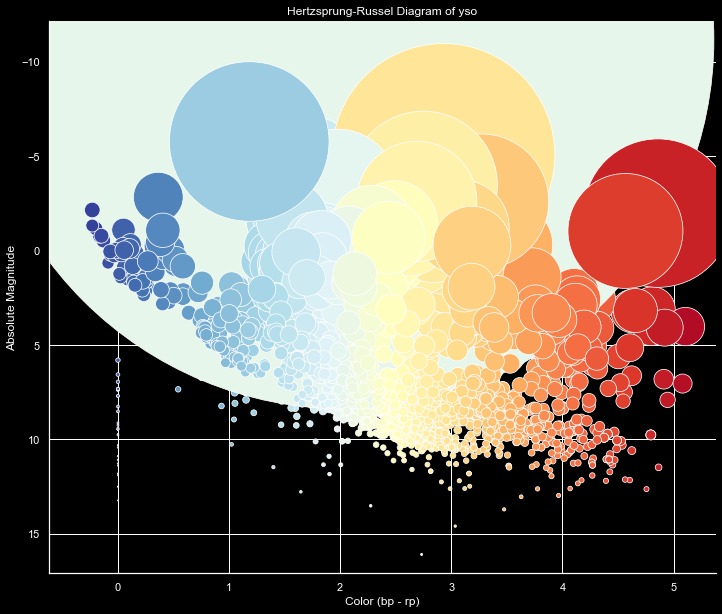

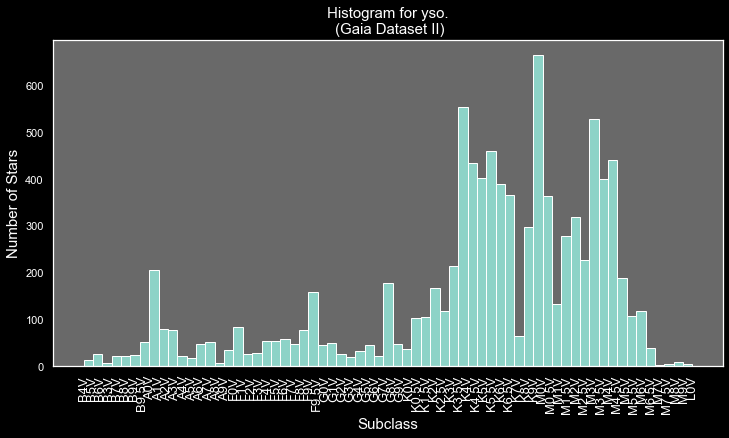

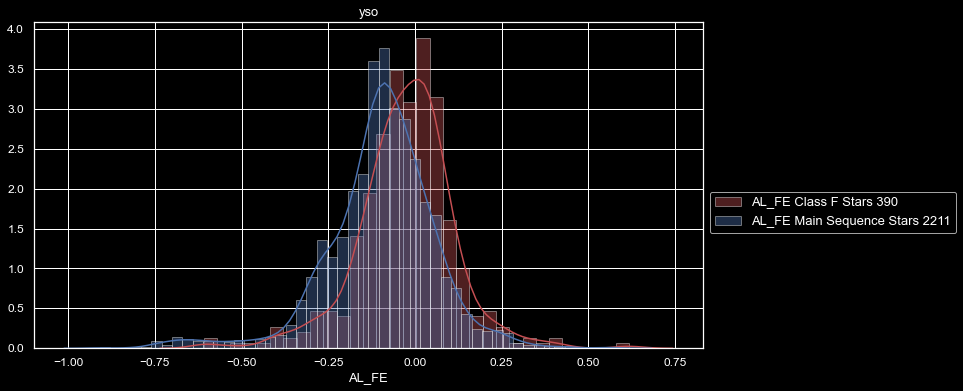


Class F AL_FE
count    390.000000
mean      -0.028139
std        0.147977
min       -1.031643
25%       -0.095976
50%       -0.018628
75%        0.046708
max        0.617028
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


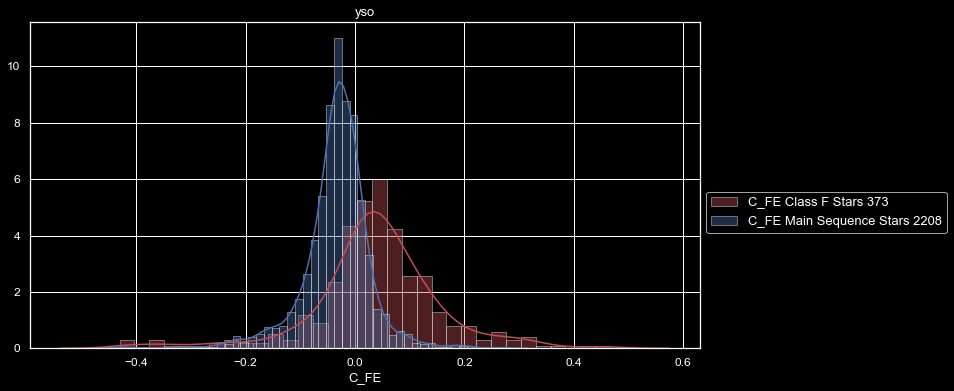


Class F C_FE
count    373.000000
mean       0.039124
std        0.117909
min       -0.430486
25%       -0.006447
50%        0.039603
75%        0.093783
max        0.466184
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


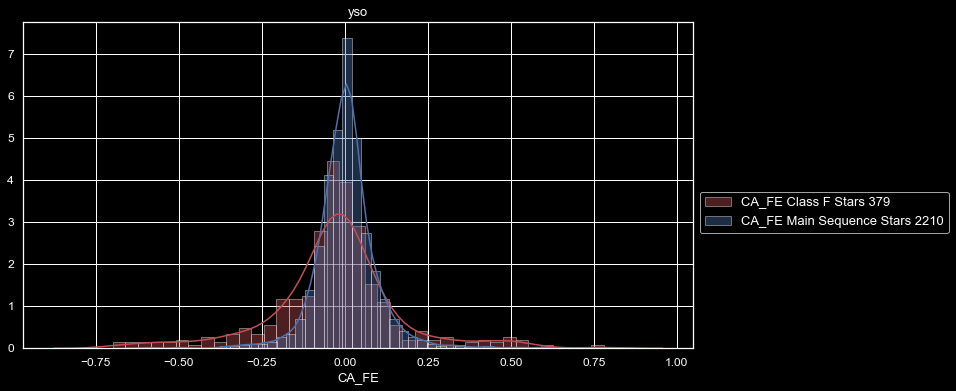


Class F CA_FE
count    379.000000
mean      -0.029550
std        0.194396
min       -0.698742
25%       -0.093469
50%       -0.023441
75%        0.044847
max        0.779868
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


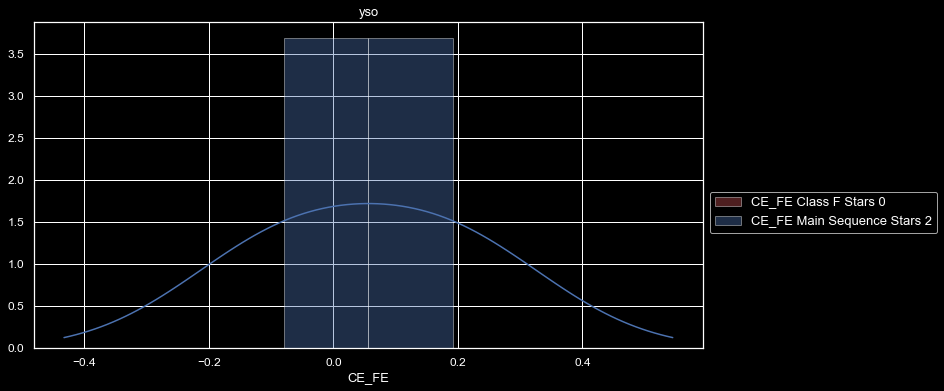


Class F CE_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


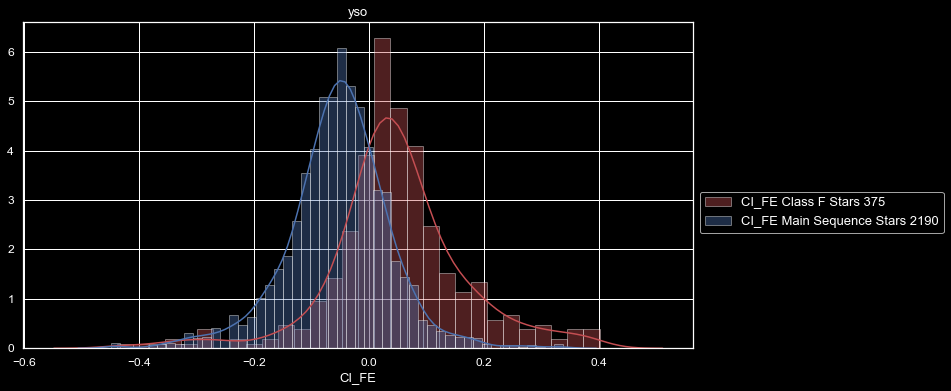


Class F CI_FE
count    375.000000
mean       0.047913
std        0.119993
min       -0.438708
25%       -0.005014
50%        0.040171
75%        0.099352
max        0.401672
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


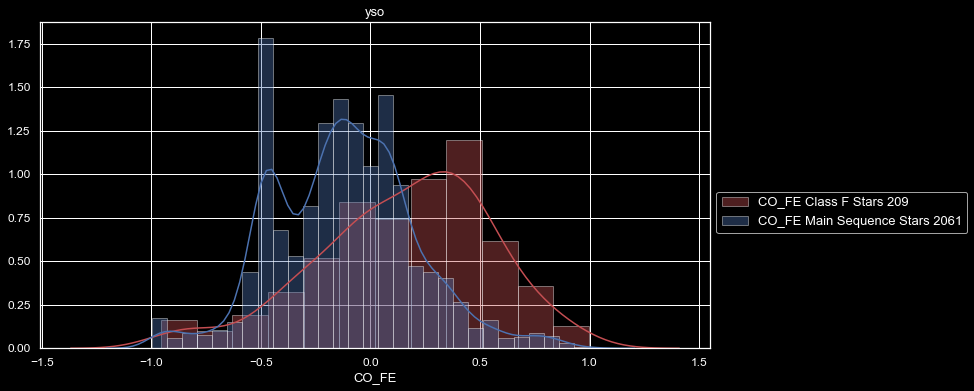


Class F CO_FE
count    209.000000
mean       0.026296
std        0.587261
min       -2.194668
25%       -0.191819
50%        0.177113
75%        0.413709
max        1.014894
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


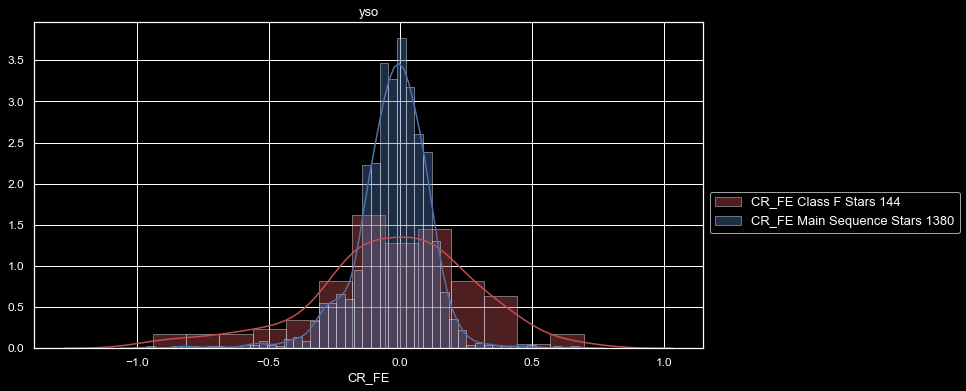


Class F CR_FE
count    144.000000
mean      -0.079034
std        0.423953
min       -2.109207
25%       -0.205174
50%       -0.020606
75%        0.154787
max        1.056068
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


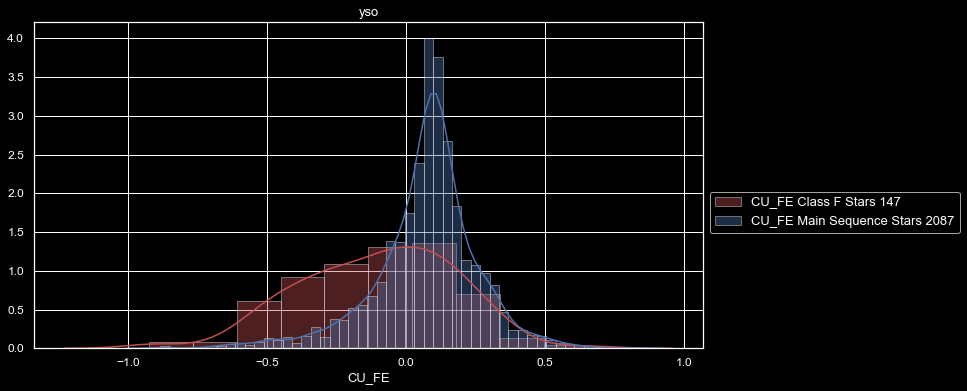


Class F CU_FE
count    147.000000
mean      -0.115801
std        0.296078
min       -1.069065
25%       -0.315140
50%       -0.072773
75%        0.113667
max        0.655176
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


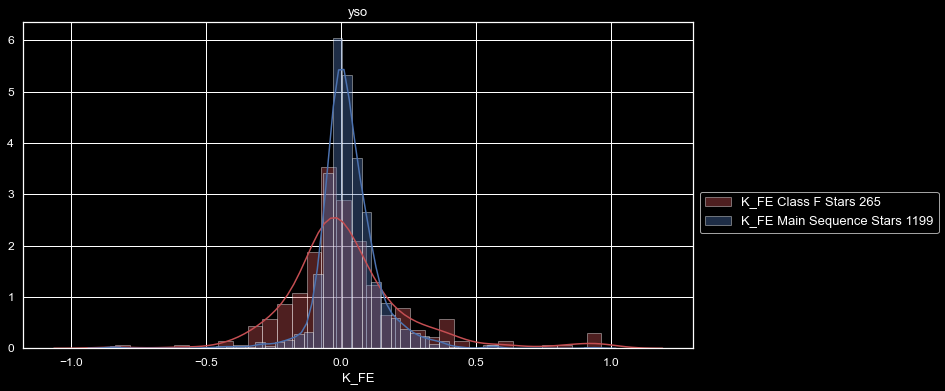


Class F K_FE
count    265.000000
mean      -0.035631
std        0.393536
min       -2.033995
25%       -0.094305
50%       -0.016025
75%        0.089552
max        1.025800
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


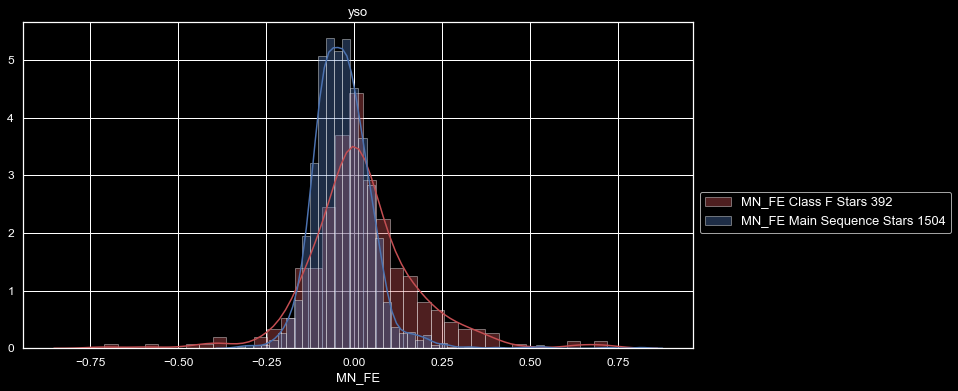


Class F MN_FE
count    392.000000
mean       0.017758
std        0.169658
min       -1.268756
25%       -0.058634
50%        0.008704
75%        0.085538
max        0.718544
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


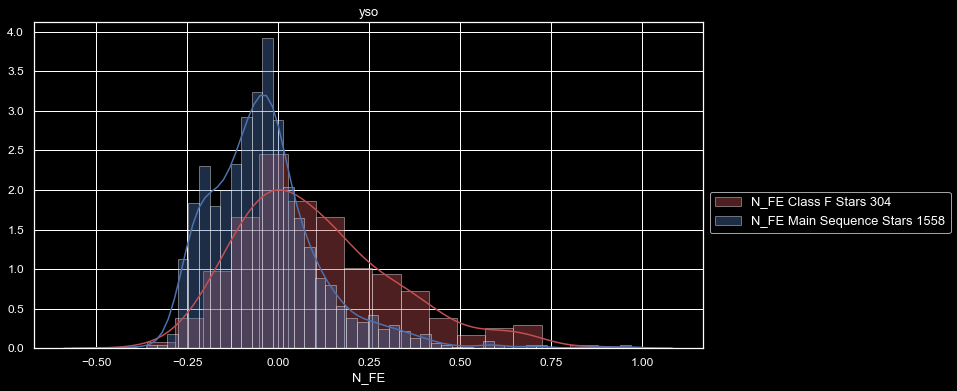


Class F N_FE
count    304.000000
mean       0.102472
std        0.214937
min       -0.361917
25%       -0.044003
50%        0.068170
75%        0.219399
max        0.879333
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


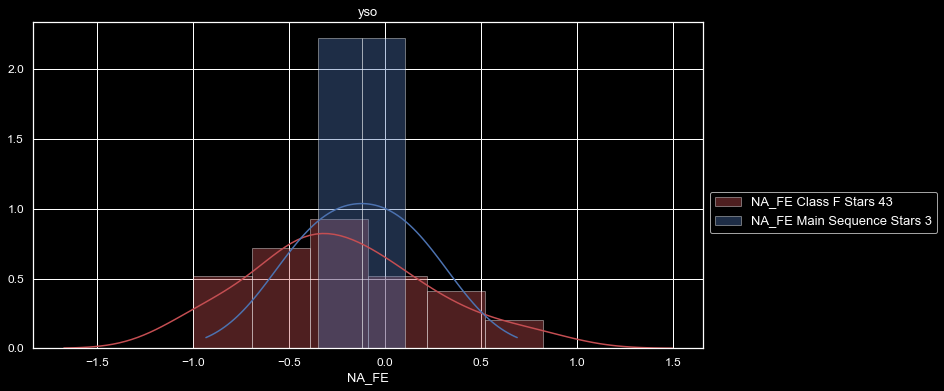


Class F NA_FE
count    43.000000
mean     -0.575545
std       0.726245
min      -2.285414
25%      -1.040614
50%      -0.454874
75%      -0.060218
max       0.823176
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


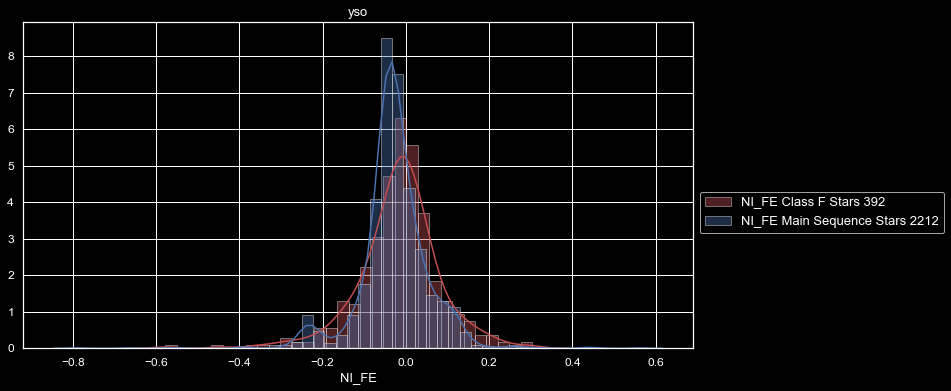


Class F NI_FE
count    392.000000
mean      -0.017001
std        0.100626
min       -0.577632
25%       -0.064601
50%       -0.011804
75%        0.036195
max        0.303692
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


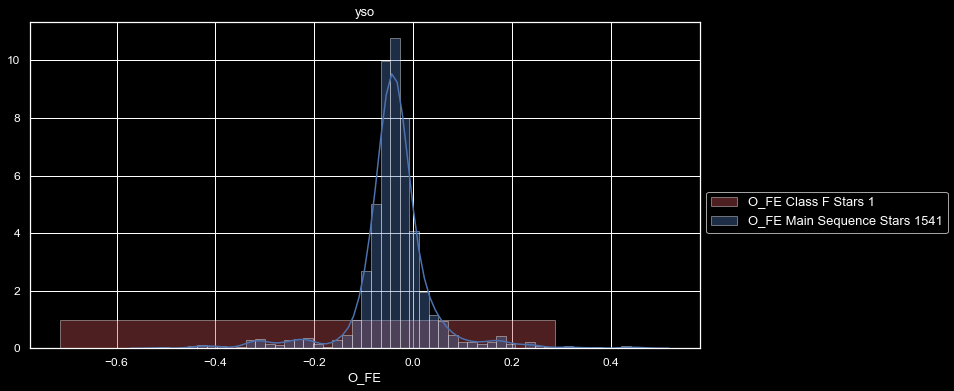


Class F O_FE
count    1.000000
mean    -0.213508
std           NaN
min     -0.213508
25%     -0.213508
50%     -0.213508
75%     -0.213508
max     -0.213508
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


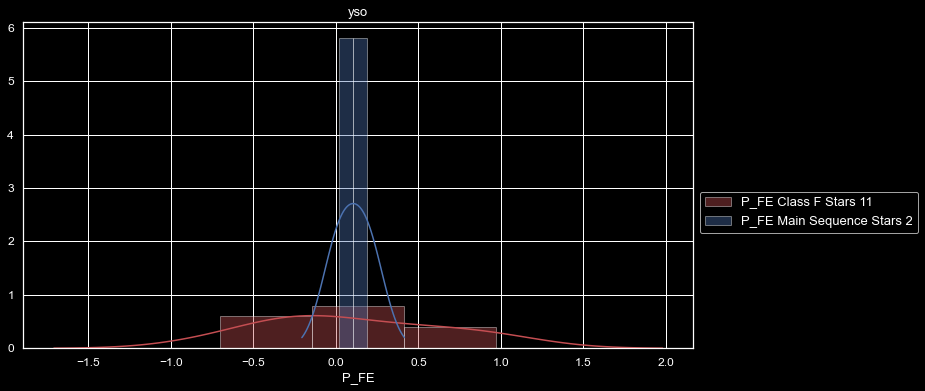


Class F P_FE
count    11.000000
mean     -0.164354
std       0.791895
min      -1.723283
25%      -0.504948
50%      -0.138697
75%       0.356042
max       0.972857
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


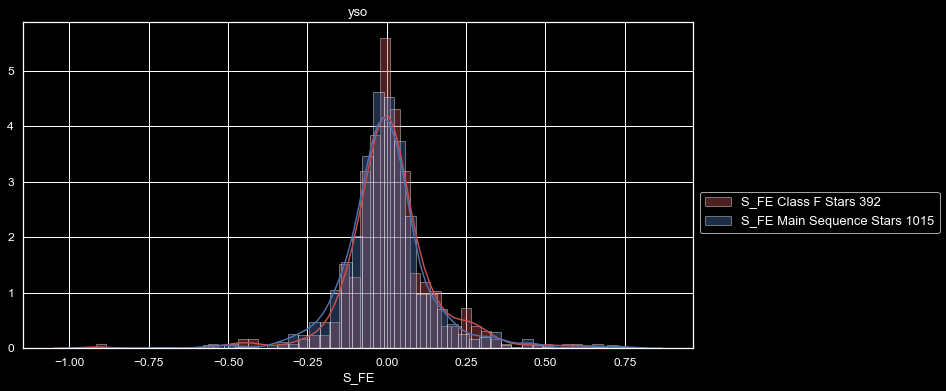


Class F S_FE
count    392.000000
mean       0.010982
std        0.146872
min       -0.915306
25%       -0.052656
50%        0.002632
75%        0.057824
max        0.680026
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


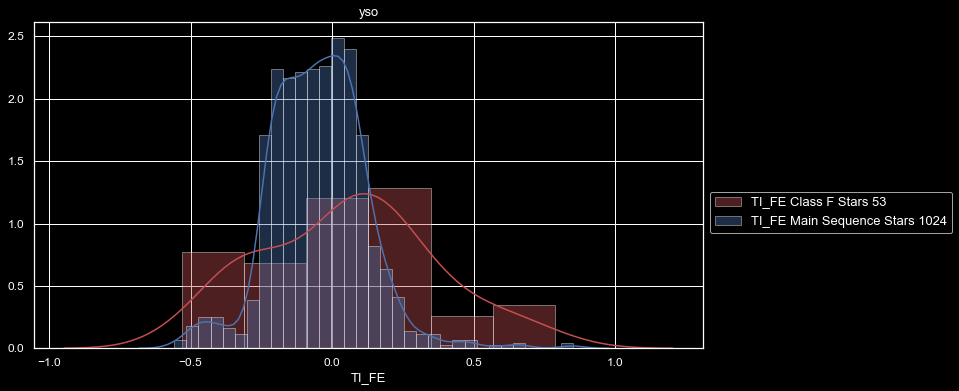


Class F TI_FE
count    53.000000
mean      0.056168
std       0.310132
min      -0.530929
25%      -0.220396
50%       0.063110
75%       0.230501
max       0.787361
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


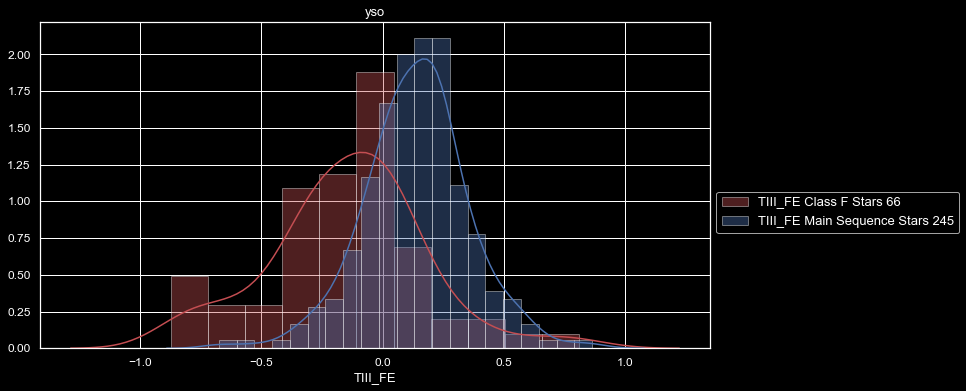


Class F TIII_FE
count    66.000000
mean     -0.146489
std       0.321494
min      -0.873375
25%      -0.314052
50%      -0.116934
75%       0.021407
max       0.810690
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


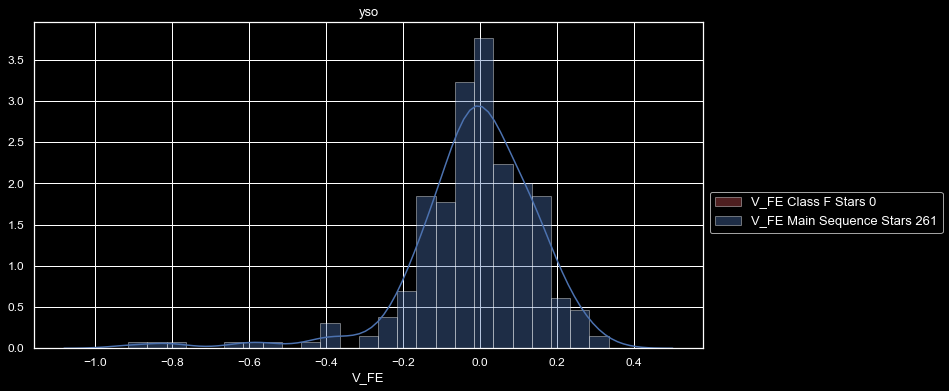


Class F V_FE
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


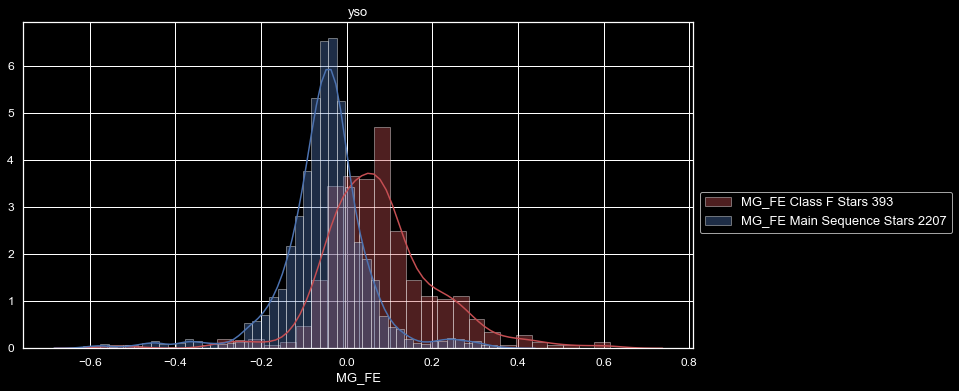


Class F MG_FE
count    393.000000
mean       0.075043
std        0.134953
min       -0.560258
25%       -0.006129
50%        0.065030
75%        0.129355
max        0.615451
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


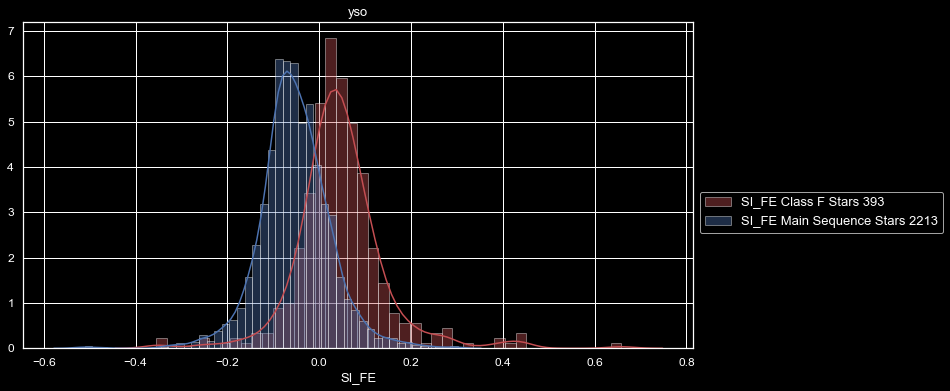


Class F SI_FE
count    393.000000
mean       0.045928
std        0.099362
min       -0.354778
25%       -0.001111
50%        0.038581
75%        0.083702
max        0.658071
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [40]:
Detail_View(field_list, df_class_F, "Class F", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


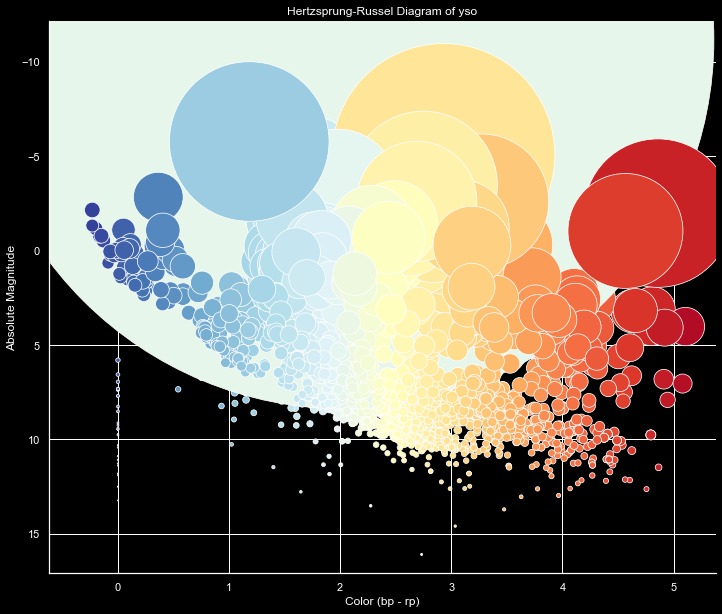

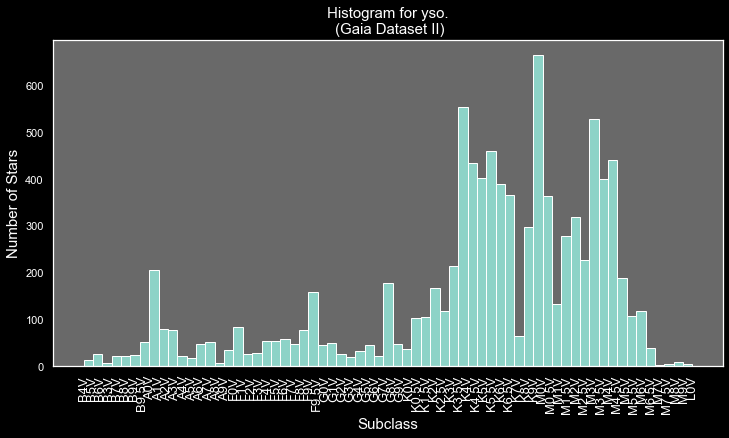

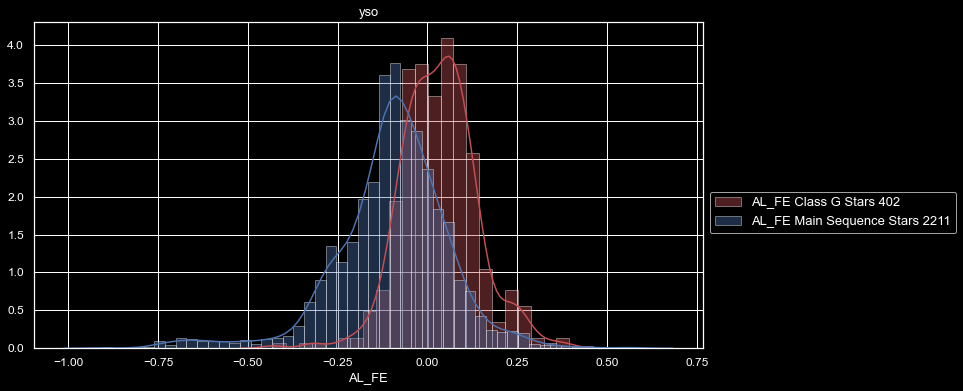


Class G AL_FE
count    402.000000
mean       0.032564
std        0.104904
min       -0.429502
25%       -0.037856
50%        0.029782
75%        0.094673
max        0.394929
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


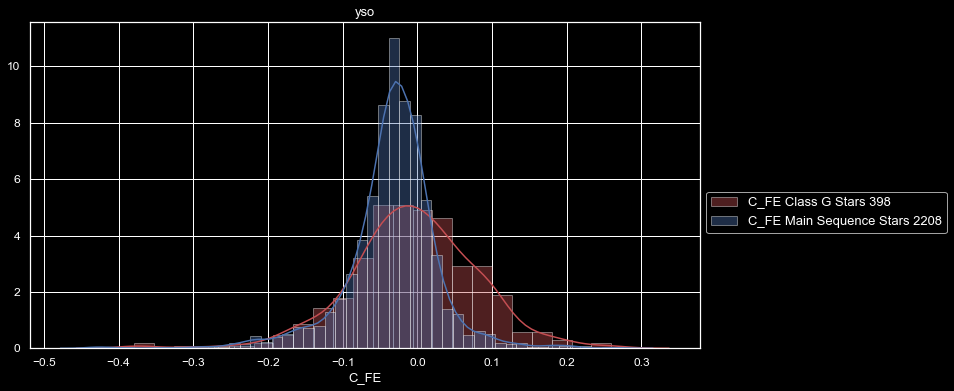


Class G C_FE
count    398.000000
mean      -0.005439
std        0.085628
min       -0.378965
25%       -0.053538
50%       -0.005729
75%        0.048287
max        0.259717
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


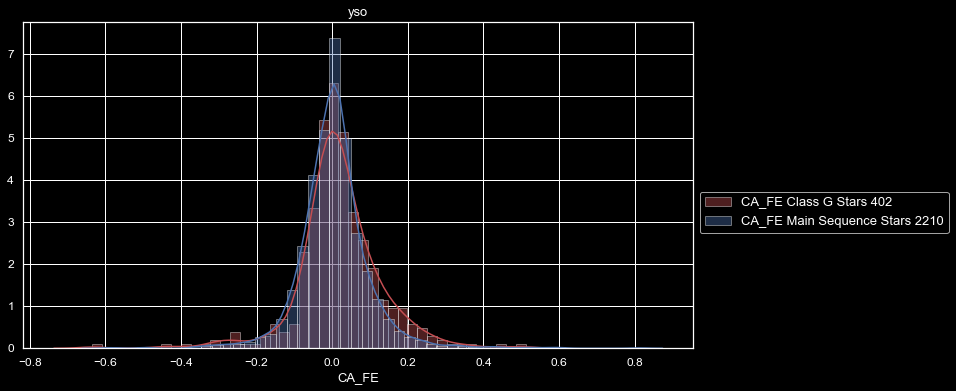


Class G CA_FE
count    402.000000
mean       0.019074
std        0.112522
min       -0.634372
25%       -0.029215
50%        0.010790
75%        0.068308
max        0.511398
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


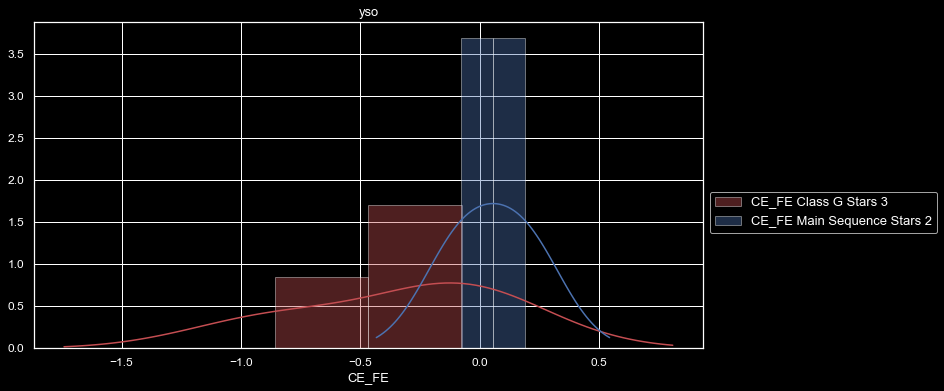


Class G CE_FE
count    3.000000
mean    -0.337002
std      0.450063
min     -0.856685
25%     -0.467905
50%     -0.079125
75%     -0.077160
max     -0.075195
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


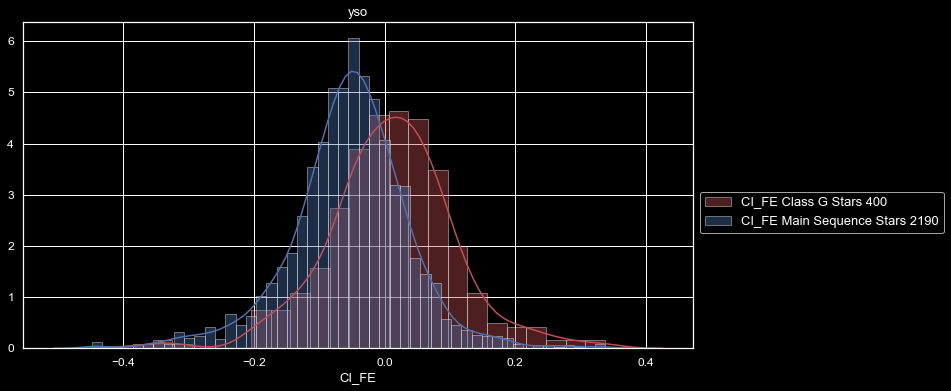


Class G CI_FE
count    400.000000
mean       0.010303
std        0.097520
min       -0.385447
25%       -0.046916
50%        0.011386
75%        0.067307
max        0.337822
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


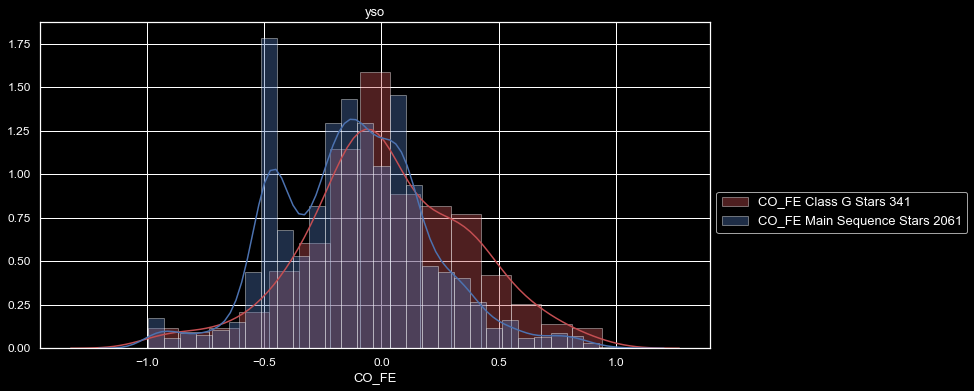


Class G CO_FE
count    341.000000
mean      -0.002812
std        0.408021
min       -1.669769
25%       -0.197076
50%       -0.012780
75%        0.257727
max        1.346072
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


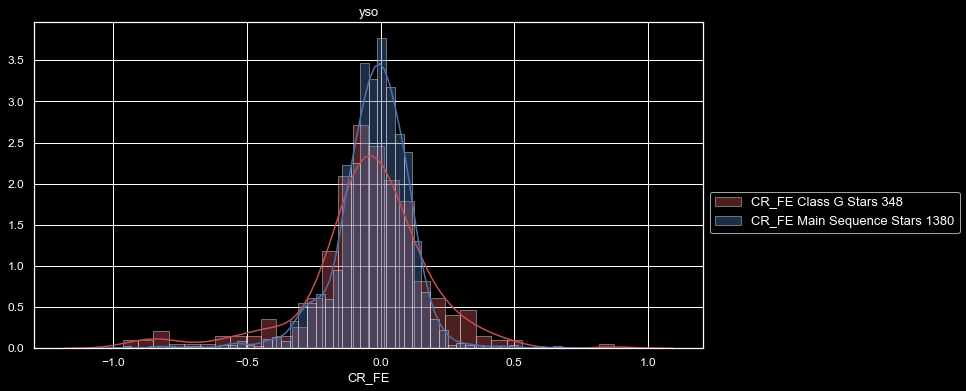


Class G CR_FE
count    348.000000
mean      -0.079456
std        0.300041
min       -1.973622
25%       -0.147170
50%       -0.042876
75%        0.072815
max        0.873623
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


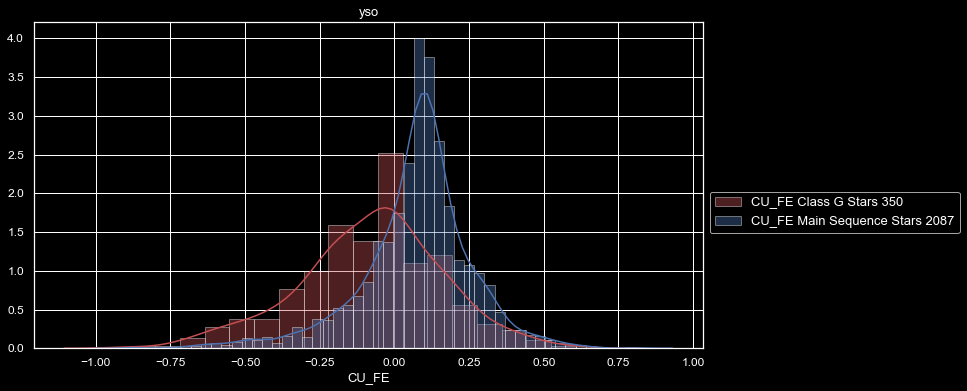


Class G CU_FE
count    350.000000
mean      -0.083269
std        0.244580
min       -1.071362
25%       -0.220749
50%       -0.054614
75%        0.076082
max        0.607505
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


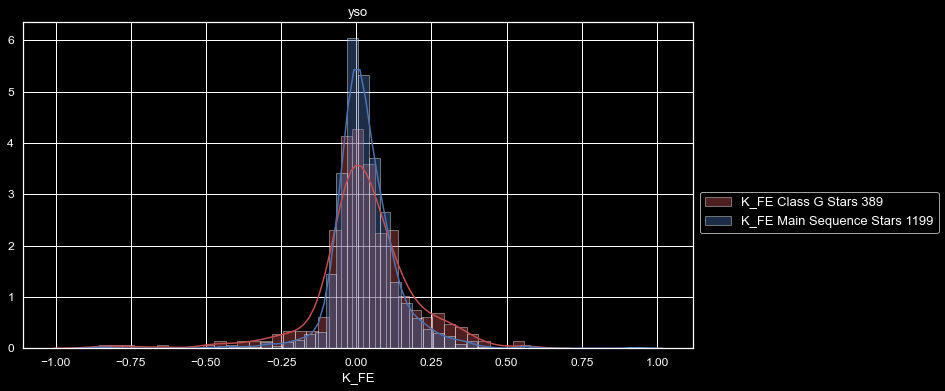


Class G K_FE
count    389.000000
mean       0.013619
std        0.221882
min       -1.932530
25%       -0.037331
50%        0.018178
75%        0.103313
max        0.559117
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


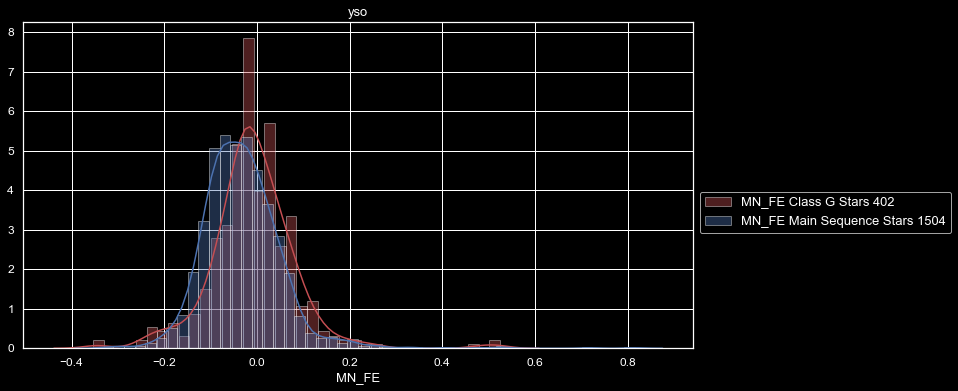


Class G MN_FE
count    402.000000
mean      -0.008821
std        0.093503
min       -0.353586
25%       -0.052122
50%       -0.015141
75%        0.035192
max        0.524284
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


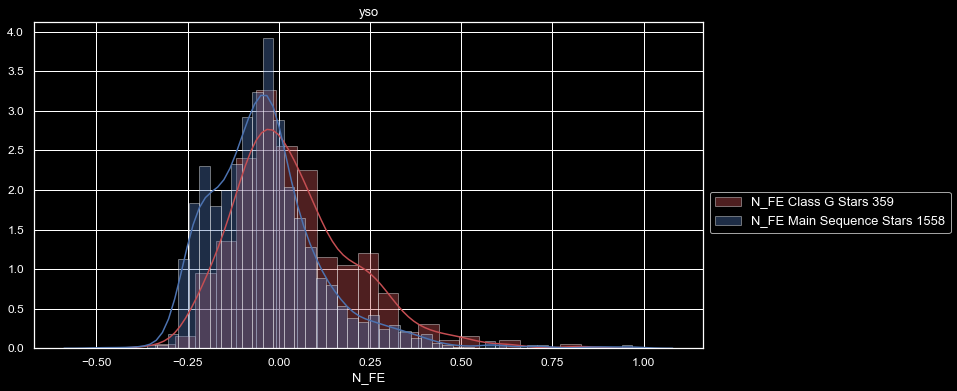


Class G N_FE
count    359.000000
mean       0.040424
std        0.166737
min       -0.340059
25%       -0.074717
50%        0.007253
75%        0.122918
max        0.827143
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


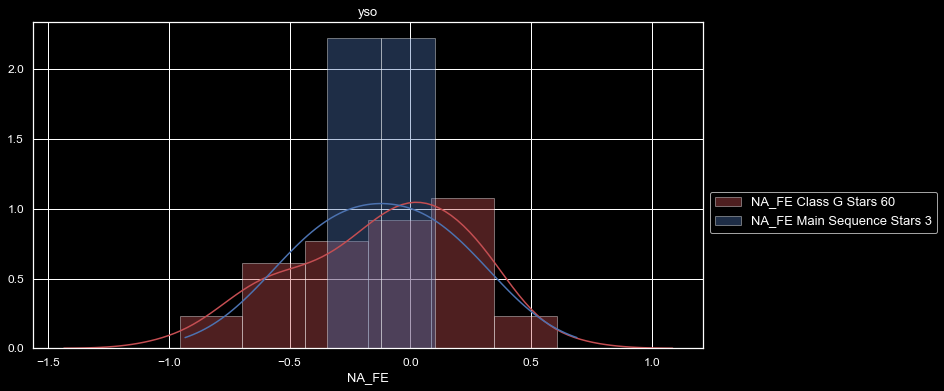


Class G NA_FE
count    60.000000
mean     -0.347443
std       0.627605
min      -2.157501
25%      -0.642647
50%      -0.185644
75%       0.096694
max       0.606536
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


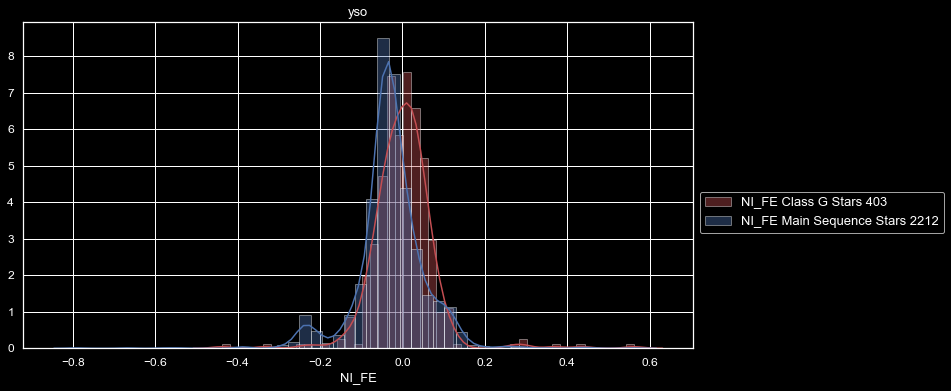


Class G NI_FE
count    403.000000
mean       0.002038
std        0.076800
min       -0.438260
25%       -0.035929
50%        0.002851
75%        0.036658
max        0.562219
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


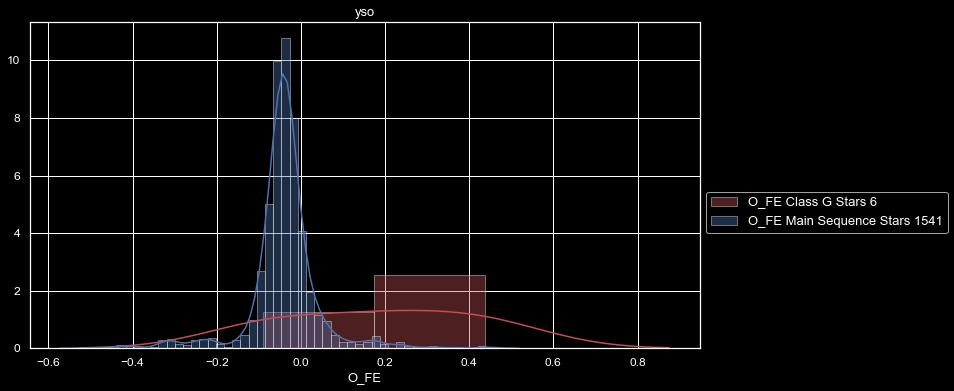


Class G O_FE
count    6.000000
mean     0.187533
std      0.228556
min     -0.089528
25%      0.003978
50%      0.197583
75%      0.381201
max      0.437710
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


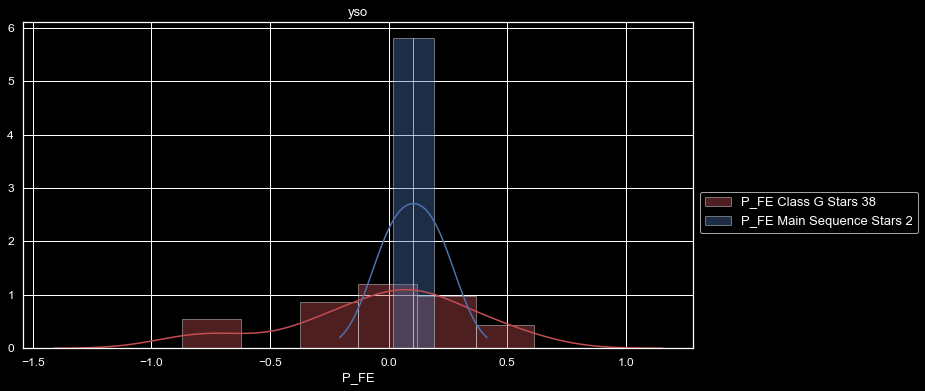


Class G P_FE
count    38.000000
mean     -0.070344
std       0.437334
min      -1.457593
25%      -0.257141
50%       0.030505
75%       0.185272
max       0.614594
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


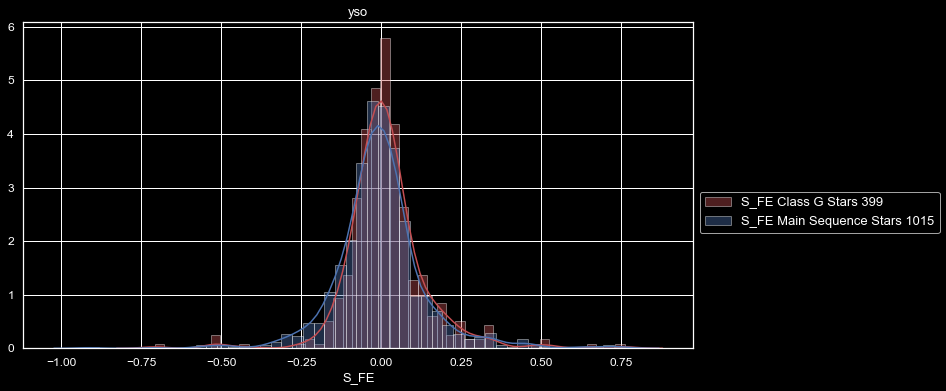


Class G S_FE
count    399.000000
mean       0.015573
std        0.131194
min       -0.708164
25%       -0.041919
50%        0.003550
75%        0.059159
max        0.761513
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


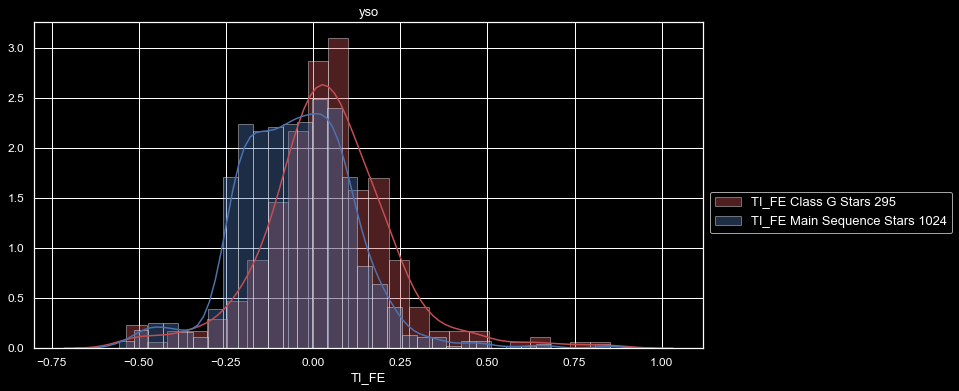


Class G TI_FE
count    295.000000
mean       0.041492
std        0.186259
min       -0.535779
25%       -0.053255
50%        0.037124
75%        0.139858
max        0.852863
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


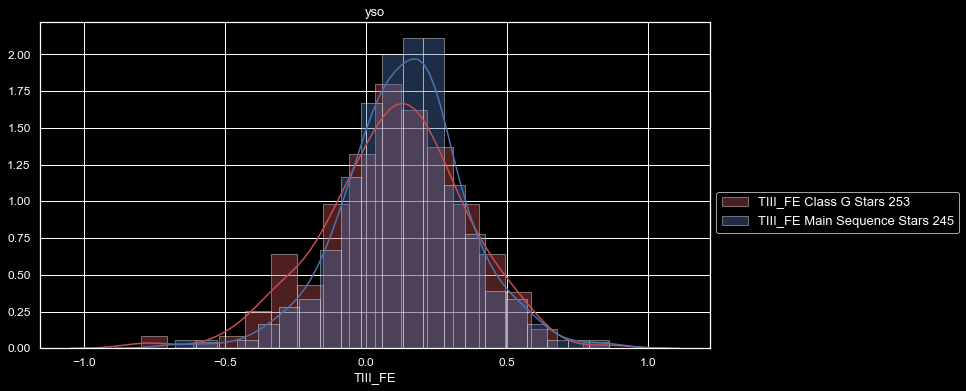


Class G TIII_FE
count    253.000000
mean       0.100653
std        0.250677
min       -0.799337
25%       -0.051815
50%        0.113381
75%        0.246596
max        0.864614
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


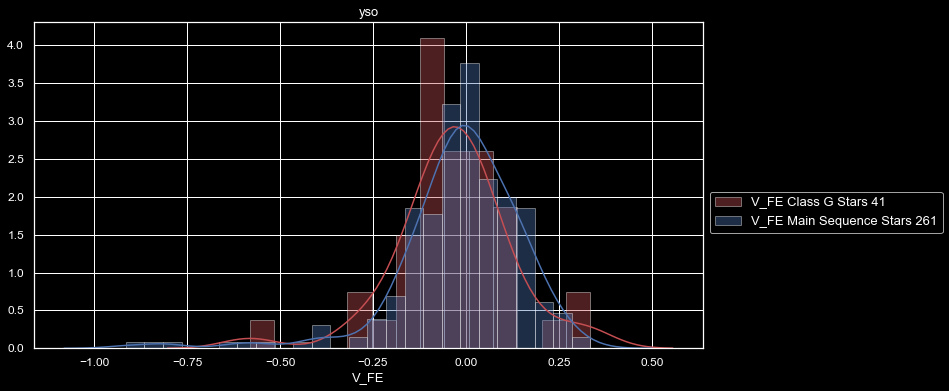


Class G V_FE
count    41.000000
mean     -0.034804
std       0.157168
min      -0.581160
25%      -0.089630
50%      -0.018688
75%       0.030132
max       0.334969
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


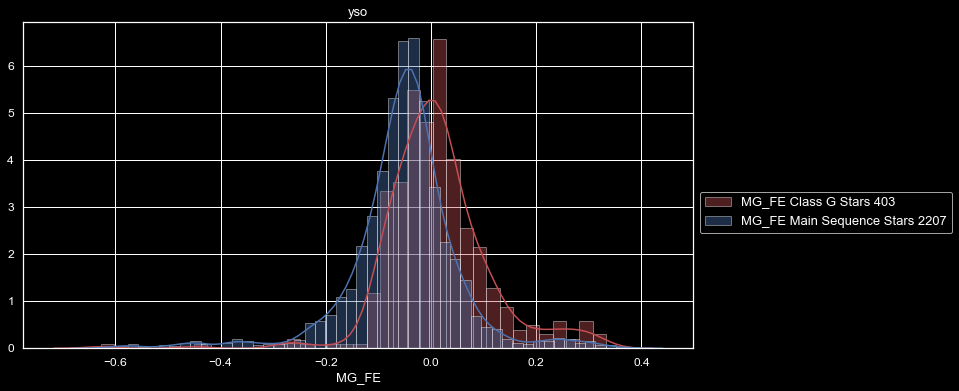


Class G MG_FE
count    403.000000
mean       0.012243
std        0.099132
min       -0.627258
25%       -0.042264
50%        0.006519
75%        0.052265
max        0.332164
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


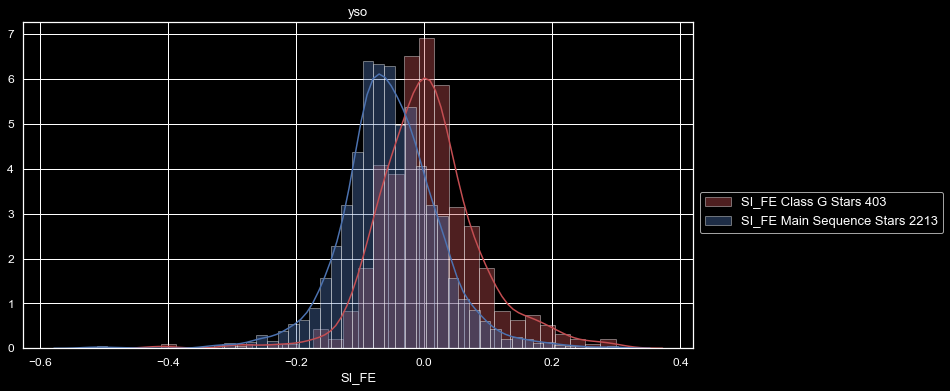


Class G SI_FE
count    403.000000
mean       0.005887
std        0.081268
min       -0.410628
25%       -0.044204
50%        0.000642
75%        0.043894
max        0.298912
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


13 seconds elapsed


In [41]:
Detail_View(field_list, df_class_G, "Class G", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


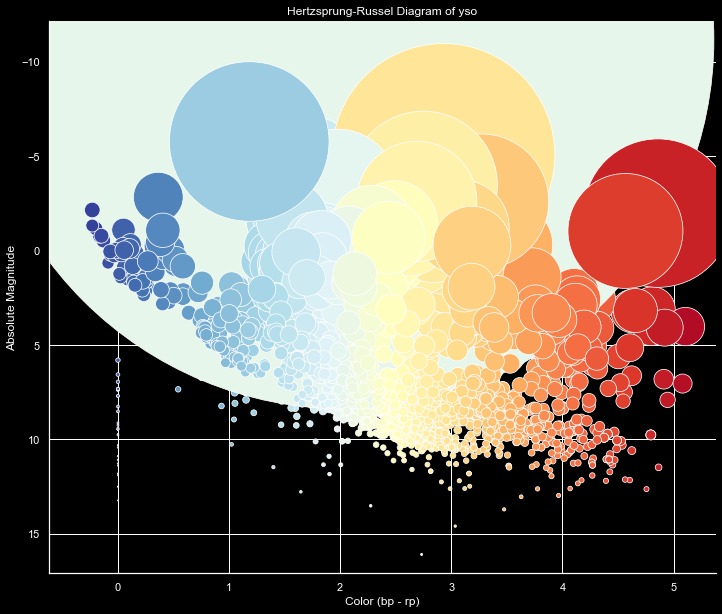

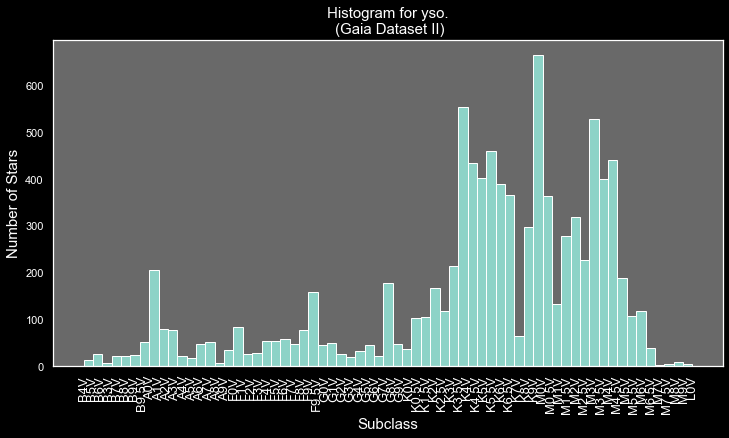

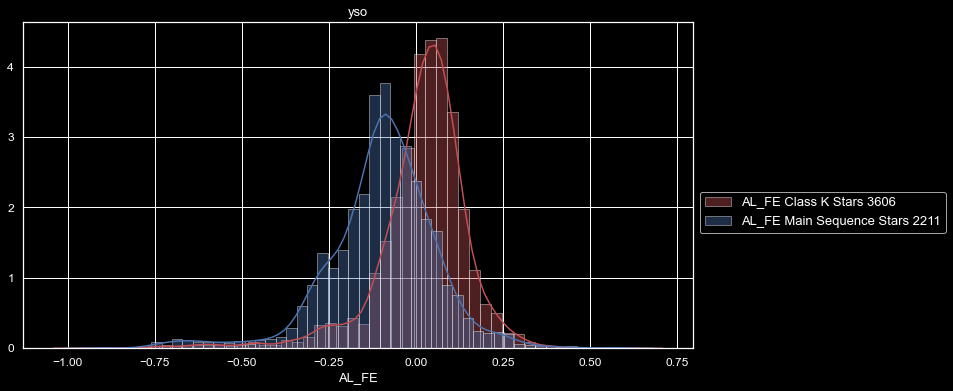


Class K AL_FE
count    3606.000000
mean        0.015476
std         0.137469
min        -0.959601
25%        -0.034331
50%         0.034713
75%         0.091066
max         0.627639
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


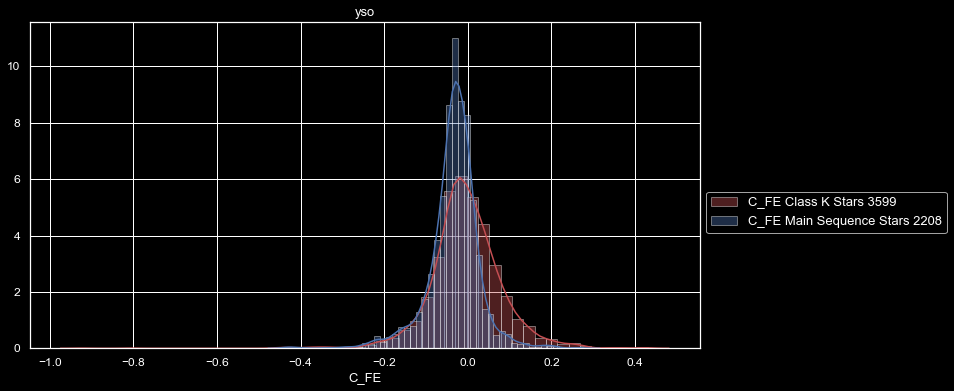


Class K C_FE
count    3599.000000
mean       -0.004017
std         0.086879
min        -0.924110
25%        -0.046776
50%        -0.007371
75%         0.041047
max         0.430970
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


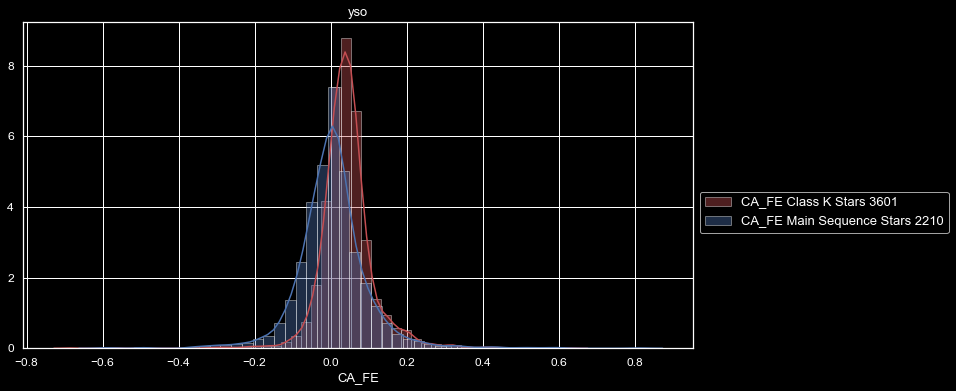


Class K CA_FE
count    3601.000000
mean        0.043427
std         0.073078
min        -0.685462
25%         0.008401
50%         0.039011
75%         0.069624
max         0.634188
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


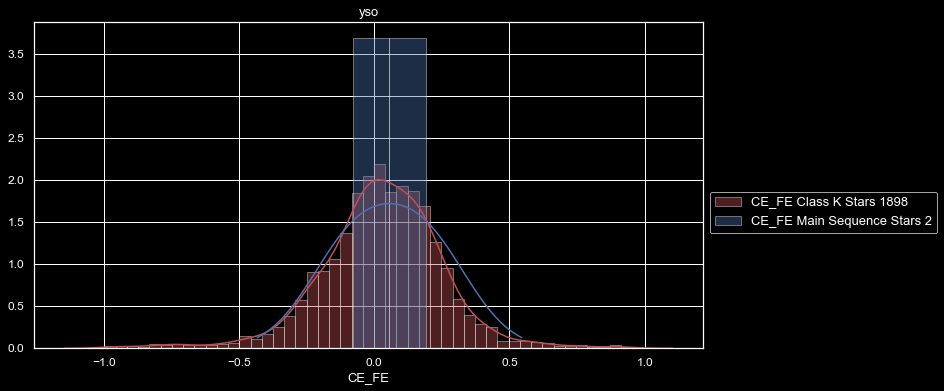


Class K CE_FE
count    1898.000000
mean        0.021573
std         0.249515
min        -2.109195
25%        -0.095025
50%         0.031705
75%         0.164574
max         1.147795
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


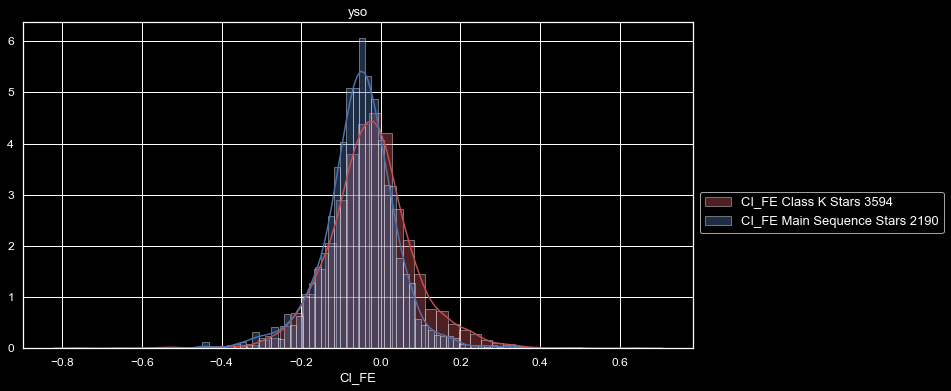


Class K CI_FE
count    3594.000000
mean       -0.026744
std         0.112016
min        -1.115030
25%        -0.088002
50%        -0.026687
75%         0.031895
max         0.644230
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


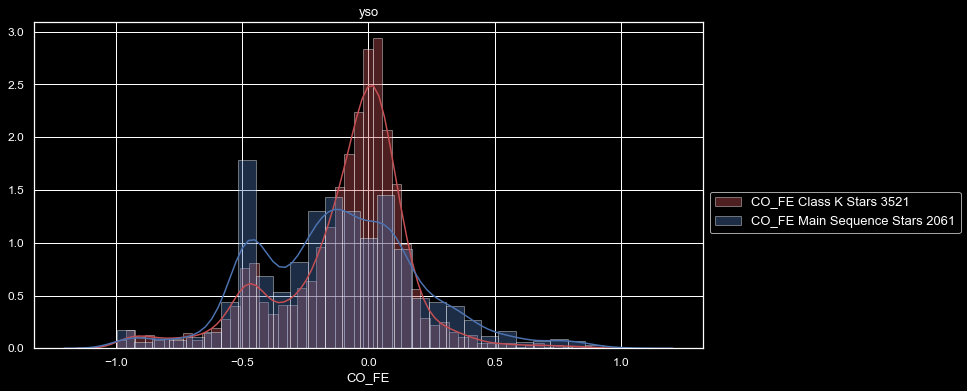


Class K CO_FE
count    3521.000000
mean       -0.108622
std         0.300003
min        -2.200718
25%        -0.206388
50%        -0.034807
75%         0.055008
max         1.255094
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


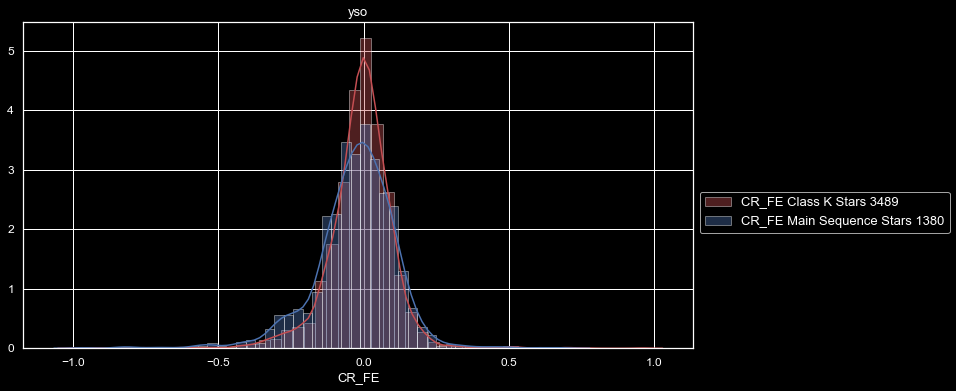


Class K CR_FE
count    3489.000000
mean       -0.012009
std         0.127534
min        -2.261637
25%        -0.060317
50%        -0.002804
75%         0.049108
max         0.960798
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


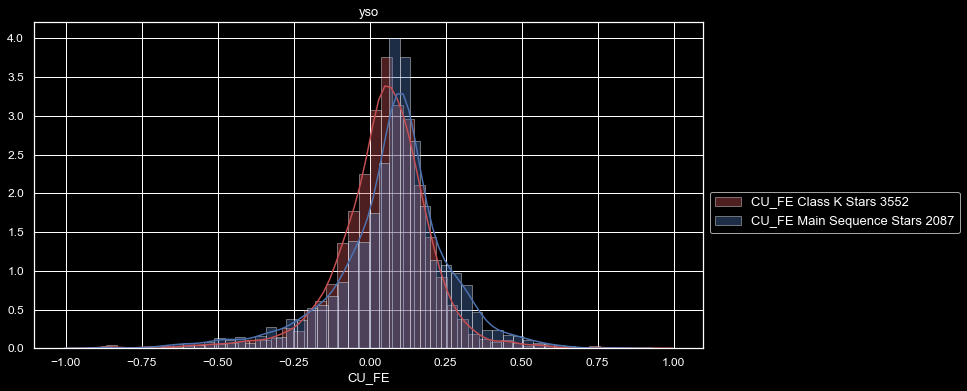


Class K CU_FE
count    3552.000000
mean        0.045637
std         0.166199
min        -1.395652
25%        -0.026067
50%         0.055583
75%         0.133330
max         1.460055
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


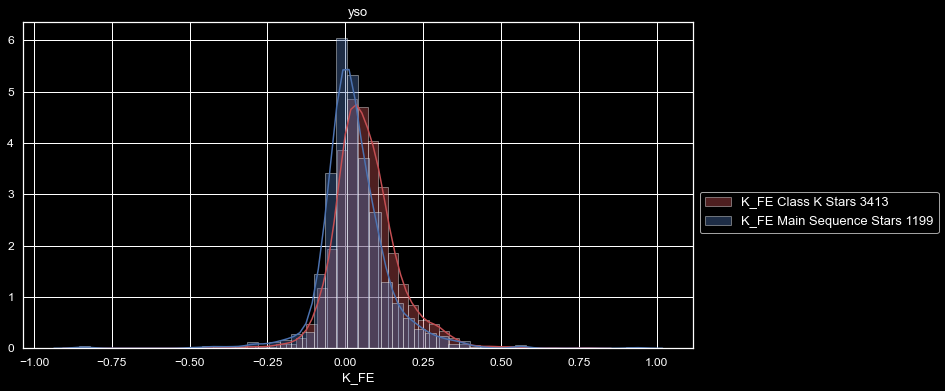


Class K K_FE
count    3413.000000
mean        0.064664
std         0.112983
min        -1.520935
25%         0.003665
50%         0.054721
75%         0.116395
max         0.791180
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


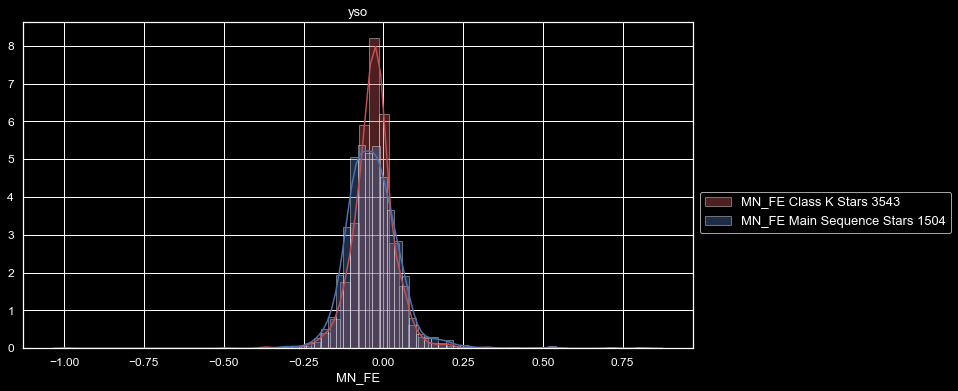


Class K MN_FE
count    3543.000000
mean       -0.031361
std         0.078759
min        -1.802076
25%        -0.064209
50%        -0.029236
75%         0.002331
max         0.537124
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


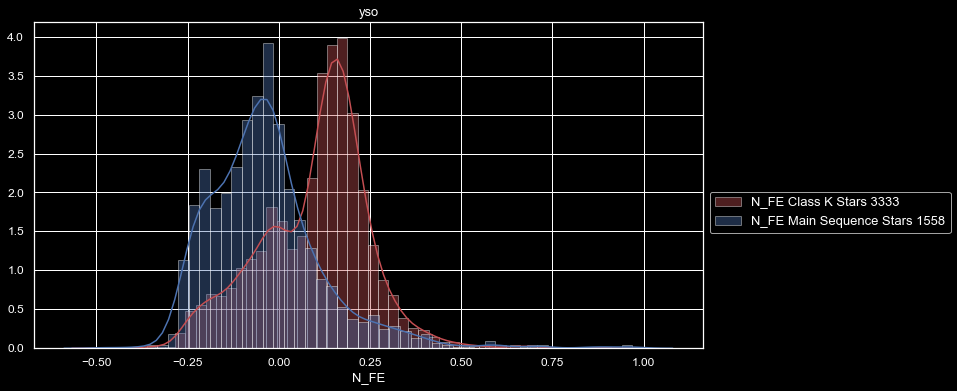


Class K N_FE
count    3333.000000
mean        0.099620
std         0.150297
min        -0.478297
25%        -0.000232
50%         0.127080
75%         0.191130
max         0.910263
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


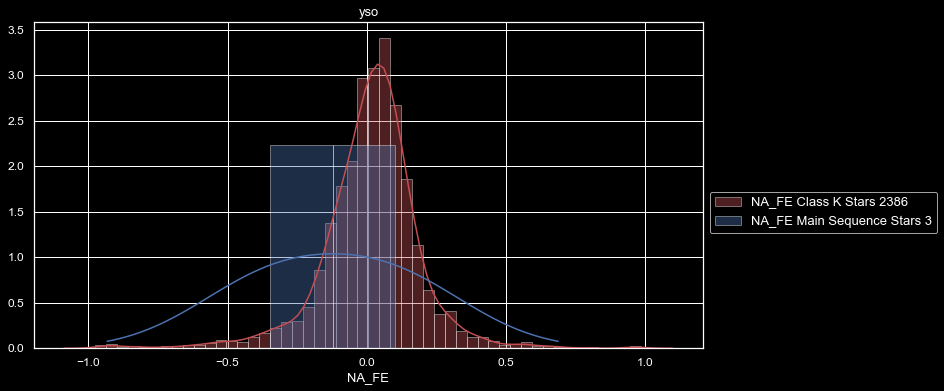


Class K NA_FE
count    2386.000000
mean        0.002378
std         0.226555
min        -2.213929
25%        -0.070314
50%         0.025321
75%         0.104086
max         1.191596
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


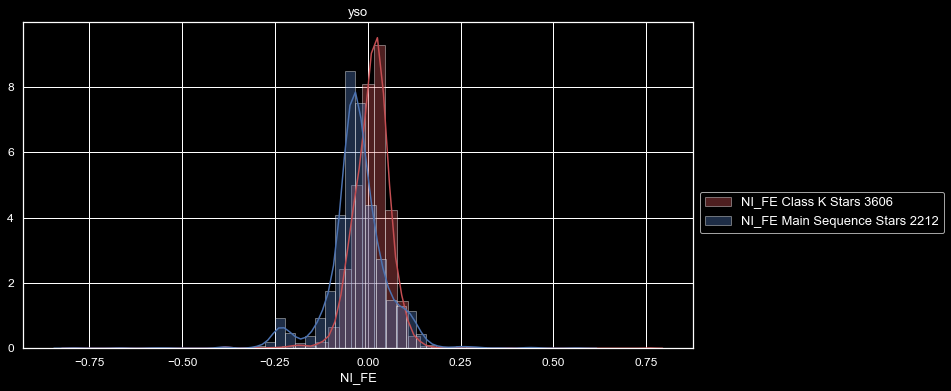


Class K NI_FE
count    3606.000000
mean        0.009849
std         0.059408
min        -1.070138
25%        -0.017144
50%         0.014577
75%         0.040816
max         0.761210
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


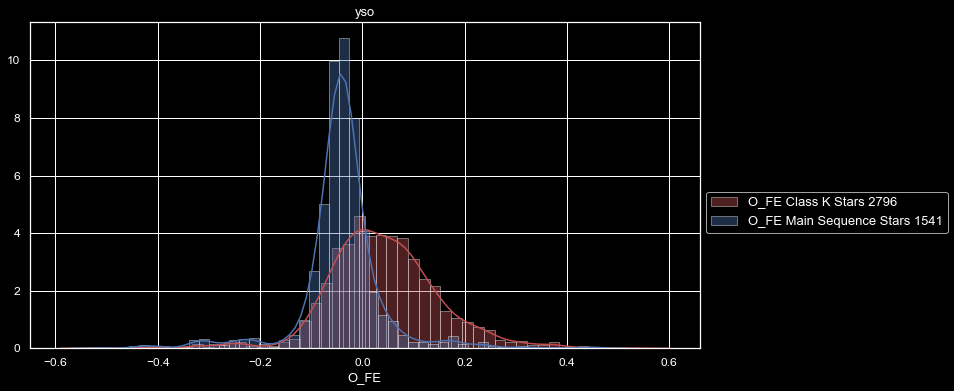


Class K O_FE
count    2796.000000
mean        0.040709
std         0.108296
min        -0.523855
25%        -0.026604
50%         0.034017
75%         0.100962
max         0.533085
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


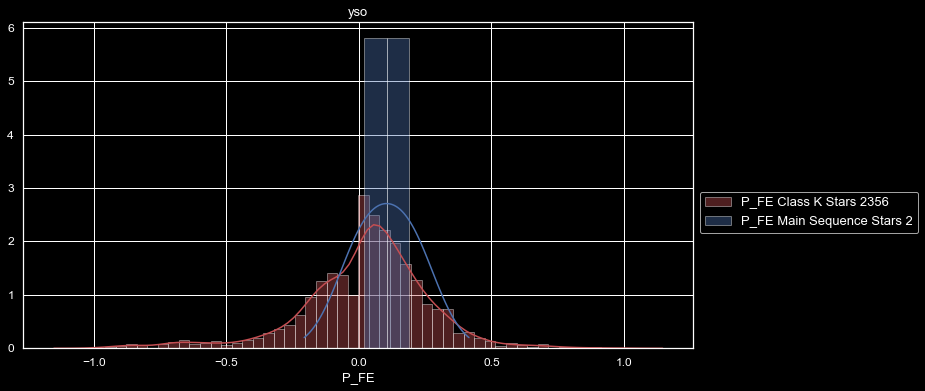


Class K P_FE
count    2356.000000
mean        0.009792
std         0.282534
min        -1.667653
25%        -0.101177
50%         0.043570
75%         0.160537
max         1.121477
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


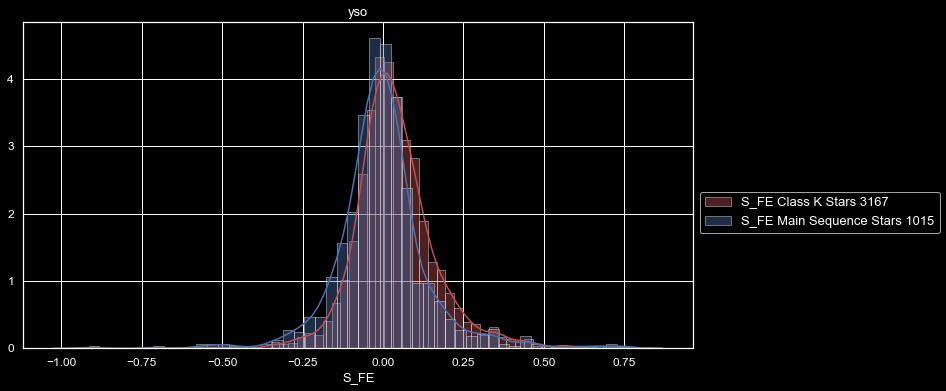


Class K S_FE
count    3167.000000
mean        0.038941
std         0.129759
min        -0.566904
25%        -0.034874
50%         0.025305
75%         0.098509
max         0.791196
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


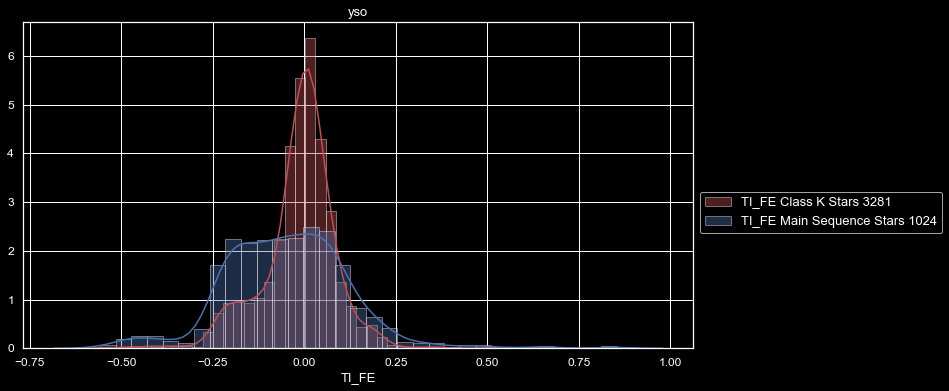


Class K TI_FE
count    3281.000000
mean       -0.012839
std         0.105537
min        -0.557876
25%        -0.052475
50%        -0.001162
75%         0.041908
max         0.843044
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


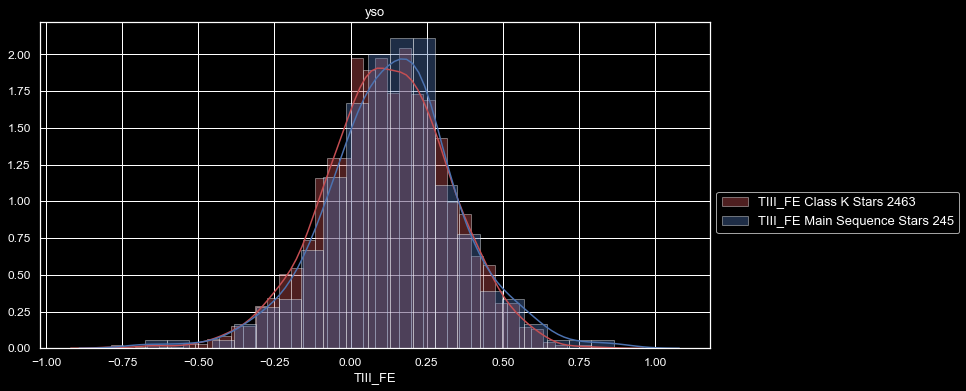


Class K TIII_FE
count    2463.000000
mean        0.118604
std         0.208529
min        -0.787852
25%        -0.012715
50%         0.121655
75%         0.256965
max         0.830563
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


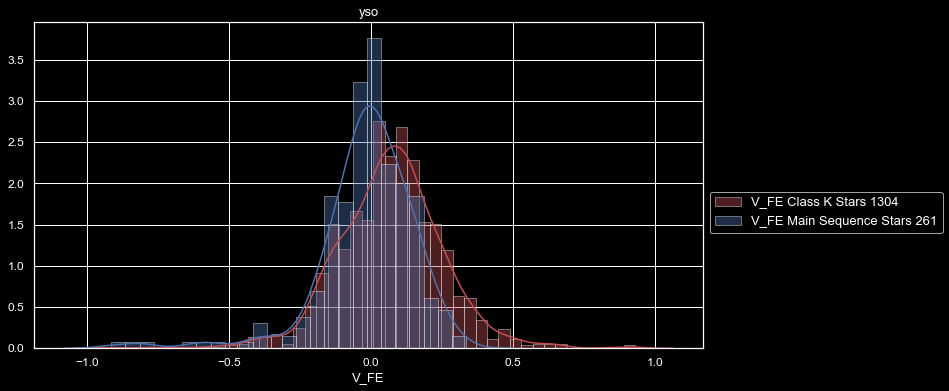


Class K V_FE
count    1304.000000
mean        0.067740
std         0.191250
min        -1.114210
25%        -0.046726
50%         0.069793
75%         0.176908
max         1.180643
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


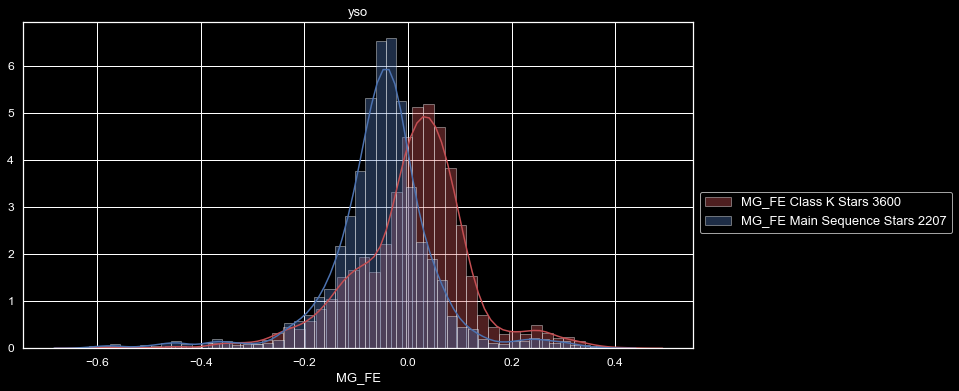


Class K MG_FE
count    3600.000000
mean        0.006935
std         0.114807
min        -0.615638
25%        -0.046591
50%         0.018908
75%         0.069579
max         0.424725
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


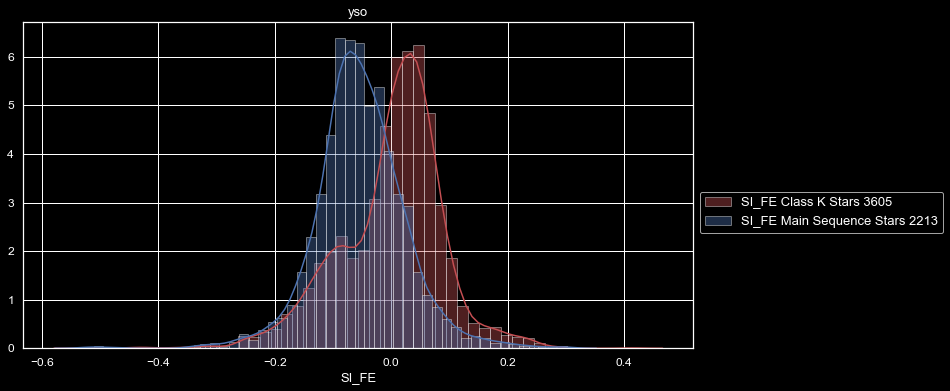


Class K SI_FE
count    3605.000000
mean        0.000952
std         0.089020
min        -0.527908
25%        -0.047060
50%         0.014271
75%         0.054690
max         0.414732
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


14 seconds elapsed


In [42]:
Detail_View(field_list, df_class_K, "Class K", main_sequence, "Main Sequence")


yso

Stars: 9258

main_sequence: 2433
turnoff: 1020
subgiants: 702
red_clump: 1227
red_clump_binary: 10
red_giants: 3872
red_giants_binary: 334

Class O: 0
Class B: 161
Class A: 532
Class F: 580
Class G: 459
Class K: 3832
Class M: 3227

BA: 352
Fd: 1090
GKd: 1511
GKg: 3640
Md: 2171
Mg: 458


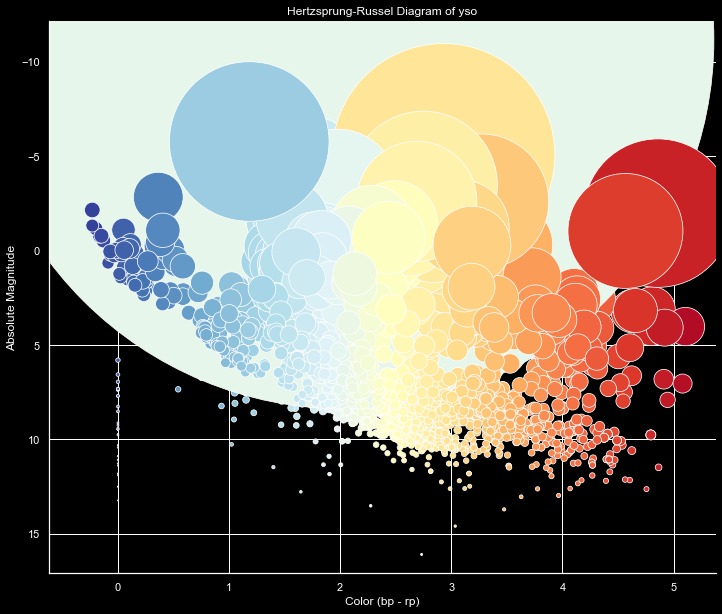

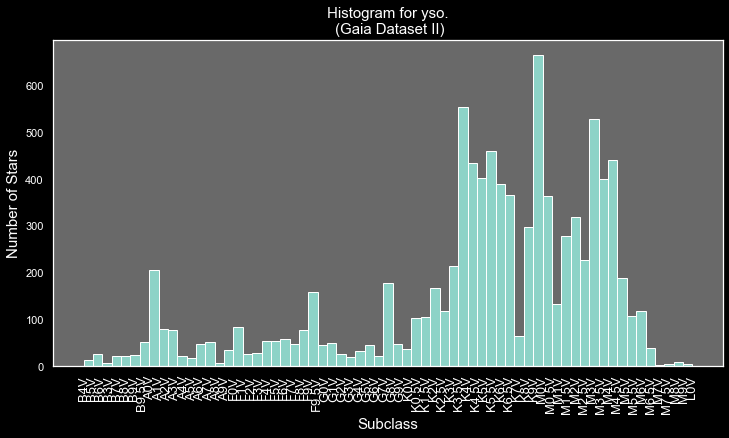

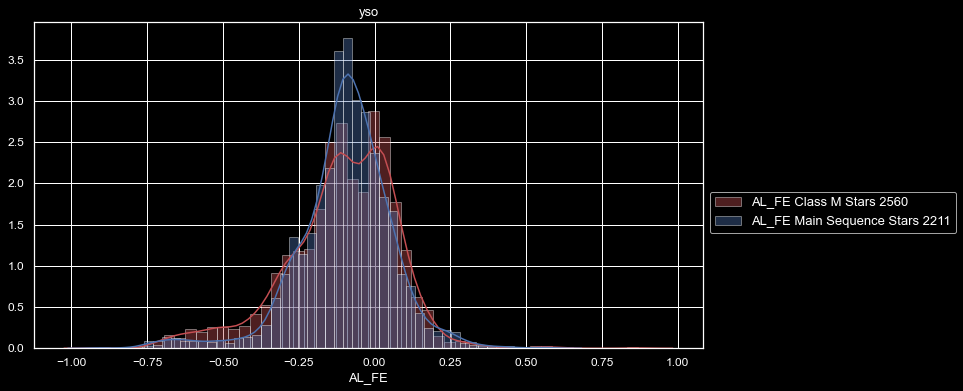


Class M AL_FE
count    2560.000000
mean       -0.109985
std         0.184441
min        -0.909311
25%        -0.206948
50%        -0.092767
75%         0.017234
max         0.868458
Name: AL_FE, dtype: float64

Main Sequence AL_FE
count    2211.000000
mean       -0.099216
std         0.160871
min        -1.031643
25%        -0.172394
50%        -0.088839
75%        -0.007806
max         0.580328
Name: AL_FE, dtype: float64


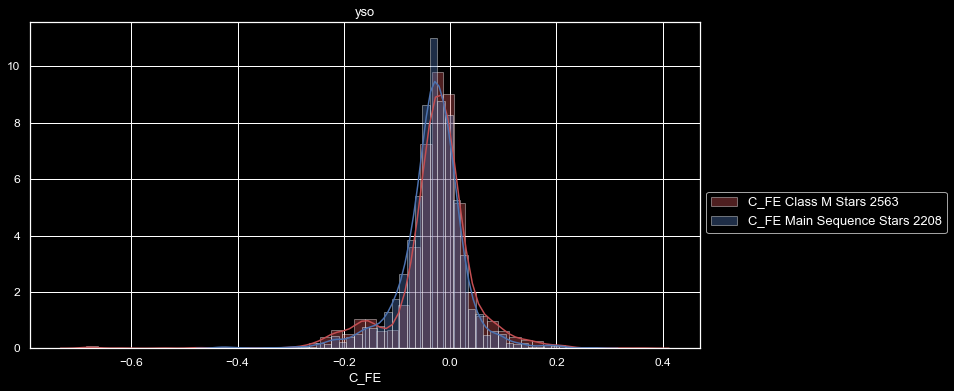


Class M C_FE
count    2563.000000
mean       -0.029743
std         0.078537
min        -0.684500
25%        -0.050485
50%        -0.022412
75%         0.004488
max         0.362910
Name: C_FE, dtype: float64

Main Sequence C_FE
count    2208.000000
mean       -0.033892
std         0.062617
min        -0.437756
25%        -0.058177
50%        -0.029287
75%        -0.001992
max         0.275425
Name: C_FE, dtype: float64


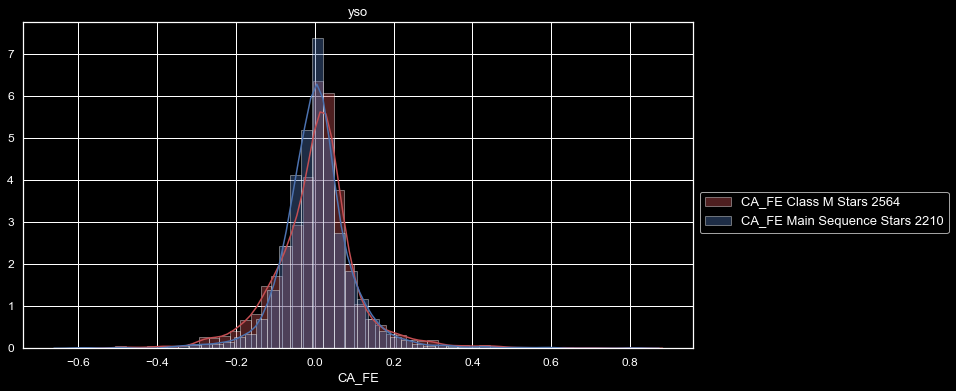


Class M CA_FE
count    2564.000000
mean        0.003192
std         0.111956
min        -0.506042
25%        -0.049803
50%         0.009127
75%         0.049771
max         0.812698
Name: CA_FE, dtype: float64

Main Sequence CA_FE
count    2210.000000
mean        0.004742
std         0.095263
min        -0.600964
25%        -0.041494
50%         0.003155
75%         0.042695
max         0.812698
Name: CA_FE, dtype: float64


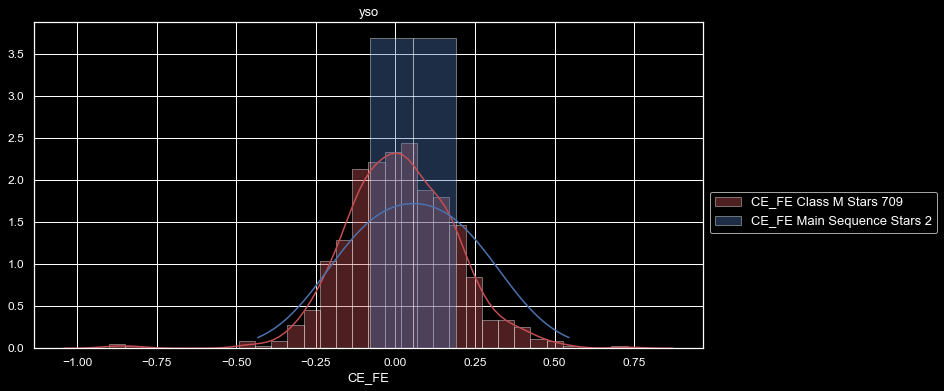


Class M CE_FE
count    709.000000
mean       0.004782
std        0.227423
min       -1.666905
25%       -0.100274
50%        0.010095
75%        0.129309
max        1.211085
Name: CE_FE, dtype: float64

Main Sequence CE_FE
count    2.000000
mean     0.056245
std      0.191442
min     -0.079125
25%     -0.011440
50%      0.056245
75%      0.123930
max      0.191615
Name: CE_FE, dtype: float64


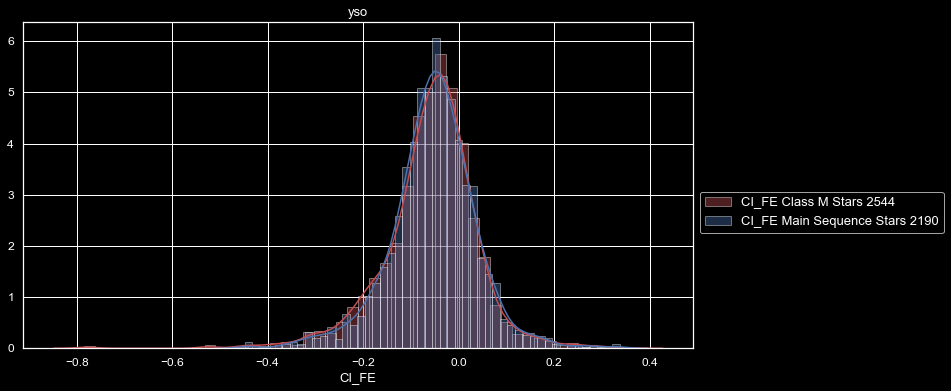


Class M CI_FE
count    2544.000000
mean       -0.059410
std         0.099983
min        -0.785220
25%        -0.104762
50%        -0.048915
75%        -0.003103
max         0.364760
Name: CI_FE, dtype: float64

Main Sequence CI_FE
count    2190.000000
mean       -0.053509
std         0.090300
min        -0.448308
25%        -0.100912
50%        -0.049741
75%        -0.001668
max         0.337822
Name: CI_FE, dtype: float64


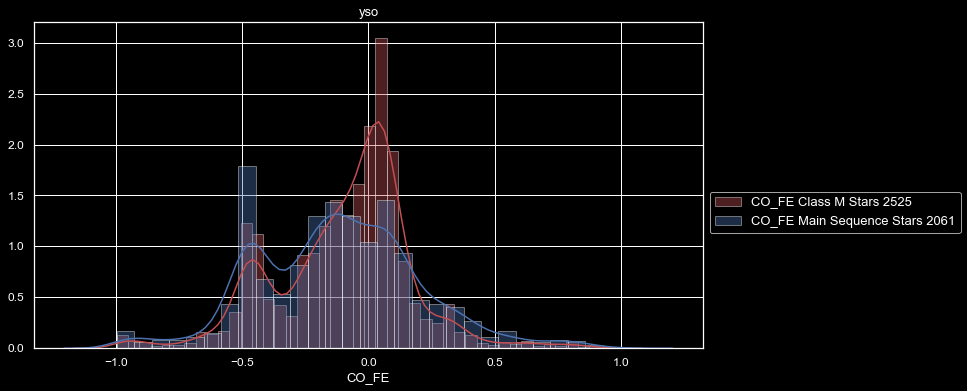


Class M CO_FE
count    2525.000000
mean       -0.109821
std         0.307759
min        -2.103379
25%        -0.253646
50%        -0.048146
75%         0.059934
max         1.160154
Name: CO_FE, dtype: float64

Main Sequence CO_FE
count    2061.000000
mean       -0.135771
std         0.355049
min        -2.172064
25%        -0.385608
50%        -0.123516
75%         0.078874
max         1.180434
Name: CO_FE, dtype: float64


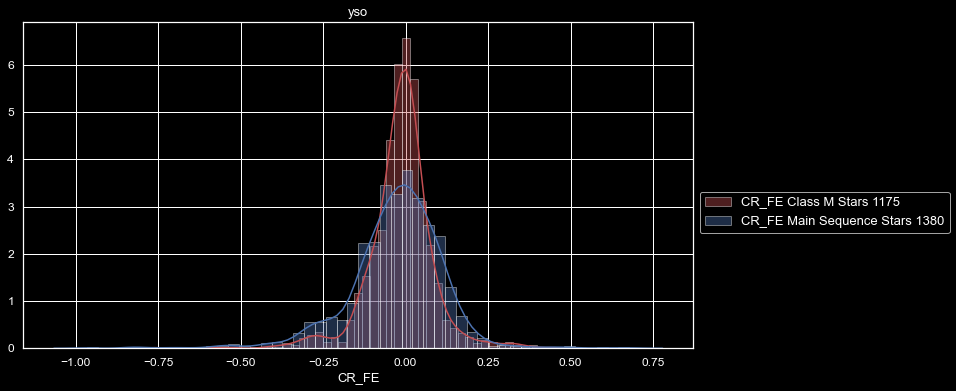


Class M CR_FE
count    1175.000000
mean       -0.014980
std         0.100156
min        -0.757132
25%        -0.055077
50%        -0.008402
75%         0.030909
max         0.446088
Name: CR_FE, dtype: float64

Main Sequence CR_FE
count    1380.000000
mean       -0.030777
std         0.155367
min        -2.001017
25%        -0.095758
50%        -0.016674
75%         0.056382
max         0.678043
Name: CR_FE, dtype: float64


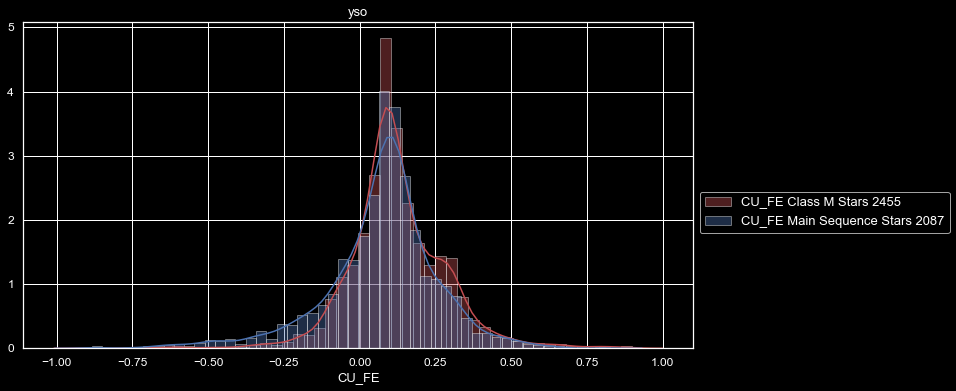


Class M CU_FE
count    2455.000000
mean        0.122845
std         0.167927
min        -1.100494
25%         0.042874
50%         0.104542
75%         0.206538
max         1.236275
Name: CU_FE, dtype: float64

Main Sequence CU_FE
count    2087.000000
mean        0.074393
std         0.192598
min        -0.883985
25%        -0.005114
50%         0.091594
75%         0.167810
max         1.460055
Name: CU_FE, dtype: float64


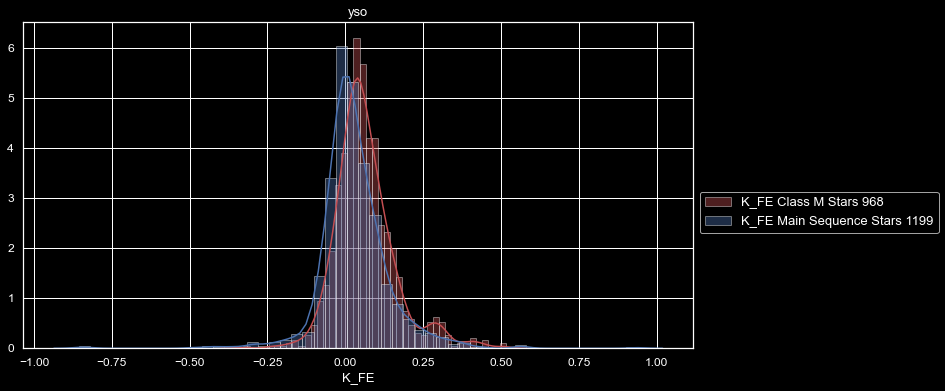


Class M K_FE
count    968.000000
mean       0.064199
std        0.097561
min       -0.327030
25%        0.006898
50%        0.050045
75%        0.104828
max        0.516870
Name: K_FE, dtype: float64

Main Sequence K_FE
count    1199.000000
mean        0.023020
std         0.142049
min        -1.770165
25%        -0.023747
50%         0.015384
75%         0.074025
max         0.937845
Name: K_FE, dtype: float64


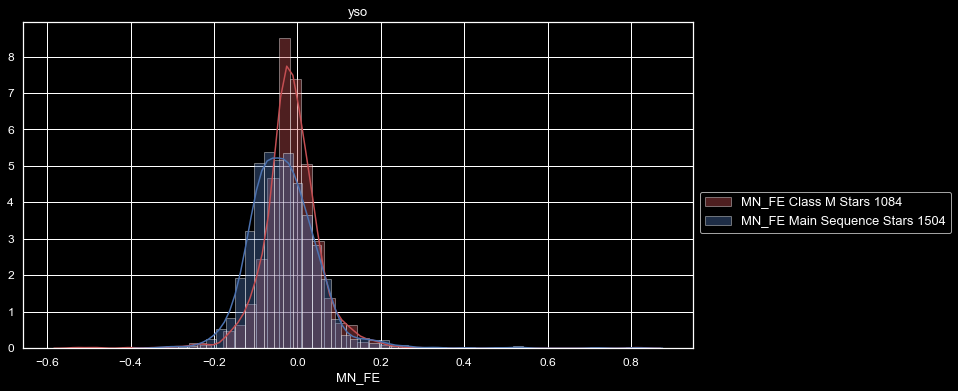


Class M MN_FE
count    1084.000000
mean       -0.014081
std         0.080183
min        -0.528916
25%        -0.047119
50%        -0.017421
75%         0.020169
max         1.015414
Name: MN_FE, dtype: float64

Main Sequence MN_FE
count    1504.000000
mean       -0.031798
std         0.090285
min        -0.332876
25%        -0.085497
50%        -0.037994
75%         0.011977
max         1.015414
Name: MN_FE, dtype: float64


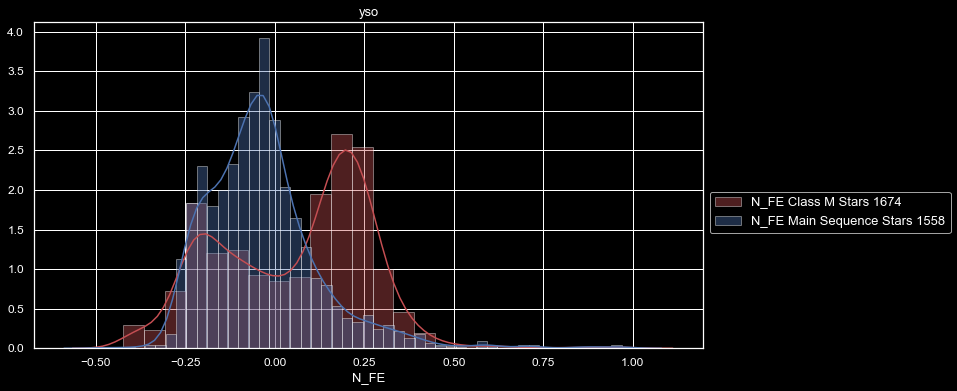


Class M N_FE
count    1674.000000
mean        0.056358
std         0.209272
min        -0.423127
25%        -0.132226
50%         0.118846
75%         0.217170
max         0.969393
Name: N_FE, dtype: float64

Main Sequence N_FE
count    1558.000000
mean       -0.035422
std         0.160334
min        -0.478297
25%        -0.140467
50%        -0.049765
75%         0.029142
max         0.969393
Name: N_FE, dtype: float64


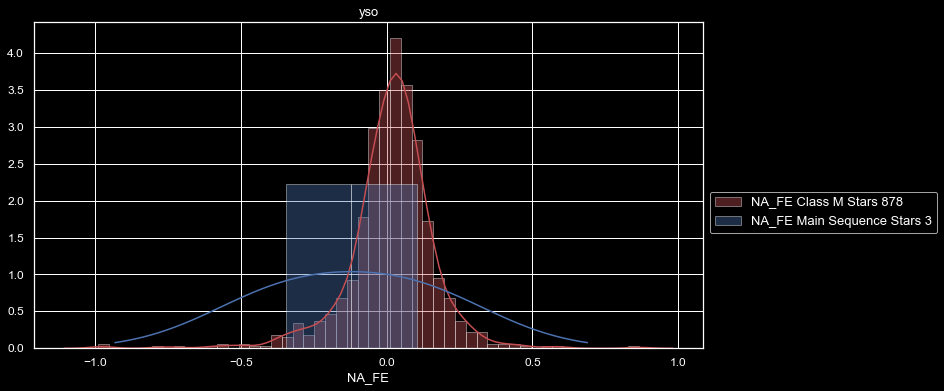


Class M NA_FE
count    878.000000
mean       0.013122
std        0.160914
min       -1.698724
25%       -0.048311
50%        0.025251
75%        0.092336
max        0.865376
Name: NA_FE, dtype: float64

Main Sequence NA_FE
count    3.000000
mean    -0.478651
std      0.657189
min     -1.191854
25%     -0.769204
50%     -0.346554
75%     -0.122049
max      0.102456
Name: NA_FE, dtype: float64


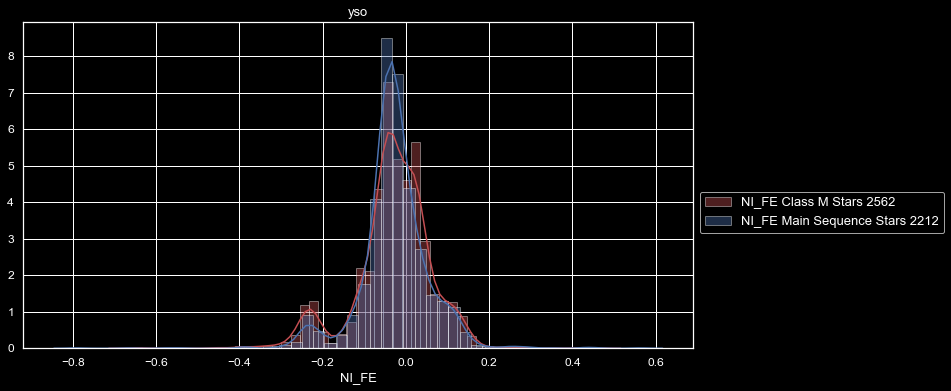


Class M NI_FE
count    2562.000000
mean       -0.030863
std         0.093652
min        -0.655070
25%        -0.064727
50%        -0.026908
75%         0.023321
max         0.457730
Name: NI_FE, dtype: float64

Main Sequence NI_FE
count    2212.000000
mean       -0.028667
std         0.084754
min        -0.791070
25%        -0.059571
50%        -0.030624
75%         0.008046
max         0.562219
Name: NI_FE, dtype: float64


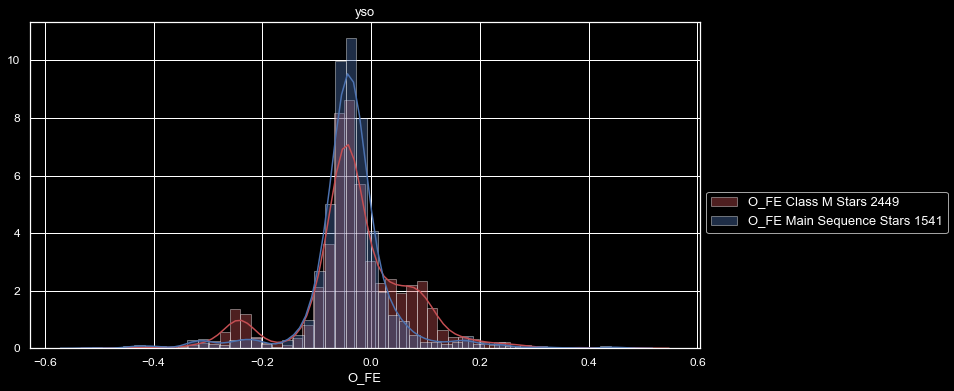


Class M O_FE
count    2449.000000
mean       -0.028567
std         0.102026
min        -0.469400
25%        -0.064324
50%        -0.036773
75%         0.024584
max         0.483645
Name: O_FE, dtype: float64

Main Sequence O_FE
count    1541.000000
mean       -0.040294
std         0.082973
min        -0.514200
25%        -0.062810
50%        -0.040441
75%        -0.014526
max         0.460205
Name: O_FE, dtype: float64


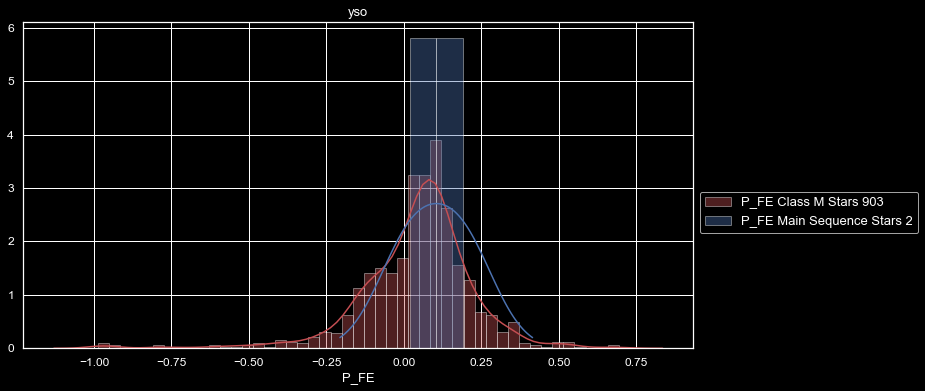


Class M P_FE
count    903.000000
mean       0.031840
std        0.222505
min       -2.073038
25%       -0.046249
50%        0.063121
75%        0.131172
max        0.693530
Name: P_FE, dtype: float64

Main Sequence P_FE
count    2.000000
mean     0.104467
std      0.121665
min      0.018437
25%      0.061452
50%      0.104467
75%      0.147482
max      0.190497
Name: P_FE, dtype: float64


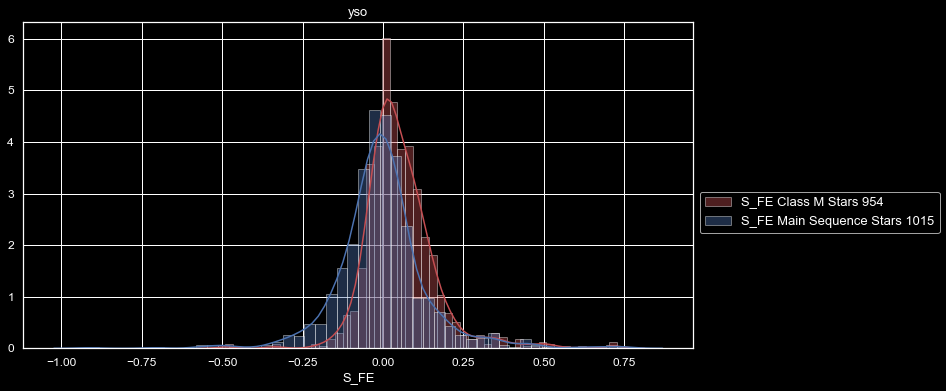


Class M S_FE
count    954.000000
mean       0.054219
std        0.113118
min       -0.491394
25%       -0.009151
50%        0.036953
75%        0.099876
max        0.727176
Name: S_FE, dtype: float64

Main Sequence S_FE
count    1015.000000
mean       -0.003112
std         0.143407
min        -0.915306
25%        -0.068476
50%        -0.007791
75%         0.051640
max         0.761513
Name: S_FE, dtype: float64


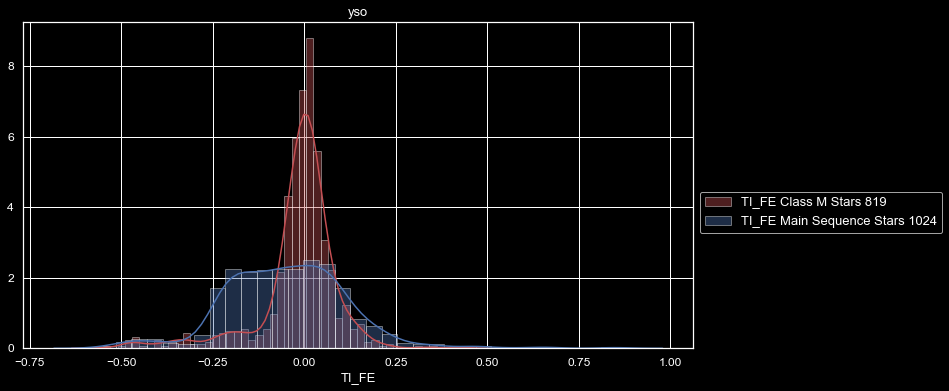


Class M TI_FE
count    819.000000
mean      -0.015956
std        0.109257
min       -0.549696
25%       -0.035785
50%        0.001801
75%        0.032724
max        0.441333
Name: TI_FE, dtype: float64

Main Sequence TI_FE
count    1024.000000
mean       -0.048980
std         0.167992
min        -0.557876
25%        -0.164316
50%        -0.051128
75%         0.055723
max         0.852863
Name: TI_FE, dtype: float64


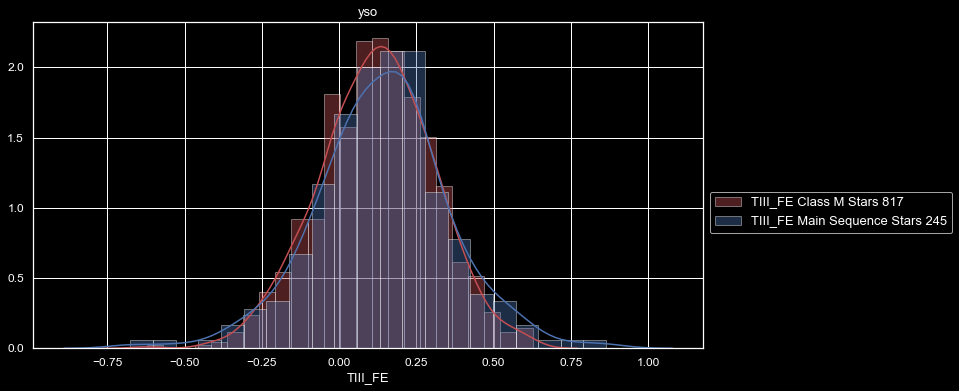


Class M TIII_FE
count    817.000000
mean       0.120594
std        0.184798
min       -0.622665
25%       -0.001065
50%        0.126376
75%        0.246145
max        0.626225
Name: TIII_FE, dtype: float64

Main Sequence TIII_FE
count    245.000000
mean       0.138959
std        0.215980
min       -0.675865
25%        0.017993
50%        0.150740
75%        0.254060
max        0.864614
Name: TIII_FE, dtype: float64


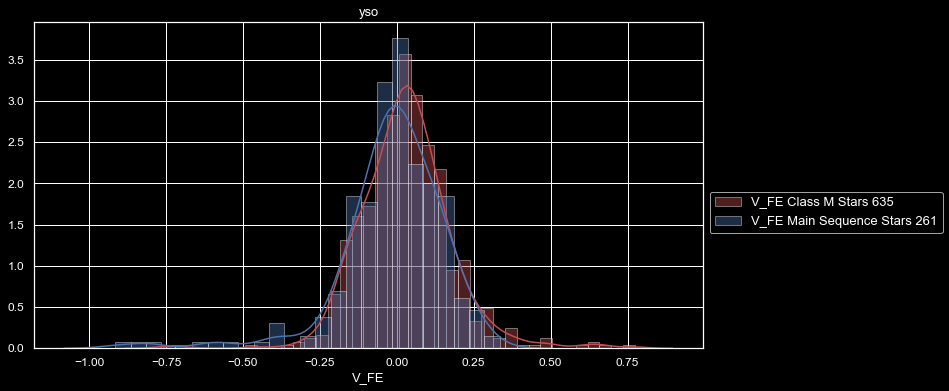


Class M V_FE
count    635.000000
mean       0.029355
std        0.149166
min       -0.760237
25%       -0.057842
50%        0.029939
75%        0.108854
max        0.773963
Name: V_FE, dtype: float64

Main Sequence V_FE
count    261.000000
mean      -0.018582
std        0.182011
min       -1.114210
25%       -0.077630
50%       -0.000450
75%        0.086034
max        0.334969
Name: V_FE, dtype: float64


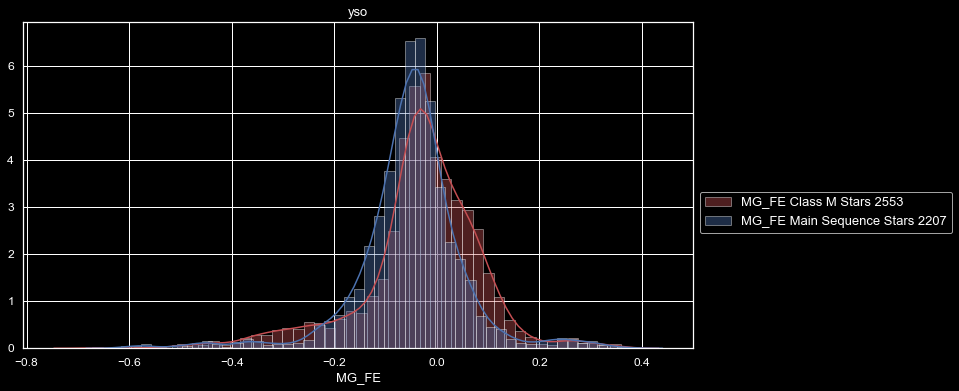


Class M MG_FE
count    2553.000000
mean       -0.031519
std         0.119584
min        -0.671929
25%        -0.070792
50%        -0.023924
75%         0.037116
max         0.358152
Name: MG_FE, dtype: float64

Main Sequence MG_FE
count    2207.000000
mean       -0.051647
std         0.106323
min        -0.615638
25%        -0.092431
50%        -0.046012
75%        -0.006115
max         0.371781
Name: MG_FE, dtype: float64


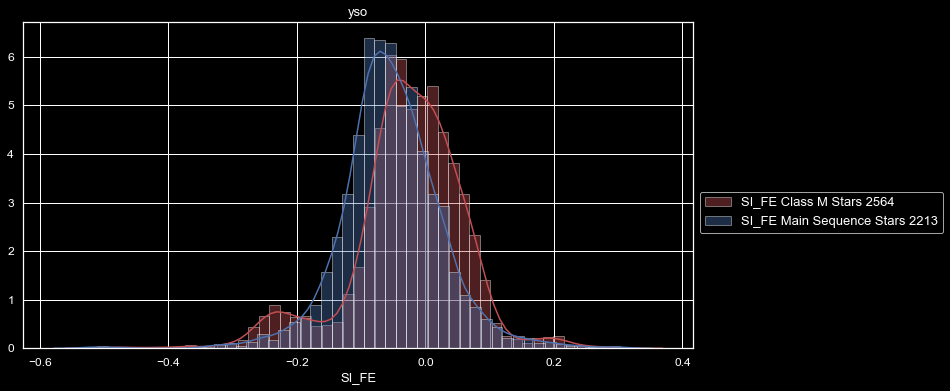


Class M SI_FE
count    2564.000000
mean       -0.028512
std         0.088803
min        -0.504708
25%        -0.066161
50%        -0.022596
75%         0.026432
max         0.313642
Name: SI_FE, dtype: float64

Main Sequence SI_FE
count    2213.000000
mean       -0.053079
std         0.078145
min        -0.527908
25%        -0.095612
50%        -0.055973
75%        -0.009675
max         0.302517
Name: SI_FE, dtype: float64


14 seconds elapsed


In [43]:
Detail_View(field_list, df_class_M, "Class M", main_sequence, "Main Sequence")